In [ ]:
import pandas as pd
import numpy as np

def preprocess(df_train, df_test):
	# Bước 1: Nối hai bảng train và test
	df_train['dataset'] = 'train'
	df_test['dataset'] = 'test'
	df_combined = pd.concat([df_train, df_test], axis=0)

	# Bước 2: Lọc bỏ các ngày đóng cửa
	df_combined = df_combined.dropna(subset=['high', 'low'], how='all')

	# Bước 3: Tạo cột target
	df_combined['target'] = (df_combined['high'] + df_combined['low']) / 2

	# Bước 4: Trích xuất và mã hóa chu kỳ cho các đặc trưng thời gian
	df_combined['datetime'] = pd.to_datetime(df_combined['time'])

	# Mã hóa chu kỳ cho tháng (1-12)
	df_combined['month'] = df_combined['datetime'].dt.month
	df_combined['month_sin'] = np.sin(2 * np.pi * df_combined['month'] / 12)
	df_combined['month_cos'] = np.cos(2 * np.pi * df_combined['month'] / 12)

	# Mã hóa chu kỳ cho ngày trong tuần (0-6)
	df_combined['day_of_week'] = df_combined['datetime'].dt.dayofweek
	df_combined['dow_sin'] = np.sin(2 * np.pi * df_combined['day_of_week'] / 7)
	df_combined['dow_cos'] = np.cos(2 * np.pi * df_combined['day_of_week'] / 7)

	# Mã hóa chu kỳ cho ngày trong tháng (1-31)
	df_combined['day'] = df_combined['datetime'].dt.day
	df_combined['day_sin'] = np.sin(2 * np.pi * df_combined['day'] / 31)
	df_combined['day_cos'] = np.cos(2 * np.pi * df_combined['day'] / 31)

	# Mã hóa chu kỳ cho ngày trong năm (1-366)
	df_combined['day_of_year'] = df_combined['datetime'].dt.dayofyear
	df_combined['doy_sin'] = np.sin(2 * np.pi * df_combined['day_of_year'] / 366)
	df_combined['doy_cos'] = np.cos(2 * np.pi * df_combined['day_of_year'] / 366)

	# Bước 5: Đặt time làm index
	df_combined = df_combined.set_index('time')
	df_combined.drop(['datetime', 'month', 'day_of_week', 'day', 'day_of_year'], axis=1, inplace=True)

	# Bước 6: Tạo nhiều đặc trưng lag hơn cho target
	lag_values = [1, 2, 3, 5, 7, 10, 14, 21, 30, 45, 60, 90]
	for lag in lag_values:
		df_combined[f'target_lag_{lag}'] = df_combined['target'].shift(lag)

	# Bước 7: Tạo các đặc trưng thống kê từ giá trị lag
	# Trung bình động cho nhiều khoảng thời gian
	window_sizes = [5, 10, 20, 30, 60]
	for window in window_sizes:
		# Trung bình động
		df_combined[f'target_ma_{window}'] = df_combined['target'].rolling(window=window, min_periods=1).mean()
		
		# Độ lệch chuẩn động
		df_combined[f'target_std_{window}'] = df_combined['target'].rolling(window=window, min_periods=2).std()
		
		# Trung bình động trọng số theo thời gian (gần đây có trọng số cao hơn)
		weights = np.arange(1, window + 1)
		df_combined[f'target_ema_{window}'] = df_combined['target'].ewm(span=window, min_periods=1).mean()

	# Bước 8: Tạo đặc trưng về biến động giá
	# Chênh lệch giá
	for period in [1, 3, 5, 7, 14, 21]:
		df_combined[f'price_change_{period}d'] = df_combined['target'].diff(period)
		df_combined[f'pct_change_{period}d'] = df_combined['target'].pct_change(period) * 100

	# Bước 9: Tạo đặc trưng về volatility
	for window in [7, 14, 30]:
		# Volatility (dựa trên độ lệch chuẩn của % thay đổi)
		df_combined[f'volatility_{window}d'] = df_combined['pct_change_1d'].rolling(window=window).std()

	# Bước 10: Tạo đặc trưng momentum
	for window in [5, 10, 20, 30]:
		# Rate of Change (ROC)
		df_combined[f'roc_{window}'] = (df_combined['target'] / df_combined['target'].shift(window) - 1) * 100
		
		# Relative Strength Index (RSI) - Đơn giản hóa
		delta = df_combined['target'].diff()
		gain = delta.where(delta > 0, 0)
		loss = -delta.where(delta < 0, 0)
		avg_gain = gain.rolling(window=window, min_periods=1).mean()
		avg_loss = loss.rolling(window=window, min_periods=1).mean()
		rs = avg_gain / avg_loss.replace(0, np.nan)
		df_combined[f'rsi_{window}'] = 100 - (100 / (1 + rs))

	# Bước 11: Tạo đặc trưng về biên độ giá
	df_combined['high_low_range'] = df_combined['high'] - df_combined['low']
	df_combined['high_low_range_pct'] = df_combined['high_low_range'] / df_combined['target'] * 100

	# Bước 12: Tạo đặc trưng xu hướng
	# Định nghĩa xu hướng - 1:tăng, -1:giảm, 0:không đổi
	df_combined['trend'] = np.sign(df_combined['price_change_1d'])

	# Số ngày xu hướng kéo dài liên tục
	df_combined['trend_duration'] = 0
	trend = 0
	prev_trend = 0
	for i in range(len(df_combined)):
		current_trend = df_combined['trend'].iloc[i]
		if pd.isna(current_trend):
			trend = 0
		elif current_trend == prev_trend:
			trend += 1
		else:
			trend = 1
		df_combined.loc[df_combined.index[i], 'trend_duration'] = trend
		prev_trend = current_trend if not pd.isna(current_trend) else 0

	# Bước 13: Tách lại thành tập train và test
	df_train_processed = df_combined[df_combined['dataset'] == 'train'].drop('dataset', axis=1)
	df_test_processed = df_combined[df_combined['dataset'] == 'test'].drop('dataset', axis=1)

	# Bước 14: Với tập train, loại bỏ các hàng có NaN
	df_train_processed = df_train_processed.dropna()

	# Bước 15: Reset index cho cả hai tập
	df_train_processed = df_train_processed.reset_index(drop=True)
	df_test_processed = df_test_processed.reset_index(drop=True)

	return df_train_processed, df_test_processed

# XGBoost v1

## 1. Confidence Interval Prediction

In [31]:
import xgboost as xgb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import TimeSeriesSplit
from scipy.stats import norm

def prepare_advanced_features(df, window_size=20, is_test=False, df_train=None):
    """Tạo đặc trưng nâng cao với các thành phần trực tiếp tính toán High-Low
    
    Parameters:
    df (pandas.DataFrame): DataFrame với dữ liệu cần xử lý
    window_size (int): Kích thước cửa sổ cho các đặc trưng lag và rolling
    is_test (bool): Đánh dấu nếu đây là tập test để sử dụng dữ liệu train cho các đặc trưng đầu tiên
    df_train (pandas.DataFrame): DataFrame của tập train (chỉ cần khi is_test=True)
    
    Returns:
    tuple: X, y_target, y_high, y_low, df_features
    """
    df_features = df.copy()
    
    # Nếu đây là tập test, nối với cuối tập train để tính các đặc trưng liên tục
    if is_test and df_train is not None:
        # Lấy window_size ngày cuối cùng từ tập train
        train_tail = df_train.tail(window_size).copy()
        # Nối với tập test để tính các đặc trưng
        df_combined = pd.concat([train_tail, df_features], axis=0)
        # Sử dụng df_combined để tính toán các đặc trưng
        df_working = df_combined.copy()
    else:
        df_working = df_features.copy()
    
    # 1. Tính trực tiếp high-low features
    df_working['hl_range'] = df_working['high'] - df_working['low']
    df_working['hl_pct'] = df_working['hl_range'] / df_working['target'] * 100
    
    # Lag cho high, low và range
    for lag in range(1, window_size + 1):
        df_working[f'high_lag_{lag}'] = df_working['high'].shift(lag)
        df_working[f'low_lag_{lag}'] = df_working['low'].shift(lag)
        df_working[f'hl_range_lag_{lag}'] = df_working['hl_range'].shift(lag)
        df_working[f'hl_pct_lag_{lag}'] = df_working['hl_pct'].shift(lag)
    
    # 2. Tạo các lag và đặc trưng kỹ thuật cơ bản
    for lag in range(1, window_size + 1):
        df_working[f'target_lag_{lag}'] = df_working['target'].shift(lag)
    
    # Moving averages và volatility
    for window in [5, 10, 20]:
        # Target
        df_working[f'ma_{window}'] = df_working['target'].rolling(window=window).mean()
        df_working[f'std_{window}'] = df_working['target'].rolling(window=window).std()
        
        # High-Low range
        df_working[f'hl_range_ma_{window}'] = df_working['hl_range'].rolling(window=window).mean()
        df_working[f'hl_pct_ma_{window}'] = df_working['hl_pct'].rolling(window=window).mean()
    
    # 3. Các đặc trưng giá phái sinh
    # Momentum & Trend
    for period in [1, 5, 10]:
        df_working[f'roc_{period}'] = df_working['target'].pct_change(periods=period) * 100
        df_working[f'high_roc_{period}'] = df_working['high'].pct_change(periods=period) * 100
        df_working[f'low_roc_{period}'] = df_working['low'].pct_change(periods=period) * 100
    
    # 4. Đặc trưng về biến động không đối xứng
    # Tính toán nếu giá có xu hướng mở rộng khoảng dao động lên trên hay xuống dưới
    df_working['upper_expansion'] = df_working['high'] - df_working['target']
    df_working['lower_expansion'] = df_working['target'] - df_working['low']
    df_working['expansion_ratio'] = df_working['upper_expansion'] / df_working['lower_expansion']
    
    # 5. Đặc trưng thống kê cao cấp của khoảng [Low, High]
    for window in [10, 20]:
        # Tính skewness của khoảng cao-thấp
        df_working[f'hl_skew_{window}'] = df_working['hl_range'].rolling(window=window).skew()
        
        # Tính độ lệch giữa target và trung điểm của khoảng [low, high]
        df_working['hl_midpoint'] = (df_working['high'] + df_working['low']) / 2
        df_working[f'target_mid_offset_{window}'] = (df_working['target'] - df_working['hl_midpoint']).rolling(window=window).mean()
    
    # Nếu đây là tập test, chỉ lấy phần dữ liệu test từ df_working
    if is_test and df_train is not None:
        # Chỉ giữ lại phần dữ liệu test (bỏ window_size ngày đầu là từ train)
        df_features_processed = df_working.iloc[window_size:].copy()
    else:
        # Loại bỏ NaN cho tập train
        df_features_processed = df_working.dropna().copy()
    
    # Tách features và targets
    X = df_features_processed.drop(['target', 'high', 'low'], axis=1)
    y_target = df_features_processed['target']
    y_high = df_features_processed['high']
    y_low = df_features_processed['low']
    
    return X, y_target, y_high, y_low, df_features_processed

def train_direct_models(X_train, y_target, y_high, y_low):
    """Huấn luyện mô hình dự đoán trực tiếp High, Low và Target"""
    params = {
        'n_estimators': 500,
        'learning_rate': 0.01,
        'max_depth': 6,
        'min_child_weight': 3,
        'subsample': 0.8,
        'colsample_bytree': 0.8,
        'gamma': 0.1,
        'reg_alpha': 0.1,
        'reg_lambda': 1.0,
        'objective': 'reg:squarederror',
        'tree_method': 'hist',
        'random_state': 42
    }
    
    # Huấn luyện mô hình cho target
    print("Huấn luyện mô hình Target...")
    model_target = xgb.XGBRegressor(**params)
    model_target.fit(X_train, y_target)
    
    # Huấn luyện mô hình cho high
    print("Huấn luyện mô hình High...")
    model_high = xgb.XGBRegressor(**params)
    model_high.fit(X_train, y_high)
    
    # Huấn luyện mô hình cho low
    print("Huấn luyện mô hình Low...")
    model_low = xgb.XGBRegressor(**params)
    model_low.fit(X_train, y_low)
    
    return {
        'target': model_target,
        'high': model_high,
        'low': model_low
    }

def train_residual_models(X_train, y_target, y_high, y_low):
    """Huấn luyện mô hình dự đoán độ lệch giữa High/Low và Target"""
    params = {
        'n_estimators': 500,
        'learning_rate': 0.01,
        'max_depth': 5,
        'min_child_weight': 2,
        'subsample': 0.8,
        'colsample_bytree': 0.8,
        'objective': 'reg:squarederror',
        'tree_method': 'hist',
        'random_state': 42
    }
    
    # Tính độ lệch
    high_residuals = y_high - y_target
    low_residuals = y_target - y_low
    
    # Thêm đặc trưng về độ lệch vào X
    X_enhanced = X_train.copy()
    
    # Huấn luyện mô hình cho độ lệch lên trên (high - target)
    print("Huấn luyện mô hình độ lệch upper...")
    model_upper = xgb.XGBRegressor(**params)
    model_upper.fit(X_enhanced, high_residuals)
    
    # Huấn luyện mô hình cho độ lệch xuống dưới (target - low)
    print("Huấn luyện mô hình độ lệch lower...")
    model_lower = xgb.XGBRegressor(**params)
    model_lower.fit(X_enhanced, low_residuals)
    
    return {
        'upper': model_upper,
        'lower': model_lower
    }

def predict_with_direct_models(models, X_test):
    """Dự đoán trực tiếp Target, High và Low"""
    pred_target = models['target'].predict(X_test)
    pred_high = models['high'].predict(X_test)
    pred_low = models['low'].predict(X_test)
    
    # Đảm bảo High >= Target >= Low
    for i in range(len(pred_target)):
        pred_high[i] = max(pred_high[i], pred_target[i])
        pred_low[i] = min(pred_low[i], pred_target[i])
    
    return pred_target, pred_high, pred_low

def predict_with_residuals(models, X_test, pred_target):
    """Dự đoán High và Low bằng cách dự đoán độ lệch từ Target"""
    pred_upper = models['upper'].predict(X_test)
    pred_lower = models['lower'].predict(X_test)
    
    # Giới hạn độ lệch ở mức hợp lý
    pred_upper = np.clip(pred_upper, 0.01, np.percentile(pred_upper, 95))
    pred_lower = np.clip(pred_lower, 0.01, np.percentile(pred_lower, 95))
    
    # Tính High và Low từ độ lệch
    pred_high = pred_target + pred_upper
    pred_low = pred_target - pred_lower
    
    return pred_high, pred_low

def create_asymmetric_confidence_intervals(pred_target, pred_std, volatility, high_low_ratio):
    """Tạo khoảng tin cậy không đối xứng dựa vào volatility và tỷ lệ high/low"""
    # Chuẩn hóa volatility về khoảng [0.5, 1.5]
    normalized_vol = 0.5 + volatility / np.max(volatility)
    
    # Tạo khoảng tin cậy không đối xứng
    # Khi high_low_ratio > 1, mở rộng upper bound nhiều hơn
    # Khi high_low_ratio < 1, mở rộng lower bound nhiều hơn
    z_score = 1.645  # ~90% confidence
    
    upper_scale = normalized_vol * np.clip(high_low_ratio, 0.8, 1.2)
    lower_scale = normalized_vol * np.clip(1/high_low_ratio, 0.8, 1.2)
    
    upper_bound = pred_target + z_score * pred_std * upper_scale
    lower_bound = pred_target - z_score * pred_std * lower_scale
    
    return lower_bound, upper_bound

def calculate_adaptive_confidence_intervals(pred_target, pred_high, pred_low, X_test, conf_level=0.9):
    """Tính khoảng tin cậy thích ứng dựa trên conformal prediction"""
    # Tính độ rộng dự đoán ban đầu
    initial_width = pred_high - pred_low
    
    # Tính volatility features từ X_test
    if 'std_10' in X_test.columns:
        volatility = X_test['std_10'].values
    else:
        volatility = np.ones(len(pred_target)) * 0.01
    
    # Tính expansion ratio (high vs low)
    if 'expansion_ratio' in X_test.columns:
        high_low_ratio = X_test['expansion_ratio'].values
    else:
        high_low_ratio = np.ones(len(pred_target))
    
    # Thay thế giá trị NaN nếu có
    high_low_ratio = np.nan_to_num(high_low_ratio, nan=1.0)
    volatility = np.nan_to_num(volatility, nan=0.01)
    
    # Tính độ lệch chuẩn dự đoán
    pred_std = initial_width / 2 * 0.7  # Scale down a bit
    
    # Tạo khoảng tin cậy không đối xứng
    lower_bound, upper_bound = create_asymmetric_confidence_intervals(
        pred_target, pred_std, volatility, high_low_ratio
    )
    
    # Hiệu chỉnh cuối cùng để đảm bảo lower <= target <= upper
    lower_bound = np.minimum(lower_bound, pred_target)
    upper_bound = np.maximum(upper_bound, pred_target)
    
    return lower_bound, upper_bound

def combine_predictions(direct_pred, residual_pred, weights=(0.7, 0.3)):
    """Kết hợp hai phương pháp dự đoán với trọng số"""
    w1, w2 = weights
    
    # Giải nén các dự đoán
    direct_target, direct_high, direct_low = direct_pred
    residual_high, residual_low = residual_pred
    
    # Kết hợp dự đoán
    combined_target = direct_target  # Giữ nguyên target
    combined_high = w1 * direct_high + w2 * residual_high
    combined_low = w1 * direct_low + w2 * residual_low
    
    return combined_target, combined_high, combined_low

def adaptive_interval_calibration(pred_target, pred_high, pred_low, true_high, true_low, scaling_factor=0.9):
    """Hiệu chỉnh động khoảng tin cậy dựa trên dữ liệu thực tế"""
    # Tính độ rộng dự đoán và thực tế
    pred_width = pred_high - pred_low
    true_width = true_high - true_low
    
    # Tính tỷ lệ để đạt được độ rộng thực tế
    width_ratio = true_width / pred_width
    
    # Áp dụng trung bình động để làm mượt tỷ lệ
    smooth_ratio = np.convolve(width_ratio, np.ones(5)/5, mode='same')
    
    # Giới hạn tỷ lệ trong khoảng hợp lý
    smooth_ratio = np.clip(smooth_ratio, 0.5, 1.5)
    
    # Áp dụng scaling factor để điều chỉnh thêm
    smooth_ratio *= scaling_factor
    
    # Tính khoảng tin cậy hiệu chỉnh
    half_width = pred_width / 2
    adjusted_high = pred_target + half_width * smooth_ratio
    adjusted_low = pred_target - half_width * smooth_ratio
    
    return adjusted_low, adjusted_high

def run_enhanced_prediction(df_train, df_test, window_size=20, symbol=None):
    """Chạy quy trình dự đoán nâng cao với nhiều phương pháp kết hợp"""
    # 1. Chuẩn bị dữ liệu nâng cao
    print("Chuẩn bị đặc trưng nâng cao cho tập train...")
    X_train, y_train_target, y_train_high, y_train_low, df_train_features = prepare_advanced_features(
        df_train, window_size, is_test=False, df_train=None
    )
    
    print("Chuẩn bị đặc trưng nâng cao cho tập test...")
    X_test, y_test_target, y_test_high, y_test_low, df_test_features = prepare_advanced_features(
        df_test, window_size, is_test=True, df_train=df_train
    )
    
    # In kích thước dữ liệu để kiểm tra
    print(f"Kích thước tập train: {X_train.shape}")
    print(f"Kích thước tập test: {X_test.shape}")
    print(f"Số ngày trong df_test ban đầu: {len(df_test)}")
    print(f"Số ngày trong X_test sau xử lý: {len(X_test)}")
    
    # 2. Huấn luyện các mô hình
    print("\nHuấn luyện các mô hình...")
    direct_models = train_direct_models(X_train, y_train_target, y_train_high, y_train_low)
    residual_models = train_residual_models(X_train, y_train_target, y_train_high, y_train_low)
    
    # 3. Dự đoán với hai phương pháp
    print("\nDự đoán với các phương pháp khác nhau...")
    direct_pred = predict_with_direct_models(direct_models, X_test)
    residual_pred = predict_with_residuals(residual_models, X_test, direct_pred[0])
    
    # 4. Kết hợp dự đoán từ hai phương pháp
    print("Kết hợp các dự đoán...")
    pred_target, pred_high, pred_low = combine_predictions((direct_pred[0], direct_pred[1], direct_pred[2]), 
                                                          (residual_pred[0], residual_pred[1]))
    
    # 5. Tạo khoảng tin cậy theo nhiều phương pháp
    
    # 5.1 Phương pháp 1: Khoảng tin cậy thích ứng
    print("Tính khoảng tin cậy thích ứng...")
    adaptive_low, adaptive_high = calculate_adaptive_confidence_intervals(
        pred_target, pred_high, pred_low, X_test
    )
    
    # 5.2 Phương pháp 2: Khoảng tin cậy được hiệu chỉnh
    print("Hiệu chỉnh khoảng tin cậy...")
    calibrated_low, calibrated_high = adaptive_interval_calibration(
        pred_target, pred_high, pred_low, 
        y_test_high.values, y_test_low.values,
        scaling_factor=0.85  # Thu hẹp thêm 15%
    )
    
    # 6. Kết hợp cuối cùng: weighted ensemble của cả hai phương pháp
    final_low = 0.4 * adaptive_low + 0.6 * calibrated_low
    final_high = 0.4 * adaptive_high + 0.6 * calibrated_high
    
    # 7. Đánh giá các phương pháp
    print("\nĐánh giá mô hình:")
    
    # 7.1 Đánh giá phương pháp thích ứng
    adaptive_metrics = evaluate_method(
        adaptive_low, pred_target, adaptive_high, 
        y_test_target.values, y_test_low.values, y_test_high.values,
        "Khoảng tin cậy thích ứng"
    )
    
    # 7.2 Đánh giá phương pháp hiệu chỉnh
    calibrated_metrics = evaluate_method(
        calibrated_low, pred_target, calibrated_high,
        y_test_target.values, y_test_low.values, y_test_high.values,
        "Khoảng tin cậy hiệu chỉnh"
    )
    
    # 7.3 Đánh giá phương pháp kết hợp cuối cùng
    final_metrics = evaluate_method(
        final_low, pred_target, final_high,
        y_test_target.values, y_test_low.values, y_test_high.values,
        "Khoảng tin cậy kết hợp tối ưu"
    )
    
    # 8. Vẽ biểu đồ cho phương pháp tốt nhất
    plot_predictions(
        final_low, pred_target, final_high,
        y_test_target.values, y_test_low.values, y_test_high.values,
        "XGBoost với khoảng tin cậy tối ưu",
        symbol
    )
    
    # 9. Feature importance
    importance_df = pd.DataFrame({
        'Feature': X_train.columns,
        'Importance': direct_models['target'].feature_importances_
    }).sort_values('Importance', ascending=False)
    
    print("\nTop 10 đặc trưng quan trọng nhất:")
    print(importance_df.head(10))
    
    return {
        'models': {
            'direct': direct_models,
            'residual': residual_models
        },
        'predictions': {
            'target': pred_target,
            'high': pred_high,
            'low': pred_low,
            'final_low': final_low,
            'final_high': final_high
        },
        'metrics': {
            'adaptive': adaptive_metrics,
            'calibrated': calibrated_metrics,
            'final': final_metrics
        }
    }

def evaluate_method(lower, median, upper, y_test, test_low, test_high, method_name):
    """Đánh giá phương pháp dự đoán"""
    # Tính các độ đo
    rmse = np.sqrt(mean_squared_error(y_test, median))
    mae = mean_absolute_error(y_test, median)
    r2 = r2_score(y_test, median)
    
    # Tính % khoảng tin cậy bao phủ khoảng [low, high]
    ci_contains_range = np.sum((lower <= test_low) & (upper >= test_high))
    ci_coverage_pct = ci_contains_range / len(median) * 100
    
    # Tính % dự đoán trong khoảng [low, high]
    pred_in_range = np.sum((median >= test_low) & (median <= test_high))
    pred_in_range_pct = pred_in_range / len(median) * 100
    
    # Tính độ rộng khoảng tin cậy
    ci_width = upper - lower
    actual_range_width = test_high - test_low
    avg_ci_width = np.mean(ci_width)
    avg_range_width = np.mean(actual_range_width)
    width_ratio = avg_ci_width / avg_range_width
    
    print(f"\n--- {method_name} ---")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R² Score: {r2:.4f}")
    print(f"Khoảng tin cậy bao phủ [Low, High]: {ci_coverage_pct:.2f}%")
    print(f"Dự đoán nằm trong [Low, High]: {pred_in_range_pct:.2f}%")
    print(f"Tỷ lệ độ rộng (CI/Actual): {width_ratio:.4f}")
    
    return {
        'rmse': rmse,
        'mae': mae,
        'r2': r2,
        'ci_coverage': ci_coverage_pct,
        'pred_in_range': pred_in_range_pct,
        'width_ratio': width_ratio
    }

def plot_predictions(lower, median, upper, y_test, test_low, test_high, title, symbol):
    """Vẽ dự đoán và khoảng tin cậy"""
    plt.figure(figsize=(14, 7))
    x = np.arange(len(median))
    
    # Vẽ khoảng tin cậy
    plt.fill_between(x, lower, upper, alpha=0.3, color='blue', label='Khoảng tin cậy')
    
    # Vẽ khoảng [low, high] thực tế
    plt.fill_between(x, test_low, test_high, alpha=0.3, color='green', label='Khoảng [Low, High] thực tế')
    
    # Vẽ dự đoán
    plt.plot(x, median, color='red', linewidth=1.5, label='Dự đoán Target')
    
    # Vẽ giá trị thực tế
    plt.plot(x, y_test, color='black', linewidth=1.5, label='Target thực tế')
    
    if symbol is not None:
        plt.title(f"So sánh dự đoán và khoảng tin cậy với khoảng [Low, High] thực tế - {title} ({symbol})")
    else:
        plt.title(f"So sánh dự đoán và khoảng tin cậy với khoảng [Low, High] thực tế - {title}")
		
    plt.xlabel("Thời gian")
    plt.ylabel("Giá")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (133, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 0.0910
MAE: 0.0753
R² Score: 0.9640
Khoảng tin cậy bao phủ [Low, High]: 37.84%
Dự đoán nằm trong [Low, High]: 75.68%
Tỷ lệ độ rộng (CI/Actual): 1.3179

--- Khoảng tin cậy hiệu chỉnh ---
RMSE: 0.0910
MAE: 0.0753
R² Score: 0.9640
Khoảng tin cậy bao phủ [Low, High]: 5.41%
Dự đoán nằm trong [Low, High]: 75.68%
Tỷ lệ độ rộng (CI/Actual): 0.8226

--- Khoảng tin cậy kết hợp tối ưu ---
RMSE: 0.0910
MAE: 0.0753
R² Sc

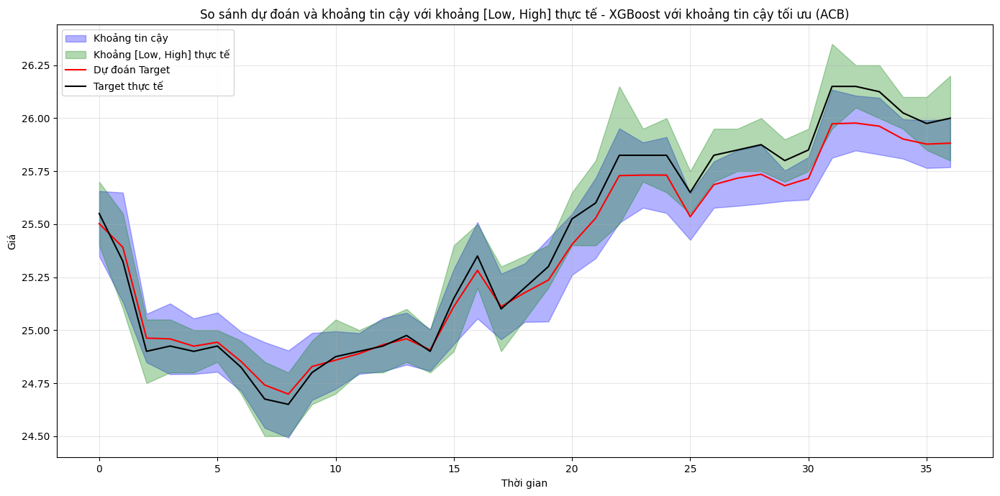


Top 10 đặc trưng quan trọng nhất:
          Feature  Importance
157          ma_5    0.412936
20    target_ma_5    0.207608
65      low_lag_1    0.086850
22   target_ema_5    0.048643
6         doy_sin    0.043257
180   hl_midpoint    0.034529
57         rsi_30    0.033661
64     high_lag_1    0.021459
8    target_lag_1    0.019525
56         roc_30    0.012397
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (138, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 1.6534
MAE: 0.8230
R² Score: 0.4546
Khoảng tin

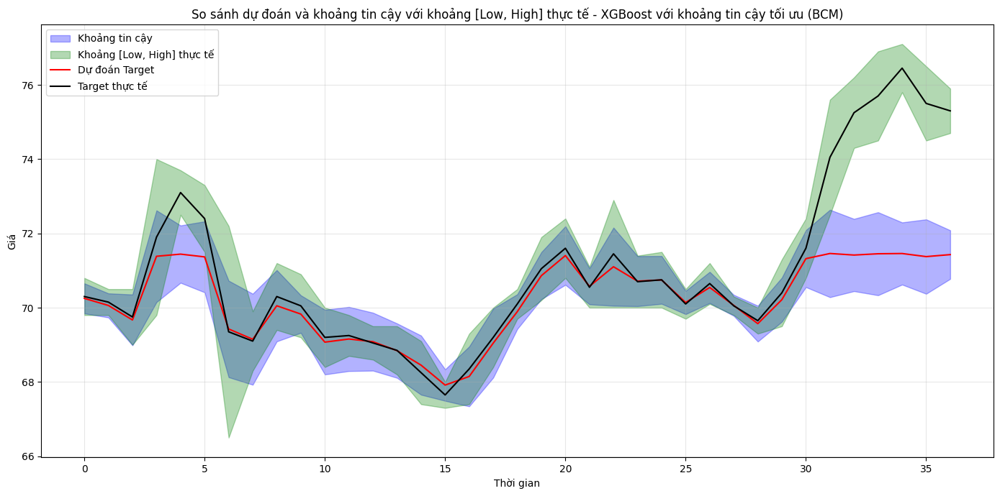


Top 10 đặc trưng quan trọng nhất:
             Feature  Importance
80        high_lag_5    0.198073
64        high_lag_1    0.161768
8       target_lag_1    0.098333
7            doy_cos    0.053771
23      target_ma_10    0.053321
20       target_ma_5    0.049468
180      hl_midpoint    0.049394
173        low_roc_5    0.036430
22      target_ema_5    0.035352
39   price_change_5d    0.025095
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (134, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 0.0690
MAE: 0

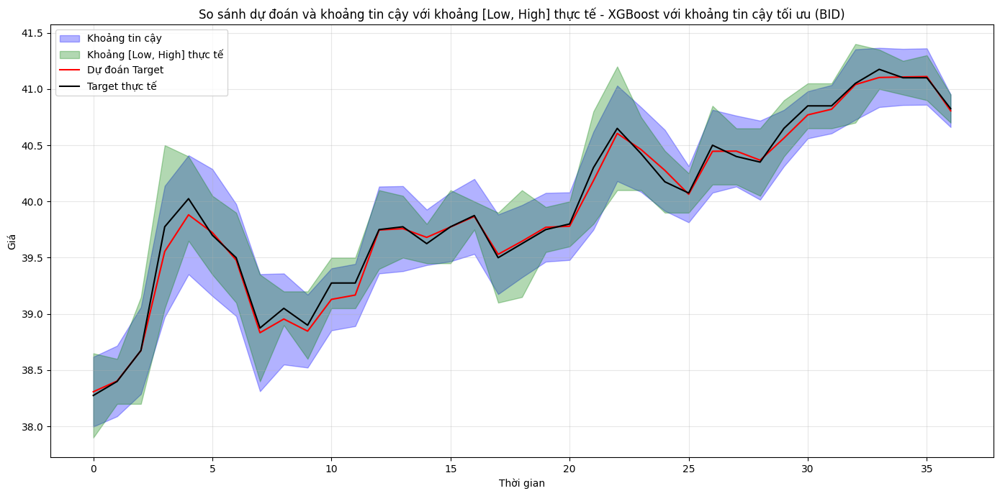


Top 10 đặc trưng quan trọng nhất:
              Feature  Importance
65          low_lag_1    0.175815
22       target_ema_5    0.146281
8        target_lag_1    0.091580
64         high_lag_1    0.082187
180       hl_midpoint    0.072235
174       high_roc_10    0.062995
57             rsi_30    0.056691
52             roc_10    0.042556
20        target_ma_5    0.020005
45   price_change_21d    0.011473
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (132, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 5.

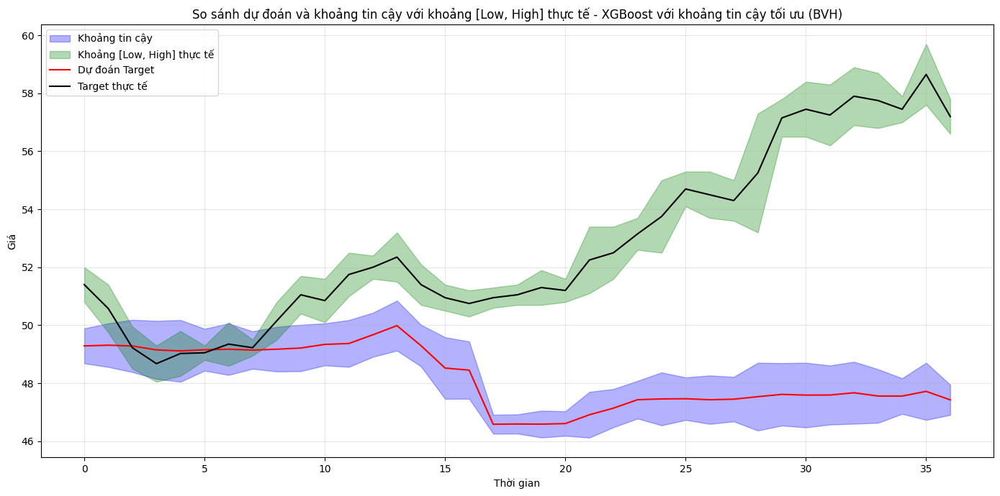


Top 10 đặc trưng quan trọng nhất:
            Feature  Importance
1         month_cos    0.511775
7           doy_cos    0.151530
20      target_ma_5    0.127415
8      target_lag_1    0.056079
9      target_lag_2    0.041069
65        low_lag_1    0.018158
22     target_ema_5    0.017972
33    target_std_60    0.007533
30    target_std_30    0.005987
163  hl_range_ma_10    0.005882
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (133, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 2.0727
MAE: 1.6071
R² Sc

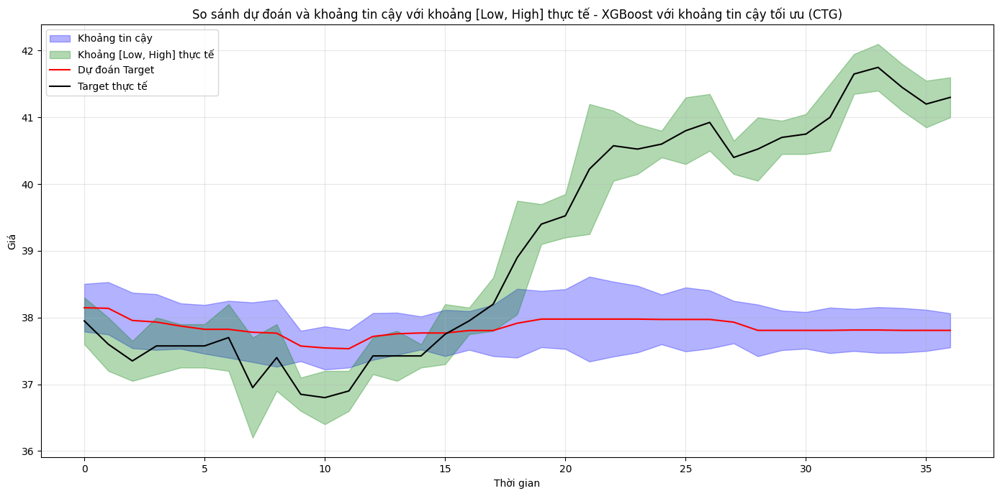


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
20     target_ma_5    0.330915
8     target_lag_1    0.172723
22    target_ema_5    0.119772
64      high_lag_1    0.083863
180    hl_midpoint    0.055954
9     target_lag_2    0.041091
182     hl_skew_20    0.019112
157           ma_5    0.010555
159  hl_range_ma_5    0.009610
174    high_roc_10    0.009503
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (123, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 7.2918
MAE: 6.8509
R² Score: -3.136

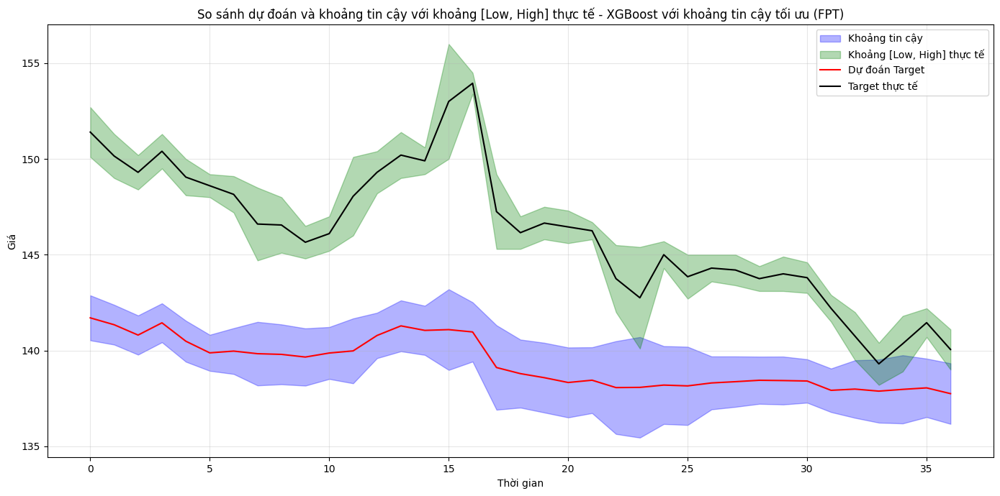


Top 10 đặc trưng quan trọng nhất:
          Feature  Importance
1       month_cos    0.362176
7         doy_cos    0.186368
20    target_ma_5    0.154188
64     high_lag_1    0.060645
8    target_lag_1    0.028805
22   target_ema_5    0.025945
29   target_ma_30    0.022468
65      low_lag_1    0.019508
180   hl_midpoint    0.016632
54         roc_20    0.011508
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (136, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 0.9918
MAE: 0.8663
R² Score: -1.6131
Khoảng ti

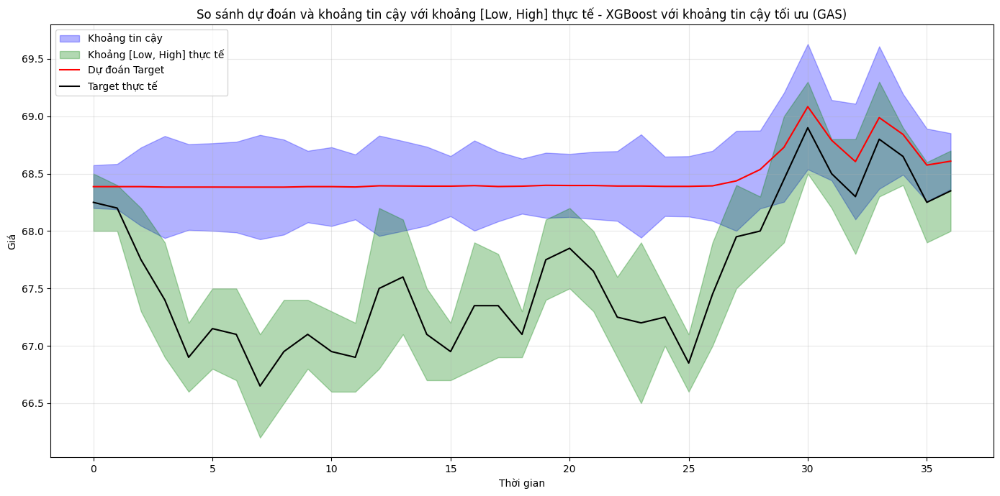


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
8     target_lag_1    0.192708
64      high_lag_1    0.108952
22    target_ema_5    0.108663
6          doy_sin    0.061815
180    hl_midpoint    0.060066
56          roc_30    0.047604
30   target_std_30    0.045272
20     target_ma_5    0.041139
23    target_ma_10    0.037183
7          doy_cos    0.035359
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (135, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 1.6729
MAE: 1.3584
R² Score: -0.288

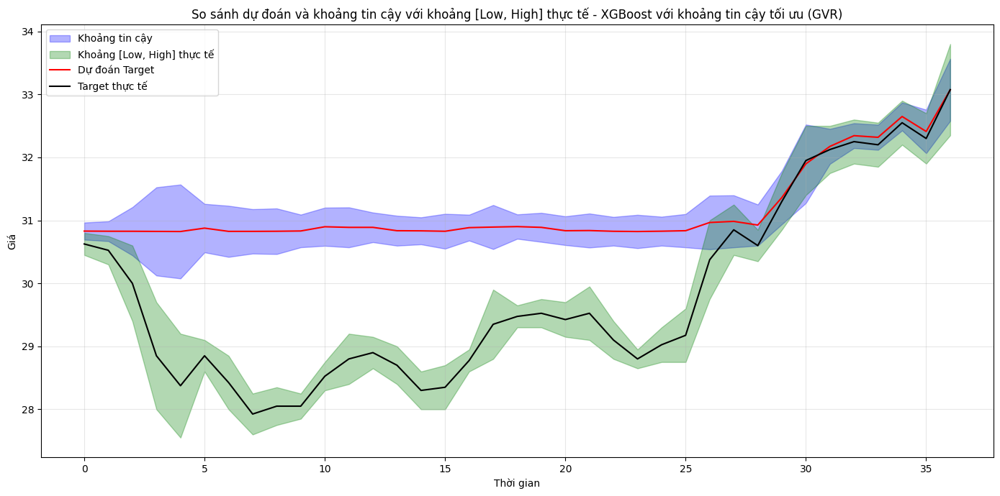


Top 10 đặc trưng quan trọng nhất:
              Feature  Importance
8        target_lag_1    0.210513
65          low_lag_1    0.176688
180       hl_midpoint    0.087108
22       target_ema_5    0.065924
64         high_lag_1    0.036206
20        target_ma_5    0.032585
52             roc_10    0.027681
43   price_change_14d    0.024751
160       hl_pct_ma_5    0.020481
25      target_ema_10    0.019305
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (118, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 0.

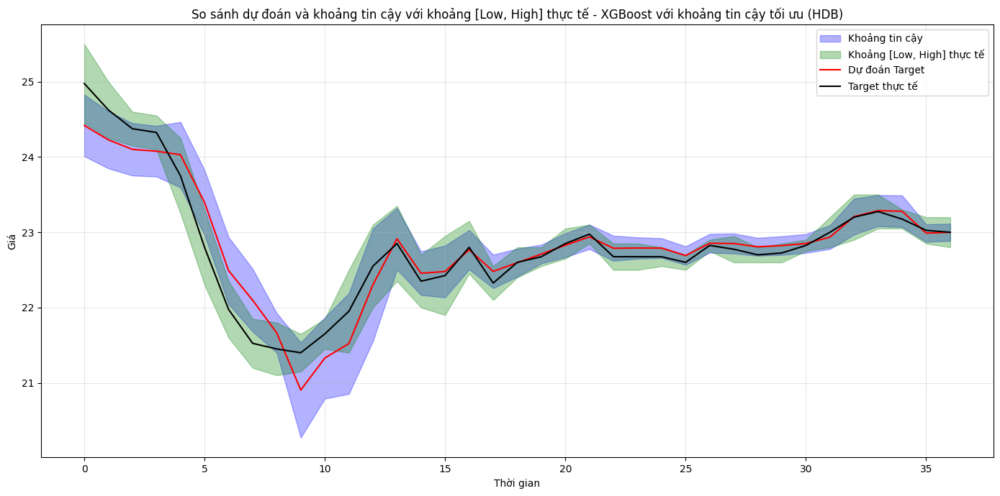


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
20     target_ma_5    0.228068
65       low_lag_1    0.111068
9     target_lag_2    0.083480
180    hl_midpoint    0.074448
6          doy_sin    0.060291
55          rsi_20    0.039920
27   target_std_20    0.039533
22    target_ema_5    0.032266
8     target_lag_1    0.028233
7          doy_cos    0.022680
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (137, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 0.0520
MAE: 0.0373
R² Score: 0.9928

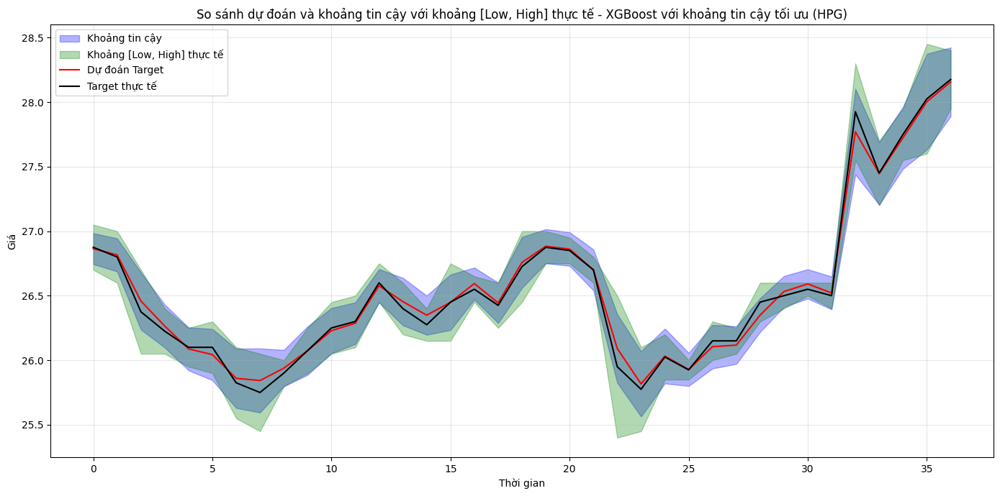


Top 10 đặc trưng quan trọng nhất:
          Feature  Importance
64     high_lag_1    0.219953
65      low_lag_1    0.180859
8    target_lag_1    0.067239
20    target_ma_5    0.063467
180   hl_midpoint    0.062965
7         doy_cos    0.061840
81      low_lag_5    0.052120
179    hl_skew_10    0.036252
10   target_lag_3    0.035469
22   target_ema_5    0.025255
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (133, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 4.7299
MAE: 3.8996
R² Score: -1.9753
Khoảng ti

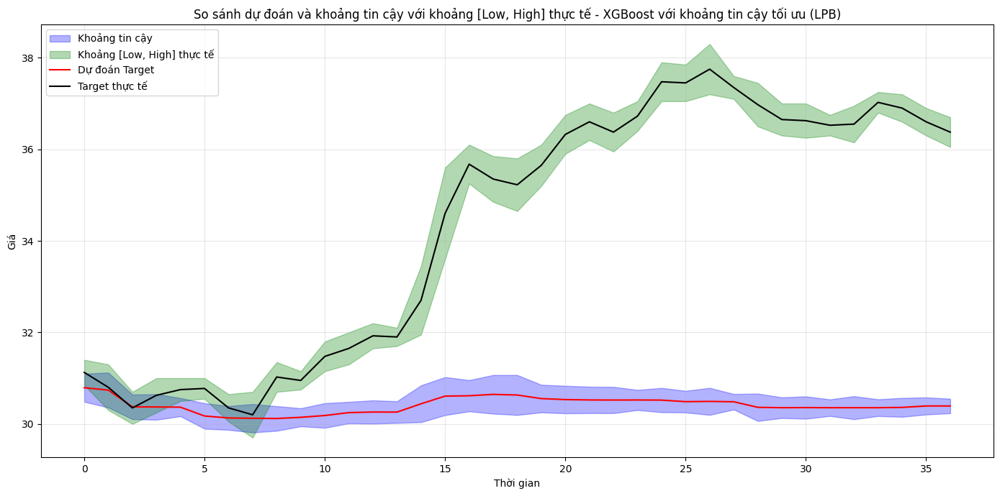


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
8     target_lag_1    0.196623
65       low_lag_1    0.084554
180    hl_midpoint    0.084460
64      high_lag_1    0.062701
0        month_sin    0.052722
68      high_lag_2    0.038726
22    target_ema_5    0.028007
25   target_ema_10    0.026547
7          doy_cos    0.026216
15   target_lag_21    0.018395
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (138, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 0.4387
MAE: 0.3120
R² Score: 0.5653

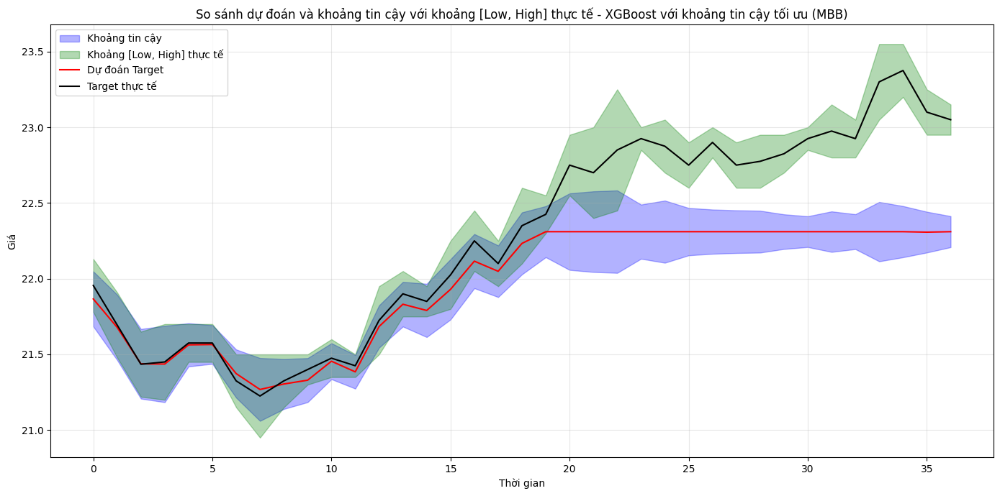


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
22    target_ema_5    0.155209
64      high_lag_1    0.136991
8     target_lag_1    0.132043
180    hl_midpoint    0.096643
65       low_lag_1    0.075640
20     target_ma_5    0.048555
6          doy_sin    0.048379
159  hl_range_ma_5    0.031465
9     target_lag_2    0.027376
136    high_lag_19    0.019202
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (138, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 3.4016
MAE: 3.1332
R² Score: -5.278

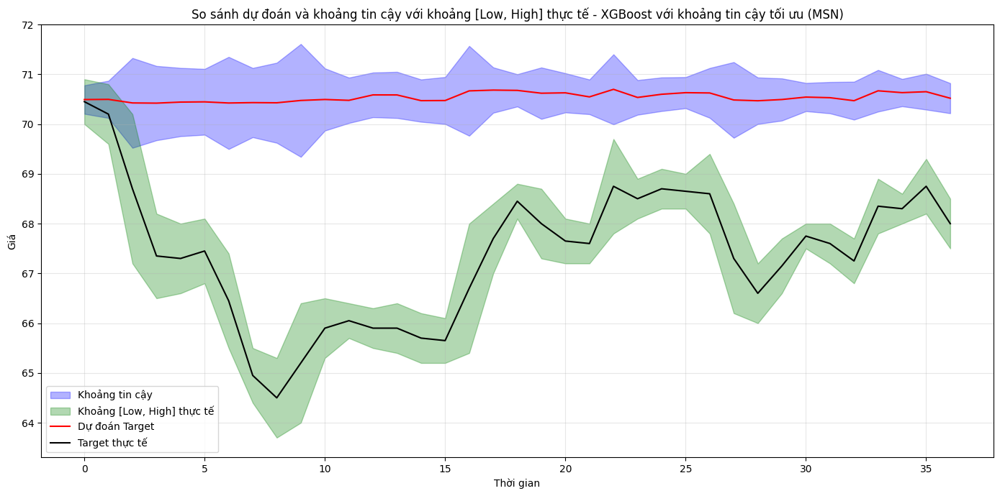


Top 10 đặc trưng quan trọng nhất:
              Feature  Importance
45   price_change_21d    0.113357
8        target_lag_1    0.111308
64         high_lag_1    0.098771
22       target_ema_5    0.095090
65          low_lag_1    0.069634
180       hl_midpoint    0.058874
20        target_ma_5    0.040919
174       high_roc_10    0.029445
19      target_lag_90    0.029376
103     hl_pct_lag_10    0.021829
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (133, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 2.

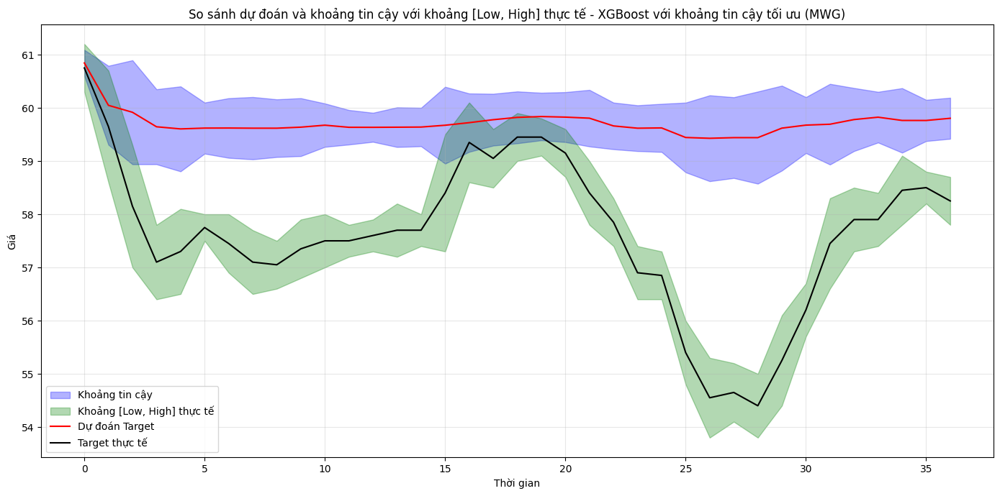


Top 10 đặc trưng quan trọng nhất:
            Feature  Importance
20      target_ma_5    0.452587
22     target_ema_5    0.100158
180     hl_midpoint    0.096421
57           rsi_30    0.033538
64       high_lag_1    0.030344
16    target_lag_30    0.019422
8      target_lag_1    0.017303
65        low_lag_1    0.016712
46   pct_change_21d    0.015606
54           roc_20    0.014107
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (135, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 0.2837
MAE: 0.2177
R² Sc

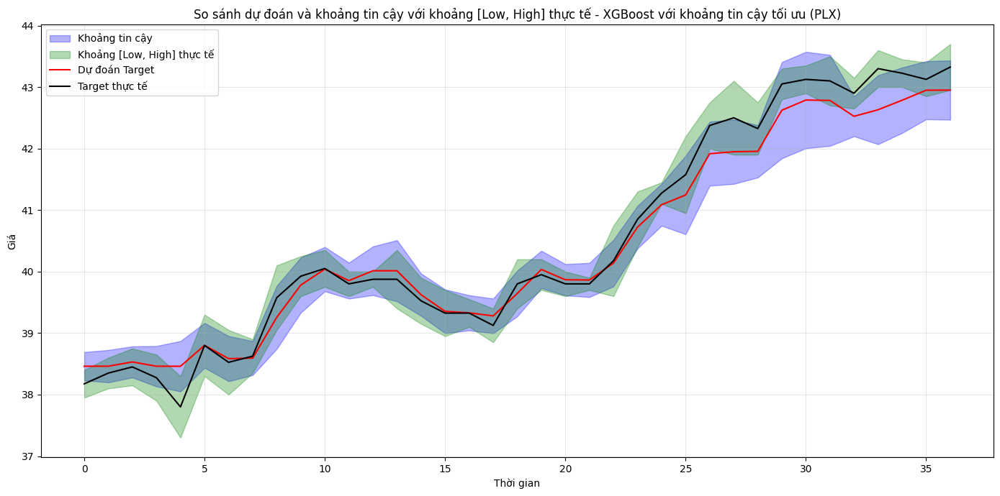


Top 10 đặc trưng quan trọng nhất:
            Feature  Importance
20      target_ma_5    0.274506
8      target_lag_1    0.228812
1         month_cos    0.083553
180     hl_midpoint    0.069242
69        low_lag_2    0.062568
7           doy_cos    0.056598
22     target_ema_5    0.041860
64       high_lag_1    0.031929
25    target_ema_10    0.010517
167  hl_range_ma_20    0.010239
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (126, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 0.3029
MAE: 0.1853
R² Sc

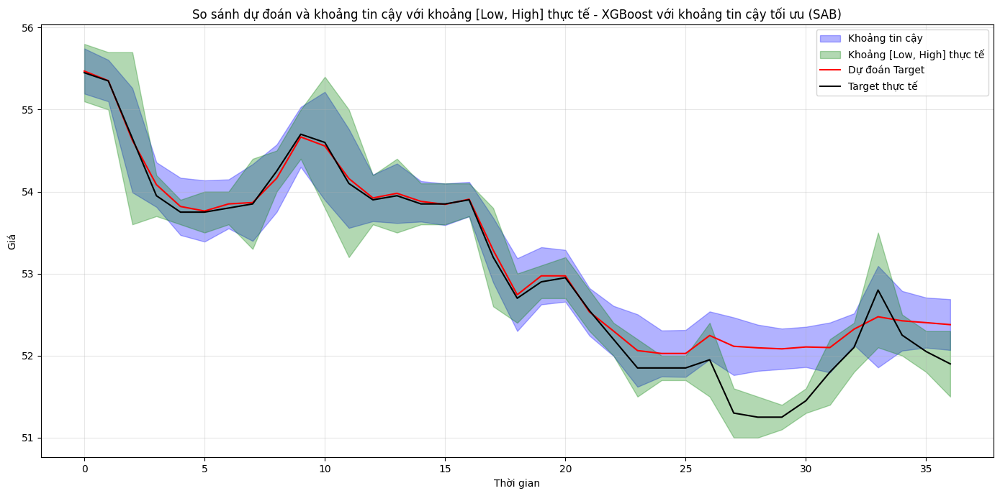


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
8     target_lag_1    0.119468
20     target_ma_5    0.119071
23    target_ma_10    0.084129
32    target_ma_60    0.075113
64      high_lag_1    0.062844
22    target_ema_5    0.058135
25   target_ema_10    0.048087
180    hl_midpoint    0.045747
57          rsi_30    0.028730
175     low_roc_10    0.027995
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (132, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 0.0739
MAE: 0.0568
R² Score: 0.9480

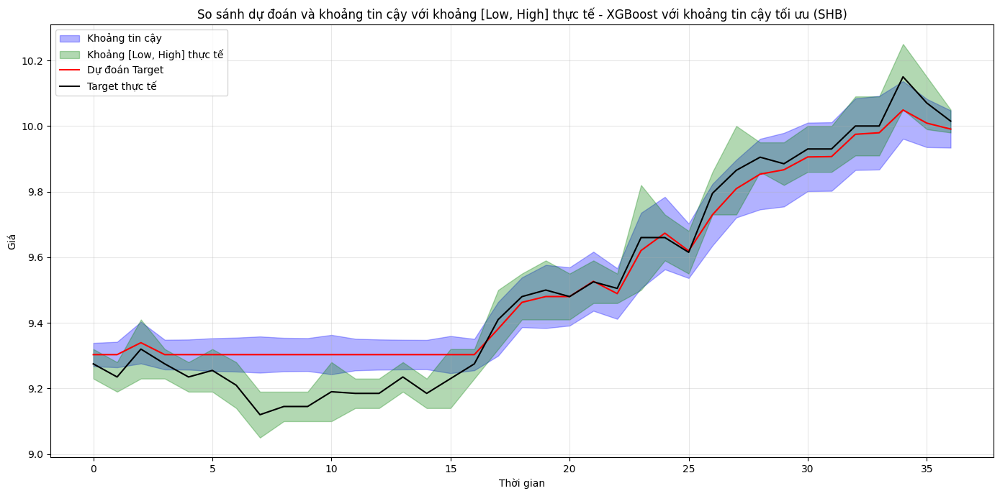


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
64      high_lag_1    0.252405
65       low_lag_1    0.205144
8     target_lag_1    0.191768
180    hl_midpoint    0.117861
25   target_ema_10    0.082483
22    target_ema_5    0.045038
30   target_std_30    0.034255
7          doy_cos    0.028468
18   target_lag_60    0.026304
165          ma_20    0.016275
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (132, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 0.5330
MAE: 0.4143
R² Score: 0.7095

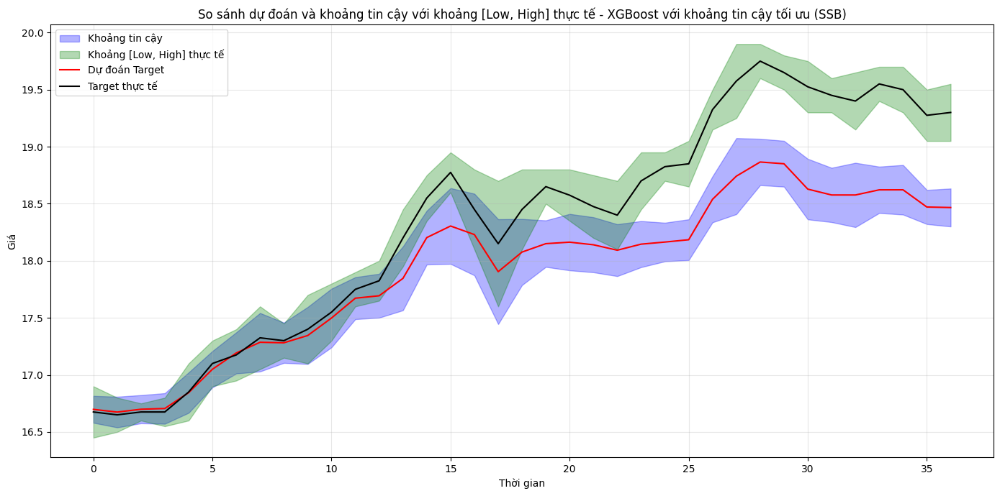


Top 10 đặc trưng quan trọng nhất:
              Feature  Importance
7             doy_cos    0.381397
8        target_lag_1    0.121179
1           month_cos    0.101012
54             roc_20    0.057234
45   price_change_21d    0.041640
180       hl_midpoint    0.030740
65          low_lag_1    0.030494
22       target_ema_5    0.028999
46     pct_change_21d    0.027667
174       high_roc_10    0.013625
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (138, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 0.

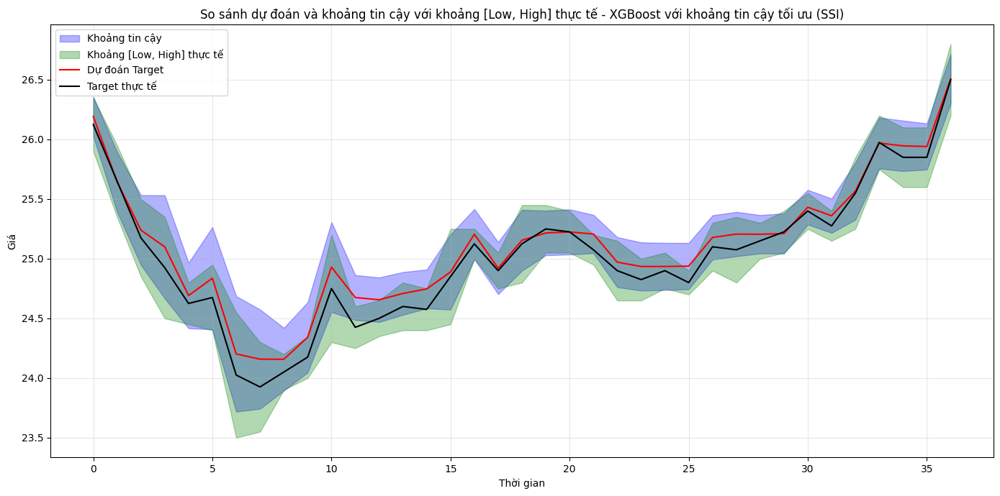


Top 10 đặc trưng quan trọng nhất:
              Feature  Importance
8        target_lag_1    0.294945
20        target_ma_5    0.118033
65          low_lag_1    0.104856
180       hl_midpoint    0.078462
22       target_ema_5    0.039088
46     pct_change_21d    0.028264
54             roc_20    0.021572
64         high_lag_1    0.019639
45   price_change_21d    0.017843
175        low_roc_10    0.014233
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (128, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 1.

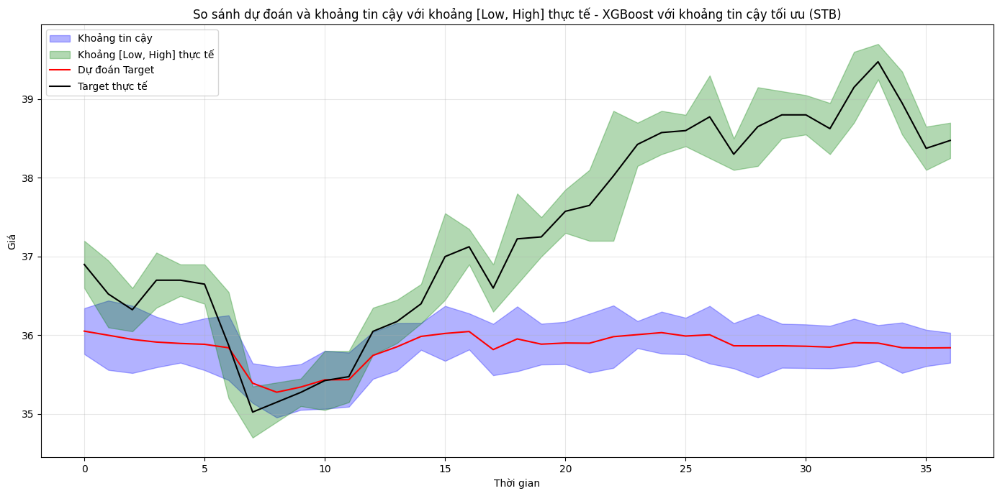


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
1        month_cos    0.586019
7          doy_cos    0.099511
20     target_ma_5    0.074971
22    target_ema_5    0.060827
65       low_lag_1    0.018555
8     target_lag_1    0.017480
13   target_lag_10    0.012860
180    hl_midpoint    0.012316
64      high_lag_1    0.010126
29    target_ma_30    0.009983
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (133, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 1.0145
MAE: 0.6993
R² Score: 0.0303

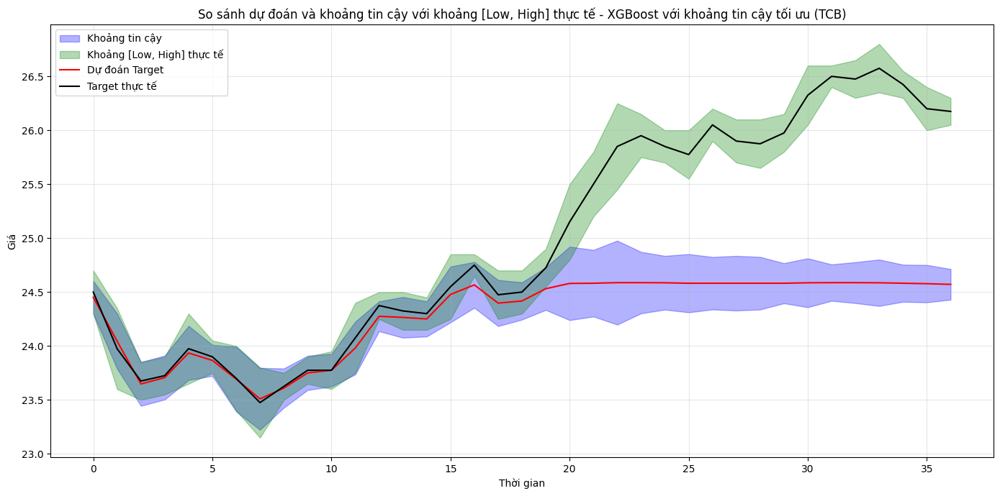


Top 10 đặc trưng quan trọng nhất:
              Feature  Importance
64         high_lag_1    0.195582
8        target_lag_1    0.133362
9        target_lag_2    0.093812
17      target_lag_45    0.084079
180       hl_midpoint    0.064478
45   price_change_21d    0.061526
65          low_lag_1    0.057764
22       target_ema_5    0.031923
55             rsi_20    0.023824
52             roc_10    0.019554
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (135, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 0.

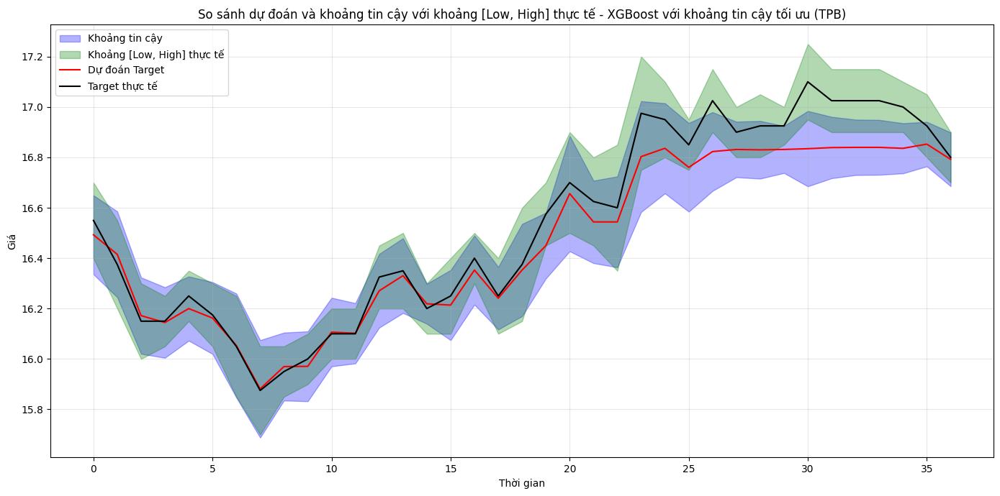


Top 10 đặc trưng quan trọng nhất:
            Feature  Importance
7           doy_cos    0.297303
0         month_sin    0.118656
8      target_lag_1    0.079419
49   volatility_30d    0.069309
57           rsi_30    0.068578
180     hl_midpoint    0.049698
20      target_ma_5    0.049139
56           roc_30    0.035601
16    target_lag_30    0.031806
1         month_cos    0.028611
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (134, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 0.0780
MAE: 0.0535
R² Sc

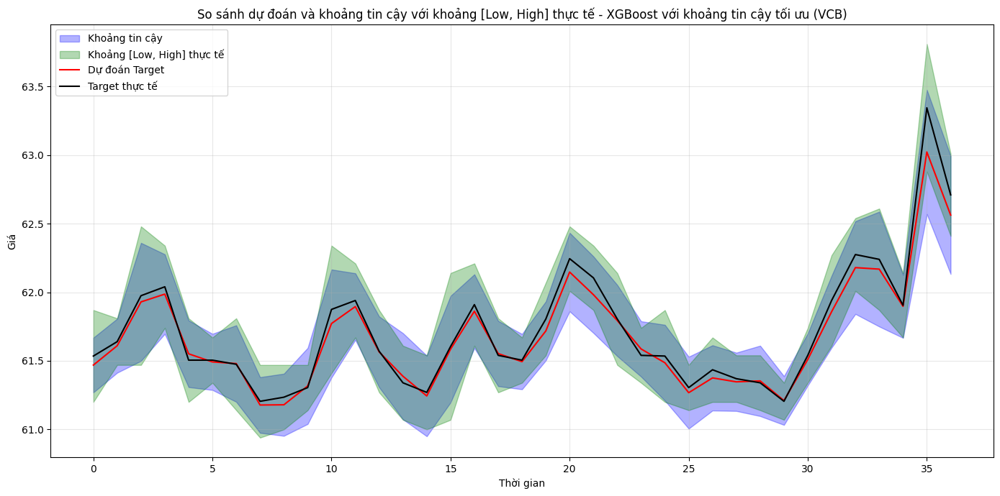


Top 10 đặc trưng quan trọng nhất:
              Feature  Importance
64         high_lag_1    0.387028
180       hl_midpoint    0.072544
20        target_ma_5    0.068634
8        target_lag_1    0.067617
22       target_ema_5    0.061795
54             roc_20    0.034879
33      target_std_60    0.029050
45   price_change_21d    0.026919
25      target_ema_10    0.022873
65          low_lag_1    0.018712
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (137, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 0.

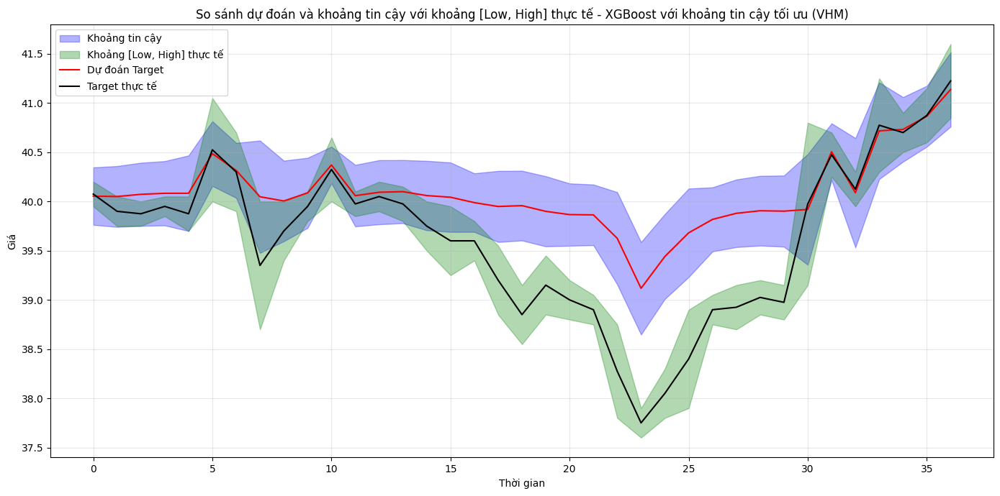


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
7          doy_cos    0.316861
9     target_lag_2    0.091931
20     target_ma_5    0.077607
8     target_lag_1    0.075595
125     low_lag_16    0.043038
180    hl_midpoint    0.039337
64      high_lag_1    0.037865
31   target_ema_30    0.028877
33   target_std_60    0.025802
22    target_ema_5    0.017873
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (135, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 0.8083
MAE: 0.6889
R² Score: -1.393

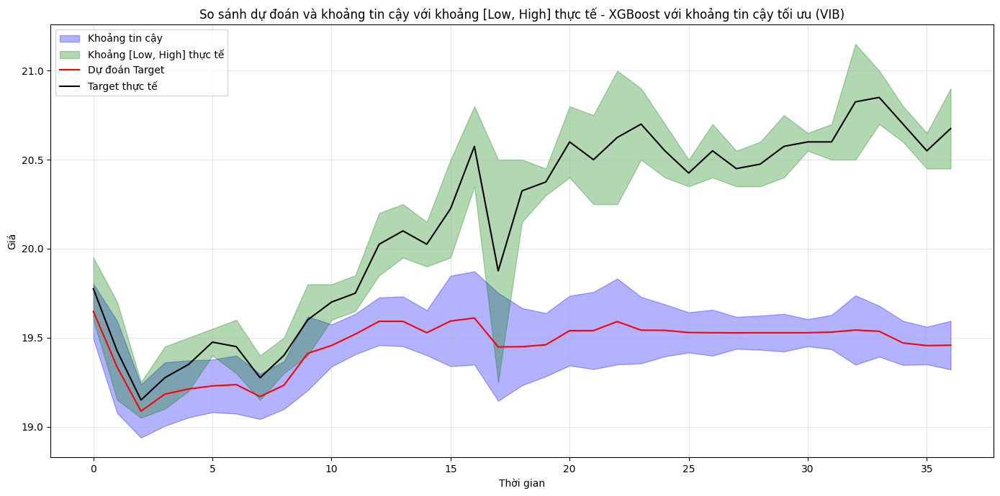


Top 10 đặc trưng quan trọng nhất:
            Feature  Importance
20      target_ma_5    0.307331
22     target_ema_5    0.110452
8      target_lag_1    0.095455
180     hl_midpoint    0.071200
54           roc_20    0.048537
64       high_lag_1    0.043943
65        low_lag_1    0.040125
172      high_roc_5    0.019438
56           roc_30    0.017732
163  hl_range_ma_10    0.017679
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (138, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 0.2297
MAE: 0.1751
R² Sc

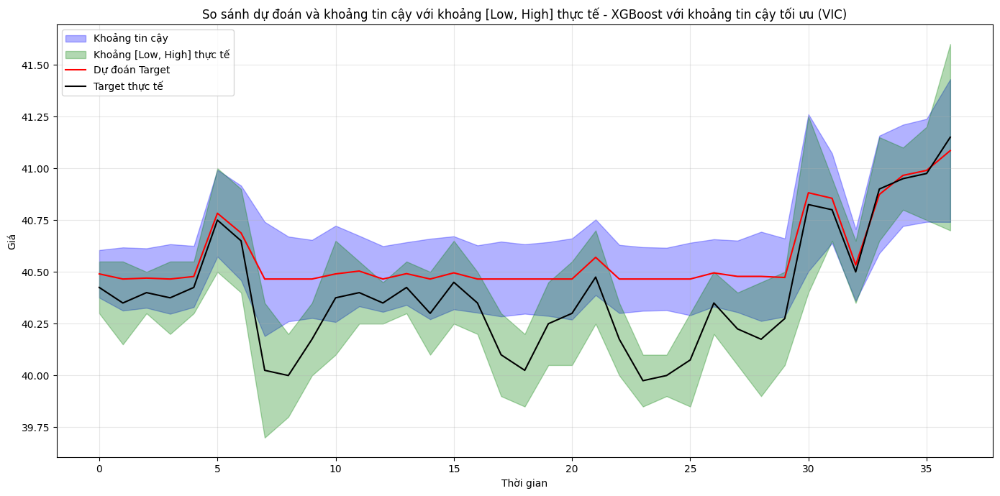


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
157           ma_5    0.190748
20     target_ma_5    0.137639
22    target_ema_5    0.046744
52          roc_10    0.046652
32    target_ma_60    0.045899
179     hl_skew_10    0.045289
53          rsi_10    0.041641
24   target_std_10    0.041219
64      high_lag_1    0.037170
180    hl_midpoint    0.032300
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (136, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 2.0509
MAE: 1.7536
R² Score: -2.356

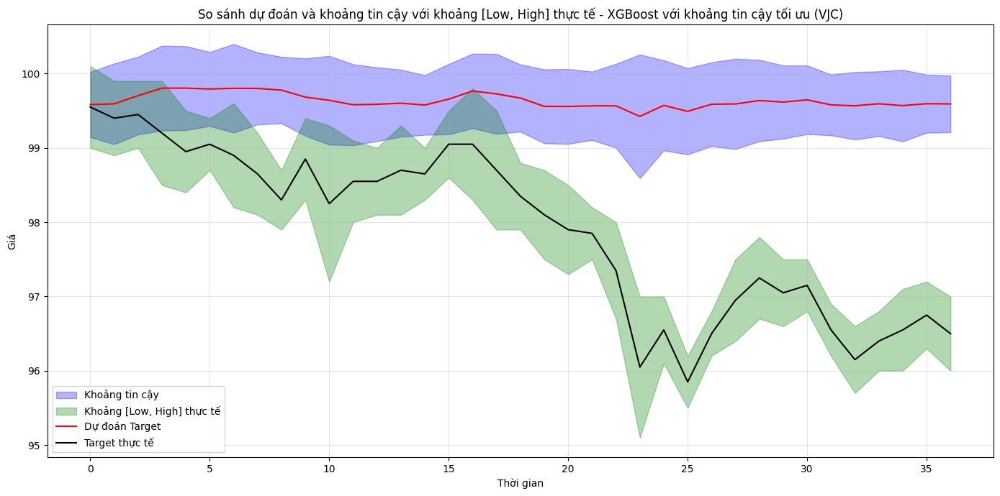


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
8     target_lag_1    0.191062
65       low_lag_1    0.189700
22    target_ema_5    0.069168
20     target_ma_5    0.062536
180    hl_midpoint    0.051180
172     high_roc_5    0.030599
55          rsi_20    0.028070
169          roc_1    0.023125
42   pct_change_7d    0.020470
175     low_roc_10    0.014623
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (132, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 1.5789
MAE: 1.3335
R² Score: -2.018

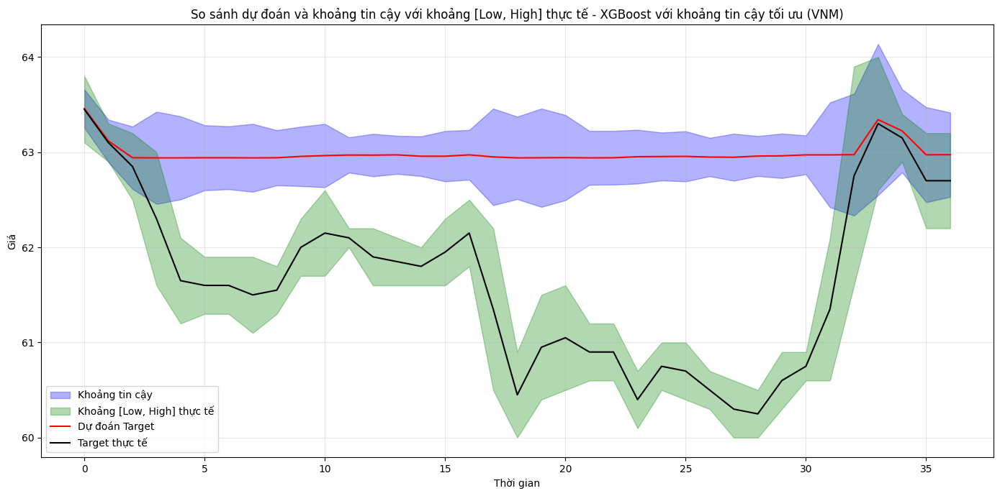


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
64      high_lag_1    0.259575
20     target_ma_5    0.156470
8     target_lag_1    0.155598
180    hl_midpoint    0.097063
22    target_ema_5    0.062523
68      high_lag_2    0.060703
1        month_cos    0.019807
6          doy_sin    0.013437
171      low_roc_1    0.011556
17   target_lag_45    0.010857
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (122, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 0.0258
MAE: 0.0212
R² Score: 0.9937

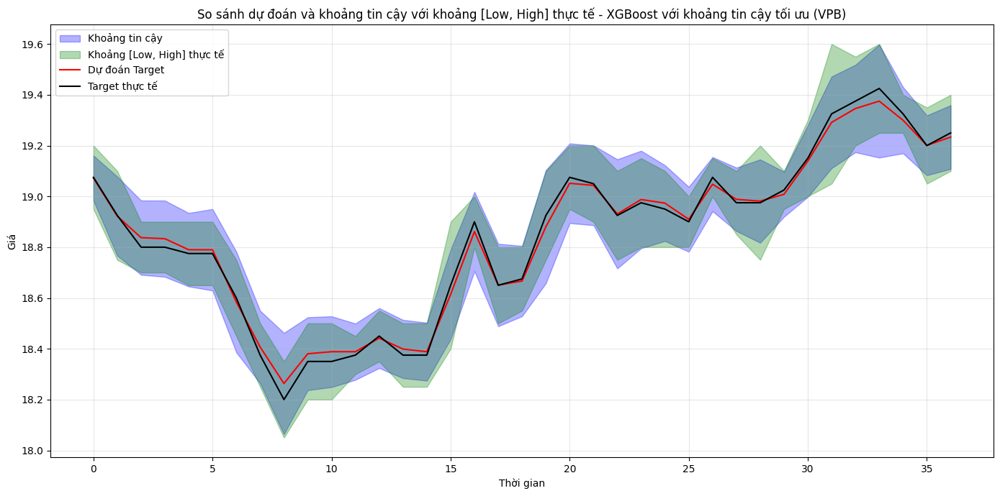


Top 10 đặc trưng quan trọng nhất:
             Feature  Importance
20       target_ma_5    0.314209
64        high_lag_1    0.117643
180      hl_midpoint    0.079471
9       target_lag_2    0.066198
22      target_ema_5    0.050117
8       target_lag_1    0.034401
7            doy_cos    0.029445
42     pct_change_7d    0.023484
41   price_change_7d    0.019131
50             roc_5    0.018233
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (132, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 0.5303
MAE: 0

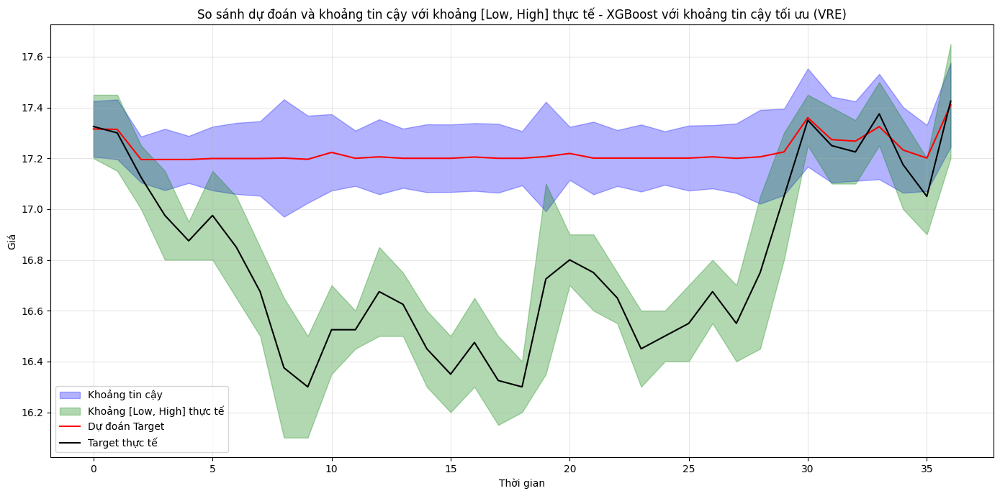


Top 10 đặc trưng quan trọng nhất:
          Feature  Importance
20    target_ma_5    0.410388
22   target_ema_5    0.101456
6         doy_sin    0.078654
180   hl_midpoint    0.066531
117    low_lag_14    0.057024
7         doy_cos    0.056646
65      low_lag_1    0.034470
8    target_lag_1    0.024898
64     high_lag_1    0.024114
50          roc_5    0.014310
Success rate: 11/30


In [32]:
import warnings
warnings.filterwarnings('ignore')

per_r2 = 0

vn30 = ['ACB', 'BCM', 'BID', 'BVH', 'CTG', 'FPT', 'GAS', 'GVR', 'HDB', 'HPG', 'LPB', 'MBB', 'MSN', 'MWG', 'PLX', 'SAB', 'SHB', 'SSB', 'SSI', 'STB', 'TCB', 'TPB', 'VCB', 'VHM', 'VIB', 'VIC', 'VJC', 'VNM', 'VPB', 'VRE']

for symbol in vn30:
	df_train = pd.read_csv(f'../data/2024/vn30/{symbol}.csv')
	df_test = pd.read_csv(f'../data/2025/vn30/{symbol}.csv')

	df_train_processed, df_test_processed = preprocess(df_train, df_test)

	# Chạy XGBoost với đầy đủ cải tiến
	results = run_enhanced_prediction(df_train_processed, df_test_processed, window_size=20, symbol=symbol)

	r2 = results['metrics']['final']['r2']
	if r2 > 0.75:
		per_r2 += 1

print(f"Success rate: {per_r2}/{len(vn30)}")

## 2. Macro Index Prediction

Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (131, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 4.5135
MAE: 2.5011
R² Score: 0.9557
Khoảng tin cậy bao phủ [Low, High]: 62.16%
Dự đoán nằm trong [Low, High]: 86.49%
Tỷ lệ độ rộng (CI/Actual): 1.4405

--- Khoảng tin cậy hiệu chỉnh ---
RMSE: 4.5135
MAE: 2.5011
R² Score: 0.9557
Khoảng tin cậy bao phủ [Low, High]: 0.00%
Dự đoán nằm trong [Low, High]: 86.49%
Tỷ lệ độ rộng (CI/Actual): 0.8161

--- Khoảng tin cậy kết hợp tối ưu ---
RMSE: 4.5135
MAE: 2.5011
R² Sc

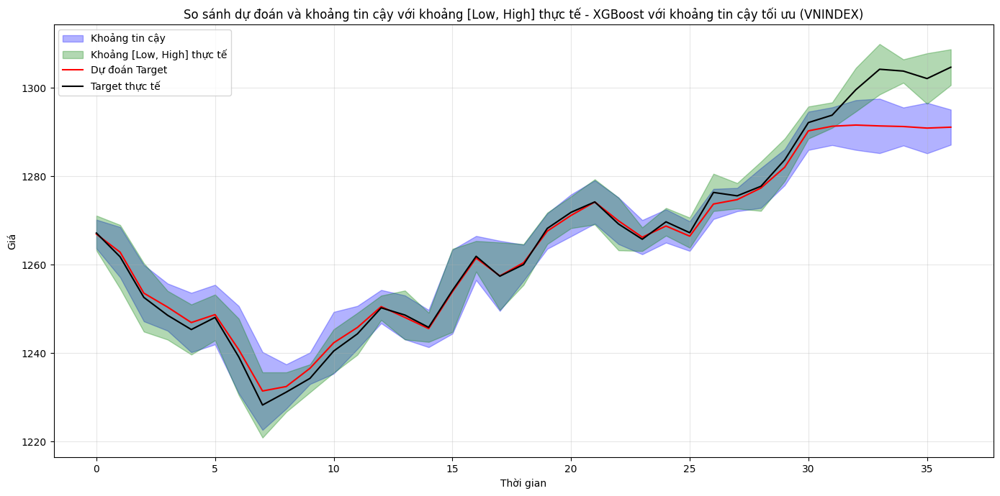


Top 10 đặc trưng quan trọng nhất:
              Feature  Importance
20        target_ma_5    0.168483
22       target_ema_5    0.134853
56             roc_30    0.116688
57             rsi_30    0.063015
54             roc_20    0.058917
180       hl_midpoint    0.057231
65          low_lag_1    0.055341
64         high_lag_1    0.051775
8        target_lag_1    0.044788
45   price_change_21d    0.040529
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (135, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 1.

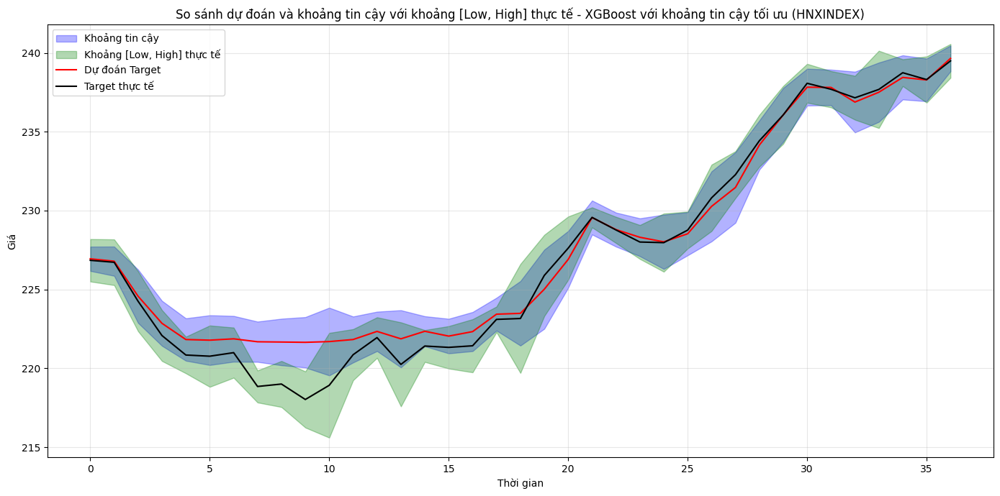


Top 10 đặc trưng quan trọng nhất:
              Feature  Importance
8        target_lag_1    0.240672
64         high_lag_1    0.183529
180       hl_midpoint    0.104807
65          low_lag_1    0.066255
6             doy_sin    0.054022
25      target_ema_10    0.029935
22       target_ema_5    0.028653
54             roc_20    0.017552
45   price_change_21d    0.015982
140       high_lag_20    0.013199
Chuẩn bị đặc trưng nâng cao cho tập train...
Chuẩn bị đặc trưng nâng cao cho tập test...
Kích thước tập train: (125, 184)
Kích thước tập test: (37, 184)
Số ngày trong df_test ban đầu: 37
Số ngày trong X_test sau xử lý: 37

Huấn luyện các mô hình...
Huấn luyện mô hình Target...
Huấn luyện mô hình High...
Huấn luyện mô hình Low...
Huấn luyện mô hình độ lệch upper...
Huấn luyện mô hình độ lệch lower...

Dự đoán với các phương pháp khác nhau...
Kết hợp các dự đoán...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh khoảng tin cậy...

Đánh giá mô hình:

--- Khoảng tin cậy thích ứng ---
RMSE: 1.

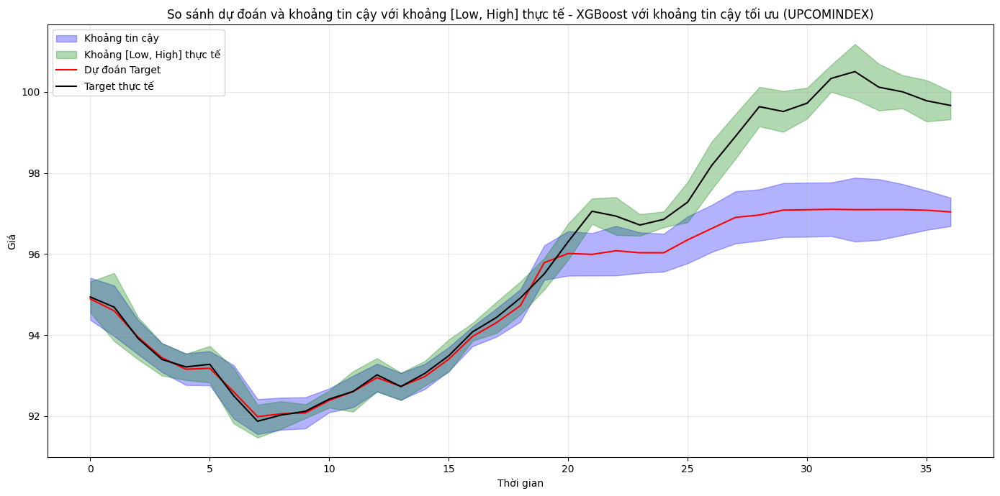


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
1        month_cos    0.209244
7          doy_cos    0.170604
8     target_lag_1    0.145173
65       low_lag_1    0.056028
180    hl_midpoint    0.055864
10    target_lag_3    0.055300
22    target_ema_5    0.039188
17   target_lag_45    0.033209
6          doy_sin    0.030309
81       low_lag_5    0.016188


In [33]:
for index in ['VNINDEX', 'HNXINDEX', 'UPCOMINDEX']:
	df = pd.read_csv(f'../data/2024/index/{index}.csv')
	df_train = df[['time', 'high', 'low']]
	df = pd.read_csv(f'../data/2025/index/{index}.csv')
	df_test = df[['time', 'high', 'low']]

	df_train_processed, df_test_processed = preprocess(df_train, df_test)

	# Chạy XGBoost với đầy đủ cải tiến
	results = run_enhanced_prediction(df_train_processed, df_test_processed, window_size=20, symbol=index)

# XGBoost v2

## 1. Confidence Interval Prediction

In [19]:
import xgboost as xgb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def prepare_dynamic_features(df, window_size=20):
    """Tạo đặc trưng với độ chi tiết cao cho các lag ngắn hạn"""
    df_features = df.copy()
    
    # 1. Thêm lag features dày đặc cho khoảng thời gian gần
    for lag in range(1, 11):  # Tất cả các lag từ 1-10
        df_features[f'target_lag_{lag}'] = df_features['target'].shift(lag)
        df_features[f'high_lag_{lag}'] = df_features['high'].shift(lag)
        df_features[f'low_lag_{lag}'] = df_features['low'].shift(lag)
    
    # Lag thưa hơn cho khoảng xa
    for lag in [12, 15, 20, 25, 30]:
        df_features[f'target_lag_{lag}'] = df_features['target'].shift(lag)

    # 2. Đặc trưng biến động ngắn hạn
    for lag in [1, 2, 3, 5]:
        df_features[f'target_delta_{lag}'] = df_features['target'].diff(lag)
        df_features[f'high_delta_{lag}'] = df_features['high'].diff(lag)
        df_features[f'low_delta_{lag}'] = df_features['low'].diff(lag)
    
    # 3. Đặc trưng high-low
    df_features['hl_range'] = df_features['high'] - df_features['low']
    df_features['hl_pct'] = df_features['hl_range'] / df_features['target'] * 100
    
    # Thêm lag cho high-low
    for lag in range(1, 6):
        df_features[f'hl_range_lag_{lag}'] = df_features['hl_range'].shift(lag)
        df_features[f'hl_pct_lag_{lag}'] = df_features['hl_pct'].shift(lag)
    
    # 4. Đặc trưng kỹ thuật đa tỷ lệ
    # SMA - Simple Moving Average
    for window in [3, 5, 10, 20]:
        df_features[f'sma_{window}'] = df_features['target'].rolling(window=window, min_periods=1).mean()
    
    # EMA - Exponential Moving Average (trọng số cao hơn cho giá gần đây)
    for window in [5, 10, 20]:
        df_features[f'ema_{window}'] = df_features['target'].ewm(span=window, min_periods=1).mean()
    
    # Biến động (Standard Deviation)
    for window in [5, 10, 20]:
        df_features[f'std_{window}'] = df_features['target'].rolling(window=window, min_periods=2).std()
    
    # 5. Đặc trưng xu hướng và động lượng
    # Xu hướng dựa trên SMA ngắn và dài
    df_features['trend'] = np.where(
        df_features['sma_5'] > df_features['sma_20'], 1,
        np.where(df_features['sma_5'] < df_features['sma_20'], -1, 0)
    )
    
    # Rate of Change
    for period in [5, 10, 20]:
        df_features[f'roc_{period}'] = df_features['target'].pct_change(periods=period) * 100
    
    # 6. Đặc trưng biến động không đối xứng
    df_features['upper_expansion'] = df_features['high'] - df_features['target']
    df_features['lower_expansion'] = df_features['target'] - df_features['low']
    df_features['expansion_ratio'] = df_features['upper_expansion'] / df_features['lower_expansion'].replace(0, 0.001)
    
    # 7. Đặc trưng tự hồi quy (giảm thiểu dự đoán đường thẳng)
    # Số ngày liên tiếp tăng/giảm
    df_features['price_up'] = (df_features['target'].diff() > 0).astype(int)
    df_features['consec_up'] = df_features['price_up'].groupby((df_features['price_up'] != df_features['price_up'].shift()).cumsum()).cumcount() + 1
    df_features.loc[df_features['price_up'] == 0, 'consec_up'] = 0
    
    # 8. Đặc trưng thống kê về phân phối
    for window in [10, 20]:
        # Skewness - độ lệch của phân phối
        df_features[f'skew_{window}'] = df_features['target'].rolling(window=window, min_periods=5).skew()
        # Min-Max range
        df_features[f'min_{window}'] = df_features['target'].rolling(window=window, min_periods=1).min()
        df_features[f'max_{window}'] = df_features['target'].rolling(window=window, min_periods=1).max()
    
    # Xử lý NaN
    df_features = df_features.fillna(method='bfill').fillna(method='ffill').fillna(0)
    
    # Tách features và targets
    X = df_features.drop(['target', 'high', 'low'], axis=1)
    y_target = df_features['target']
    y_high = df_features['high']
    y_low = df_features['low']
    
    return X, y_target, y_high, y_low, df_features

def train_multi_model_system(X_train, y_train_target, y_train_high, y_train_low):
    """Huấn luyện hệ thống đa mô hình"""
    # 1. Model dự đoán trực tiếp target
    model_target = xgb.XGBRegressor(
        n_estimators=500,
        learning_rate=0.01,
        max_depth=6,
        min_child_weight=3,
        subsample=0.8,
        colsample_bytree=0.8,
        gamma=0.1,
        objective='reg:squarederror',
        tree_method='hist',
        random_state=42
    )
    
    # 2. Model dự đoán high và low
    model_high = xgb.XGBRegressor(
        n_estimators=500,
        learning_rate=0.01,
        max_depth=6,
        min_child_weight=3,
        subsample=0.8,
        colsample_bytree=0.8,
        gamma=0.1,
        objective='reg:squarederror',
        tree_method='hist',
        random_state=43
    )
    
    model_low = xgb.XGBRegressor(
        n_estimators=500,
        learning_rate=0.01,
        max_depth=6,
        min_child_weight=3,
        subsample=0.8,
        colsample_bytree=0.8,
        gamma=0.1,
        objective='reg:squarederror',
        tree_method='hist',
        random_state=44
    )
    
    # 3. Model xu hướng tổng thể (trend model)
    # Dùng để giải quyết vấn đề đường thẳng
    # Target được smoothed với moving average
    trend_target = y_train_target.rolling(window=5, min_periods=1).mean()
    
    model_trend = xgb.XGBRegressor(
        n_estimators=300,
        learning_rate=0.01,
        max_depth=4,  # Cây nông hơn để không overfitting
        min_child_weight=5,
        subsample=0.9,
        colsample_bytree=0.9,
        gamma=0.2,
        objective='reg:squarederror',
        tree_method='hist',
        random_state=45
    )
    
    # 4. Model biến động (fluctuation model)
    # Dự đoán phần khác biệt giữa giá thực tế và xu hướng
    fluctuation_target = y_train_target - trend_target
    
    model_fluctuation = xgb.XGBRegressor(
        n_estimators=500,
        learning_rate=0.01,
        max_depth=6,
        min_child_weight=2,
        subsample=0.8,
        colsample_bytree=0.8,
        gamma=0.05,
        objective='reg:squarederror',
        tree_method='hist',
        random_state=46
    )
    
    print("Huấn luyện model target...")
    model_target.fit(X_train, y_train_target)
    
    print("Huấn luyện model high...")
    model_high.fit(X_train, y_train_high)
    
    print("Huấn luyện model low...")
    model_low.fit(X_train, y_train_low)
    
    print("Huấn luyện model trend...")
    model_trend.fit(X_train, trend_target)
    
    print("Huấn luyện model fluctuation...")
    model_fluctuation.fit(X_train, fluctuation_target)
    
    return {
        'target': model_target,
        'high': model_high,
        'low': model_low,
        'trend': model_trend,
        'fluctuation': model_fluctuation
    }

def predict_with_dynamic_ensemble(models, X_test):
    """Dự đoán với ensemble động - thay đổi trọng số theo vị trí thời gian"""
    # Dự đoán với từng mô hình riêng lẻ
    pred_target = models['target'].predict(X_test)
    pred_high = models['high'].predict(X_test)
    pred_low = models['low'].predict(X_test)
    pred_trend = models['trend'].predict(X_test)
    pred_fluctuation = models['fluctuation'].predict(X_test)
    
    # Tổng hợp trend và fluctuation
    pred_trend_plus_fluctuation = pred_trend + pred_fluctuation
    
    # Trọng số thay đổi theo vị trí trong chuỗi thời gian
    # Đầu chuỗi: Ưu tiên trend+fluctuation models để giải quyết vấn đề đường thẳng
    # Cuối chuỗi: Ưu tiên target model trực tiếp
    target_weights = np.ones(len(pred_target)) * 0.8  # Giá trị mặc định
    
    # Điều chỉnh trọng số cho 10 điểm đầu tiên
    for i in range(min(10, len(pred_target))):
        # Tăng dần trọng số của target model từ 0.3 đến 0.8
        target_weights[i] = 0.3 + 0.5 * (i / 10)
    
    # Tính dự đoán tổng hợp
    dynamic_pred = np.zeros(len(pred_target))
    for i in range(len(pred_target)):
        dynamic_pred[i] = (target_weights[i] * pred_target[i] + 
                          (1 - target_weights[i]) * pred_trend_plus_fluctuation[i])
    
    return dynamic_pred, pred_high, pred_low

def calculate_adaptive_confidence_bands(pred_target, pred_high, pred_low, X_test):
    """Tính khoảng tin cậy thích ứng dựa trên biến động và đặc tính dữ liệu"""
    # Lấy độ biến động từ X_test nếu có
    if 'std_10' in X_test.columns:
        volatility = X_test['std_10'].values
    else:
        volatility = np.ones(len(pred_target)) * 0.01
    
    # Chuẩn hóa và giới hạn volatility
    norm_volatility = volatility / np.mean(volatility)
    norm_volatility = np.clip(norm_volatility, 0.5, 2.0)
    
    # Lấy đặc tính biến động không đối xứng nếu có
    if 'expansion_ratio' in X_test.columns:
        expansion_ratio = X_test['expansion_ratio'].values
        expansion_ratio = np.nan_to_num(expansion_ratio, nan=1.0)
        expansion_ratio = np.clip(expansion_ratio, 0.5, 2.0)
    else:
        expansion_ratio = np.ones(len(pred_target))
    
    # Tính khoảng tin cậy thích ứng theo đặc tính dữ liệu
    # - Độ rộng thay đổi theo biến động
    # - Độ không đối xứng thay đổi theo expansion_ratio
    base_width = (pred_high - pred_low) * 0.7  # Thu hẹp base width xuống 70%
    
    # Tính độ rộng trên và dưới riêng biệt
    upper_width = base_width * norm_volatility * np.sqrt(expansion_ratio) * 0.5
    lower_width = base_width * norm_volatility / np.sqrt(expansion_ratio) * 0.5
    
    # Điều chỉnh thêm cho 10 điểm đầu tiên để tránh đường thẳng
    for i in range(min(10, len(pred_target))):
        # Tăng độ rộng cho điểm đầu của dự đoán để nắm bắt sự bất định
        upper_width[i] *= (1.1 - i * 0.01)  # Từ 110% xuống 100%
        lower_width[i] *= (1.1 - i * 0.01)
    
    upper_bound = pred_target + upper_width
    lower_bound = pred_target - lower_width
    
    return lower_bound, upper_bound

def run_improved_prediction(df_train, df_test, window_size=20, symbol=None):
    """Chạy quy trình dự đoán với các cải tiến chống đường thẳng"""
    print("Chuẩn bị đặc trưng động...")
    X_train, y_train_target, y_train_high, y_train_low, df_train_features = prepare_dynamic_features(df_train, window_size)
    X_test, y_test_target, y_test_high, y_test_low, df_test_features = prepare_dynamic_features(df_test, window_size)
    
    print("\nHuấn luyện hệ thống đa mô hình...")
    models = train_multi_model_system(X_train, y_train_target, y_train_high, y_train_low)
    
    print("\nDự đoán với ensemble động...")
    dynamic_pred, pred_high, pred_low = predict_with_dynamic_ensemble(models, X_test)
    
    print("Tính khoảng tin cậy thích ứng...")
    adaptive_low, adaptive_high = calculate_adaptive_confidence_bands(dynamic_pred, pred_high, pred_low, X_test)
    
    # Điều chỉnh thêm khoảng tin cậy để khớp hơn với khoảng [low, high]
    print("Hiệu chỉnh cuối cùng...")
    final_low = adaptive_low
    final_high = adaptive_high
    
    # Điều chỉnh đặc biệt cho các điểm đầu tiên để tránh đường thẳng
    # Nếu phát hiện target gần như không thay đổi trong 3+ điểm liên tiếp
    for i in range(3, len(dynamic_pred)):
        if (abs(dynamic_pred[i] - dynamic_pred[i-1]) < 0.01 and
            abs(dynamic_pred[i-1] - dynamic_pred[i-2]) < 0.01 and
            abs(dynamic_pred[i-2] - dynamic_pred[i-3]) < 0.01):
            
            # Tính biến động trung bình trong quá khứ
            if i > 5:
                avg_change = np.mean(np.abs(np.diff(dynamic_pred[i-5:i])))
                # Thêm nhiễu nhỏ để phá vỡ đường thẳng
                dynamic_pred[i] += np.random.normal(0, avg_change/5)
    
    # Đánh giá kết quả
    print("\nĐánh giá mô hình:")
    metrics = evaluate_method(
        final_low, dynamic_pred, final_high,
        y_test_target.values, y_test_low.values, y_test_high.values,
        "Dự đoán với ensemble động"
    )
    
    # Vẽ biểu đồ
    plot_predictions(
        final_low, dynamic_pred, final_high,
        y_test_target.values, y_test_low.values, y_test_high.values,
        "XGBoost với ensemble động",
        symbol
    )
    
    # Feature importance
    importance_df = pd.DataFrame({
        'Feature': X_train.columns,
        'Importance': models['target'].feature_importances_
    }).sort_values('Importance', ascending=False)
    
    print("\nTop 10 đặc trưng quan trọng nhất:")
    print(importance_df.head(10))
    
    return {
        'models': models,
        'predictions': {
            'target': dynamic_pred,
            'high': pred_high,
            'low': pred_low,
            'final_low': final_low,
            'final_high': final_high
        },
        'metrics': metrics
    }

def evaluate_method(lower, median, upper, y_test, test_low, test_high, method_name):
    """Đánh giá phương pháp dự đoán"""
    # Tính các độ đo
    rmse = np.sqrt(mean_squared_error(y_test, median))
    mae = mean_absolute_error(y_test, median)
    r2 = r2_score(y_test, median)
    
    # Tính % khoảng tin cậy bao phủ khoảng [low, high]
    ci_contains_range = np.sum((lower <= test_low) & (upper >= test_high))
    ci_coverage_pct = ci_contains_range / len(median) * 100
    
    # Tính % dự đoán trong khoảng [low, high]
    pred_in_range = np.sum((median >= test_low) & (median <= test_high))
    pred_in_range_pct = pred_in_range / len(median) * 100
    
    # Tính độ rộng khoảng tin cậy
    ci_width = upper - lower
    actual_range_width = test_high - test_low
    avg_ci_width = np.mean(ci_width)
    avg_range_width = np.mean(actual_range_width)
    width_ratio = avg_ci_width / avg_range_width
    
    print(f"\n--- {method_name} ---")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R² Score: {r2:.4f}")
    print(f"Khoảng tin cậy bao phủ [Low, High]: {ci_coverage_pct:.2f}%")
    print(f"Dự đoán nằm trong [Low, High]: {pred_in_range_pct:.2f}%")
    print(f"Tỷ lệ độ rộng (CI/Actual): {width_ratio:.4f}")
    
    return {
        'rmse': rmse,
        'mae': mae,
        'r2': r2,
        'ci_coverage': ci_coverage_pct,
        'pred_in_range': pred_in_range_pct,
        'width_ratio': width_ratio
    }

def plot_predictions(lower, median, upper, y_test, test_low, test_high, title, symbol=None):
    """Vẽ dự đoán và khoảng tin cậy"""
    plt.figure(figsize=(14, 7))
    x = np.arange(len(median))
    
    # Vẽ khoảng tin cậy
    plt.fill_between(x, lower, upper, alpha=0.3, color='blue', label='Khoảng tin cậy')
    
    # Vẽ khoảng [low, high] thực tế
    plt.fill_between(x, test_low, test_high, alpha=0.3, color='green', label='Khoảng [Low, High] thực tế')
    
    # Vẽ dự đoán
    plt.plot(x, median, color='red', linewidth=1.5, label='Dự đoán Target')
    
    # Vẽ giá trị thực tế
    plt.plot(x, y_test, color='black', linewidth=1.5, label='Target thực tế')
    
    if symbol is not None:
        plt.title(f"So sánh dự đoán và khoảng tin cậy với khoảng [Low, High] thực tế - {title} ({symbol})")
    else:
        plt.title(f"So sánh dự đoán và khoảng tin cậy với khoảng [Low, High] thực tế - {title}")
        
    plt.xlabel("Thời gian")
    plt.ylabel("Giá")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 0.1837
MAE: 0.1463
R² Score: 0.8532
Khoảng tin cậy bao phủ [Low, High]: 8.11%
Dự đoán nằm trong [Low, High]: 54.05%
Tỷ lệ độ rộng (CI/Actual): 0.6633


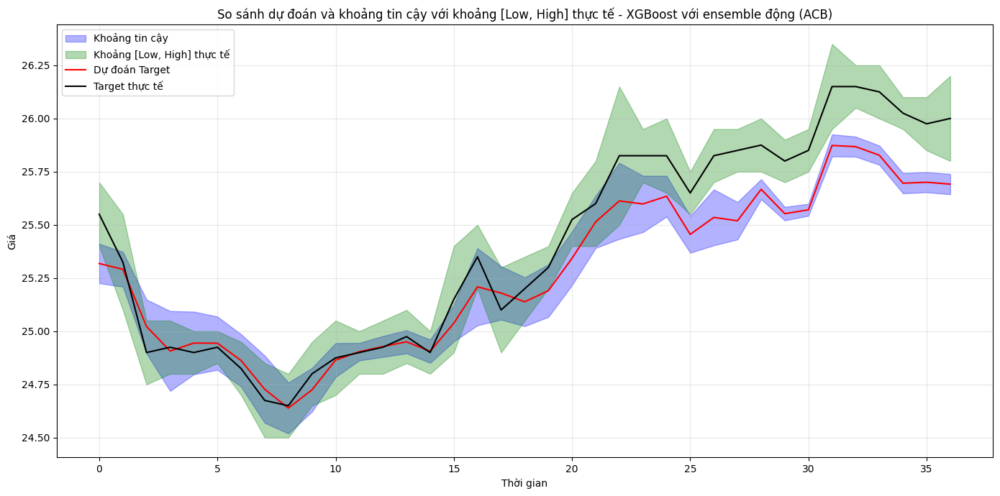


Top 10 đặc trưng quan trọng nhất:
          Feature  Importance
131        max_10    0.188397
118         ema_5    0.122153
114         sma_3    0.089933
62     high_lag_1    0.056959
22   target_ema_5    0.055274
6         doy_sin    0.047701
63      low_lag_1    0.045791
57         rsi_30    0.031471
8    target_lag_1    0.027642
54         roc_20    0.015221
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 1.8038
MAE: 1.0316
R² Score: 0.3508
Khoảng tin cậy bao phủ [Low, High]: 8.11%
Dự đoán nằm trong [Low, High]: 72.97%
Tỷ lệ độ rộng (CI/Actual): 0.4762


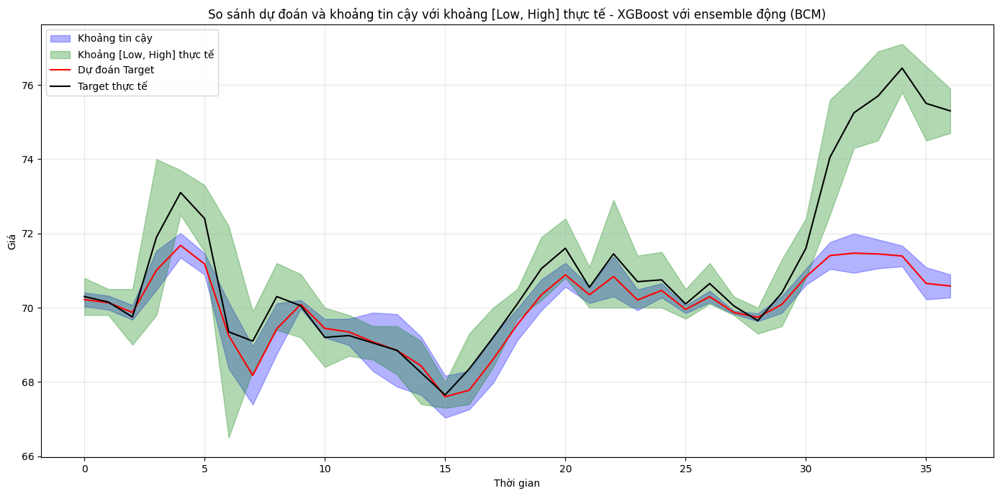


Top 10 đặc trưng quan trọng nhất:
          Feature  Importance
22   target_ema_5    0.143390
114         sma_3    0.112604
8    target_lag_1    0.110578
6         doy_sin    0.078716
63      low_lag_1    0.060284
23   target_ma_10    0.036235
118         ema_5    0.035405
62     high_lag_1    0.034549
116        sma_10    0.033486
1       month_cos    0.029647
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 0.1781
MAE: 0.1416
R² Score: 0.9454
Khoảng tin cậy bao phủ [Low, High]: 27.03%
Dự đoán nằm trong [Low, High]: 83.78%
Tỷ lệ độ rộng (CI/Actual): 1.0911


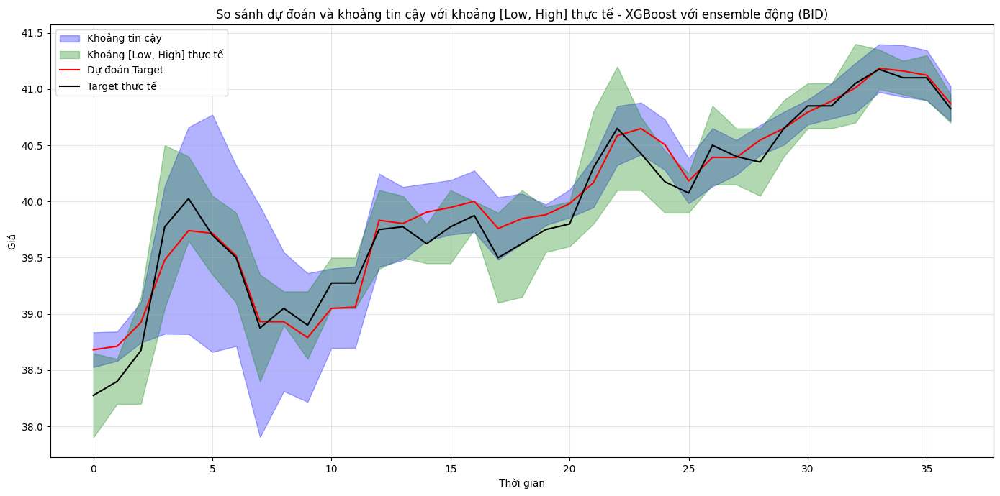


Top 10 đặc trưng quan trọng nhất:
              Feature  Importance
22       target_ema_5    0.153462
62         high_lag_1    0.084664
114             sma_3    0.078997
118             ema_5    0.075849
8        target_lag_1    0.058953
52             roc_10    0.048939
63          low_lag_1    0.027339
44     pct_change_14d    0.022681
45   price_change_21d    0.019687
56             roc_30    0.018882
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 6.2440
MAE: 4.9325
R² Score: -3.3893
Khoảng tin cậy bao phủ [Low, High]: 5.41%
Dự đoán nằm trong [Low, High]: 13.51%
Tỷ lệ độ rộng (CI/Actual): 0.7802


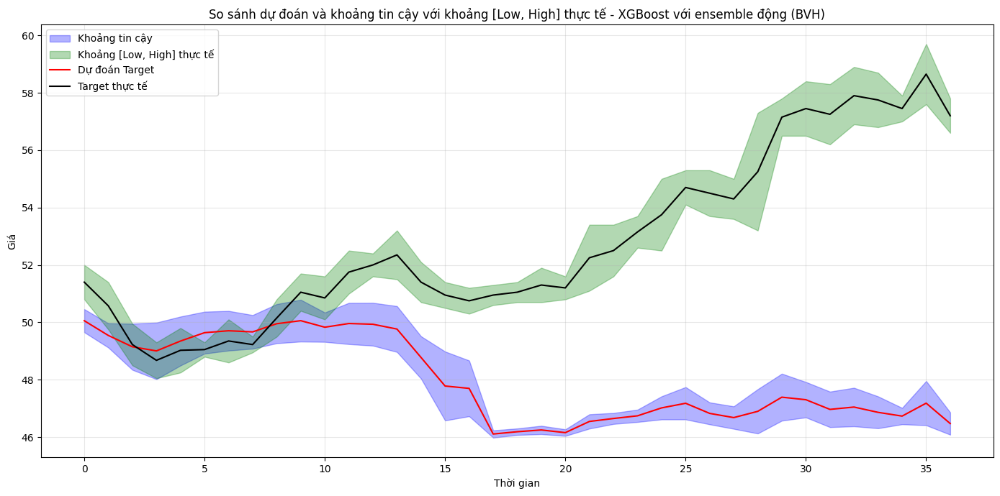


Top 10 đặc trưng quan trọng nhất:
          Feature  Importance
1       month_cos    0.527535
7         doy_cos    0.201104
8    target_lag_1    0.080274
20    target_ma_5    0.017451
22   target_ema_5    0.017265
114         sma_3    0.012886
123        std_20    0.012593
9    target_lag_2    0.012243
62     high_lag_1    0.011821
54         roc_20    0.008128
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 2.2628
MAE: 1.7139
R² Score: -0.7905
Khoảng tin cậy bao phủ [Low, High]: 0.00%
Dự đoán nằm trong [Low, High]: 29.73%
Tỷ lệ độ rộng (CI/Actual): 0.5646


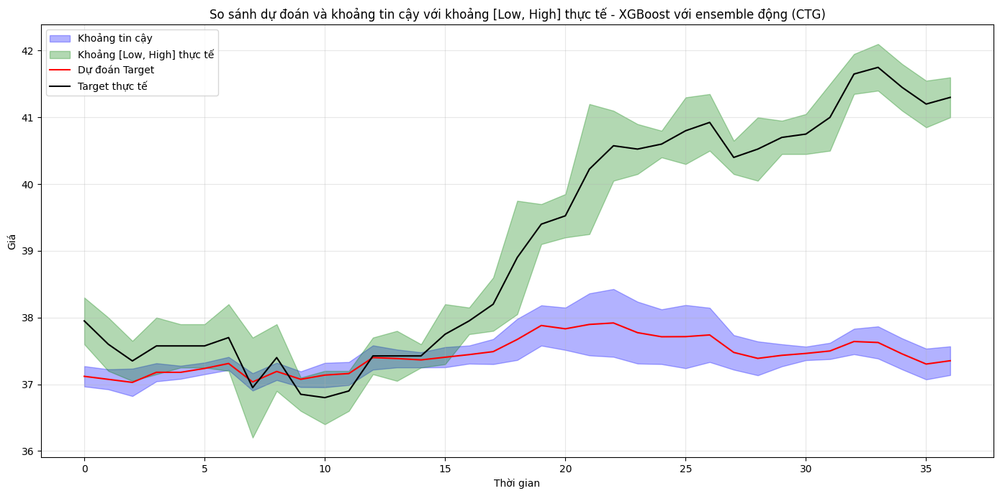


Top 10 đặc trưng quan trọng nhất:
          Feature  Importance
8    target_lag_1    0.239956
20    target_ma_5    0.148772
62     high_lag_1    0.126627
22   target_ema_5    0.111325
65      low_lag_2    0.031016
9    target_lag_2    0.026667
114         sma_3    0.025350
131        max_10    0.023962
63      low_lag_1    0.019087
115         sma_5    0.013614
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 7.4532
MAE: 7.0973
R² Score: -3.3220
Khoảng tin cậy bao phủ [Low, High]: 0.00%
Dự đoán nằm trong [Low, High]: 0.00%
Tỷ lệ độ rộng (CI/Actual): 0.9768


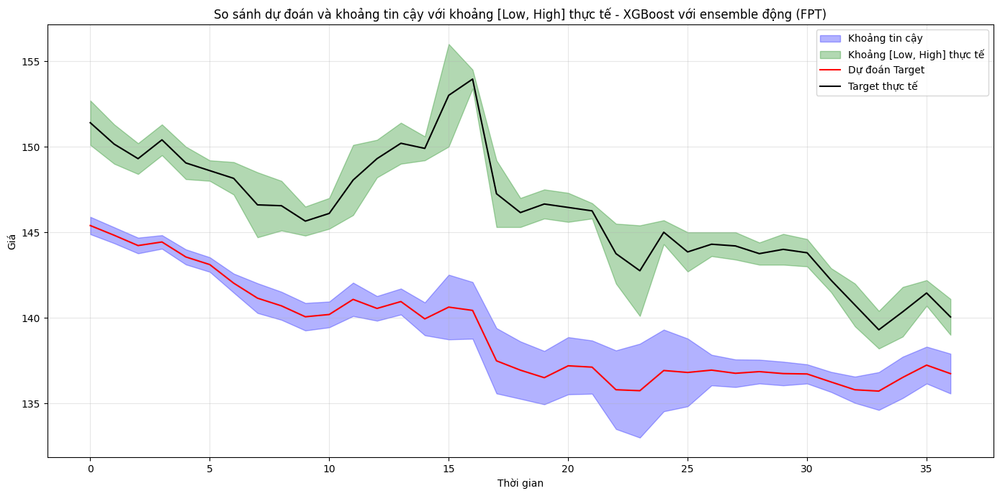


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
1        month_cos    0.364400
20     target_ma_5    0.109832
25   target_ema_10    0.093575
8     target_lag_1    0.062849
7          doy_cos    0.049290
22    target_ema_5    0.047655
114          sma_3    0.037002
63       low_lag_1    0.021988
81    target_lag_9    0.018790
62      high_lag_1    0.015099
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 1.1733
MAE: 1.0625
R² Score: -2.6570
Khoảng tin cậy bao phủ [Low, High]: 2.70%
Dự đoán nằm trong [Low, High]: 10.81%
Tỷ lệ độ rộng (CI/Actual): 0.6544


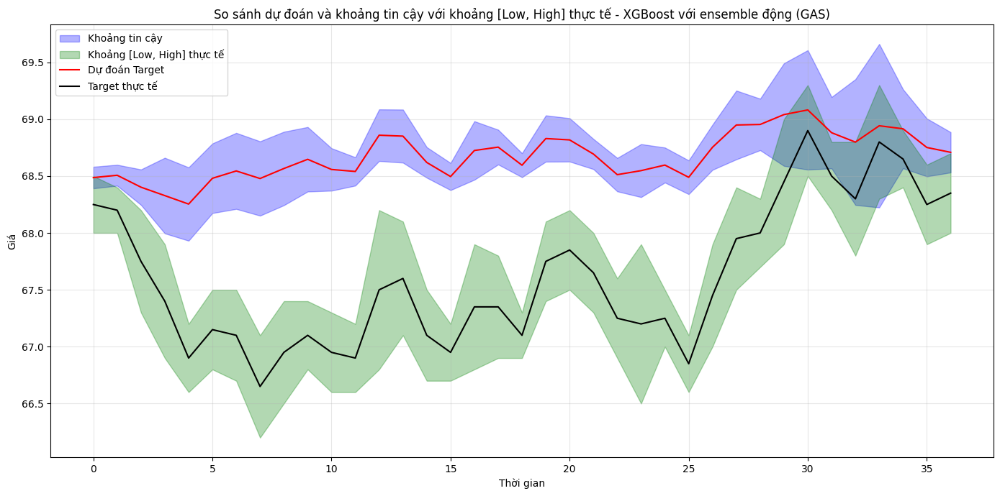


Top 10 đặc trưng quan trọng nhất:
          Feature  Importance
20    target_ma_5    0.185132
22   target_ema_5    0.153343
62     high_lag_1    0.110817
8    target_lag_1    0.077478
64     high_lag_2    0.064880
131        max_10    0.049080
114         sma_3    0.045658
118         ema_5    0.034245
54         roc_20    0.030751
63      low_lag_1    0.025121
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 1.8999
MAE: 1.6071
R² Score: -0.6613
Khoảng tin cậy bao phủ [Low, High]: 0.00%
Dự đoán nằm trong [Low, High]: 24.32%
Tỷ lệ độ rộng (CI/Actual): 0.6083


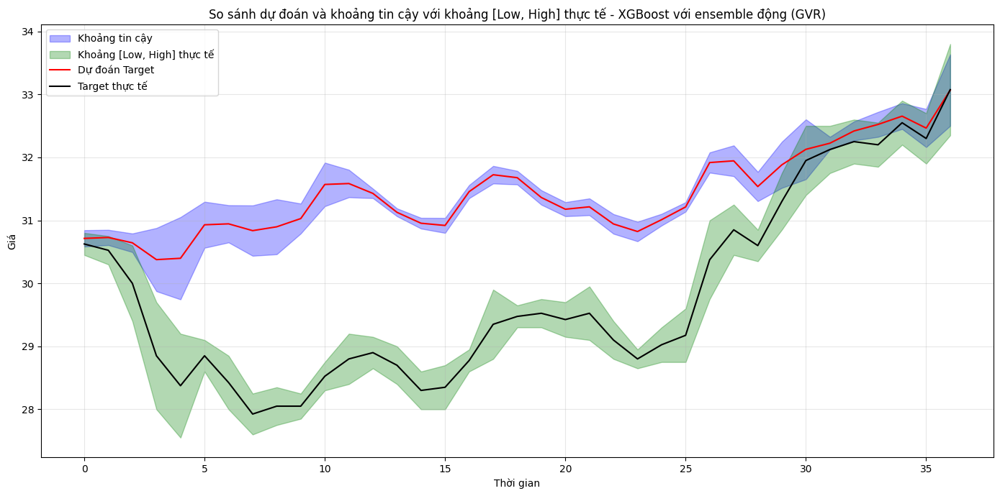


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
114          sma_3    0.175722
8     target_lag_1    0.148196
62      high_lag_1    0.107985
63       low_lag_1    0.063488
22    target_ema_5    0.043575
7          doy_cos    0.024381
24   target_std_10    0.023327
33   target_std_60    0.021963
52          roc_10    0.020021
118          ema_5    0.019378
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 0.5127
MAE: 0.3284
R² Score: 0.5839
Khoảng tin cậy bao phủ [Low, High]: 2.70%
Dự đoán nằm trong [Low, High]: 64.86%
Tỷ lệ độ rộng (CI/Actual): 0.8968


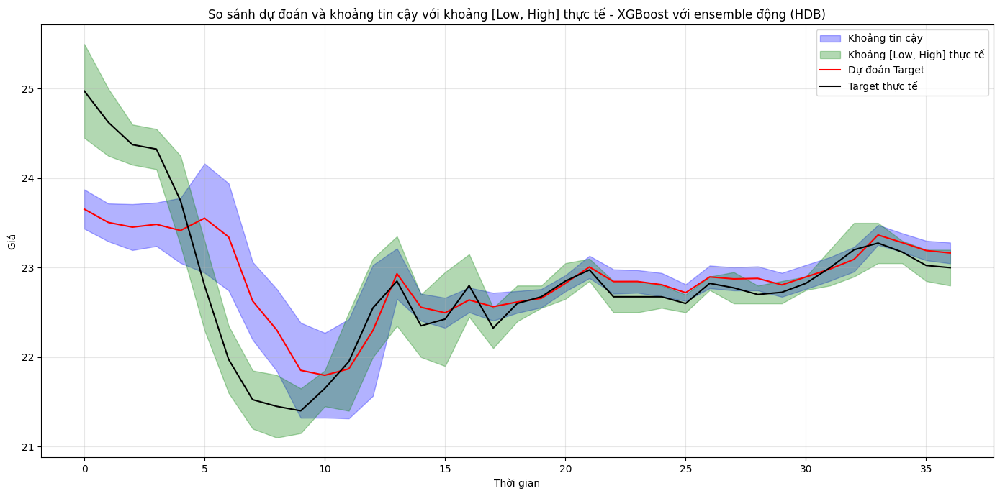


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
118          ema_5    0.167399
114          sma_3    0.133610
63       low_lag_1    0.130015
23    target_ma_10    0.084087
8     target_lag_1    0.074817
34   target_ema_60    0.047437
20     target_ma_5    0.042429
6          doy_sin    0.031888
22    target_ema_5    0.024379
123         std_20    0.016368
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 0.1618
MAE: 0.0919
R² Score: 0.9306
Khoảng tin cậy bao phủ [Low, High]: 16.22%
Dự đoán nằm trong [Low, High]: 89.19%
Tỷ lệ độ rộng (CI/Actual): 0.7947


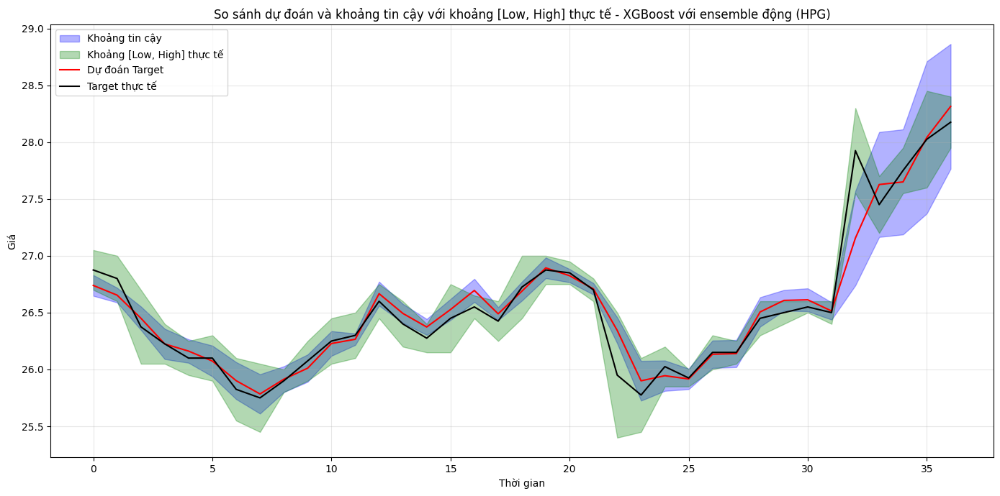


Top 10 đặc trưng quan trọng nhất:
          Feature  Importance
8    target_lag_1    0.164779
63      low_lag_1    0.144311
12   target_lag_7    0.079333
62     high_lag_1    0.074222
22   target_ema_5    0.065934
114         sma_3    0.060515
73   target_lag_6    0.040991
75      low_lag_6    0.031483
72      low_lag_5    0.023972
6         doy_sin    0.021741
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 5.2633
MAE: 4.5734
R² Score: -2.6842
Khoảng tin cậy bao phủ [Low, High]: 0.00%
Dự đoán nằm trong [Low, High]: 0.00%
Tỷ lệ độ rộng (CI/Actual): 0.5438


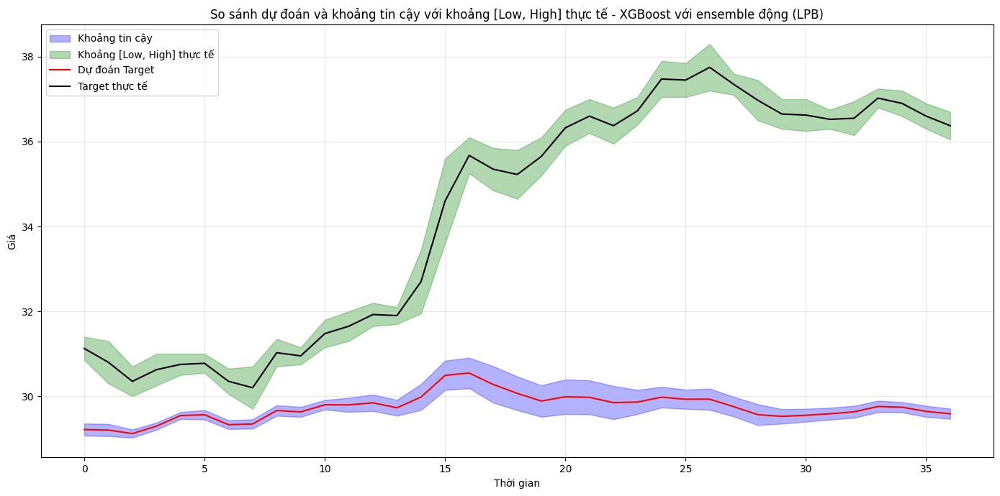


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
8     target_lag_1    0.144710
85      low_lag_10    0.085764
63       low_lag_1    0.085743
22    target_ema_5    0.078089
114          sma_3    0.072545
20     target_ma_5    0.051735
17   target_lag_45    0.041485
32    target_ma_60    0.034401
11    target_lag_5    0.033812
118          ema_5    0.032632
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 0.4935
MAE: 0.3631
R² Score: 0.4499
Khoảng tin cậy bao phủ [Low, High]: 0.00%
Dự đoán nằm trong [Low, High]: 45.95%
Tỷ lệ độ rộng (CI/Actual): 0.6363


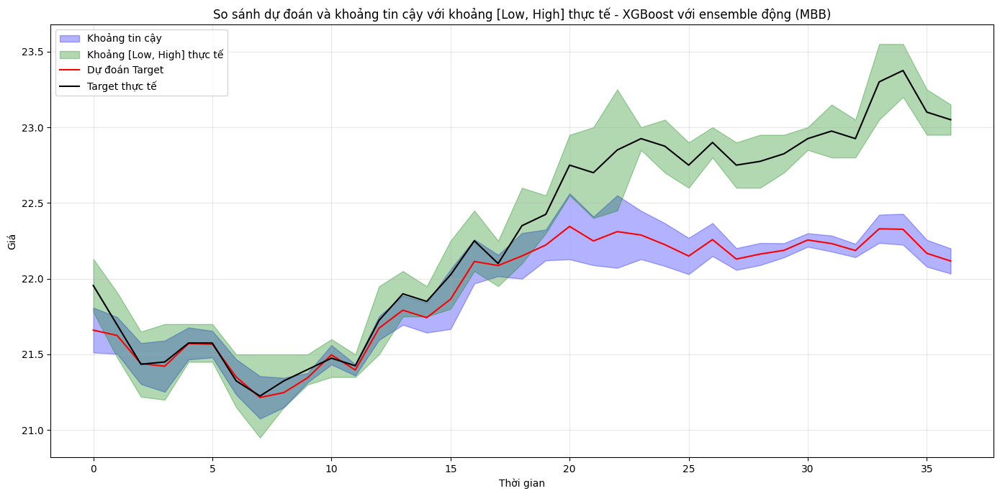


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
62      high_lag_1    0.171753
8     target_lag_1    0.126204
114          sma_3    0.107401
118          ema_5    0.060752
22    target_ema_5    0.053934
63       low_lag_1    0.048673
28   target_ema_20    0.046708
6          doy_sin    0.016996
20     target_ma_5    0.015386
26    target_ma_20    0.012139
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 3.8105
MAE: 3.5711
R² Score: -6.8788
Khoảng tin cậy bao phủ [Low, High]: 0.00%
Dự đoán nằm trong [Low, High]: 8.11%
Tỷ lệ độ rộng (CI/Actual): 0.5293


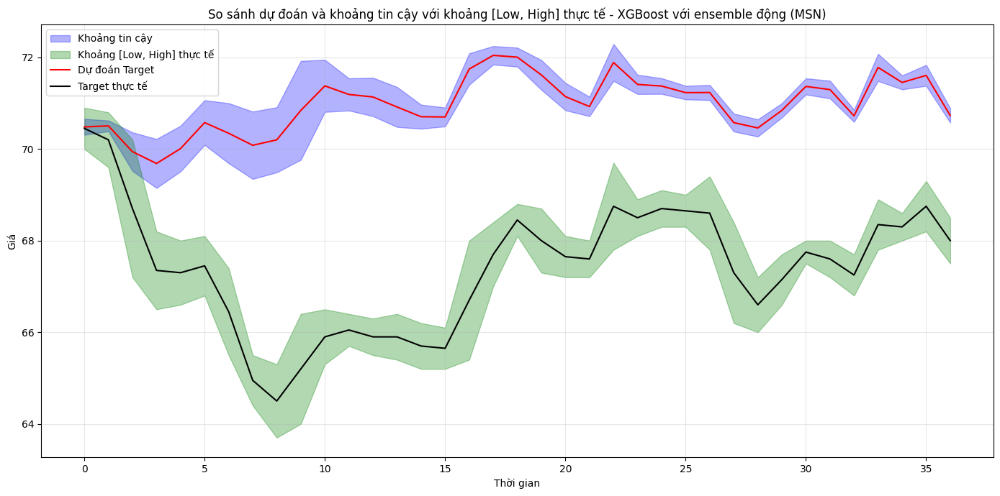


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
114          sma_3    0.185134
118          ema_5    0.160989
8     target_lag_1    0.085979
63       low_lag_1    0.060794
62      high_lag_1    0.048140
6          doy_sin    0.034532
22    target_ema_5    0.033678
19   target_lag_90    0.027756
52          roc_10    0.018957
56          roc_30    0.017713
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 2.5164
MAE: 2.2174
R² Score: -2.1240
Khoảng tin cậy bao phủ [Low, High]: 0.00%
Dự đoán nằm trong [Low, High]: 5.41%
Tỷ lệ độ rộng (CI/Actual): 0.7747


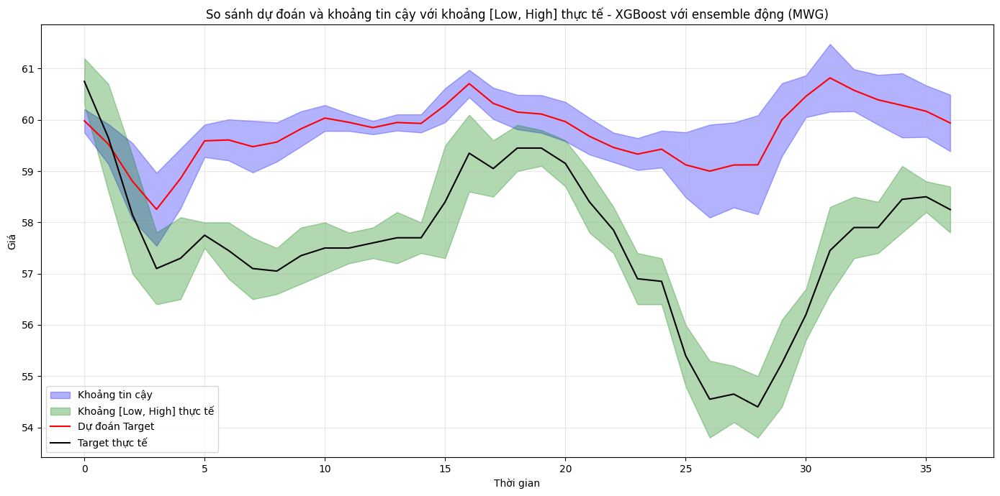


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
22    target_ema_5    0.245967
20     target_ma_5    0.216652
134         max_20    0.054396
114          sma_3    0.051417
118          ema_5    0.042661
62      high_lag_1    0.035080
8     target_lag_1    0.031756
25   target_ema_10    0.020274
30   target_std_30    0.018351
63       low_lag_1    0.016649
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 0.2525
MAE: 0.1971
R² Score: 0.9796
Khoảng tin cậy bao phủ [Low, High]: 21.62%
Dự đoán nằm trong [Low, High]: 75.68%
Tỷ lệ độ rộng (CI/Actual): 0.9141


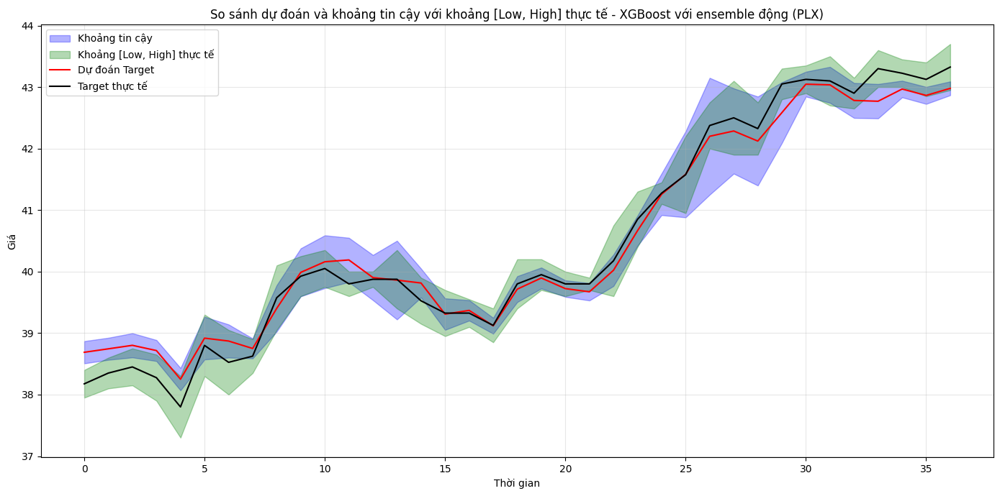


Top 10 đặc trưng quan trọng nhất:
            Feature  Importance
20      target_ma_5    0.320795
8      target_lag_1    0.213122
62       high_lag_1    0.085312
22     target_ema_5    0.076314
115           sma_5    0.044179
131          max_10    0.043640
25    target_ema_10    0.028137
114           sma_3    0.024147
134          max_20    0.015364
49   volatility_30d    0.008762
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 0.4730
MAE: 0.3663
R² Score: 0.8410
Khoảng tin cậy bao phủ [Low, High]: 10.81%
Dự đoán nằm trong [Low, High]: 48.65%
Tỷ lệ độ rộng (CI/Actual): 0.6880


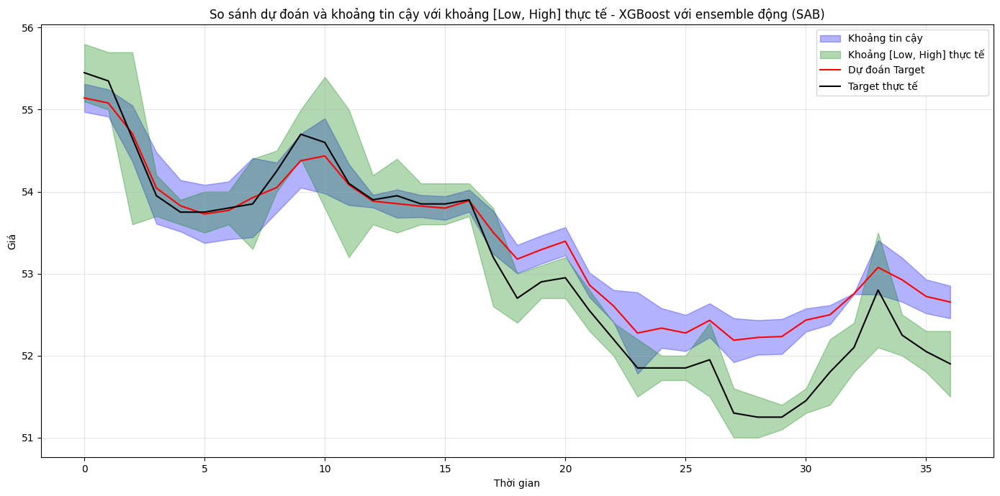


Top 10 đặc trưng quan trọng nhất:
            Feature  Importance
48   volatility_14d    0.146474
114           sma_3    0.083910
118           ema_5    0.051953
44   pct_change_14d    0.051924
20      target_ma_5    0.050967
8      target_lag_1    0.044209
22     target_ema_5    0.044034
131          max_10    0.043151
122          std_10    0.038908
7           doy_cos    0.036363
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 0.0864
MAE: 0.0735
R² Score: 0.9288
Khoảng tin cậy bao phủ [Low, High]: 10.81%
Dự đoán nằm trong [Low, High]: 51.35%
Tỷ lệ độ rộng (CI/Actual): 0.8300


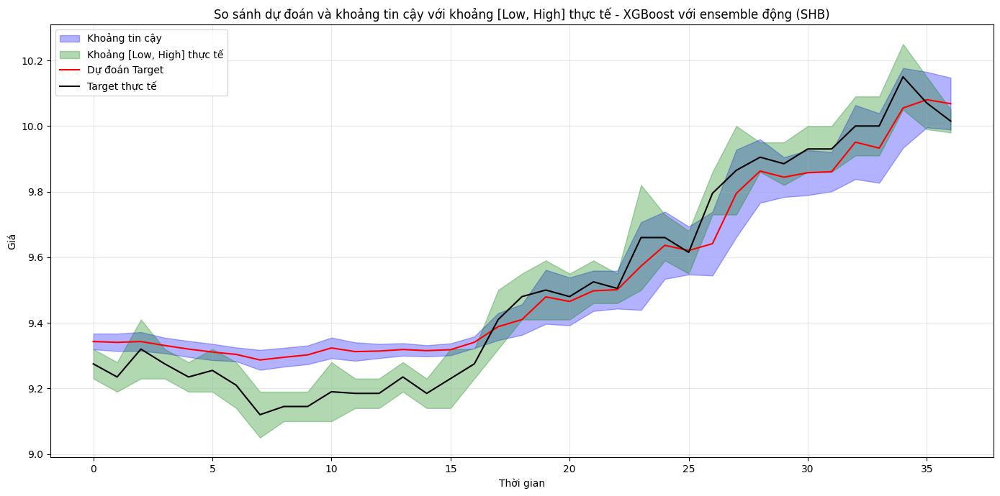


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
62      high_lag_1    0.367731
8     target_lag_1    0.102377
63       low_lag_1    0.093975
114          sma_3    0.083151
22    target_ema_5    0.040009
118          ema_5    0.033037
133         min_20    0.018513
88   target_lag_20    0.017577
130         min_10    0.015163
1        month_cos    0.013539
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 0.7437
MAE: 0.5859
R² Score: 0.4347
Khoảng tin cậy bao phủ [Low, High]: 0.00%
Dự đoán nằm trong [Low, High]: 32.43%
Tỷ lệ độ rộng (CI/Actual): 0.5433


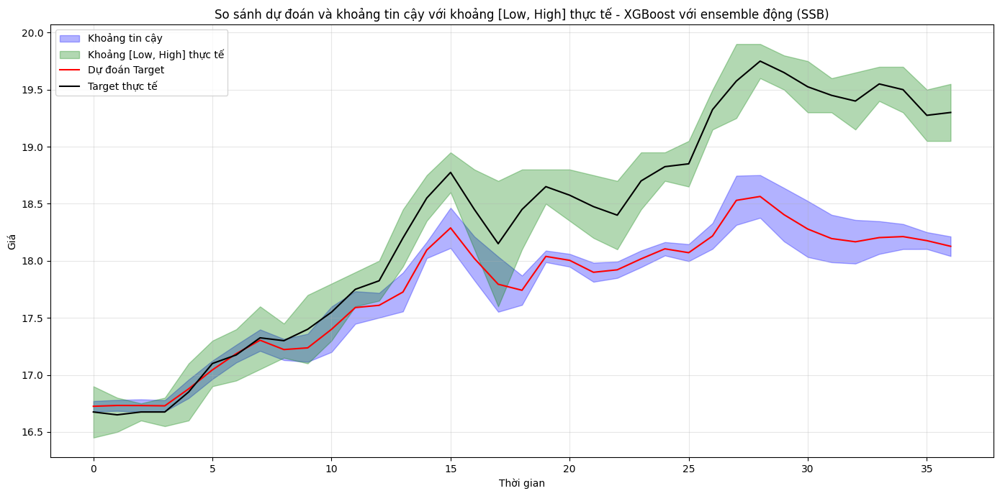


Top 10 đặc trưng quan trọng nhất:
              Feature  Importance
7             doy_cos    0.251999
133            min_20    0.147029
8        target_lag_1    0.143117
46     pct_change_21d    0.046906
130            min_10    0.042087
63          low_lag_1    0.040842
45   price_change_21d    0.036518
54             roc_20    0.022479
9        target_lag_2    0.017766
123            std_20    0.016640
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 0.3467
MAE: 0.3088
R² Score: 0.6340
Khoảng tin cậy bao phủ [Low, High]: 8.11%
Dự đoán nằm trong [Low, High]: 40.54%
Tỷ lệ độ rộng (CI/Actual): 0.8954


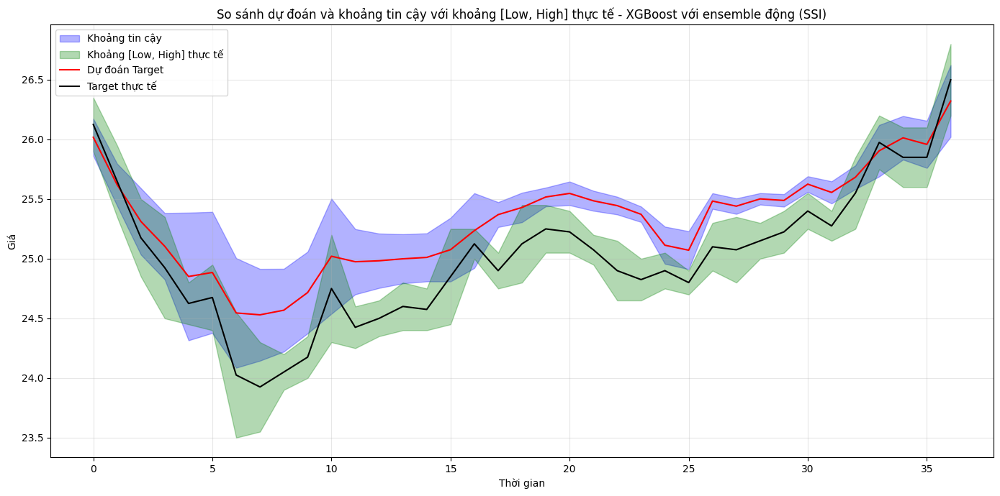


Top 10 đặc trưng quan trọng nhất:
          Feature  Importance
8    target_lag_1    0.155599
62     high_lag_1    0.131236
115         sma_5    0.116295
114         sma_3    0.085949
63      low_lag_1    0.079764
22   target_ema_5    0.070014
29   target_ma_30    0.032645
54         roc_20    0.027701
55         rsi_20    0.017932
56         roc_30    0.017790
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 2.2771
MAE: 1.9853
R² Score: -2.2065
Khoảng tin cậy bao phủ [Low, High]: 0.00%
Dự đoán nằm trong [Low, High]: 5.41%
Tỷ lệ độ rộng (CI/Actual): 0.7515


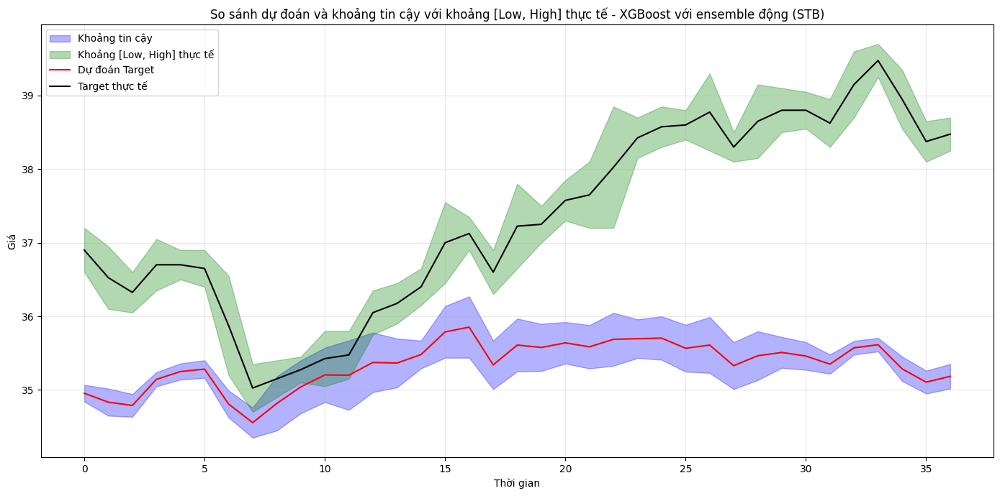


Top 10 đặc trưng quan trọng nhất:
          Feature  Importance
1       month_cos    0.502937
7         doy_cos    0.117243
9    target_lag_2    0.101207
20    target_ma_5    0.069474
22   target_ema_5    0.030050
62     high_lag_1    0.016737
63      low_lag_1    0.014154
8    target_lag_1    0.012040
114         sma_3    0.011217
60          trend    0.007598
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 1.0522
MAE: 0.7370
R² Score: -0.0432
Khoảng tin cậy bao phủ [Low, High]: 2.70%
Dự đoán nằm trong [Low, High]: 45.95%
Tỷ lệ độ rộng (CI/Actual): 0.7287


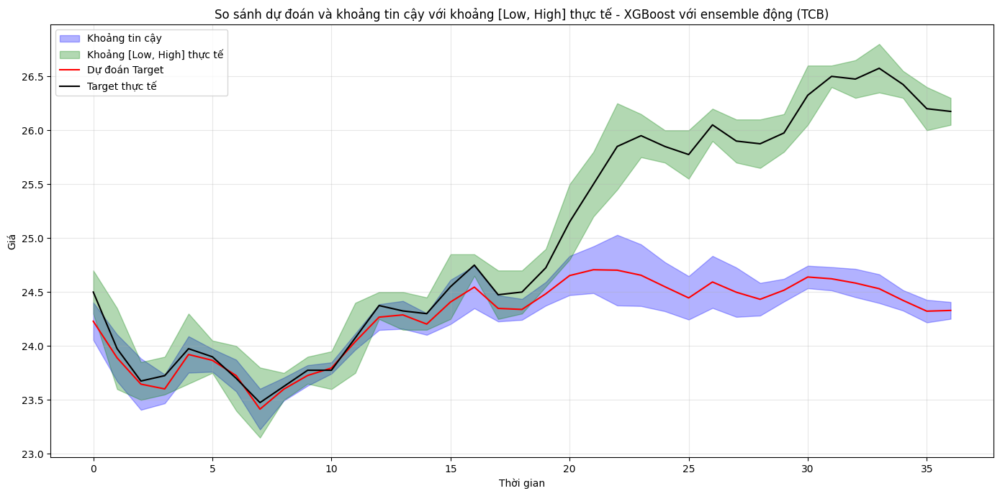


Top 10 đặc trưng quan trọng nhất:
              Feature  Importance
8        target_lag_1    0.118600
63          low_lag_1    0.114792
62         high_lag_1    0.114519
114             sma_3    0.112020
22       target_ema_5    0.062524
55             rsi_20    0.036009
44     pct_change_14d    0.019084
43   price_change_14d    0.016206
24      target_std_10    0.015174
46     pct_change_21d    0.015033
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 0.1883
MAE: 0.1455
R² Score: 0.7509
Khoảng tin cậy bao phủ [Low, High]: 8.11%
Dự đoán nằm trong [Low, High]: 59.46%
Tỷ lệ độ rộng (CI/Actual): 0.8420


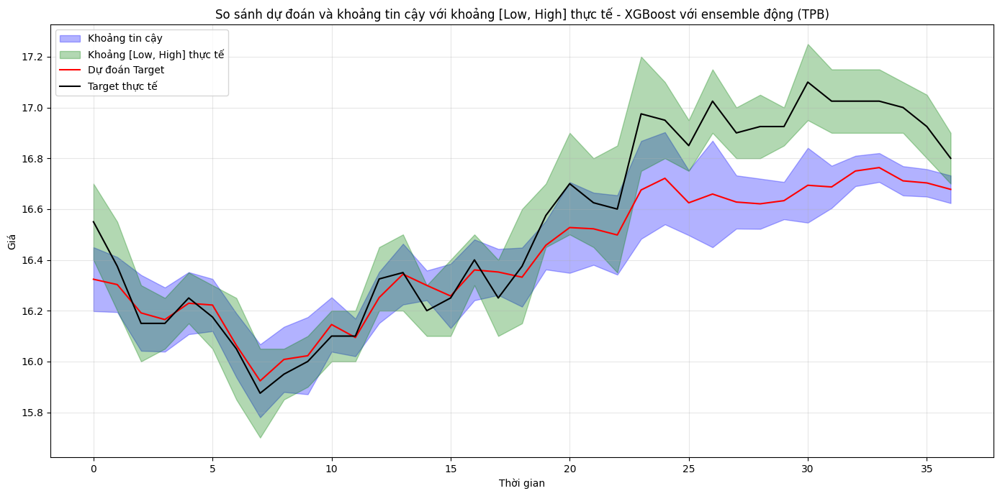


Top 10 đặc trưng quan trọng nhất:
            Feature  Importance
7           doy_cos    0.381824
8      target_lag_1    0.133488
114           sma_3    0.048624
49   volatility_30d    0.046284
20      target_ma_5    0.041423
29     target_ma_30    0.041370
56           roc_30    0.024569
57           rsi_30    0.023069
6           doy_sin    0.020416
22     target_ema_5    0.020391
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 0.1095
MAE: 0.0823
R² Score: 0.9384
Khoảng tin cậy bao phủ [Low, High]: 13.51%
Dự đoán nằm trong [Low, High]: 97.30%
Tỷ lệ độ rộng (CI/Actual): 0.8703


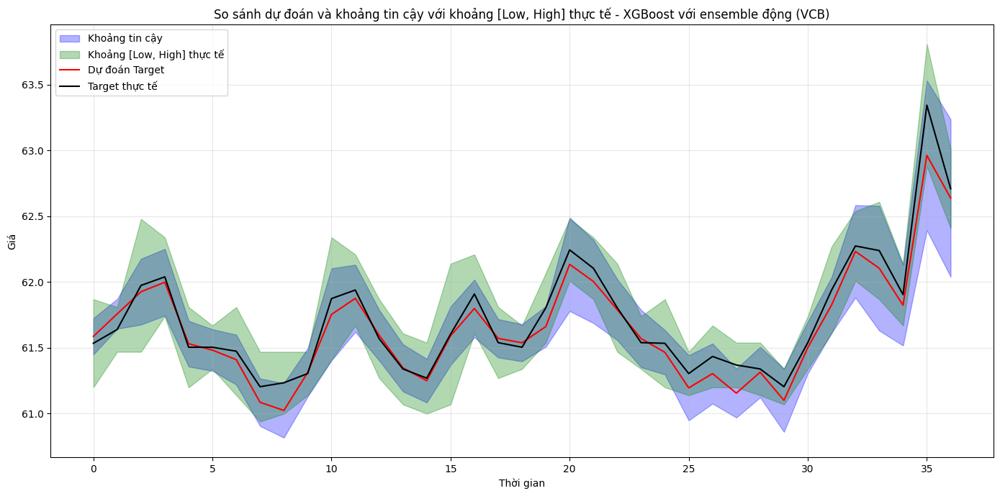


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
62      high_lag_1    0.352957
114          sma_3    0.137865
22    target_ema_5    0.077808
8     target_lag_1    0.076094
57          rsi_30    0.021885
30   target_std_30    0.020031
20     target_ma_5    0.017934
51           rsi_5    0.014779
118          ema_5    0.014274
40   pct_change_5d    0.010358
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 0.2227
MAE: 0.1683
R² Score: 0.9223
Khoảng tin cậy bao phủ [Low, High]: 21.62%
Dự đoán nằm trong [Low, High]: 81.08%
Tỷ lệ độ rộng (CI/Actual): 0.9934


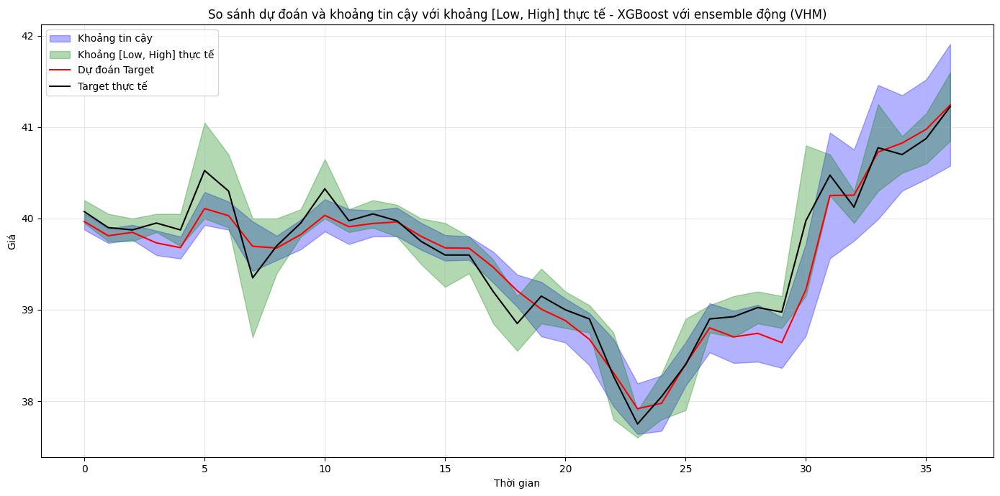


Top 10 đặc trưng quan trọng nhất:
            Feature  Importance
8      target_lag_1    0.154844
114           sma_3    0.142444
62       high_lag_1    0.130626
20      target_ma_5    0.115618
22     target_ema_5    0.076395
6           doy_sin    0.029483
63        low_lag_1    0.017631
96   target_delta_3    0.014782
118           ema_5    0.011881
100    high_delta_5    0.011607
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 0.9194
MAE: 0.8076
R² Score: -2.0965
Khoảng tin cậy bao phủ [Low, High]: 2.70%
Dự đoán nằm trong [Low, High]: 10.81%
Tỷ lệ độ rộng (CI/Actual): 0.7140


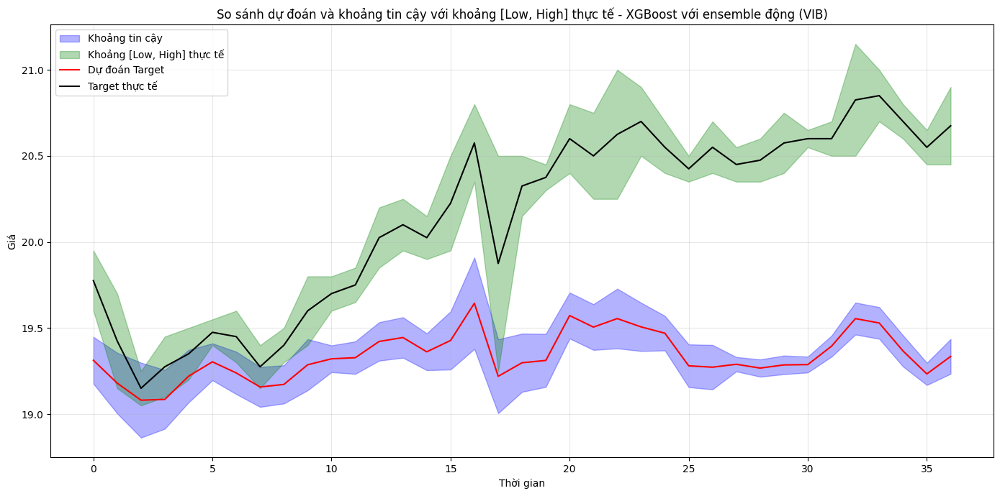


Top 10 đặc trưng quan trọng nhất:
            Feature  Importance
114           sma_3    0.137497
20      target_ma_5    0.079262
22     target_ema_5    0.078771
118           ema_5    0.077325
63        low_lag_1    0.034132
57           rsi_30    0.031852
62       high_lag_1    0.030358
56           roc_30    0.027012
8      target_lag_1    0.026490
46   pct_change_21d    0.024568
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 0.3746
MAE: 0.3442
R² Score: -0.6121
Khoảng tin cậy bao phủ [Low, High]: 2.70%
Dự đoán nằm trong [Low, High]: 13.51%
Tỷ lệ độ rộng (CI/Actual): 0.7426


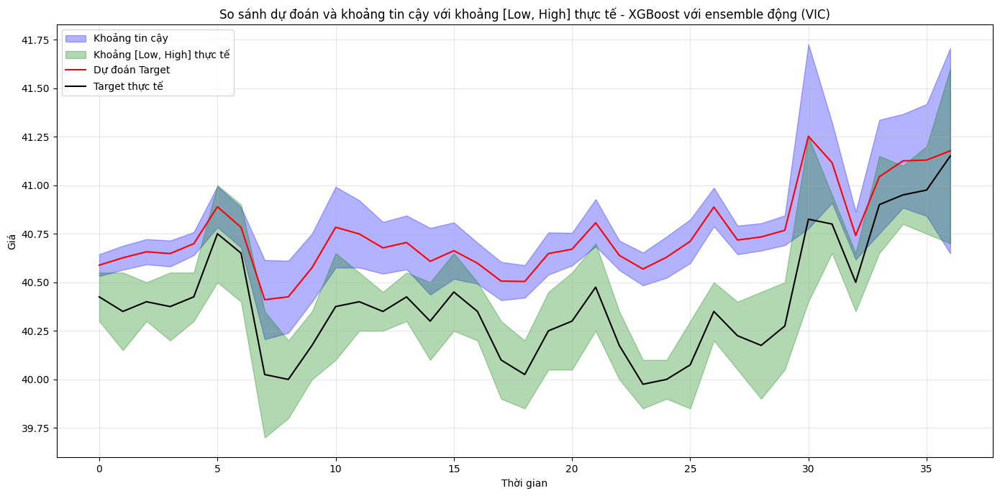


Top 10 đặc trưng quan trọng nhất:
          Feature  Importance
62     high_lag_1    0.161261
8    target_lag_1    0.100840
114         sma_3    0.096483
22   target_ema_5    0.068442
118         ema_5    0.050217
20    target_ma_5    0.036428
115         sma_5    0.018155
131        max_10    0.017618
71     high_lag_5    0.016594
123        std_20    0.015226
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 3.3636
MAE: 3.0398
R² Score: -8.0294
Khoảng tin cậy bao phủ [Low, High]: 0.00%
Dự đoán nằm trong [Low, High]: 2.70%
Tỷ lệ độ rộng (CI/Actual): 0.9340


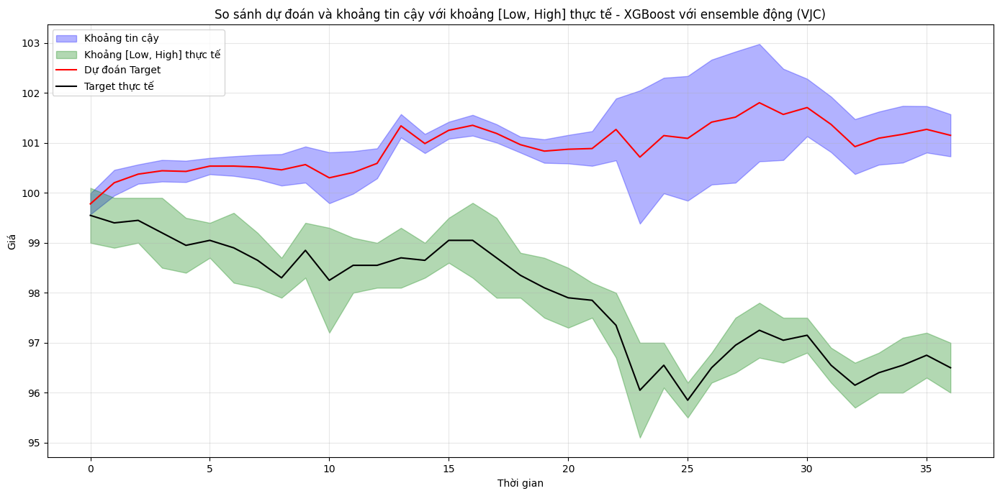


Top 10 đặc trưng quan trọng nhất:
            Feature  Importance
63        low_lag_1    0.158904
8      target_lag_1    0.119750
22     target_ema_5    0.112303
114           sma_3    0.097666
118           ema_5    0.066720
6           doy_sin    0.041706
20      target_ma_5    0.031657
48   volatility_14d    0.020872
10     target_lag_3    0.017810
56           roc_30    0.017242
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 1.7831
MAE: 1.6057
R² Score: -2.8500
Khoảng tin cậy bao phủ [Low, High]: 0.00%
Dự đoán nằm trong [Low, High]: 10.81%
Tỷ lệ độ rộng (CI/Actual): 0.7694


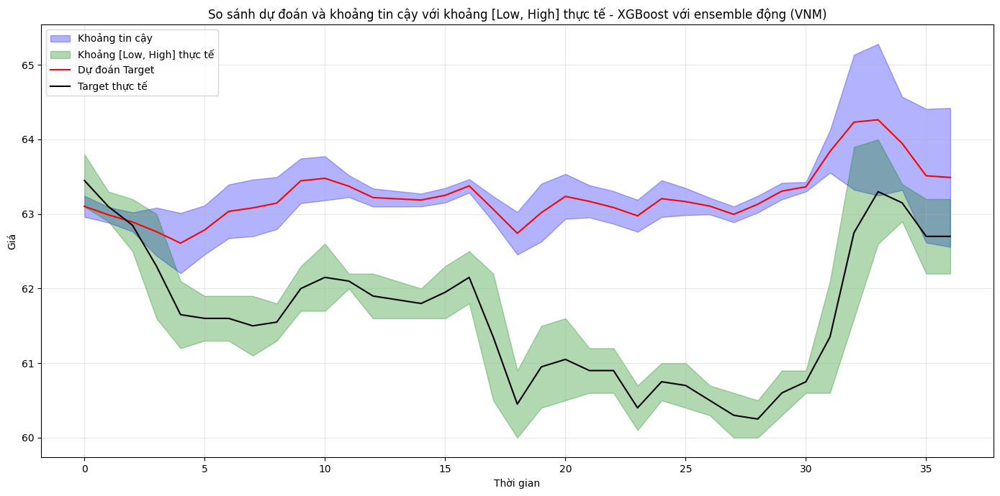


Top 10 đặc trưng quan trọng nhất:
          Feature  Importance
134        max_20    0.299017
8    target_lag_1    0.166697
62     high_lag_1    0.129553
22   target_ema_5    0.072462
20    target_ma_5    0.050925
64     high_lag_2    0.034001
32   target_ma_60    0.032607
66     high_lag_3    0.024643
131        max_10    0.024563
114         sma_3    0.014122
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 0.0549
MAE: 0.0418
R² Score: 0.9715
Khoảng tin cậy bao phủ [Low, High]: 18.92%
Dự đoán nằm trong [Low, High]: 97.30%
Tỷ lệ độ rộng (CI/Actual): 0.8762


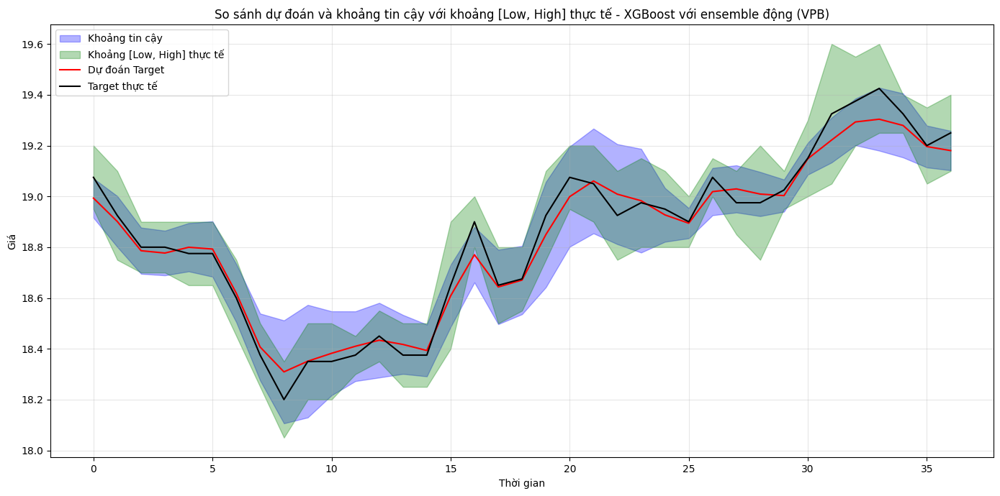


Top 10 đặc trưng quan trọng nhất:
          Feature  Importance
20    target_ma_5    0.241150
22   target_ema_5    0.104884
62     high_lag_1    0.101054
8    target_lag_1    0.101030
114         sma_3    0.035218
57         rsi_30    0.028859
6         doy_sin    0.023777
0       month_sin    0.022039
118         ema_5    0.018504
54         roc_20    0.011397
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 0.6828
MAE: 0.6072
R² Score: -3.0045
Khoảng tin cậy bao phủ [Low, High]: 0.00%
Dự đoán nằm trong [Low, High]: 10.81%
Tỷ lệ độ rộng (CI/Actual): 0.4469


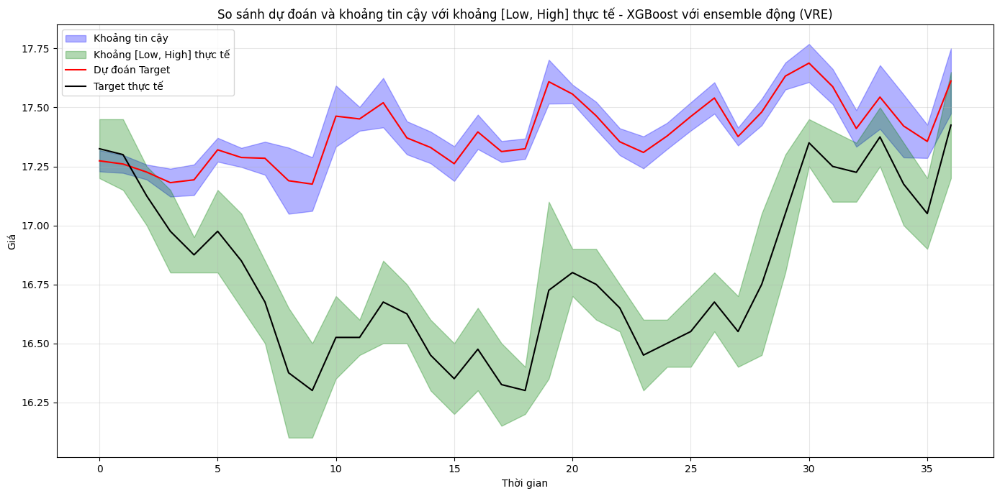


Top 10 đặc trưng quan trọng nhất:
           Feature  Importance
12    target_lag_7    0.554950
16   target_lag_30    0.073798
20     target_ma_5    0.050098
114          sma_3    0.042793
22    target_ema_5    0.039146
64      high_lag_2    0.034930
118          ema_5    0.030381
9     target_lag_2    0.029377
62      high_lag_1    0.024457
10    target_lag_3    0.012461
Success rate: 10/30


In [24]:
per_r2 = 0

vn30 = ['ACB', 'BCM', 'BID', 'BVH', 'CTG', 'FPT', 'GAS', 'GVR', 'HDB', 'HPG', 'LPB', 'MBB', 'MSN', 'MWG', 'PLX', 'SAB', 'SHB', 'SSB', 'SSI', 'STB', 'TCB', 'TPB', 'VCB', 'VHM', 'VIB', 'VIC', 'VJC', 'VNM', 'VPB', 'VRE']

for symbol in vn30:
	df_train = pd.read_csv(f'../data/2024/vn30/{symbol}.csv')
	df_test = pd.read_csv(f'../data/2025/vn30/{symbol}.csv')

	df_train_processed, df_test_processed = preprocess(df_train, df_test)

	# Chạy XGBoost với đầy đủ cải tiến
	results = run_improved_prediction(df_train_processed, df_test_processed, window_size=20, symbol=symbol)

	r2 = results['metrics']['r2']
	if r2 > 0.75:
		per_r2 += 1

print(f"Success rate: {per_r2}/{len(vn30)}")

## 2. Macro Index Prediction

Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 5.0466
MAE: 3.7427
R² Score: 0.9446
Khoảng tin cậy bao phủ [Low, High]: 0.00%
Dự đoán nằm trong [Low, High]: 72.97%
Tỷ lệ độ rộng (CI/Actual): 0.8949


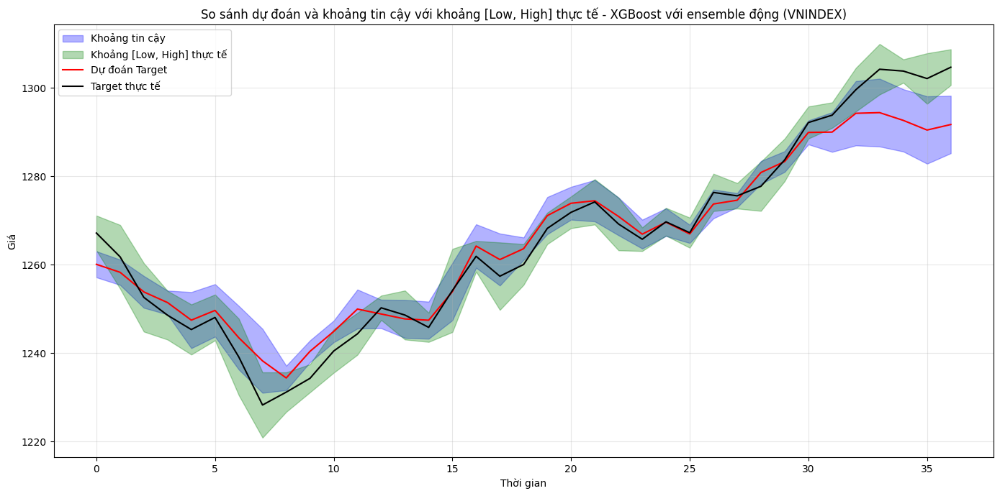


Top 10 đặc trưng quan trọng nhất:
              Feature  Importance
114             sma_3    0.148119
57             rsi_30    0.146610
56             roc_30    0.096885
22       target_ema_5    0.085719
62         high_lag_1    0.058366
54             roc_20    0.054871
63          low_lag_1    0.054095
45   price_change_21d    0.036794
8        target_lag_1    0.029714
20        target_ma_5    0.026898
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 1.4941
MAE: 1.1301
R² Score: 0.9521
Khoảng tin cậy bao phủ [Low, High]: 8.11%
Dự đoán nằm trong [Low, High]: 78.38%
Tỷ lệ độ rộng (CI/Actual): 0.6171


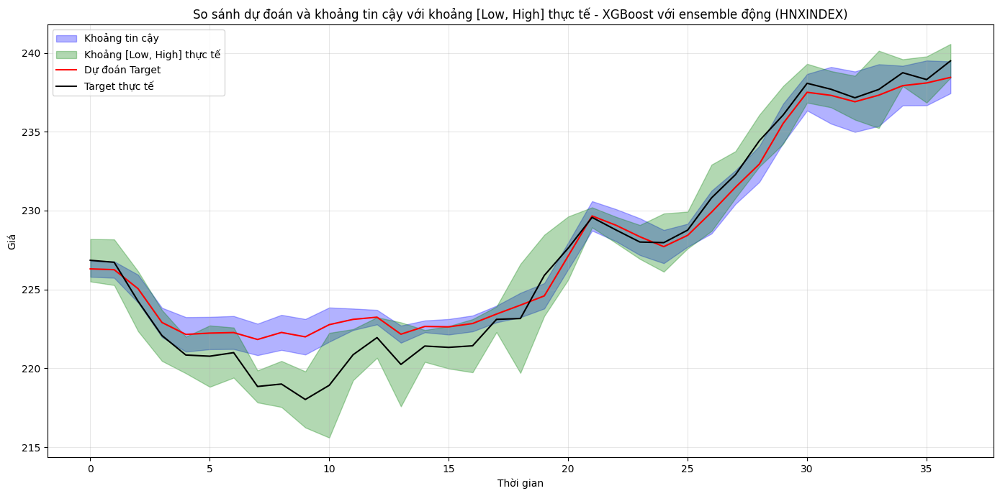


Top 10 đặc trưng quan trọng nhất:
          Feature  Importance
114         sma_3    0.221450
8    target_lag_1    0.207836
62     high_lag_1    0.199201
63      low_lag_1    0.056869
22   target_ema_5    0.038143
6         doy_sin    0.030748
118         ema_5    0.024546
20    target_ma_5    0.012777
115         sma_5    0.011652
130        min_10    0.010693
Chuẩn bị đặc trưng động...

Huấn luyện hệ thống đa mô hình...
Huấn luyện model target...
Huấn luyện model high...
Huấn luyện model low...
Huấn luyện model trend...
Huấn luyện model fluctuation...

Dự đoán với ensemble động...
Tính khoảng tin cậy thích ứng...
Hiệu chỉnh cuối cùng...

Đánh giá mô hình:

--- Dự đoán với ensemble động ---
RMSE: 0.8324
MAE: 0.5376
R² Score: 0.9177
Khoảng tin cậy bao phủ [Low, High]: 2.70%
Dự đoán nằm trong [Low, High]: 59.46%
Tỷ lệ độ rộng (CI/Actual): 0.8390


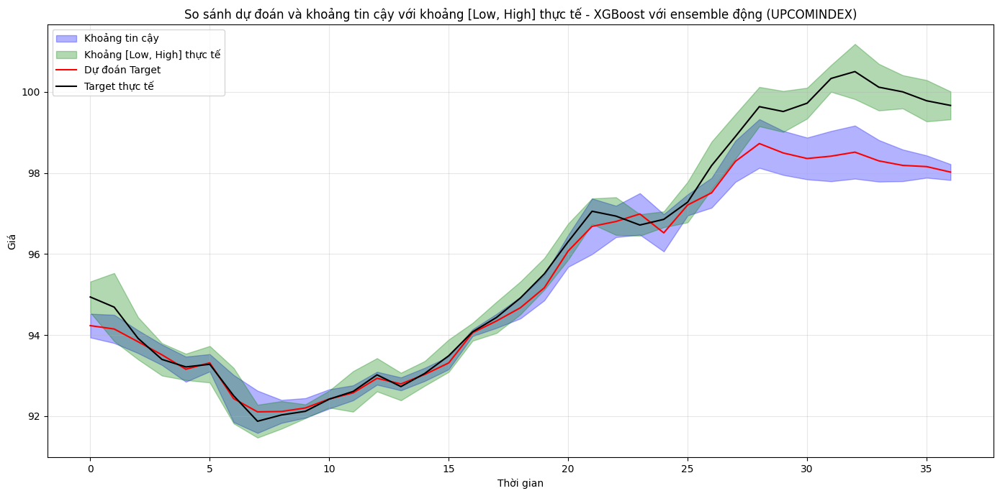


Top 10 đặc trưng quan trọng nhất:
          Feature  Importance
8    target_lag_1    0.220557
118         ema_5    0.125464
62     high_lag_1    0.120146
114         sma_3    0.118310
66     high_lag_3    0.100695
63      low_lag_1    0.050804
116        sma_10    0.048894
20    target_ma_5    0.015162
7         doy_cos    0.013140
22   target_ema_5    0.012986


In [21]:
for index in ['VNINDEX', 'HNXINDEX', 'UPCOMINDEX']:
	df = pd.read_csv(f'../data/2024/index/{index}.csv')
	df_train = df[['time', 'high', 'low']]
	df = pd.read_csv(f'../data/2025/index/{index}.csv')
	df_test = df[['time', 'high', 'low']]

	df_train_processed, df_test_processed = preprocess(df_train, df_test)

	# Chạy XGBoost với đầy đủ cải tiến
	results = run_improved_prediction(df_train_processed, df_test_processed, window_size=20, symbol=index)

# XGBoost v3

In [66]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from scipy.stats import norm
from scipy import signal
import pywt
import torch
import torch.nn as nn
import torch.optim as optim
from statsmodels.tsa.arima.model import ARIMA
from arch import arch_model
from scipy.stats import skew, kurtosis
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from scipy.signal import periodogram
from bayes_opt import BayesianOptimization
import warnings
warnings.filterwarnings('ignore')

class TimeSeriesAutoencoder(nn.Module):
    """Autoencoder cho dữ liệu chuỗi thời gian"""
    def __init__(self, input_dim, encoding_dim=8, seq_len=20):
        super(TimeSeriesAutoencoder, self).__init__()
        self.seq_len = seq_len
        
        # Encoder: LSTM + FC
        self.encoder_lstm = nn.LSTM(
            input_size=input_dim,
            hidden_size=32,
            num_layers=2,
            batch_first=True,
            dropout=0.2
        )
        self.encoder_fc = nn.Sequential(
            nn.Linear(32, 16),
            nn.ReLU(),
            nn.Linear(16, encoding_dim)
        )
        
        # Decoder: FC + LSTM
        self.decoder_fc = nn.Sequential(
            nn.Linear(encoding_dim, 16),
            nn.ReLU(),
            nn.Linear(16, 32)
        )
        self.decoder_lstm = nn.LSTM(
            input_size=32,
            hidden_size=input_dim,
            num_layers=2,
            batch_first=True,
            dropout=0.2
        )
    
    def forward(self, x):
        # Encode
        _, (h_n, _) = self.encoder_lstm(x)
        h_n = h_n[-1]  # Lấy trạng thái ẩn cuối cùng
        encoded = self.encoder_fc(h_n)
        
        # Decode
        decoded_h = self.decoder_fc(encoded)
        decoded_h = decoded_h.unsqueeze(1).repeat(1, self.seq_len, 1)
        decoded, _ = self.decoder_lstm(decoded_h)
        
        return encoded, decoded

def train_autoencoder(X, seq_len=20, feature_dim=None, encoding_dim=8, epochs=100, batch_size=64):
    """Huấn luyện autoencoder và trả về embedding"""
    if feature_dim is None:
        feature_dim = X.shape[1]  # Số đặc trưng
    
    # Chuẩn bị dữ liệu trình tự
    sequences = []
    for i in range(len(X) - seq_len + 1):
        sequences.append(X[i:i+seq_len])
    sequences = np.array(sequences)
    
    # Chuyển sang PyTorch tensors
    X_tensor = torch.FloatTensor(sequences)
    
    # Khởi tạo model và optimizer
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = TimeSeriesAutoencoder(feature_dim, encoding_dim, seq_len).to(device)
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    criterion = nn.MSELoss()
    
    # Huấn luyện
    for epoch in range(epochs):
        model.train()
        total_loss = 0
        
        # Tạo batches
        permutation = torch.randperm(X_tensor.size()[0])
        for i in range(0, X_tensor.size()[0], batch_size):
            indices = permutation[i:i+batch_size]
            batch_x = X_tensor[indices].to(device)
            
            optimizer.zero_grad()
            encoded, decoded = model(batch_x)
            loss = criterion(decoded, batch_x)
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item() * len(indices)
        
        if (epoch + 1) % 20 == 0:
            print(f'Epoch {epoch+1}/{epochs}, Loss: {total_loss/len(X_tensor):.6f}')
    
    # Tạo embeddings cho tất cả dữ liệu
    model.eval()
    with torch.no_grad():
        embeddings = []
        for i in range(0, X_tensor.size()[0], batch_size):
            batch_x = X_tensor[i:i+batch_size].to(device)
            encoded, _ = model(batch_x)
            embeddings.append(encoded.cpu().numpy())
    
    embeddings = np.vstack(embeddings)
    
    # Ánh xạ embeddings về các mẫu gốc (mỗi điểm trong X)
    # Một điểm dữ liệu có thể xuất hiện trong nhiều chuỗi
    # Lấy embedding trung bình cho mỗi điểm
    aligned_embeddings = np.zeros((len(X), encoding_dim))
    counts = np.zeros(len(X))
    
    for i in range(len(embeddings)):
        for j in range(seq_len):
            idx = i + j
            if idx < len(X):
                aligned_embeddings[idx] += embeddings[i]
                counts[idx] += 1
    
    # Chia trung bình
    for i in range(len(X)):
        if counts[i] > 0:
            aligned_embeddings[i] /= counts[i]
    
    return aligned_embeddings, model

def extract_fourier_features(series, num_coefficients=10):
    """Trích xuất đặc trưng từ biến đổi Fourier"""
    # Tính FFT
    fft_result = np.fft.fft(series)
    # Lấy biên độ
    magnitudes = np.abs(fft_result)
    # Lấy góc pha
    phases = np.angle(fft_result)
    
    # Lấy các hệ số có biên độ lớn nhất (trừ hệ số đầu tiên - giá trị trung bình)
    top_indices = np.argsort(magnitudes[1:])[-num_coefficients:] + 1
    
    # Tạo đặc trưng
    fourier_features = np.zeros(num_coefficients * 2)
    for i, idx in enumerate(top_indices):
        fourier_features[i] = magnitudes[idx]
        fourier_features[i + num_coefficients] = phases[idx]
    
    return fourier_features

def extract_wavelet_features(series, wavelet='db4', level=5):
    """Trích xuất đặc trưng từ biến đổi wavelet"""
    # Thực hiện phân tích wavelet đa phân giải
    coeffs = pywt.wavedec(series, wavelet, level=level)
    
    # Trích xuất các thống kê từ các hệ số
    features = []
    for i, coeff in enumerate(coeffs):
        features.append(np.mean(coeff))
        features.append(np.std(coeff))
        features.append(np.max(coeff))
        features.append(np.min(coeff))
        if len(coeff) > 1:
            features.append(skew(coeff))
            features.append(kurtosis(coeff))
    
    return np.array(features)

def extract_arima_features(series, order=(1, 0, 1)):
    """Trích xuất đặc trưng từ mô hình ARIMA"""
    try:
        # Huấn luyện mô hình ARIMA
        model = ARIMA(series, order=order)
        result = model.fit()
        
        # Lấy các tham số và dự đoán
        params = result.params
        residuals = result.resid
        predictions = result.predict(start=len(series), end=len(series)+5)
        
        # Tạo đặc trưng
        features = np.concatenate([
            params,
            [np.mean(residuals), np.std(residuals)],
            predictions
        ])
        
        # Đảm bảo features có đúng kích thước (5)
        features = features[:5]  # Lấy chỉ 5 phần tử đầu
        if len(features) < 5:  # Nếu không đủ 5 phần tử thì thêm số 0 vào
            features = np.pad(features, (0, 5 - len(features)))
            
        return features
    except:
        # Nếu không thể fit ARIMA, trả về vector 0
        return np.zeros(5)

def extract_garch_features(series):
    """Trích xuất đặc trưng từ mô hình GARCH cho biến động"""
    try:
        # Chuẩn bị dữ liệu
        returns = 100 * series.pct_change().dropna()
        
        # Huấn luyện GARCH(1,1)
        model = arch_model(returns, vol='Garch', p=1, q=1)
        result = model.fit(disp='off')
        
        # Lấy các tham số và dự đoán volatility
        params = result.params
        forecasts = result.forecast(horizon=5)
        vol_forecasts = forecasts.variance.values[-1]
        
        # Tạo đặc trưng
        features = np.concatenate([params, vol_forecasts])
        
        return features
    except:
        # Nếu không thể fit GARCH, trả về vector 0
        return np.zeros(8)

def extract_periodicity_features(series, fs=1.0):
    """Trích xuất đặc trưng về tính chu kỳ"""
    try:
        # Tính periodogram
        freqs, psd = periodogram(series, fs)
        
        # Tìm các đỉnh (chu kỳ tiềm năng)
        peaks, _ = signal.find_peaks(psd)
        
        # Lấy N đỉnh cao nhất
        N = 5
        if len(peaks) >= N:
            top_peaks = peaks[np.argsort(psd[peaks])[-N:]]
        else:
            # Nếu không đủ đỉnh, thêm các chỉ số 0
            additional_peaks = np.zeros(N - len(peaks), dtype=int)
            if len(peaks) > 0:
                top_peaks = np.concatenate([peaks[np.argsort(psd[peaks])], additional_peaks])
            else:
                top_peaks = additional_peaks
        
        # Tạo đặc trưng
        features = np.zeros(N * 2)
        for i, peak in enumerate(top_peaks):
            if i < N:
                if peak < len(freqs):  # Đảm bảo chỉ số hợp lệ
                    features[i] = freqs[peak]  # Tần số
                    features[i + N] = psd[peak] if peak < len(psd) else 0  # Năng lượng
        
        return features
    except:
        return np.zeros(10)  # Trả về mảng 0 có kích thước 10

def extract_hmm_features(series, n_states=3):
    """Trích xuất đặc trưng từ Hidden Markov Model"""
    from hmmlearn import hmm
    
    try:
        # Chuẩn bị dữ liệu
        X = np.column_stack([series, np.diff(series, prepend=series[0])])
        
        # Huấn luyện HMM
        model = hmm.GaussianHMM(n_components=n_states, covariance_type="full", n_iter=100)
        model.fit(X)
        
        # Lấy trạng thái ẩn
        hidden_states = model.predict(X)
        
        # Tạo đặc trưng
        features = np.zeros(n_states * 4)
        for i in range(n_states):
            state_mask = (hidden_states == i)
            if np.any(state_mask):
                features[i] = np.mean(series[state_mask])
                features[i + n_states] = np.std(series[state_mask])
                features[i + 2*n_states] = np.sum(state_mask) / len(series)  # Tỷ lệ
                
                # Tính ma trận chuyển tiếp
                if i < n_states - 1:
                    transitions = np.sum(hidden_states[:-1] == i & hidden_states[1:] == i+1)
                    features[i + 3*n_states] = transitions / max(1, np.sum(hidden_states[:-1] == i))
        
        return features
    except:
        return np.zeros(n_states * 4)

def calculate_change_point_features(series, window_size=10):
    """Phát hiện điểm thay đổi và trích xuất đặc trưng"""
    try:
        from ruptures import Binseg
        
        # Phát hiện điểm thay đổi
        model = Binseg(model="l2").fit(series.reshape(-1, 1))
        change_points = model.predict(n_bkps=5)
        
        # Tạo đặc trưng
        features = np.zeros(15)
        for i, cp in enumerate(change_points):
            if i < 5:
                features[i] = cp / len(series)  # Vị trí tương đối
        
        # Đặc trưng về cường độ thay đổi
        segments = []
        last_cp = 0
        for cp in change_points[:-1]:
            segments.append(series[last_cp:cp])
            last_cp = cp
        segments.append(series[last_cp:])
        
        # Tính sự khác biệt giữa các phân đoạn
        for i in range(len(segments) - 1):
            if i < 5:
                features[i+5] = np.abs(np.mean(segments[i+1]) - np.mean(segments[i]))
                features[i+10] = np.abs(np.std(segments[i+1]) - np.std(segments[i]))
        
        return features
    except:
        return np.zeros(15)

def prepare_ultra_features(df, window_size=20):
    """Tạo đặc trưng siêu nâng cao với tất cả kỹ thuật đề xuất"""
    df_features = df.copy()
    
    # 1. Đặc trưng cơ bản từ high, low, target
    df_features['hl_range'] = df_features['high'] - df_features['low']
    df_features['hl_pct'] = df_features['hl_range'] / df_features['target'] * 100
    
    # Lag features với mật độ cao hơn cho gần đây
    # Thêm tất cả lag từ 1-20 thay vì chỉ một vài giá trị rời rạc
    for lag in range(1, window_size + 1):
        df_features[f'target_lag_{lag}'] = df_features['target'].shift(lag)
        df_features[f'high_lag_{lag}'] = df_features['high'].shift(lag)
        df_features[f'low_lag_{lag}'] = df_features['low'].shift(lag)
        
        # Thêm lag của độ biến động
        df_features[f'hl_range_lag_{lag}'] = df_features['hl_range'].shift(lag)
        
        # Diff features (tốc độ thay đổi)
        if lag <= 10:  # Thêm nhiều diff cho gần đây
            df_features[f'target_diff_{lag}'] = df_features['target'].diff(lag)
            df_features[f'high_diff_{lag}'] = df_features['high'].diff(lag)
            df_features[f'low_diff_{lag}'] = df_features['low'].diff(lag)
    
    # 2. Các đặc trưng thống kê cửa sổ trượt
    for window in [5, 10, 20, 30, 60]:
        # Moving averages với nhiều loại khác nhau
        df_features[f'target_ma_{window}'] = df_features['target'].rolling(window=window).mean()
        df_features[f'target_ema_{window}'] = df_features['target'].ewm(span=window, adjust=False).mean()
        df_features[f'target_wma_{window}'] = df_features['target'].rolling(window=window).apply(
            lambda x: np.average(x, weights=np.linspace(1, 10, len(x)))
        )
        
        # Volatility và độ biến động
        df_features[f'target_std_{window}'] = df_features['target'].rolling(window=window).std()
        df_features[f'target_var_{window}'] = df_features['target'].rolling(window=window).var()
        df_features[f'hl_range_ma_{window}'] = df_features['hl_range'].rolling(window=window).mean()
        
        # Các hệ số thống kê cao cấp
        df_features[f'target_skew_{window}'] = df_features['target'].rolling(window=window).skew()
        df_features[f'target_kurt_{window}'] = df_features['target'].rolling(window=window).kurt()
        
        # Z-score (chuẩn hóa)
        rolling_mean = df_features['target'].rolling(window=window).mean()
        rolling_std = df_features['target'].rolling(window=window).std()
        df_features[f'target_zscore_{window}'] = (df_features['target'] - rolling_mean) / rolling_std
    
    # 3. Đặc trưng kỹ thuật
    # Momentum
    for period in [5, 10, 20, 30]:
        df_features[f'momentum_{period}'] = df_features['target'] - df_features['target'].shift(period)
        df_features[f'roc_{period}'] = df_features['target'].pct_change(periods=period) * 100
    
    # Rate of Change (ROC) Acceleration
    df_features['roc_accel_10_5'] = df_features['roc_10'] - df_features['roc_5']
    df_features['roc_accel_20_10'] = df_features['roc_20'] - df_features['roc_10']
    
    # 4. Đặc trưng không đối xứng và độ lệch
    df_features['upper_shadow'] = df_features['high'] - df_features['target']
    df_features['lower_shadow'] = df_features['target'] - df_features['low']
    df_features['shadow_ratio'] = df_features['upper_shadow'] / df_features['lower_shadow'].replace(0, 0.001)
    
    # 5. Tính toán tỷ lệ trung bình với nhiều cửa sổ
    for window in [5, 10, 20]:
        # Tính tỷ lệ giá hiện tại so với các giá trị quá khứ
        df_features[f'price_to_ma_ratio_{window}'] = df_features['target'] / df_features[f'target_ma_{window}']
        
        # Tính biến động của tỷ lệ high/low
        high_low_ratio = df_features['high'] / df_features['low']
        df_features[f'hl_ratio_std_{window}'] = high_low_ratio.rolling(window=window).std()
    
    # 6. Tạo đặc trưng trend
    # Xác định xu hướng dựa trên nhiều MA
    df_features['trend_signal_10_30'] = np.where(
        df_features['target_ma_10'] > df_features['target_ma_30'], 1,
        np.where(df_features['target_ma_10'] < df_features['target_ma_30'], -1, 0)
    )
    
    # Tính độ dài xu hướng
    trend_length = 0
    trend_direction = 0
    trend_lengths = []
    
    for i in range(len(df_features)):
        current_direction = df_features['trend_signal_10_30'].iloc[i] if i > 0 else 0
        
        if current_direction == trend_direction and current_direction != 0:
            trend_length += 1
        else:
            trend_length = 1 if current_direction != 0 else 0
            trend_direction = current_direction
            
        trend_lengths.append(trend_length)
    
    df_features['trend_length'] = trend_lengths
    
    # 7. Tạo ma trận giá (price matrix) cho mỗi cửa sổ
    price_matrices = []
    for i in range(len(df_features) - window_size + 1):
        if i < len(df_features):
            price_matrix = df_features[['target', 'high', 'low']].iloc[i:i+window_size].values
            price_matrices.append(price_matrix.flatten())
    
    # Thêm vector 0 cho các hàng đầu không đủ dữ liệu
    padding = [np.zeros(window_size * 3) for _ in range(window_size - 1)]
    price_matrices = padding + price_matrices
    price_matrices = np.array(price_matrices)
    
    # Kết hợp với dataframe
    for i in range(min(20, price_matrices.shape[1])):  # Chỉ lấy 20 đặc trưng đầu
        df_features[f'price_matrix_{i}'] = price_matrices[:, i]
    
    # Xử lý NaN
    df_features = df_features.replace([np.inf, -np.inf], np.nan)
    
    # 8. Tạo đặc trưng từ phân tích tần số và biến đổi thời gian
    # Chuẩn bị dữ liệu cho các đặc trưng nâng cao
    target_series = df_features['target'].dropna().values
    
    # Fourier features
    fourier_features = []
    for i in range(len(df_features) - window_size + 1):
        if i + window_size <= len(target_series):
            window_data = target_series[i:i+window_size]
            fourier_features.append(extract_fourier_features(window_data, num_coefficients=5))
        else:
            fourier_features.append(np.zeros(10))
    
    # Thêm padding
    fourier_padding = [np.zeros(10) for _ in range(window_size - 1)]
    fourier_features = fourier_padding + fourier_features
    fourier_features = np.array(fourier_features)
    
    # Thêm vào DataFrame
    for i in range(fourier_features.shape[1]):
        df_features[f'fourier_{i}'] = fourier_features[:, i]
    
    # Wavelet features
    wavelet_features = []
    for i in range(len(df_features) - window_size + 1):
        if i + window_size <= len(target_series):
            window_data = target_series[i:i+window_size]
            wavelet_features.append(extract_wavelet_features(window_data, level=3)[:10])  # Chỉ lấy 10 đặc trưng đầu tiên
        else:
            wavelet_features.append(np.zeros(10))
    
    # Thêm padding
    wavelet_padding = [np.zeros(10) for _ in range(window_size - 1)]
    wavelet_features = wavelet_padding + wavelet_features
    wavelet_features = np.array(wavelet_features)
    
    # Thêm vào DataFrame
    for i in range(wavelet_features.shape[1]):
        df_features[f'wavelet_{i}'] = wavelet_features[:, i]
    
    # 9. Thêm đặc trưng từ mô hình thống kê
    # Tính các đặc trưng thống kê cho từng cửa sổ
    stat_features = []
    for i in range(len(df_features) - window_size + 1):
        if i + window_size <= len(target_series):
            window_data = target_series[i:i+window_size]
            
            # Kết hợp các đặc trưng thống kê
            arima_feats = extract_arima_features(window_data)  # Cố định kích thước 5
            periodicity_feats = extract_periodicity_features(window_data)  # Cố định kích thước 10
            
            # Đảm bảo kích thước cố định là 10 cho mỗi phần tử trong danh sách
            combined_feats = np.concatenate([arima_feats, periodicity_feats[:5]])  # Lấy 5 đầu tiên từ periodicity để có tổng 10
            stat_features.append(combined_feats)
        else:
            stat_features.append(np.zeros(10))
    
    # Thêm padding và đảm bảo kích thước cố định
    stat_padding = [np.zeros(10) for _ in range(window_size - 1)]
    stat_features = stat_padding + stat_features
    
    # Kiểm tra để đảm bảo tất cả các phần tử có cùng kích thước
    for i in range(len(stat_features)):
        if len(stat_features[i]) != 10:
            stat_features[i] = np.zeros(10)
    
    stat_features = np.array(stat_features)
    
    # Thêm vào DataFrame
    for i in range(stat_features.shape[1]):
        df_features[f'stat_{i}'] = stat_features[:, i]
    
    # 10. Đặc trưng phát hiện điểm thay đổi
    changepoint_features = []
    for i in range(len(df_features) - window_size + 1):
        if i + window_size <= len(target_series):
            window_data = target_series[i:i+window_size]
            cp_features = calculate_change_point_features(window_data)
            changepoint_features.append(cp_features[:10])  # Chỉ lấy 10 đặc trưng đầu
        else:
            changepoint_features.append(np.zeros(10))
    
    # Thêm padding
    cp_padding = [np.zeros(10) for _ in range(window_size - 1)]
    changepoint_features = cp_padding + changepoint_features
    
    # Kiểm tra để đảm bảo tất cả các phần tử có cùng kích thước
    for i in range(len(changepoint_features)):
        if len(changepoint_features[i]) != 10:
            changepoint_features[i] = np.zeros(10)
            
    changepoint_features = np.array(changepoint_features)
    
    # Thêm vào DataFrame
    for i in range(changepoint_features.shape[1]):
        df_features[f'changepoint_{i}'] = changepoint_features[:, i]
    
    # Loại bỏ NaN
    df_features = df_features.fillna(method='ffill').fillna(method='bfill').fillna(0)
    
    # Tách features và targets
    X = df_features.drop(['target', 'high', 'low'], axis=1)
    y_target = df_features['target']
    y_high = df_features['high']
    y_low = df_features['low']
    
    # 11. Thêm embeddings từ autoencoder nếu đủ dữ liệu
    if len(X) > window_size * 2:
        try:
            # Chuẩn hóa dữ liệu
            scaler = StandardScaler()
            X_scaled = scaler.fit_transform(X)
            
            # Huấn luyện autoencoder và lấy embeddings
            print("Huấn luyện autoencoder để trích xuất đặc trưng sâu...")
            embeddings, _ = train_autoencoder(X_scaled, seq_len=window_size, 
                                             feature_dim=X.shape[1], encoding_dim=8, 
                                             epochs=50, batch_size=32)
            
            # Thêm vào DataFrame
            for i in range(embeddings.shape[1]):
                X[f'autoencoder_{i}'] = embeddings[:, i]
                
            print(f"Đã thêm {embeddings.shape[1]} đặc trưng từ autoencoder")
        except Exception as e:
            print(f"Không thể tạo embeddings từ autoencoder: {e}")
    
    return X, y_target, y_high, y_low, df_features

def optimize_xgboost_hyperparams(X_train, y_train, optimization_metric='rmse'):
    """Tối ưu hóa siêu tham số XGBoost sử dụng Bayesian Optimization"""
    print("Bắt đầu tối ưu hóa Bayesian cho XGBoost...")
    
    def xgb_evaluate(max_depth, learning_rate, n_estimators, gamma, min_child_weight, subsample, colsample_bytree, reg_alpha, reg_lambda):
        # Chuyển đổi các tham số về định dạng phù hợp
        params = {
            'max_depth': int(max_depth),
            'learning_rate': learning_rate,
            'n_estimators': int(n_estimators),
            'gamma': gamma,
            'min_child_weight': min_child_weight,
            'subsample': subsample,
            'colsample_bytree': colsample_bytree,
            'reg_alpha': reg_alpha,
            'reg_lambda': reg_lambda,
            'objective': 'reg:squarederror',
            'tree_method': 'hist',
            'random_state': 42
        }
        
        # Tạo ngẫu nhiên bộ chia tập dữ liệu
        tscv = TimeSeriesSplit(n_splits=5)
        split = list(tscv.split(X_train))
        train_idx, val_idx = split[-1]  # Lấy split cuối cùng
        
        X_train_cv, X_val_cv = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_train_cv, y_val_cv = y_train.iloc[train_idx], y_train.iloc[val_idx]
        
        # Huấn luyện và đánh giá mô hình
        model = xgb.XGBRegressor(**params)
        
        # Sử dụng cú pháp phù hợp với phiên bản XGBoost mới
        try:
            # Cách mới: sử dụng callbacks cho early stopping
            from xgboost.callback import EarlyStopping
            early_stop = EarlyStopping(
                rounds=50, 
                min_delta=0.0, 
                save_best=True, 
                data_name='validation_0', 
                metric_name='rmse'
            )
            model.fit(
                X_train_cv, 
                y_train_cv,
                eval_set=[(X_val_cv, y_val_cv)],
                callbacks=[early_stop],
                verbose=False
            )
        except (ImportError, TypeError):
            # Fallback cho phiên bản XGBoost cũ hơn hoặc nếu có lỗi với cách mới
            try:
                model.fit(
                    X_train_cv, 
                    y_train_cv,
                    eval_set=[(X_val_cv, y_val_cv)],
                    early_stopping_rounds=50,
                    verbose=False
                )
            except TypeError:
                # Nếu cả hai cách đều không hoạt động, huấn luyện không có early stopping
                model.fit(X_train_cv, y_train_cv, eval_set=[(X_val_cv, y_val_cv)], verbose=False)
        
        # Dự đoán và tính toán metric
        y_pred = model.predict(X_val_cv)
        
        if optimization_metric == 'rmse':
            score = -np.sqrt(mean_squared_error(y_val_cv, y_pred))
        elif optimization_metric == 'mae':
            score = -mean_absolute_error(y_val_cv, y_pred)
        else:
            score = r2_score(y_val_cv, y_pred)
        
        return score
    
    # Định nghĩa không gian tìm kiếm
    pbounds = {
        'max_depth': (3, 10),
        'learning_rate': (0.001, 0.1),
        'n_estimators': (100, 1000),
        'gamma': (0, 2),
        'min_child_weight': (1, 10),
        'subsample': (0.6, 1.0),
        'colsample_bytree': (0.6, 1.0),
        'reg_alpha': (0, 5),
        'reg_lambda': (0, 5)
    }
    
    # Tối ưu hóa sử dụng Bayesian
    optimizer = BayesianOptimization(
        f=xgb_evaluate,
        pbounds=pbounds,
        random_state=42,
        verbose=1
    )
    
    optimizer.maximize(init_points=5, n_iter=30)
    
    # Lấy tham số tốt nhất
    best_params = optimizer.max['params']
    best_params['max_depth'] = int(best_params['max_depth'])
    best_params['n_estimators'] = int(best_params['n_estimators'])
    
    print(f"Tham số tốt nhất: {best_params}")
    print(f"Điểm số tốt nhất: {optimizer.max['target']}")
    
    return best_params

def train_advanced_models(X_train, y_target, y_high, y_low, use_bayesian_opt=True):
    """Huấn luyện mô hình nâng cao với tối ưu hóa siêu tham số"""
    if use_bayesian_opt:
        print("\nTối ưu hóa siêu tham số cho mô hình Target...")
        target_params = optimize_xgboost_hyperparams(X_train, y_target)
        
        print("\nTối ưu hóa siêu tham số cho mô hình High...")
        high_params = optimize_xgboost_hyperparams(X_train, y_high)
        
        print("\nTối ưu hóa siêu tham số cho mô hình Low...")
        low_params = optimize_xgboost_hyperparams(X_train, y_low)
    else:
        # Tham số mặc định nếu không tối ưu hóa
        default_params = {
            'n_estimators': 500,
            'learning_rate': 0.01,
            'max_depth': 6,
            'min_child_weight': 3,
            'subsample': 0.8,
            'colsample_bytree': 0.8,
            'gamma': 0.1,
            'reg_alpha': 0.1,
            'reg_lambda': 1.0,
            'objective': 'reg:squarederror',
            'tree_method': 'hist',
            'random_state': 42
        }
        target_params = high_params = low_params = default_params
    
    # Thêm objective và tree_method
    for params in [target_params, high_params, low_params]:
        params['objective'] = 'reg:squarederror'
        params['tree_method'] = 'hist'
        params['random_state'] = 42
    
    # Huấn luyện mô hình cho target
    print("\nHuấn luyện mô hình Target...")
    model_target = xgb.XGBRegressor(**target_params)
    model_target.fit(X_train, y_target)
    
    # Huấn luyện mô hình cho high
    print("Huấn luyện mô hình High...")
    model_high = xgb.XGBRegressor(**high_params)
    model_high.fit(X_train, y_high)
    
    # Huấn luyện mô hình cho low
    print("Huấn luyện mô hình Low...")
    model_low = xgb.XGBRegressor(**low_params)
    model_low.fit(X_train, y_low)
    
    # Training models for forecasting instead of predicting current values
    # Mô hình dự báo cho các giá trị tương lai thay vì giá trị hiện tại
    future_target_params = target_params.copy()
    future_target_params['n_estimators'] = min(1000, future_target_params.get('n_estimators', 500) + 200)
    
    print("Huấn luyện mô hình dự báo tương lai...")
    model_future = xgb.XGBRegressor(**future_target_params)
    
    # Tạo target mới là giá trị tương lai (t+1)
    y_future = y_target.shift(-1).dropna()
    X_future = X_train.iloc[:-1]
    if len(y_future) == len(X_future):
        model_future.fit(X_future, y_future)
    
    return {
        'target': model_target,
        'high': model_high,
        'low': model_low,
        'future': model_future
    }

def train_residual_models_advanced(X_train, y_target, y_high, y_low, base_models):
    """Huấn luyện mô hình nâng cao cho residuals"""
    params = {
        'n_estimators': 500,
        'learning_rate': 0.01,
        'max_depth': 5,
        'min_child_weight': 2,
        'subsample': 0.8,
        'colsample_bytree': 0.8,
        'objective': 'reg:squarederror',
        'tree_method': 'hist',
        'random_state': 42
    }
    
    # Dự đoán từ mô hình cơ sở
    base_target_pred = base_models['target'].predict(X_train)
    
    # Tính độ lệch
    high_residuals = y_high - base_target_pred
    low_residuals = base_target_pred - y_low
    
    # Thêm đặc trưng về độ lệch và dự đoán cơ sở
    X_enhanced = X_train.copy()
    X_enhanced['base_pred'] = base_target_pred
    X_enhanced['volatility'] = high_residuals + low_residuals
    
    # Dự đoán xu hướng tương lai
    if 'future' in base_models and len(X_train) > 1:
        future_pred = base_models['future'].predict(X_train.iloc[:-1])
        future_pred = np.append(future_pred, future_pred[-1])  # Lặp lại giá trị cuối cùng
        X_enhanced['future_pred'] = future_pred
        X_enhanced['future_direction'] = np.sign(future_pred - base_target_pred)
    
    # Huấn luyện mô hình cho độ lệch lên trên (high - target)
    print("Huấn luyện mô hình nâng cao cho độ lệch upper...")
    model_upper = xgb.XGBRegressor(**params)
    model_upper.fit(X_enhanced, high_residuals)
    
    # Huấn luyện mô hình cho độ lệch xuống dưới (target - low)
    print("Huấn luyện mô hình nâng cao cho độ lệch lower...")
    model_lower = xgb.XGBRegressor(**params)
    model_lower.fit(X_enhanced, low_residuals)
    
    # Huấn luyện mô hình dự đoán biến động
    print("Huấn luyện mô hình dự đoán biến động...")
    volatility = high_residuals + low_residuals
    model_volatility = xgb.XGBRegressor(**params)
    model_volatility.fit(X_train, volatility)
    
    # Huấn luyện mô hình meta-learning
    print("Huấn luyện mô hình meta-learning...")
    # Dự đoán từ các mô hình upper và lower
    upper_pred = model_upper.predict(X_enhanced)
    lower_pred = model_lower.predict(X_enhanced)
    
    # Tạo meta-features
    meta_features = pd.DataFrame({
        'base_pred': base_target_pred,
        'upper_pred': upper_pred,
        'lower_pred': lower_pred,
        'volatility_pred': volatility
    })
    
    # Huấn luyện meta-model cho high và low
    meta_model_high = xgb.XGBRegressor(**params)
    meta_model_high.fit(meta_features, y_high)
    
    meta_model_low = xgb.XGBRegressor(**params)
    meta_model_low.fit(meta_features, y_low)
    
    return {
        'upper': model_upper,
        'lower': model_lower,
        'volatility': model_volatility,
        'meta_high': meta_model_high,
        'meta_low': meta_model_low
    }

def predict_with_advanced_models(models, residual_models, X_test):
    """Dự đoán với mô hình nâng cao"""
    # Kiểm tra và đảm bảo X_test có cùng đặc trưng với dữ liệu huấn luyện
    X_test_processed = X_test.copy()
    
    # Kiểm tra và thêm các cột còn thiếu
    model_features = models['target'].feature_names_in_
    missing_features = [feat for feat in model_features if feat not in X_test.columns]
    
    # Thêm các cột bị thiếu với giá trị 0
    for feature in missing_features:
        X_test_processed[feature] = 0
    
    # Đảm bảo thứ tự cột trùng khớp với mô hình
    X_test_processed = X_test_processed[model_features]
    
    # Dự đoán từ mô hình cơ sở
    pred_target = models['target'].predict(X_test_processed)
    direct_high = models['high'].predict(X_test_processed)
    direct_low = models['low'].predict(X_test_processed)
    
    # Đảm bảo High >= Target >= Low
    for i in range(len(pred_target)):
        direct_high[i] = max(direct_high[i], pred_target[i])
        direct_low[i] = min(direct_low[i], pred_target[i])
    
    # Dự đoán xu hướng tương lai
    future_direction = np.zeros(len(pred_target))
    if 'future' in models:
        try:
            future_pred = models['future'].predict(X_test_processed)
            future_direction = np.sign(future_pred - pred_target)
        except:
            pass
    
    # Tạo đặc trưng nâng cao cho residual models
    X_enhanced = X_test_processed.copy()
    X_enhanced['base_pred'] = pred_target
    X_enhanced['volatility'] = direct_high - direct_low
    
    if 'future' in models and len(X_test) > 1:
        try:
            future_pred = models['future'].predict(X_test_processed)
            X_enhanced['future_pred'] = future_pred
            X_enhanced['future_direction'] = future_direction
        except:
            X_enhanced['future_pred'] = pred_target
            X_enhanced['future_direction'] = np.zeros(len(pred_target))
    
    # Kiểm tra đặc trưng cho residual models
    residual_model_features = None
    try:
        residual_model_features = residual_models['upper'].feature_names_in_
        # Thêm các cột còn thiếu cho residual models
        for feat in residual_model_features:
            if feat not in X_enhanced.columns:
                X_enhanced[feat] = 0
        # Sắp xếp đúng thứ tự cột
        X_enhanced_upper_lower = X_enhanced[residual_model_features]
    except (AttributeError, KeyError):
        # Nếu không có feature_names_in_, sử dụng X_enhanced như bình thường
        X_enhanced_upper_lower = X_enhanced
    
    # Dự đoán độ lệch
    try:
        residual_high = residual_models['upper'].predict(X_enhanced_upper_lower)
        residual_low = residual_models['lower'].predict(X_enhanced_upper_lower)
    except:
        # Fallback: sử dụng giá trị mặc định nếu có lỗi
        residual_high = np.zeros(len(pred_target))
        residual_low = np.zeros(len(pred_target))
    
    # Dự đoán biến động
    try:
        volatility_pred = residual_models['volatility'].predict(X_test_processed)
    except:
        volatility_pred = direct_high - direct_low
    
    # Tạo meta-features cho dự đoán cuối cùng
    meta_features = pd.DataFrame({
        'base_pred': pred_target,
        'upper_pred': residual_high,
        'lower_pred': residual_low,
        'volatility_pred': volatility_pred
    })
    
    # Dự đoán cuối cùng từ meta models
    try:
        meta_high = residual_models['meta_high'].predict(meta_features)
        meta_low = residual_models['meta_low'].predict(meta_features)
        
        # Đảm bảo ràng buộc High >= Low
        for i in range(len(meta_high)):
            meta_high[i] = max(meta_high[i], meta_low[i])
    except:
        # Fallback to direct + residual
        meta_high = pred_target + residual_high
        meta_low = pred_target - residual_low
    
    # Điều chỉnh dựa trên dự đoán xu hướng tương lai
    for i in range(len(pred_target)):
        if future_direction[i] > 0:  # Xu hướng tăng
            meta_high[i] = meta_high[i] * 1.01  # Tăng high
            meta_low[i] = max(meta_low[i] * 1.005, pred_target[i] * 0.99)  # Tăng low nhưng vẫn dưới target
        elif future_direction[i] < 0:  # Xu hướng giảm
            meta_low[i] = meta_low[i] * 0.99  # Giảm low
            meta_high[i] = min(meta_high[i] * 0.995, pred_target[i] * 1.01)  # Giảm high nhưng vẫn trên target
    
    return pred_target, meta_high, meta_low, volatility_pred, direct_high, direct_low

def create_dynamic_confidence_intervals(pred_target, pred_high, pred_low, volatility, X_test, conf_level=0.9):
    """Tạo khoảng tin cậy động dựa trên nhiều yếu tố"""
    # Tính z-score dựa trên mức độ tin cậy
    z_score = norm.ppf((1 + conf_level) / 2)
    
    # Tính độ rộng cơ sở từ dự đoán high-low
    base_width = (pred_high - pred_low) / 2
    
    # Điều chỉnh dựa trên volatility dự đoán
    volatility_factor = volatility / np.mean(volatility)
    volatility_factor = np.clip(volatility_factor, 0.5, 2.0)
    
    # Thêm điều chỉnh dựa trên đặc trưng biến động từ X_test
    volatility_columns = [col for col in X_test.columns if 'std' in col or 'volatility' in col or 'range' in col]
    additional_volatility = None
    
    if volatility_columns:
        additional_volatility = X_test[volatility_columns].mean(axis=1).values
        additional_volatility = additional_volatility / np.mean(additional_volatility)
        additional_volatility = np.clip(additional_volatility, 0.7, 1.5)
    
    # Lấy thông tin xu hướng nếu có
    trend_columns = [col for col in X_test.columns if 'trend' in col or 'direction' in col]
    trend_factor = None
    
    if trend_columns:
        trend_factor = X_test[trend_columns].mean(axis=1).values
        trend_factor = np.clip(trend_factor, -1, 1)
    
    # Tính độ rộng cuối cùng kết hợp tất cả các yếu tố
    if additional_volatility is not None:
        adjusted_width = base_width * volatility_factor * additional_volatility * 0.9  # Thu hẹp 10%
    else:
        adjusted_width = base_width * volatility_factor * 0.9  # Thu hẹp 10%
    
    # Tạo khoảng tin cậy cơ bản
    lower_bound = pred_target - adjusted_width * z_score
    upper_bound = pred_target + adjusted_width * z_score
    
    # Điều chỉnh theo xu hướng nếu có
    if trend_factor is not None:
        for i in range(len(pred_target)):
            if trend_factor[i] > 0:  # Xu hướng tăng
                # Mở rộng phía trên nhiều hơn
                upper_bound[i] = pred_target[i] + adjusted_width[i] * z_score * (1 + 0.2 * trend_factor[i])
                lower_bound[i] = pred_target[i] - adjusted_width[i] * z_score * (1 - 0.1 * trend_factor[i])
            elif trend_factor[i] < 0:  # Xu hướng giảm
                # Mở rộng phía dưới nhiều hơn
                lower_bound[i] = pred_target[i] - adjusted_width[i] * z_score * (1 + 0.2 * abs(trend_factor[i]))
                upper_bound[i] = pred_target[i] + adjusted_width[i] * z_score * (1 - 0.1 * abs(trend_factor[i]))
    
    # Đảm bảo lower <= target <= upper
    lower_bound = np.minimum(lower_bound, pred_target)
    upper_bound = np.maximum(upper_bound, pred_target)
    
    # Thu hẹp cuối cùng
    mean_width = np.mean(upper_bound - lower_bound)
    mean_hl_width = np.mean(pred_high - pred_low)
    width_ratio = mean_width / mean_hl_width
    
    # Nếu khoảng quá rộng so với high-low, thu nhỏ lại
    if width_ratio > 1.2:
        scale_factor = 1.2 / width_ratio
        adjusted_width = (upper_bound - lower_bound) * scale_factor / 2
        lower_bound = pred_target - adjusted_width
        upper_bound = pred_target + adjusted_width
    
    return lower_bound, upper_bound

def compute_ensemble_prediction(pred_target, pred_high, pred_low, direct_high, direct_low, X_test):
    """Tính toán dự đoán ensemble từ nhiều nguồn"""
    # Tạo danh sách các dự đoán
    targets = [pred_target]
    highs = [pred_high, direct_high]
    lows = [pred_low, direct_low]
    
    # Trọng số cho các mô hình
    target_weights = [1.0]
    high_weights = [0.7, 0.3]
    low_weights = [0.7, 0.3]
    
    # Chuẩn hóa trọng số
    target_weights = np.array(target_weights) / sum(target_weights)
    high_weights = np.array(high_weights) / sum(high_weights)
    low_weights = np.array(low_weights) / sum(low_weights)
    
    # Tính weighted ensemble
    ensemble_target = np.zeros(len(pred_target))
    ensemble_high = np.zeros(len(pred_target))
    ensemble_low = np.zeros(len(pred_target))
    
    for i, weight in enumerate(target_weights):
        ensemble_target += targets[i] * weight
    
    for i, weight in enumerate(high_weights):
        ensemble_high += highs[i] * weight
    
    for i, weight in enumerate(low_weights):
        ensemble_low += lows[i] * weight
    
    # Đảm bảo high >= target >= low
    for i in range(len(ensemble_target)):
        ensemble_high[i] = max(ensemble_high[i], ensemble_target[i])
        ensemble_low[i] = min(ensemble_low[i], ensemble_target[i])
    
    return ensemble_target, ensemble_high, ensemble_low

def run_cutting_edge_prediction(df_train, df_test, window_size=20, symbol=None, use_bayesian_opt=True):
    """Chạy quy trình dự đoán cắt lớp với tất cả kỹ thuật tiên tiến"""
    # 1. Chuẩn bị đặc trưng siêu nâng cao
    print("Chuẩn bị đặc trưng siêu nâng cao...")
    X_train, y_train_target, y_train_high, y_train_low, df_train_features = prepare_ultra_features(df_train, window_size)
    X_test, y_test_target, y_test_high, y_test_low, df_test_features = prepare_ultra_features(df_test, window_size)
    
    # 2. Huấn luyện mô hình cắt lớp với tối ưu hóa siêu tham số
    print("\nHuấn luyện mô hình cắt lớp...")
    direct_models = train_advanced_models(X_train, y_train_target, y_train_high, y_train_low, use_bayesian_opt)
    
    # 3. Huấn luyện các mô hình nâng cao cho residual
    print("\nHuấn luyện mô hình nâng cao cho residual...")
    residual_models = train_residual_models_advanced(X_train, y_train_target, y_train_high, y_train_low, direct_models)
    
    # 4. Dự đoán với mô hình nâng cao
    print("\nDự đoán với mô hình nâng cao...")
    pred_target, pred_high, pred_low, volatility, direct_high, direct_low = predict_with_advanced_models(
        direct_models, residual_models, X_test
    )
    
    # 5. Tính toán ensemble prediction
    print("Tính toán ensemble prediction...")
    ensemble_target, ensemble_high, ensemble_low = compute_ensemble_prediction(
        pred_target, pred_high, pred_low, direct_high, direct_low, X_test
    )
    
    # 6. Tạo khoảng tin cậy động
    print("Tạo khoảng tin cậy động...")
    dynamic_low, dynamic_high = create_dynamic_confidence_intervals(
        ensemble_target, ensemble_high, ensemble_low, volatility, X_test
    )
    
    # 7. Hiệu chỉnh cuối cùng cho phù hợp với high/low thực tế
    print("Hiệu chỉnh cuối cùng...")
    # Tính toán tỷ lệ trung bình giữa khoảng tin cậy và high/low
    ci_width = dynamic_high - dynamic_low
    actual_width = y_test_high.values - y_test_low.values
    width_ratio_avg = np.mean(ci_width) / np.mean(actual_width)
    
    # Điều chỉnh nếu có sự khác biệt lớn
    if width_ratio_avg > 1.1:  # Khoảng tin cậy rộng hơn 10% so với thực tế
        scaling_factor = 1.0 / width_ratio_avg
        half_width = ci_width / 2
        final_low = ensemble_target - half_width * scaling_factor
        final_high = ensemble_target + half_width * scaling_factor
    else:
        final_low = dynamic_low
        final_high = dynamic_high
    
    # 8. Đánh giá các phương pháp
    print("\nĐánh giá mô hình:")
    
    # 8.1 Đánh giá dự đoán trực tiếp
    direct_metrics = evaluate_method(
        direct_low, pred_target, direct_high, 
        y_test_target.values, y_test_low.values, y_test_high.values,
        "Dự đoán trực tiếp"
    )
    
    # 8.2 Đánh giá ensemble prediction
    ensemble_metrics = evaluate_method(
        ensemble_low, ensemble_target, ensemble_high,
        y_test_target.values, y_test_low.values, y_test_high.values,
        "Ensemble prediction"
    )
    
    # 8.3 Đánh giá khoảng tin cậy động
    dynamic_metrics = evaluate_method(
        dynamic_low, ensemble_target, dynamic_high,
        y_test_target.values, y_test_low.values, y_test_high.values,
        "Khoảng tin cậy động"
    )
    
    # 8.4 Đánh giá phương pháp cuối cùng
    final_metrics = evaluate_method(
        final_low, ensemble_target, final_high,
        y_test_target.values, y_test_low.values, y_test_high.values,
        "Phương pháp tối ưu cuối cùng"
    )
    
    # 9. Vẽ biểu đồ cho phương pháp tốt nhất
    plot_predictions(
        final_low, ensemble_target, final_high,
        y_test_target.values, y_test_low.values, y_test_high.values,
        "XGBoost + Advanced Features + Dynamic CI",
        symbol
    )
    
    # 10. Feature importance
    importance_df = pd.DataFrame({
        'Feature': X_train.columns,
        'Importance': direct_models['target'].feature_importances_
    }).sort_values('Importance', ascending=False)
    
    print("\nTop 20 đặc trưng quan trọng nhất:")
    print(importance_df.head(20))
    
    plt.figure(figsize=(12, 8))
    importance_df.head(20).sort_values('Importance').plot(
        kind='barh', x='Feature', y='Importance', legend=False
    )
    plt.title('Top 20 đặc trưng quan trọng nhất')
    plt.tight_layout()
    plt.show()
    
    return {
        'models': {
            'direct': direct_models,
            'residual': residual_models
        },
        'predictions': {
            'target': ensemble_target,
            'high': ensemble_high,
            'low': ensemble_low,
            'final_low': final_low,
            'final_high': final_high
        },
        'metrics': {
            'direct': direct_metrics,
            'ensemble': ensemble_metrics,
            'dynamic': dynamic_metrics,
            'final': final_metrics
        }
    }

def plot_predictions(lower, median, upper, y_test, test_low, test_high, title, symbol=None):
    """Vẽ dự đoán và khoảng tin cậy"""
    plt.figure(figsize=(14, 7))
    x = np.arange(len(median))
    
    # Vẽ khoảng tin cậy
    plt.fill_between(x, lower, upper, alpha=0.3, color='blue', label='Khoảng tin cậy')
    
    # Vẽ khoảng [low, high] thực tế
    plt.fill_between(x, test_low, test_high, alpha=0.3, color='green', label='Khoảng [Low, High] thực tế')
    
    # Vẽ dự đoán
    plt.plot(x, median, color='red', linewidth=1.5, label='Dự đoán Target')
    
    # Vẽ giá trị thực tế
    plt.plot(x, y_test, color='black', linewidth=1.5, label='Target thực tế')
    
    if symbol is not None:
        plt.title(f"So sánh dự đoán và khoảng tin cậy với khoảng [Low, High] thực tế - {title} ({symbol})")
    else:
        plt.title(f"So sánh dự đoán và khoảng tin cậy với khoảng [Low, High] thực tế - {title}")
    
    plt.xlabel("Thời gian")
    plt.ylabel("Giá")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def evaluate_method(lower, median, upper, y_test, test_low, test_high, method_name):
    """Đánh giá phương pháp dự đoán"""
    # Tính các độ đo
    rmse = np.sqrt(mean_squared_error(y_test, median))
    mae = mean_absolute_error(y_test, median)
    r2 = r2_score(y_test, median)
    
    # Tính % khoảng tin cậy bao phủ khoảng [low, high]
    ci_contains_range = np.sum((lower <= test_low) & (upper >= test_high))
    ci_coverage_pct = ci_contains_range / len(median) * 100
    
    # Tính % dự đoán trong khoảng [low, high]
    pred_in_range = np.sum((median >= test_low) & (median <= test_high))
    pred_in_range_pct = pred_in_range / len(median) * 100
    
    # Tính độ rộng khoảng tin cậy
    ci_width = upper - lower
    actual_range_width = test_high - test_low
    avg_ci_width = np.mean(ci_width)
    avg_range_width = np.mean(actual_range_width)
    width_ratio = avg_ci_width / avg_range_width
    
    print(f"\n--- {method_name} ---")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R² Score: {r2:.4f}")
    print(f"Khoảng tin cậy bao phủ [Low, High]: {ci_coverage_pct:.2f}%")
    print(f"Dự đoán nằm trong [Low, High]: {pred_in_range_pct:.2f}%")
    print(f"Tỷ lệ độ rộng (CI/Actual): {width_ratio:.4f}")
    
    return {
        'rmse': rmse,
        'mae': mae,
        'r2': r2,
        'ci_coverage': ci_coverage_pct,
        'pred_in_range': pred_in_range_pct,
        'width_ratio': width_ratio
    }

Chuẩn bị đặc trưng siêu nâng cao...
Huấn luyện autoencoder để trích xuất đặc trưng sâu...
Epoch 20/50, Loss: 0.677896
Epoch 40/50, Loss: 0.595237
Đã thêm 8 đặc trưng từ autoencoder

Huấn luyện mô hình cắt lớp...

Tối ưu hóa siêu tham số cho mô hình Target...
Bắt đầu tối ưu hóa Bayesian cho XGBoost...
|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | min_ch... | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------------------
| 2         | -0.1448   | 0.8832    | 0.04117   | 0.09702   | 8.827     | 2.911     | 263.6     | 0.917     | 1.521     | 0.8099    |
| 5         | -0.1048   | 0.7218    | 0.1953    | 0.06874   | 6.081     | 2.098     | 545.7     | 0.1719    | 4.547     | 0.7035    |
Tham số tốt nhất: {'colsample_bytree': np.float64(0.7218455076693483), 'gamma': np.float64(0.19534422801276774), 'learning_rate': np.float64(0.06873906962470354),

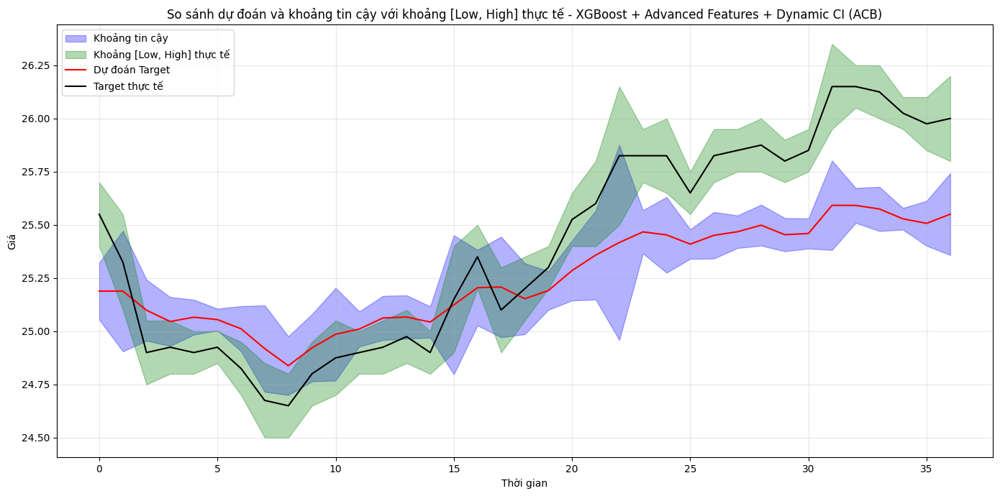


Top 20 đặc trưng quan trọng nhất:
                  Feature  Importance
65              low_lag_1    0.206642
167          target_wma_5    0.124650
22           target_ema_5    0.090471
278         autoencoder_4    0.058240
8            target_lag_1    0.045246
64             high_lag_1    0.044797
196      target_zscore_60    0.038417
57                 rsi_30    0.035734
190      target_zscore_30    0.030874
80            high_diff_3    0.030802
210  price_to_ma_ratio_20    0.025557
56                 roc_30    0.020894
45       price_change_21d    0.014174
54                 roc_20    0.013101
79          target_diff_3    0.012355
35        price_change_1d    0.011592
206   price_to_ma_ratio_5    0.011521
208  price_to_ma_ratio_10    0.011384
73          target_diff_2    0.010958
100           high_diff_6    0.010593


<Figure size 1200x800 with 0 Axes>

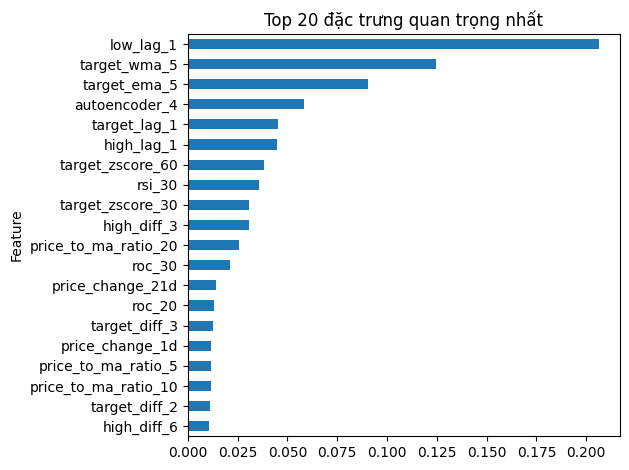

Chuẩn bị đặc trưng siêu nâng cao...
Huấn luyện autoencoder để trích xuất đặc trưng sâu...
Epoch 20/50, Loss: 0.660935
Epoch 40/50, Loss: 0.547762
Đã thêm 8 đặc trưng từ autoencoder

Huấn luyện mô hình cắt lớp...

Tối ưu hóa siêu tham số cho mô hình Target...
Bắt đầu tối ưu hóa Bayesian cho XGBoost...
|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | min_ch... | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------------------
| 9         | -0.272    | 0.6069    | 1.265     | 0.06698   | 5.55      | 1.937     | 680.6     | 0.4069    | 1.498     | 0.6014    |
| 10        | -0.2692   | 0.6678    | 0.001052  | 0.006437  | 8.13      | 7.801     | 707.7     | 0.05702   | 2.921     | 0.6617    |
| 35        | -0.2649   | 0.8101    | 0.7899    | 0.01447   | 3.388     | 8.579     | 682.6     | 0.1652    | 0.2619    | 0.6283    |
Tham số tốt nhất: {'colsampl

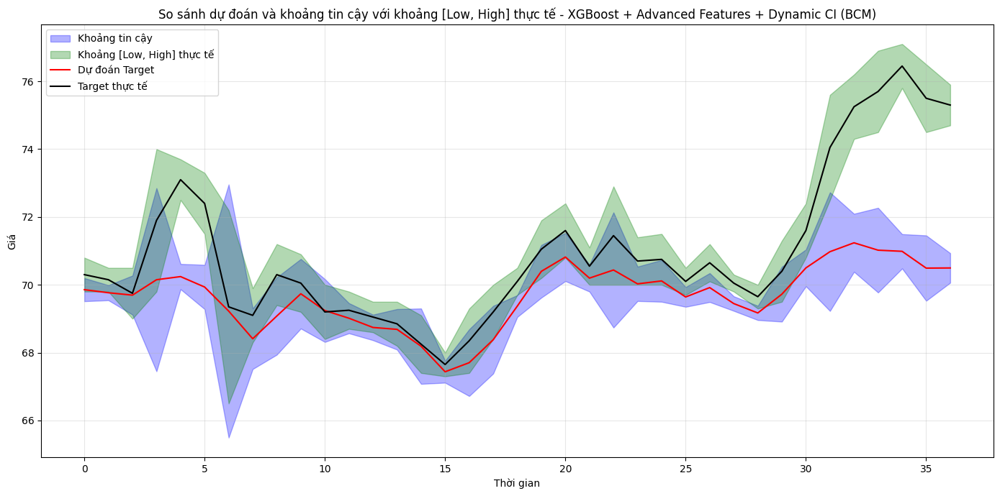


Top 20 đặc trưng quan trọng nhất:
             Feature  Importance
8       target_lag_1    0.083819
167     target_wma_5    0.075865
230  price_matrix_16    0.065685
22      target_ema_5    0.064328
6            doy_sin    0.043278
180    target_var_20    0.043016
65         low_lag_1    0.041593
20       target_ma_5    0.037908
14     target_lag_14    0.033642
246        wavelet_2    0.027269
123       low_lag_10    0.026458
64        high_lag_1    0.025588
25     target_ema_10    0.022412
7            doy_cos    0.014235
12      target_lag_7    0.013875
187   hl_range_ma_30    0.012824
165       low_lag_20    0.011708
247        wavelet_3    0.009937
84         low_lag_4    0.008869
245        wavelet_1    0.008667


<Figure size 1200x800 with 0 Axes>

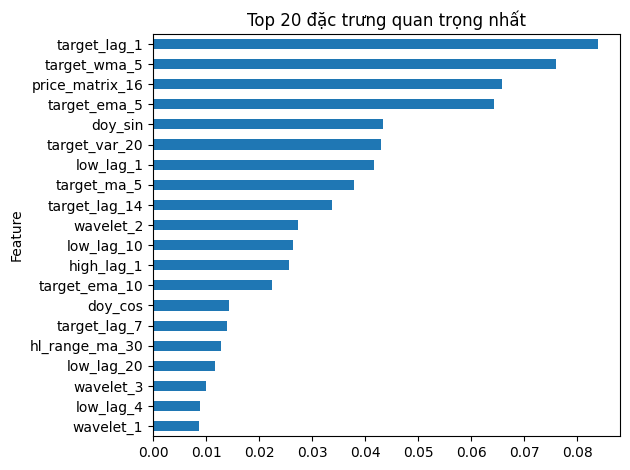

Chuẩn bị đặc trưng siêu nâng cao...
Huấn luyện autoencoder để trích xuất đặc trưng sâu...
Epoch 20/50, Loss: 0.695125
Epoch 40/50, Loss: 0.708163
Đã thêm 8 đặc trưng từ autoencoder

Huấn luyện mô hình cắt lớp...

Tối ưu hóa siêu tham số cho mô hình Target...
Bắt đầu tối ưu hóa Bayesian cho XGBoost...
|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | min_ch... | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------------------
| 3         | -0.2896   | 0.7728    | 0.5825    | 0.06157   | 3.976     | 3.629     | 429.7     | 2.28      | 3.926     | 0.6799    |
| 5         | -0.2865   | 0.7218    | 0.1953    | 0.06874   | 6.081     | 2.098     | 545.7     | 0.1719    | 4.547     | 0.7035    |
| 22        | -0.2707   | 0.7936    | 0.1309    | 0.0425    | 6.846     | 3.674     | 662.8     | 4.279     | 0.6551    | 0.7813    |
Tham số tốt nhất: {'colsampl

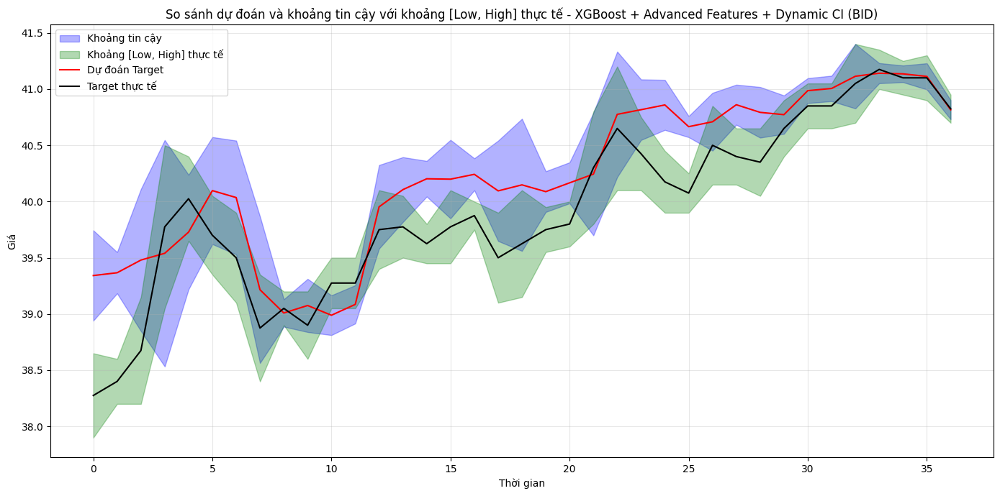


Top 20 đặc trưng quan trọng nhất:
                  Feature  Importance
22           target_ema_5    0.205691
167          target_wma_5    0.146774
65              low_lag_1    0.057738
8            target_lag_1    0.053879
25          target_ema_10    0.051725
43       price_change_14d    0.049044
64             high_lag_1    0.048492
55                 rsi_20    0.034675
173         target_wma_10    0.032566
190      target_zscore_30    0.028713
52                 roc_10    0.020403
53                 rsi_10    0.019333
37        price_change_3d    0.015280
23           target_ma_10    0.013536
256                stat_2    0.012764
121            low_diff_9    0.012726
127           low_diff_10    0.011556
210  price_to_ma_ratio_20    0.008030
208  price_to_ma_ratio_10    0.007376
181        hl_range_ma_20    0.006452


<Figure size 1200x800 with 0 Axes>

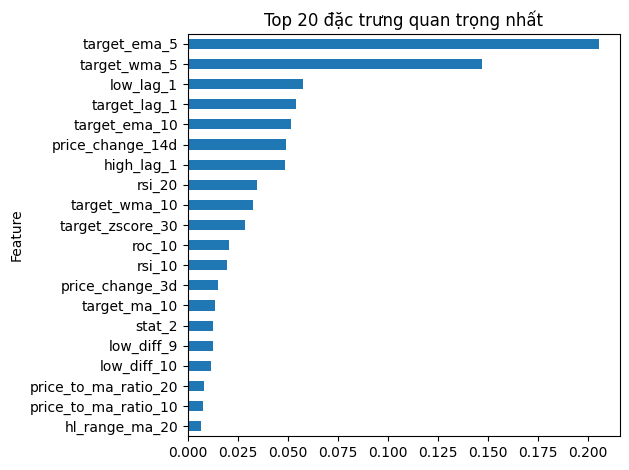

Chuẩn bị đặc trưng siêu nâng cao...
Huấn luyện autoencoder để trích xuất đặc trưng sâu...
Epoch 20/50, Loss: 0.566480
Epoch 40/50, Loss: 0.492023
Đã thêm 8 đặc trưng từ autoencoder

Huấn luyện mô hình cắt lớp...

Tối ưu hóa siêu tham số cho mô hình Target...
Bắt đầu tối ưu hóa Bayesian cho XGBoost...
|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | min_ch... | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------------------
| 2         | -6.094    | 0.8832    | 0.04117   | 0.09702   | 8.827     | 2.911     | 263.6     | 0.917     | 1.521     | 0.8099    |
| 21        | -6.085    | 0.6988    | 0.5342    | 0.06301   | 7.008     | 4.362     | 558.7     | 0.7282    | 0.1395    | 0.7832    |
| 27        | -5.99     | 0.916     | 0.1816    | 0.0398    | 9.949     | 9.733     | 584.9     | 0.554     | 1.075     | 0.6574    |
Tham số tốt nhất: {'colsampl

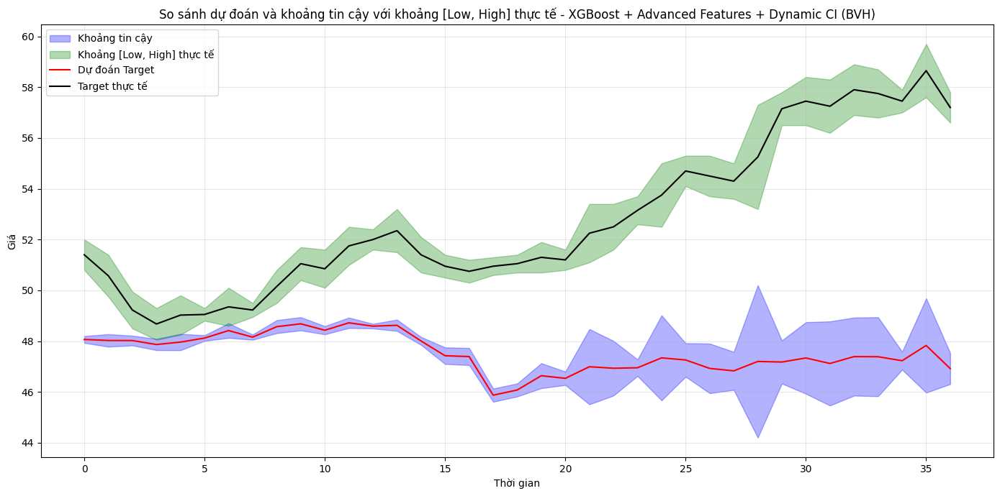


Top 20 đặc trưng quan trọng nhất:
                  Feature  Importance
1               month_cos    0.494372
7                 doy_cos    0.143532
8            target_lag_1    0.063702
20            target_ma_5    0.058760
180         target_var_20    0.052586
244             wavelet_0    0.017899
22           target_ema_5    0.017608
27          target_std_20    0.015416
64             high_lag_1    0.013923
65              low_lag_1    0.011732
167          target_wma_5    0.011125
246             wavelet_2    0.005197
57                 rsi_30    0.004763
70             high_lag_2    0.004388
46         pct_change_21d    0.004341
235             fourier_1    0.003687
80            high_diff_3    0.003453
208  price_to_ma_ratio_10    0.003416
172       target_zscore_5    0.003226
79          target_diff_3    0.003128


<Figure size 1200x800 with 0 Axes>

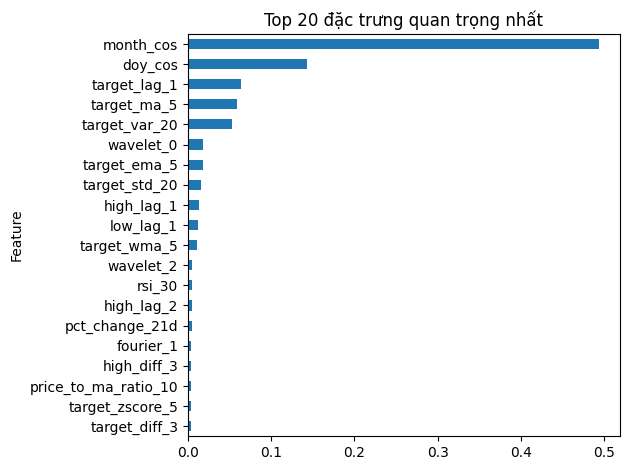

Chuẩn bị đặc trưng siêu nâng cao...
Huấn luyện autoencoder để trích xuất đặc trưng sâu...
Epoch 20/50, Loss: 0.697016
Epoch 40/50, Loss: 0.587224
Đã thêm 8 đặc trưng từ autoencoder

Huấn luyện mô hình cắt lớp...

Tối ưu hóa siêu tham số cho mô hình Target...
Bắt đầu tối ưu hóa Bayesian cho XGBoost...
|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | min_ch... | n_esti... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------------------
| 2         | -1.089    | 0.8832    | 0.04117   | 0.09702   | 8.827     | 2.911     | 263.6     | 0.917     | 1.521     | 0.8099    |
Tham số tốt nhất: {'colsample_bytree': np.float64(0.8832290311184181), 'gamma': np.float64(0.041168988591604894), 'learning_rate': np.float64(0.09702107536403744), 'max_depth': 8, 'min_child_weight': np.float64(2.9110519961044856), 'n_estimators': 263, 'reg_alpha': np.float64(0.9170225492671691)

In [ ]:
per_r2 = 0

vn30 = ['ACB', 'BCM', 'BID', 'BVH', 'CTG', 'FPT', 'GAS', 'GVR', 'HDB', 'HPG', 'LPB', 'MBB', 'MSN', 'MWG', 'PLX', 'SAB', 'SHB', 'SSB', 'SSI', 'STB', 'TCB', 'TPB', 'VCB', 'VHM', 'VIB', 'VIC', 'VJC', 'VNM', 'VPB', 'VRE']

for symbol in vn30:
	df_train = pd.read_csv(f'../data/2024/vn30/{symbol}.csv')
	df_test = pd.read_csv(f'../data/2025/vn30/{symbol}.csv')

	df_train_processed, df_test_processed = preprocess(df_train, df_test)

	# Chạy XGBoost với đầy đủ cải tiến
	# Thử nghiệm trên dữ liệu của bạn
	results = run_cutting_edge_prediction(
		df_train=df_train_processed, 
		df_test=df_test_processed, 
		window_size=20,
		symbol=symbol,  # Hoặc mã chứng khoán khác
		use_bayesian_opt=True  # Đặt False nếu muốn chạy nhanh hơn
    )

	r2 = results['metrics']['final']['r2']
	if r2 > 0.75:
		per_r2 += 1

print(f"Success rate: {per_r2}/{len(vn30)}")

# XGBoost v4

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import xgboost as xgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import mutual_info_regression
from sklearn.cluster import KMeans
from scipy.stats import norm, skew, kurtosis
from scipy import signal
import pywt
from scipy.signal import periodogram
from bayes_opt import BayesianOptimization
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from pykalman import KalmanFilter
import ruptures as rpt
from hmmlearn import hmm
import warnings
warnings.filterwarnings('ignore')

# ----------- 1. Adaptive Smoothing Techniques -----------

def apply_adaptive_exponential_smoothing(series, min_periods=2):
    """
    Áp dụng Exponential Smoothing với hệ số alpha thích ứng dựa trên biến động
    """
    # Tính toán biến động cửa sổ trượt
    volatility = series.rolling(window=5, min_periods=min_periods).std()
    
    # Chuẩn hóa về khoảng [0.1, 0.9] để làm alpha (hệ số làm mịn)
    # Độ biến động cao -> alpha cao -> phản ứng nhanh hơn với các thay đổi
    if len(volatility.dropna()) > 0:
        vol_min, vol_max = volatility.min(), volatility.max()
        if vol_max > vol_min:
            normalized_volatility = 0.1 + 0.8 * (volatility - vol_min) / (vol_max - vol_min)
        else:
            normalized_volatility = pd.Series(0.5, index=series.index)
        
        # Thay thế NaN bằng giá trị mặc định
        normalized_volatility = normalized_volatility.fillna(0.5)
    else:
        normalized_volatility = pd.Series(0.5, index=series.index)
    
    # Áp dụng Exponential Smoothing với alpha thích ứng
    result = pd.Series(index=series.index)
    result.iloc[0] = series.iloc[0]
    
    for i in range(1, len(series)):
        alpha = normalized_volatility.iloc[i]
        result.iloc[i] = alpha * series.iloc[i] + (1 - alpha) * result.iloc[i-1]
    
    return result

def apply_kalman_filter(series, process_variance=0.01, observation_variance=0.1, adaptive=True):
    """
    Áp dụng Kalman Filter với phương sai thích ứng dựa trên biến động
    """
    # Chuẩn bị dữ liệu
    measurements = series.values.astype(float)
    
    if adaptive:
        # Tính biến động cửa sổ trượt
        volatility = pd.Series(measurements).rolling(window=5, min_periods=2).std().fillna(0.1).values
        
        # Điều chỉnh process_variance dựa trên biến động (cao hơn khi biến động cao)
        process_variance_adaptive = process_variance * (1 + 5 * volatility / np.mean(volatility))
        
        # Khởi tạo mảng transition_matrices và observation_matrices
        n = len(measurements)
        transition_matrices = np.eye(1).reshape(1, 1, 1) * np.ones(n)
        observation_matrices = np.eye(1).reshape(1, 1, 1) * np.ones(n)
        
        # Khởi tạo mảng process_covariance và observation_covariance
        process_covariance = np.eye(1).reshape(1, 1, 1) * process_variance_adaptive.reshape(-1, 1, 1)
        observation_covariance = np.eye(1).reshape(1, 1, 1) * observation_variance * np.ones(n).reshape(-1, 1, 1)
        
        # Áp dụng Kalman Filter
        kf = KalmanFilter(
            transition_matrices=transition_matrices[0],
            observation_matrices=observation_matrices[0],
            initial_state_mean=measurements[0],
            initial_state_covariance=np.eye(1) * observation_variance,
            observation_covariance=observation_covariance[0],
            transition_covariance=process_covariance[0]
        )
        
        # Smooth và trích xuất trạng thái
        try:
            state_means, _ = kf.filter(measurements.reshape(-1, 1))
            smoothed = state_means.flatten()
        except:
            # Fallback khi lỗi
            smoothed = apply_adaptive_exponential_smoothing(pd.Series(measurements)).values
    else:
        # Sử dụng Kalman Filter thông thường
        kf = KalmanFilter(
            transition_matrices=np.array([[1]]),
            observation_matrices=np.array([[1]]),
            initial_state_mean=measurements[0],
            initial_state_covariance=np.eye(1) * observation_variance,
            observation_covariance=np.eye(1) * observation_variance,
            transition_covariance=np.eye(1) * process_variance
        )
        
        # Smooth và trích xuất trạng thái
        try:
            state_means, _ = kf.filter(measurements.reshape(-1, 1))
            smoothed = state_means.flatten()
        except:
            # Fallback khi lỗi
            smoothed = measurements
    
    return pd.Series(smoothed, index=series.index)

def create_multi_timeframe_features(df, column, windows=[2, 3, 5, 8, 13, 21], adaptive=True):
    """
    Tạo đặc trưng đa khung thời gian với cả phương pháp truyền thống và thích ứng
    """
    result_df = pd.DataFrame(index=df.index)
    
    # Chuẩn bị dữ liệu đầu vào
    series = df[column]
    
    # 1. Tạo Moving Averages đa khung thời gian
    for window in windows:
        # Truyền thống SMA
        result_df[f'{column}_sma_{window}'] = series.rolling(window=window, min_periods=1).mean()
        
        # Truyền thống EMA
        result_df[f'{column}_ema_{window}'] = series.ewm(span=window, min_periods=1, adjust=False).mean()
        
        if adaptive:
            # Adaptive EMA
            result_df[f'{column}_aema_{window}'] = apply_adaptive_exponential_smoothing(
                series, min_periods=min(2, window)
            )
            
            # Kalman Filter
            if window in [5, 10, 21]:  # Áp dụng cho một số cửa sổ để tiết kiệm tính toán
                try:
                    # Điều chỉnh tham số dựa trên kích thước cửa sổ
                    process_var = 0.01 * (1 + np.log(window))
                    obs_var = 0.1 * window
                    
                    result_df[f'{column}_kf_{window}'] = apply_kalman_filter(
                        series, process_variance=process_var, observation_variance=obs_var
                    )
                except:
                    # Fallback nếu Kalman filter không hoạt động
                    result_df[f'{column}_kf_{window}'] = result_df[f'{column}_ema_{window}']
    
    # 2. Tính toán các chỉ báo biến động đa khung thời gian
    for window in windows:
        # Độ lệch chuẩn truyền thống
        result_df[f'{column}_std_{window}'] = series.rolling(window=window, min_periods=1).std()
        
        # Độ lệch chuẩn thích ứng (tính từ cửa sổ nhỏ hơn cho dữ liệu biến động)
        # Cửa sổ nhỏ hơn cho phép phản ứng nhanh hơn
        adaptive_window = max(2, window // 2)
        result_df[f'{column}_astd_{window}'] = series.rolling(
            window=adaptive_window, min_periods=1
        ).std().rolling(window=adaptive_window, min_periods=1).mean()
        
        # Z-score thích ứng
        result_df[f'{column}_zscore_{window}'] = (
            series - result_df[f'{column}_sma_{window}']
        ) / result_df[f'{column}_std_{window}'].replace(0, 0.0001)
    
    # 3. Tính toán đạo hàm (tốc độ thay đổi) cho các chuỗi khác nhau
    for window in [1, 2, 3, 5]:
        # Sự thay đổi giá tuyệt đối
        result_df[f'{column}_diff_{window}'] = series.diff(window)
        
        # Tỷ lệ phần trăm thay đổi
        result_df[f'{column}_pct_{window}'] = series.pct_change(window) * 100
        
        # Tăng tốc (acceleration) - đạo hàm thứ hai
        result_df[f'{column}_accel_{window}'] = series.diff(window).diff(window)
        
        # ROC (Rate of Change)
        result_df[f'{column}_roc_{window}'] = (series / series.shift(window) - 1) * 100
    
    # 4. Tạo các chỉ báo xác định xu hướng nhanh
    # Crossing giữa các khung thời gian ngắn và dài
    for short_window, long_window in [(2, 5), (3, 8), (5, 13)]:
        short_col = f'{column}_ema_{short_window}'
        long_col = f'{column}_ema_{long_window}'
        
        # Chỉ báo xu hướng: 1 (tăng), -1 (giảm), 0 (đi ngang)
        result_df[f'{column}_trend_{short_window}_{long_window}'] = np.where(
            result_df[short_col] > result_df[long_col], 1,
            np.where(result_df[short_col] < result_df[long_col], -1, 0)
        )
        
        # Crossing: chỉ báo khi đường ngắn hạn cắt đường dài hạn
        result_df[f'{column}_cross_up_{short_window}_{long_window}'] = np.where(
            (result_df[short_col] > result_df[long_col]) & 
            (result_df[short_col].shift(1) <= result_df[long_col].shift(1)), 
            1, 0
        )
        
        result_df[f'{column}_cross_down_{short_window}_{long_window}'] = np.where(
            (result_df[short_col] < result_df[long_col]) & 
            (result_df[short_col].shift(1) >= result_df[long_col].shift(1)), 
            1, 0
        )
    
    return result_df

# ----------- 2. Enhanced Change Point Detection -----------

def detect_change_points(series, window_size=30, penalty='l2', min_size=5, jump=1):
    """
    Phát hiện điểm thay đổi sử dụng thuật toán PELT
    """
    try:
        # Chuẩn bị dữ liệu
        signal = series.values
        
        # Áp dụng thuật toán PELT
        algo = rpt.Pelt(model="l2", min_size=min_size, jump=jump).fit(signal)
        change_points = algo.predict(pen=penalty)
        
        # Tạo các chỉ số từ điểm thay đổi
        n = len(series)
        cp_indicators = np.zeros(n)
        
        # Đánh dấu các vị trí là điểm thay đổi
        for cp in change_points:
            if cp < n:
                cp_indicators[cp] = 1
        
        # Tính toán khoảng cách đến điểm thay đổi gần nhất (trước và sau)
        dist_to_prev_cp = np.zeros(n)
        dist_to_next_cp = np.zeros(n)
        
        last_cp = 0
        for i in range(n):
            dist_to_prev_cp[i] = i - last_cp
            if cp_indicators[i] == 1:
                last_cp = i
        
        last_cp = n - 1
        for i in range(n - 1, -1, -1):
            dist_to_next_cp[i] = last_cp - i
            if cp_indicators[i] == 1:
                last_cp = i
        
        # Tính các đặc trưng cường độ thay đổi tại các điểm chuyển đổi
        intensity = np.zeros(n)
        for i in range(len(change_points) - 1):
            start = change_points[i]
            end = change_points[i + 1]
            
            if start < n and end <= n:
                # Cường độ là sự khác biệt giữa trung bình của các phân đoạn
                if end - start > 1:
                    left_mean = np.mean(signal[max(0, start-5):start])
                    right_mean = np.mean(signal[start:min(end, n)])
                    
                    if not (np.isnan(left_mean) or np.isnan(right_mean)):
                        intensity[start] = abs(right_mean - left_mean)
        
        # Tính sự khác biệt trung bình/chuẩn trong các phân đoạn
        segment_volatility = np.zeros(n)
        last_cp = 0
        
        for cp in change_points:
            if cp < n:
                if cp - last_cp > 1:
                    segment = signal[last_cp:cp]
                    segment_volatility[last_cp:cp] = np.std(segment)
                last_cp = cp
        
        if last_cp < n:
            segment = signal[last_cp:n]
            segment_volatility[last_cp:n] = np.std(segment)
        
        return pd.DataFrame({
            'change_point': cp_indicators,
            'distance_to_prev_cp': dist_to_prev_cp / window_size,  # Chuẩn hóa
            'distance_to_next_cp': dist_to_next_cp / window_size,  # Chuẩn hóa
            'cp_intensity': intensity / np.max(intensity) if np.max(intensity) > 0 else intensity,
            'segment_volatility': segment_volatility
        }, index=series.index)
    
    except Exception as e:
        print(f"Lỗi khi phát hiện điểm thay đổi: {e}")
        return pd.DataFrame({
            'change_point': np.zeros(len(series)),
            'distance_to_prev_cp': np.zeros(len(series)),
            'distance_to_next_cp': np.zeros(len(series)),
            'cp_intensity': np.zeros(len(series)),
            'segment_volatility': np.zeros(len(series))
        }, index=series.index)

def sliding_window_change_detection(series, window_size=20, step=5):
    """
    Phát hiện điểm thay đổi sử dụng phương pháp cửa sổ trượt
    """
    n = len(series)
    result = np.zeros(n)
    intensity = np.zeros(n)
    
    # Biến độ dài chuỗi thành 1-D array
    values = series.values
    
    # Trượt cửa sổ trên toàn bộ chuỗi
    for i in range(0, n - window_size, step):
        if i + window_size < n:
            window = values[i:i + window_size]
            
            # Chia cửa sổ thành 2 nửa và tính sự khác biệt
            half = window_size // 2
            first_half = window[:half]
            second_half = window[half:]
            
            # Tính sự khác biệt giữa 2 nửa
            diff_mean = abs(np.mean(second_half) - np.mean(first_half))
            diff_std = abs(np.std(second_half) - np.std(first_half))
            
            # Chuẩn hóa sự khác biệt
            threshold = np.std(window) * 1.5
            
            if diff_mean > threshold:
                # Đánh dấu điểm giữa cửa sổ là điểm thay đổi
                mid_point = i + half
                result[mid_point] = 1
                
                # Cường độ thay đổi
                intensity[mid_point] = diff_mean / np.mean(window)
    
    return pd.DataFrame({
        'sliding_cp': result,
        'sliding_intensity': intensity
    }, index=series.index)

def extract_high_frequency_components(series, wavelet='db4', level=5):
    """
    Trích xuất các thành phần tần số cao từ biến đổi wavelet
    """
    try:
        # Chuẩn bị dữ liệu
        values = series.values
        
        # Áp dụng phân tích đa độ phân giải wavelet
        coeffs = pywt.wavedec(values, wavelet, level=min(level, pywt.dwt_max_level(len(values), wavelet)))
        
        # Phân tách thành phần tần số cao và thấp
        high_freq = coeffs[1:3]  # Lấy chi tiết cấp độ 1 và 2 (tần số cao nhất)
        low_freq = [coeffs[0]] + [None] * (len(coeffs) - 1)
        
        # Tái tạo tín hiệu
        high_freq_signal = pywt.waverec([None] + high_freq + [None] * (len(coeffs) - 3), wavelet)
        low_freq_signal = pywt.waverec(low_freq, wavelet)
        
        # Cắt tín hiệu về kích thước ban đầu
        high_freq_signal = high_freq_signal[:len(values)]
        low_freq_signal = low_freq_signal[:len(values)]
        
        # Tính toán năng lượng của các thành phần tần số cao
        energy = np.square(high_freq_signal)
        
        # Tìm các đỉnh trong thành phần tần số cao
        peaks, _ = signal.find_peaks(np.abs(high_freq_signal), height=np.std(high_freq_signal))
        
        # Tạo đặc trưng "peak detector"
        peak_detector = np.zeros(len(values))
        peak_detector[peaks] = 1
        
        return pd.DataFrame({
            'high_freq': high_freq_signal,
            'low_freq': low_freq_signal,
            'high_freq_energy': energy,
            'high_freq_normalized': high_freq_signal / np.max(np.abs(high_freq_signal)) if np.max(np.abs(high_freq_signal)) > 0 else high_freq_signal,
            'high_freq_peak': peak_detector
        }, index=series.index)
    
    except Exception as e:
        print(f"Lỗi khi trích xuất thành phần tần số cao: {e}")
        zeros = np.zeros(len(series))
        return pd.DataFrame({
            'high_freq': zeros,
            'low_freq': zeros,
            'high_freq_energy': zeros,
            'high_freq_normalized': zeros,
            'high_freq_peak': zeros
        }, index=series.index)

def fourier_burst_detector(series, window_size=30, n_harmonics=5, threshold=2.0):
    """
    Phát hiện "burst" (sự bùng nổ) bằng cách phân tích Fourier
    """
    n = len(series)
    values = series.values
    burst_indicator = np.zeros(n)
    energy_ratio = np.zeros(n)
    
    try:
        for i in range(window_size, n):
            # Lấy cửa sổ hiện tại và trước đó
            current_window = values[i - window_size:i]
            prev_window = values[max(0, i - 2*window_size):i - window_size]
            
            if len(prev_window) < 5:  # Không đủ dữ liệu
                continue
            
            # Tính FFT cho cả hai cửa sổ
            fft_current = np.abs(np.fft.fft(current_window))
            fft_prev = np.abs(np.fft.fft(prev_window[:window_size]))  # Đảm bảo cùng kích thước
            
            # Lấy các harmonic đầu tiên (loại bỏ DC)
            harmonic_current = fft_current[1:n_harmonics+1]
            harmonic_prev = fft_prev[1:n_harmonics+1]
            
            # So sánh năng lượng
            if np.sum(harmonic_prev) > 0:
                ratio = np.sum(harmonic_current) / np.sum(harmonic_prev)
                energy_ratio[i] = ratio
                
                # Phát hiện burst khi năng lượng tăng đột ngột
                if ratio > threshold:
                    burst_indicator[i] = 1
        
        # Chuẩn hóa tỷ lệ năng lượng
        if np.max(energy_ratio) > 0:
            energy_ratio = energy_ratio / np.max(energy_ratio)
        
        return pd.DataFrame({
            'fourier_burst': burst_indicator,
            'energy_ratio': energy_ratio
        }, index=series.index)
    
    except Exception as e:
        print(f"Lỗi khi phát hiện burst bằng Fourier: {e}")
        return pd.DataFrame({
            'fourier_burst': np.zeros(n),
            'energy_ratio': np.zeros(n)
        }, index=series.index)

# ----------- 3. Regime Switching and Clustering -----------

def apply_hmm_regime_detection(df, column, n_states=3, window_size=50):
    """
    Phát hiện trạng thái thị trường sử dụng Hidden Markov Model
    """
    try:
        # Chuẩn bị dữ liệu
        series = df[column].values.reshape(-1, 1)
        
        # Huấn luyện mô hình HMM
        model = hmm.GaussianHMM(n_components=n_states, covariance_type="diag", n_iter=100, random_state=42)
        model.fit(series)
        
        # Dự đoán trạng thái
        hidden_states = model.predict(series)
        
        # Tính xác suất cho các trạng thái
        state_probs = model.predict_proba(series)
        
        # Tính các đặc trưng trạng thái
        result = pd.DataFrame(index=df.index)
        result['hmm_state'] = hidden_states
        
        # Thêm xác suất cho mỗi trạng thái
        for i in range(n_states):
            result[f'hmm_prob_state_{i}'] = state_probs[:, i]
        
        # Tính toán chỉ số biến động của từng trạng thái
        volatility_by_state = {}
        for state in range(n_states):
            state_values = series[hidden_states == state]
            if len(state_values) > 0:
                volatility_by_state[state] = np.std(state_values)
        
        # Sắp xếp các trạng thái theo độ biến động
        volatility_ranking = sorted(volatility_by_state.items(), key=lambda x: x[1])
        
        # Ánh xạ trạng thái thành chỉ số "độ biến động" (0 = thấp, n_states-1 = cao)
        volatility_map = {state: i for i, (state, _) in enumerate(volatility_ranking)}
        
        # Thêm chỉ số biến động của trạng thái
        result['hmm_vol_index'] = [volatility_map.get(state, 0) for state in hidden_states]
        
        # Chuẩn hóa chỉ số biến động về [0, 1]
        if n_states > 1:
            result['hmm_vol_norm'] = result['hmm_vol_index'] / (n_states - 1)
        else:
            result['hmm_vol_norm'] = 0
        
        # Phát hiện chuyển đổi trạng thái
        result['hmm_regime_change'] = (result['hmm_state'] != result['hmm_state'].shift(1)).astype(int)
        
        # Tính cửa sổ trượt trạng thái phổ biến
        if window_size > 0:
            for i in range(n_states):
                state_indicator = (result['hmm_state'] == i).astype(int)
                result[f'hmm_state_{i}_ratio'] = state_indicator.rolling(window=window_size, min_periods=1).mean()
        
        return result
    
    except Exception as e:
        print(f"Lỗi khi áp dụng HMM: {e}")
        # Tạo kết quả trống trong trường hợp lỗi
        result = pd.DataFrame(index=df.index)
        result['hmm_state'] = 0
        result['hmm_vol_index'] = 0
        result['hmm_vol_norm'] = 0
        result['hmm_regime_change'] = 0
        
        for i in range(n_states):
            result[f'hmm_prob_state_{i}'] = 0
            if window_size > 0:
                result[f'hmm_state_{i}_ratio'] = 0
        
        return result

def cluster_market_regimes(df, columns, n_clusters=3, window_size=20):
    """
    Phân cụm các chế độ thị trường sử dụng K-means
    """
    try:
        # Chuẩn bị dữ liệu
        features = df[columns].copy()
        
        # Xử lý missing values
        features = features.fillna(method='ffill').fillna(method='bfill').fillna(0)
        
        # Chuẩn hóa dữ liệu
        scaler = StandardScaler()
        scaled_features = scaler.fit_transform(features)
        
        # Áp dụng K-means
        kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
        clusters = kmeans.fit_predict(scaled_features)
        
        # Tính các đặc trưng cụm
        result = pd.DataFrame(index=df.index)
        result['kmeans_cluster'] = clusters
        
        # Tính toán đặc điểm của từng cụm
        cluster_stats = {}
        target_col = df.columns[0]  # Giả sử cột đầu tiên là giá mục tiêu
        
        for cluster in range(n_clusters):
            cluster_data = df[target_col][result['kmeans_cluster'] == cluster]
            if len(cluster_data) > 0:
                # Tính các thống kê cho cụm
                cluster_stats[cluster] = {
                    'mean': cluster_data.mean(),
                    'std': cluster_data.std(),
                    'volatility': cluster_data.pct_change().std(),
                    'count': len(cluster_data)
                }
        
        # Sắp xếp các cụm theo độ biến động
        volatility_ranking = sorted(
            [(cluster, stats['volatility']) for cluster, stats in cluster_stats.items()],
            key=lambda x: x[1]
        )
        
        # Ánh xạ cụm thành chỉ số "độ biến động" (0 = thấp, n_clusters-1 = cao)
        volatility_map = {cluster: i for i, (cluster, _) in enumerate(volatility_ranking)}
        
        # Thêm chỉ số biến động của cụm
        result['kmeans_vol_index'] = [volatility_map.get(cluster, 0) for cluster in clusters]
        
        # Chuẩn hóa chỉ số biến động về [0, 1]
        if n_clusters > 1:
            result['kmeans_vol_norm'] = result['kmeans_vol_index'] / (n_clusters - 1)
        else:
            result['kmeans_vol_norm'] = 0
        
        # Phát hiện chuyển đổi cụm
        result['kmeans_regime_change'] = (result['kmeans_cluster'] != result['kmeans_cluster'].shift(1)).astype(int)
        
        # Khoảng cách đến tâm cụm (trung tâm)
        distances = kmeans.transform(scaled_features)
        for i in range(n_clusters):
            result[f'kmeans_dist_to_centroid_{i}'] = distances[:, i]
        
        # Tính cửa sổ trượt cụm phổ biến
        if window_size > 0:
            for i in range(n_clusters):
                cluster_indicator = (result['kmeans_cluster'] == i).astype(int)
                result[f'kmeans_cluster_{i}_ratio'] = cluster_indicator.rolling(window=window_size, min_periods=1).mean()
        
        return result
    
    except Exception as e:
        print(f"Lỗi khi phân cụm: {e}")
        # Tạo kết quả trống trong trường hợp lỗi
        result = pd.DataFrame(index=df.index)
        result['kmeans_cluster'] = 0
        result['kmeans_vol_index'] = 0
        result['kmeans_vol_norm'] = 0
        result['kmeans_regime_change'] = 0
        
        for i in range(n_clusters):
            result[f'kmeans_dist_to_centroid_{i}'] = 0
            if window_size > 0:
                result[f'kmeans_cluster_{i}_ratio'] = 0
        
        return result

# ----------- 4. Combined Feature Engineering -----------

def prepare_enhanced_features(df, window_size=20):
    """
    Tạo đặc trưng nâng cao với các kỹ thuật thích ứng và phát hiện biến động mạnh
    """
    df_features = df.copy()
    
    # 1. Đặc trưng cơ bản
    df_features['hl_range'] = df_features['high'] - df_features['low']
    df_features['hl_pct'] = df_features['hl_range'] / df_features['target'] * 100
    
    # 2. Đặc trưng shadow
    df_features['upper_shadow'] = df_features['high'] - df_features['target']
    df_features['lower_shadow'] = df_features['target'] - df_features['low']
    df_features['shadow_ratio'] = df_features['upper_shadow'] / df_features['lower_shadow'].replace(0, 0.001)
    
    # 3. Đặc trưng gap
    df_features['gap_size'] = df_features['target'] - df_features['target'].shift(1)
    df_features['gap_pct'] = df_features['gap_size'] / df_features['target'].shift(1) * 100
    df_features['abs_gap_pct'] = np.abs(df_features['gap_pct'])
    
    # Kiểm tra và đảm bảo không có cột trùng lặp
    df_features = df_features.loc[:, ~df_features.columns.duplicated()]
    
    # 4. Áp dụng smooth thích ứng cho các chuỗi quan trọng
    print("Tạo đặc trưng đa khung thời gian với smooth thích ứng...")
    
    # Chuỗi target - chuẩn bị trước các tính năng chính mà không nối trực tiếp
    target_features = create_multi_timeframe_features(
        df_features, 'target', 
        windows=[2, 3, 5, 8, 13, 21], 
        adaptive=True
    )
    
    # Kiểm tra trùng lặp
    target_features_cols = [col for col in target_features.columns if col not in df_features.columns]
    target_features = target_features[target_features_cols]
    
    # Nối các tính năng vào dataframe chính
    df_features = pd.concat([df_features, target_features], axis=1)
    
    # Chuỗi high và low
    high_features = create_multi_timeframe_features(
        df_features, 'high',
        windows=[2, 3, 5, 8, 13],
        adaptive=True
    )
    
    # Kiểm tra trùng lặp
    high_features_cols = [col for col in high_features.columns if col not in df_features.columns]
    high_features = high_features[high_features_cols]
    
    low_features = create_multi_timeframe_features(
        df_features, 'low',
        windows=[2, 3, 5, 8, 13],
        adaptive=True
    )
    
    # Kiểm tra trùng lặp
    low_features_cols = [col for col in low_features.columns if col not in df_features.columns]
    low_features = low_features[low_features_cols]
    
    # Chuỗi hl_range (độ biến động)
    range_features = create_multi_timeframe_features(
        df_features, 'hl_range',
        windows=[2, 3, 5, 8, 13],
        adaptive=True
    )
    
    # Kiểm tra trùng lặp
    range_features_cols = [col for col in range_features.columns if col not in df_features.columns]
    range_features = range_features[range_features_cols]
    
    # Kết hợp các đặc trưng, đảm bảo không có trùng lặp
    df_features = pd.concat([df_features, high_features, low_features, range_features], axis=1)
    
    # 5. Phát hiện điểm thay đổi nâng cao
    print("Phát hiện điểm thay đổi cho target...")
    # Áp dụng PELT change point detection
    change_point_features = detect_change_points(
        df_features['target'],
        window_size=window_size,
        penalty=2.0,
        min_size=3
    )
    
    # Kiểm tra trùng lặp
    cp_features_cols = [col for col in change_point_features.columns if col not in df_features.columns]
    change_point_features = change_point_features[cp_features_cols]
    
    df_features = pd.concat([df_features, change_point_features], axis=1)
    
    # Áp dụng sliding window change detection
    sliding_cp_features = sliding_window_change_detection(
        df_features['target'],
        window_size=10,
        step=2
    )
    
    # Kiểm tra trùng lặp
    sliding_features_cols = [col for col in sliding_cp_features.columns if col not in df_features.columns]
    sliding_cp_features = sliding_cp_features[sliding_features_cols]
    
    df_features = pd.concat([df_features, sliding_cp_features], axis=1)
    
    # 6. Trích xuất thành phần tần số cao
    print("Trích xuất thành phần tần số cao...")
    high_freq_features = extract_high_frequency_components(
        df_features['target'],
        wavelet='db4',
        level=3
    )
    
    # Kiểm tra trùng lặp
    freq_features_cols = [col for col in high_freq_features.columns if col not in df_features.columns]
    high_freq_features = high_freq_features[freq_features_cols]
    
    df_features = pd.concat([df_features, high_freq_features], axis=1)
    
    # 7. Phát hiện burst bằng Fourier
    fourier_burst_features = fourier_burst_detector(
        df_features['target'],
        window_size=15,
        n_harmonics=3,
        threshold=1.5
    )
    
    # Kiểm tra trùng lặp
    fourier_features_cols = [col for col in fourier_burst_features.columns if col not in df_features.columns]
    fourier_burst_features = fourier_burst_features[fourier_features_cols]
    
    df_features = pd.concat([df_features, fourier_burst_features], axis=1)
    
    # 8. Phát hiện chế độ thị trường bằng HMM
    print("Áp dụng mô hình HMM để phát hiện chế độ thị trường...")
    hmm_features = apply_hmm_regime_detection(
        df_features, 'target',
        n_states=3,
        window_size=10
    )
    
    # Kiểm tra trùng lặp
    hmm_features_cols = [col for col in hmm_features.columns if col not in df_features.columns]
    hmm_features = hmm_features[hmm_features_cols]
    
    df_features = pd.concat([df_features, hmm_features], axis=1)
    
    # 9. Phân cụm chế độ thị trường bằng K-means
    print("Phân cụm chế độ thị trường bằng K-means...")
    cluster_columns = [
        'target', 'high', 'low', 'hl_range', 
        'target_std_5', 'target_roc_1', 'target_pct_1',
        'target_zscore_5', 'high_freq', 'energy_ratio'
    ]
    
    # Đảm bảo tất cả các cột tồn tại
    cluster_columns = [col for col in cluster_columns if col in df_features.columns]
    
    if len(cluster_columns) >= 3:  # Cần ít nhất 3 đặc trưng để phân cụm hiệu quả
        cluster_features = cluster_market_regimes(
            df_features, cluster_columns,
            n_clusters=3,
            window_size=10
        )
        
        # Kiểm tra trùng lặp
        cluster_features_cols = [col for col in cluster_features.columns if col not in df_features.columns]
        cluster_features = cluster_features[cluster_features_cols]
        
        df_features = pd.concat([df_features, cluster_features], axis=1)
    
    # 10. Tạo các đặc trưng chỉ báo kỹ thuật đa khung thời gian
    # a. RSI
    for window in [2, 5, 9, 14]:
        delta = df_features['target'].diff()
        gain = delta.clip(lower=0)
        loss = -delta.clip(upper=0)
        
        avg_gain = gain.rolling(window=window, min_periods=1).mean()
        avg_loss = loss.rolling(window=window, min_periods=1).mean()
        
        rs = avg_gain / avg_loss.replace(0, 0.001)
        df_features[f'rsi_{window}'] = 100 - (100 / (1 + rs))
    
    # b. MACD (sự khác biệt giữa EMA ngắn và dài)
    for short_period, long_period in [(5, 13), (8, 21)]:
        # Kiểm tra xem cột có tồn tại không
        short_ema_col = f'target_ema_{short_period}'
        long_ema_col = f'target_ema_{long_period}'
        
        if short_ema_col in df_features.columns and long_ema_col in df_features.columns:
            # Sử dụng Series.subtract để tránh lỗi reindex
            short_ema = df_features[short_ema_col].copy()
            long_ema = df_features[long_ema_col].copy()
            
            # Tạo Series mới để tránh vấn đề với index
            macd = pd.Series(short_ema.values - long_ema.values, index=df_features.index)
            df_features[f'macd_{short_period}_{long_period}'] = macd
            
            # Tín hiệu MACD (EMA của MACD)
            signal = macd.ewm(span=9, min_periods=1, adjust=False).mean()
            
            df_features[f'macd_signal_{short_period}_{long_period}'] = signal
            df_features[f'macd_hist_{short_period}_{long_period}'] = pd.Series(
                macd.values - signal.values, index=df_features.index
            )
    
    # c. Force Index (đo lực mua/bán)
    if 'volume' in df_features.columns:  # Nếu có thông tin khối lượng
        df_features['force_index_1'] = df_features['target'].diff(1) * df_features['volume']
        for window in [2, 5, 13]:
            df_features[f'force_index_{window}'] = df_features['force_index_1'].ewm(span=window, min_periods=1, adjust=False).mean()
    
    # 11. Tạo các đặc trưng tổng hợp "burst/change indicator"
    burst_columns = [
        'change_point', 'sliding_cp', 'fourier_burst',
        'high_freq_peak', 'hmm_regime_change', 'kmeans_regime_change'
    ]
    
    # Đảm bảo tất cả các cột tồn tại
    existing_burst_cols = [col for col in burst_columns if col in df_features.columns]
    
    if existing_burst_cols:
        # Tạo chỉ báo tổng hợp
        df_features['burst_indicator'] = df_features[existing_burst_cols].max(axis=1)
        
        # Tạo chỉ báo tích lũy trong cửa sổ gần đây
        for window in [3, 5, 10]:
            df_features[f'burst_indicator_sum_{window}'] = df_features['burst_indicator'].rolling(window=window, min_periods=1).sum()
    
    # 12. Tạo đặc trưng chỉ báo "dự đoán" biến động mạnh
    # Kết hợp nhiều chỉ báo để dự đoán biến động mạnh sắp tới
    volatility_indicators = []
    
    # Thêm các chỉ báo liên quan đến biến động
    if 'high_freq_energy' in df_features.columns:
        volatility_indicators.append('high_freq_energy')
    
    if 'energy_ratio' in df_features.columns:
        volatility_indicators.append('energy_ratio')
    
    if 'hmm_vol_norm' in df_features.columns:
        volatility_indicators.append('hmm_vol_norm')
    
    if 'kmeans_vol_norm' in df_features.columns:
        volatility_indicators.append('kmeans_vol_norm')
    
    if 'cp_intensity' in df_features.columns:
        volatility_indicators.append('cp_intensity')
    
    # Kết hợp các chỉ báo
    if volatility_indicators:
        # Chuẩn hóa các chỉ báo về khoảng [0, 1]
        for col in volatility_indicators:
            if df_features[col].max() > 0:
                df_features[f'{col}_norm'] = df_features[col] / df_features[col].max()
            else:
                df_features[f'{col}_norm'] = df_features[col]
        
        # Tạo chỉ báo tổng hợp
        norm_cols = [f'{col}_norm' for col in volatility_indicators]
        existing_norm_cols = [col for col in norm_cols if col in df_features.columns]
        if existing_norm_cols:
            df_features['volatility_predictor'] = df_features[existing_norm_cols].mean(axis=1)
    
    # Dự đoán biến động mạnh trong tương lai dựa trên các dấu hiệu hiện tại
    ema2_col = 'target_ema_2'
    ema5_col = 'target_ema_5'
    if ema2_col in df_features.columns and ema5_col in df_features.columns:
        # Sử dụng phép so sánh hai Series riêng lẻ
        condition_now = df_features[ema2_col] > df_features[ema5_col]
        condition_prev = df_features[ema2_col].shift(1) > df_features[ema5_col].shift(1)
        
        # Tạo Series mới cho kết quả
        df_features['strong_move_ahead'] = (condition_now != condition_prev).astype(int)
    
    # 13. Xử lý NaN
    df_features = df_features.replace([np.inf, -np.inf], np.nan)
    df_features = df_features.fillna(method='ffill').fillna(method='bfill').fillna(0)
    
    # Kiểm tra và loại bỏ các cột trùng lặp cuối cùng
    df_features = df_features.loc[:, ~df_features.columns.duplicated()]
    
    # 14. Tách features và targets
    X = df_features.drop(['target', 'high', 'low'], axis=1)
    y_target = df_features['target']
    y_high = df_features['high']
    y_low = df_features['low']
    
    return X, y_target, y_high, y_low, df_features

# ----------- 5. Feature Selection and Model Training -----------

def select_and_rank_features(X_train, y_train, min_features=20, importance_threshold=0.005):
    """
    Lựa chọn và xếp hạng các đặc trưng quan trọng
    """
    print("Chọn và xếp hạng đặc trưng...")
    
    # 1. Tính Mutual Information Score
    mi_scores = mutual_info_regression(X_train, y_train, random_state=42)
    mi_scores = pd.Series(mi_scores, index=X_train.columns)
    mi_scores = mi_scores / mi_scores.sum()  # Chuẩn hóa
    
    # 2. Tạo mô hình XGBoost ban đầu để tính độ quan trọng của đặc trưng
    model = xgb.XGBRegressor(
        n_estimators=100,
        learning_rate=0.1,
        max_depth=4,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42
    )
    model.fit(X_train, y_train)
    
    # Lấy độ quan trọng đặc trưng
    feature_importance = pd.Series(model.feature_importances_, index=X_train.columns)
    feature_importance = feature_importance / feature_importance.sum()  # Chuẩn hóa
    
    # 3. Kết hợp các điểm số
    combined_scores = pd.DataFrame({
        'feature': X_train.columns,
        'mi_score': mi_scores,
        'xgb_importance': feature_importance,
        'combined_score': 0.4 * mi_scores + 0.6 * feature_importance  # Ưu tiên XGBoost một chút
    })
    
    # 4. Xếp hạng đặc trưng
    combined_scores = combined_scores.sort_values('combined_score', ascending=False)
    
    # 5. Chọn đặc trưng hàng đầu và vượt ngưỡng
    threshold = importance_threshold * combined_scores['combined_score'].mean()
    threshold_features = combined_scores[combined_scores['combined_score'] >= threshold]['feature'].tolist()
    
    # Đảm bảo có ít nhất min_features đặc trưng
    if len(threshold_features) < min_features:
        threshold_features = combined_scores.head(min_features)['feature'].tolist()
    
    # 6. Phân nhóm các đặc trưng
    # Phân loại đặc trưng theo loại
    feature_groups = {
        'price_action': [],      # Đặc trưng liên quan đến giá
        'technical': [],         # Các chỉ báo kỹ thuật
        'volatility': [],        # Đo lường độ biến động
        'frequency': [],         # Phân tích tần số
        'regime': [],            # Phát hiện chế độ thị trường
        'change_point': [],      # Phát hiện điểm thay đổi
        'burst': [],             # Phát hiện biến động mạnh
        'trend': [],             # Chỉ báo xu hướng
        'other': []              # Các đặc trưng khác
    }
    
    # Phân loại các đặc trưng
    for feature in combined_scores['feature']:
        if any(x in feature for x in ['lag', 'diff', 'pct', 'shadow', 'gap', 'hl_range']):
            feature_groups['price_action'].append(feature)
        elif any(x in feature for x in ['ma', 'ema', 'rsi', 'macd', 'force']):
            feature_groups['technical'].append(feature)
        elif any(x in feature for x in ['std', 'vol', 'volatility']):
            feature_groups['volatility'].append(feature)
        elif any(x in feature for x in ['high_freq', 'fourier', 'energy']):
            feature_groups['frequency'].append(feature)
        elif any(x in feature for x in ['hmm', 'kmeans']):
            feature_groups['regime'].append(feature)
        elif any(x in feature for x in ['change_point', 'cp_']):
            feature_groups['change_point'].append(feature)
        elif any(x in feature for x in ['burst', 'strong_move']):
            feature_groups['burst'].append(feature)
        elif any(x in feature for x in ['trend', 'cross']):
            feature_groups['trend'].append(feature)
        else:
            feature_groups['other'].append(feature)
    
    # 7. Chọn đặc trưng từ mỗi nhóm để đảm bảo đa dạng
    # Ưu tiên các đặc trưng đã vượt ngưỡng
    diverse_features = set(threshold_features)
    
    # Đảm bảo mỗi nhóm có ít nhất một số đặc trưng
    min_per_group = {
        'price_action': 5,
        'technical': 4,
        'volatility': 3,
        'frequency': 2,
        'regime': 2,
        'change_point': 2,
        'burst': 2,
        'trend': 3,
        'other': 1
    }
    
    for group, features in feature_groups.items():
        # Sắp xếp đặc trưng trong nhóm theo điểm số kết hợp
        sorted_features = [f for f in combined_scores['feature'] if f in features]
        min_needed = min_per_group.get(group, 1)
        
        # Thêm đặc trưng hàng đầu từ mỗi nhóm
        for feature in sorted_features[:min_needed]:
            diverse_features.add(feature)
    
    # Chuyển thành danh sách
    diverse_features = list(diverse_features)
    
    # 8. Báo cáo kết quả
    print(f"Đã chọn {len(diverse_features)} đặc trưng từ {len(X_train.columns)} đặc trưng ban đầu")
    
    # Phân tích nhóm đặc trưng đã chọn
    selected_by_group = {group: [f for f in diverse_features if f in features] 
                        for group, features in feature_groups.items()}
    
    for group, features in selected_by_group.items():
        if features:
            print(f"  - Nhóm {group}: {len(features)} đặc trưng")
    
    return diverse_features, combined_scores

def train_adaptive_models(X_train, y_target, y_high, y_low, selected_features=None, burst_features=None):
    """
    Huấn luyện các mô hình thích ứng dựa trên các chế độ thị trường khác nhau
    """
    print("Huấn luyện các mô hình thích ứng...")
    
    # Sử dụng các đặc trưng đã chọn nếu được cung cấp
    if selected_features is not None:
        X_train_filtered = X_train[selected_features].copy()
    else:
        X_train_filtered = X_train.copy()
    
    # 1. Xác định các đặc trưng biến động/burst
    if burst_features is None:
        # Tìm các đặc trưng liên quan đến biến động mạnh
        burst_features = [col for col in X_train_filtered.columns 
                         if any(term in col for term in ['burst', 'change_point', 'regime_change', 'volatility_predictor'])]
    
    # Nếu không tìm thấy đặc trưng burst, sử dụng một số cột mặc định
    if not burst_features:
        possible_features = ['target_std_5', 'hl_range', 'target_roc_1']
        burst_features = [col for col in possible_features if col in X_train_filtered.columns]
    
    # Thêm cột chỉ báo burst
    if burst_features:
        X_train_filtered['burst_indicator_combined'] = X_train_filtered[burst_features].max(axis=1)
    else:
        X_train_filtered['burst_indicator_combined'] = 0
    
    # 2. Phân chia dữ liệu theo chế độ thị trường
    # Xác định ngưỡng để phân loại các điểm thành chế độ bình thường/biến động mạnh
    burst_threshold = np.percentile(X_train_filtered['burst_indicator_combined'], 80)  # Lấy top 20% các điểm có biến động mạnh nhất
    
    # Tạo mặt nạ cho chế độ biến động mạnh
    burst_mask = X_train_filtered['burst_indicator_combined'] >= burst_threshold
    
    # 3. Tạo các tham số cho các mô hình khác nhau
    # Mô hình chung - cân bằng giữa ổn định và phản ứng
    general_params = {
        'n_estimators': 200,
        'learning_rate': 0.05,
        'max_depth': 5,
        'min_child_weight': 3,
        'subsample': 0.8,
        'colsample_bytree': 0.8,
        'gamma': 0.1,
        'reg_alpha': 0.2,
        'reg_lambda': 1.0,
        'objective': 'reg:squarederror',
        'tree_method': 'hist',
        'random_state': 42
    }
    
    # Mô hình biến động - phản ứng nhanh với biến động
    burst_params = {
        'n_estimators': 100,  # Giảm số lượng cây để tránh overfitting
        'learning_rate': 0.1,  # Tăng learning rate để phản ứng nhanh hơn
        'max_depth': 3,        # Giảm độ sâu để giảm overfitting
        'min_child_weight': 1, # Giảm để tập trung vào mẫu nhỏ
        'subsample': 0.9,      # Tăng tỷ lệ mẫu để sử dụng nhiều dữ liệu hơn
        'colsample_bytree': 0.9,
        'gamma': 0.05,
        'reg_alpha': 0.1,
        'reg_lambda': 0.5,
        'objective': 'reg:squarederror',
        'tree_method': 'hist',
        'random_state': 42
    }
    
    # 4. Huấn luyện các mô hình
    models = {}
    
    # 4.1 Huấn luyện mô hình tổng quát (cho tất cả các điểm)
    print("Huấn luyện mô hình tổng quát...")
    model_target_general = xgb.XGBRegressor(**general_params)
    model_target_general.fit(X_train_filtered, y_target)
    
    model_high_general = xgb.XGBRegressor(**general_params)
    model_high_general.fit(X_train_filtered, y_high)
    
    model_low_general = xgb.XGBRegressor(**general_params)
    model_low_general.fit(X_train_filtered, y_low)
    
    models['general'] = {
        'target': model_target_general,
        'high': model_high_general,
        'low': model_low_general
    }
    
    # 4.2 Huấn luyện mô hình cho chế độ biến động mạnh (nếu có đủ dữ liệu)
    if np.sum(burst_mask) >= 30:  # Cần ít nhất 30 điểm dữ liệu
        print(f"Huấn luyện mô hình cho chế độ biến động mạnh ({np.sum(burst_mask)} điểm)...")
        
        X_burst = X_train_filtered[burst_mask]
        y_target_burst = y_target[burst_mask]
        y_high_burst = y_high[burst_mask]
        y_low_burst = y_low[burst_mask]
        
        model_target_burst = xgb.XGBRegressor(**burst_params)
        model_target_burst.fit(X_burst, y_target_burst)
        
        model_high_burst = xgb.XGBRegressor(**burst_params)
        model_high_burst.fit(X_burst, y_high_burst)
        
        model_low_burst = xgb.XGBRegressor(**burst_params)
        model_low_burst.fit(X_burst, y_low_burst)
        
        models['burst'] = {
            'target': model_target_burst,
            'high': model_high_burst,
            'low': model_low_burst
        }
    else:
        print("Không đủ dữ liệu cho chế độ biến động mạnh")
        models['burst'] = None
    
    # 4.3 Huấn luyện mô hình dự đoán biến động
    print("Huấn luyện mô hình dự đoán biến động...")
    volatility = y_high - y_low
    model_volatility = xgb.XGBRegressor(**general_params)
    model_volatility.fit(X_train_filtered, volatility)
    models['volatility'] = model_volatility
    
    # 4.4 Huấn luyện mô hình dự đoán biến động mạnh
    print("Huấn luyện mô hình phân loại biến động mạnh...")
    # Tạo mục tiêu: 1 nếu biến động tiếp theo lớn hơn ngưỡng
    volatility_pct = volatility / y_target
    large_move_threshold = np.percentile(volatility_pct, 80)
    large_move_target = (volatility_pct.shift(-1) > large_move_threshold).astype(int)
    
    # Loại bỏ giá trị NaN
    valid_mask = ~large_move_target.isna()
    if valid_mask.sum() > 30:
        model_large_move = xgb.XGBClassifier(
            n_estimators=100,
            learning_rate=0.1,
            max_depth=3,
            objective='binary:logistic',
            tree_method='hist',
            random_state=42
        )
        model_large_move.fit(
            X_train_filtered[valid_mask], 
            large_move_target[valid_mask]
        )
        models['large_move_classifier'] = model_large_move
    else:
        models['large_move_classifier'] = None
    
    return models, burst_features

def predict_with_adaptive_models(models, X_test, selected_features=None, burst_features=None):
    """
    Dự đoán với các mô hình thích ứng dựa trên chế độ thị trường
    """
    # Sử dụng các đặc trưng đã chọn nếu được cung cấp
    if selected_features is not None:
        # Đảm bảo tất cả các đặc trưng tồn tại trong X_test
        missing_features = [feat for feat in selected_features if feat not in X_test.columns]
        X_test_filtered = X_test[selected_features].copy()
        
        # Thêm các đặc trưng thiếu với giá trị 0
        for feat in missing_features:
            X_test_filtered[feat] = 0
    else:
        X_test_filtered = X_test.copy()
    
    # 1. Chuẩn bị chỉ báo burst
    if burst_features:
        # Đảm bảo tất cả các đặc trưng burst tồn tại
        existing_burst_features = [feat for feat in burst_features if feat in X_test_filtered.columns]
        
        if existing_burst_features:
            X_test_filtered['burst_indicator_combined'] = X_test_filtered[existing_burst_features].max(axis=1)
        else:
            X_test_filtered['burst_indicator_combined'] = 0
    else:
        X_test_filtered['burst_indicator_combined'] = 0
    
    # 2. Dự đoán biến động mạnh
    burst_predictions = np.zeros(len(X_test_filtered))
    
    if 'large_move_classifier' in models and models['large_move_classifier'] is not None:
        # Đảm bảo tất cả các đặc trưng cần thiết tồn tại
        try:
            burst_predictions = models['large_move_classifier'].predict_proba(X_test_filtered)[:, 1]
        except:
            # Fallback nếu có lỗi
            burst_predictions = X_test_filtered['burst_indicator_combined'].values
    else:
        # Sử dụng chỉ báo burst nếu không có mô hình phân loại
        burst_predictions = X_test_filtered['burst_indicator_combined'].values
    
    # 3. Xác định ngưỡng cho chế độ biến động mạnh
    burst_threshold = 0.7  # Ngưỡng để xác định chế độ biến động mạnh
    
    # 4. Dự đoán cho từng điểm dữ liệu
    n_samples = len(X_test_filtered)
    pred_target = np.zeros(n_samples)
    pred_high = np.zeros(n_samples)
    pred_low = np.zeros(n_samples)
    used_burst_model = np.zeros(n_samples, dtype=bool)
    
    # Chuẩn bị mô hình
    model_general = models['general']
    model_burst = models.get('burst')
    
    # Dự đoán cho tất cả các điểm bằng mô hình chung
    pred_target_general = model_general['target'].predict(X_test_filtered)
    pred_high_general = model_general['high'].predict(X_test_filtered)
    pred_low_general = model_general['low'].predict(X_test_filtered)
    
    # Dự đoán biến động
    model_volatility = models.get('volatility')
    if model_volatility is not None:
        volatility_pred = model_volatility.predict(X_test_filtered)
    else:
        volatility_pred = pred_high_general - pred_low_general
    
    # Sử dụng mô hình thích ứng
    for i in range(n_samples):
        # Mặc định sử dụng mô hình chung
        pred_target[i] = pred_target_general[i]
        pred_high[i] = pred_high_general[i]
        pred_low[i] = pred_low_general[i]
        
        # Nếu phát hiện biến động mạnh và có mô hình burst
        if burst_predictions[i] > burst_threshold and model_burst is not None:
            try:
                # Dự đoán với mô hình burst
                pred_target_burst = model_burst['target'].predict(X_test_filtered.iloc[[i]])[0]
                pred_high_burst = model_burst['high'].predict(X_test_filtered.iloc[[i]])[0]
                pred_low_burst = model_burst['low'].predict(X_test_filtered.iloc[[i]])[0]
                
                # Kết hợp các dự đoán - ưu tiên mô hình burst khi có biến động mạnh
                burst_weight = min(1.0, (burst_predictions[i] - burst_threshold) / (1 - burst_threshold) * 2)
                
                pred_target[i] = (1 - burst_weight) * pred_target_general[i] + burst_weight * pred_target_burst
                pred_high[i] = (1 - burst_weight) * pred_high_general[i] + burst_weight * pred_high_burst
                pred_low[i] = (1 - burst_weight) * pred_low_general[i] + burst_weight * pred_low_burst
                
                used_burst_model[i] = True
            except:
                # Nếu có lỗi, sử dụng mô hình chung
                pass
    
    # 5. Điều chỉnh dựa trên các dấu hiệu khác
    # Mở rộng khoảng [High, Low] cho các điểm có khả năng biến động mạnh
    for i in range(n_samples):
        if burst_predictions[i] > 0.5:  # Có khả năng biến động mạnh
            # Mở rộng khoảng [High, Low] dựa trên xác suất biến động mạnh
            expansion_factor = 1.0 + 0.5 * (burst_predictions[i] - 0.5)  # 0% đến 50% mở rộng
            
            # Điều chỉnh dự đoán High và Low
            high_low_margin = (pred_high[i] - pred_low[i]) / 2
            adjusted_margin = high_low_margin * expansion_factor
            
            pred_high[i] = pred_target[i] + adjusted_margin
            pred_low[i] = pred_target[i] - adjusted_margin
    
    # Đảm bảo ràng buộc High >= Target >= Low
    for i in range(n_samples):
        pred_high[i] = max(pred_high[i], pred_target[i])
        pred_low[i] = min(pred_low[i], pred_target[i])
    
    return pred_target, pred_high, pred_low, volatility_pred, burst_predictions, used_burst_model

def create_dynamic_confidence_intervals(pred_target, pred_high, pred_low, burst_probabilities, X_test, conf_level=0.9):
    """
    Tạo khoảng tin cậy động dựa trên xác suất biến động mạnh và đặc điểm thị trường
    """
    # 1. Tính z-score dựa trên mức độ tin cậy
    z_score = norm.ppf((1 + conf_level) / 2)
    
    # 2. Tạo độ rộng cơ sở từ dự đoán high-low
    base_width = (pred_high - pred_low) / 2
    
    # 3. Điều chỉnh độ rộng dựa trên xác suất biến động mạnh
    # Xác suất biến động mạnh cao -> Mở rộng khoảng tin cậy
    burst_adjustment = 1.0 + burst_probabilities * 1.0  # Mở rộng tối đa 100%
    
    # 4. Điều chỉnh thêm dựa trên các đặc trưng biến động
    volatility_factor = np.ones(len(pred_target))
    trend_factor = np.zeros(len(pred_target))
    
    # Tìm các cột liên quan đến biến động và xu hướng
    volatility_columns = [col for col in X_test.columns if any(term in col for term in ['std_', 'volatility', 'range'])]
    trend_columns = [col for col in X_test.columns if any(term in col for term in ['trend', 'cross', 'roc_', 'macd'])]
    
    # Lấy các cột quan trọng nhất
    key_volatility_cols = [col for col in volatility_columns if any(term in col for term in ['_2', '_3', '_5'])][:3]
    key_trend_cols = [col for col in trend_columns if any(term in col for term in ['_2', '_3', '_5', 'cross'])][:3]
    
    # Tính toán các nhân tố điều chỉnh
    if key_volatility_cols:
        # Chuẩn hóa đặc trưng biến động
        try:
            volatility_features = X_test[key_volatility_cols].values
            volatility_features = np.nan_to_num(volatility_features)
            
            # Chuẩn hóa theo cột
            for j in range(volatility_features.shape[1]):
                col_max = np.max(np.abs(volatility_features[:, j]))
                if col_max > 0:
                    volatility_features[:, j] = volatility_features[:, j] / col_max
            
            # Lấy giá trị trung bình chuẩn hóa
            volatility_factor = 1.0 + np.mean(np.abs(volatility_features), axis=1) * 0.5  # Tối đa 50% tăng
        except:
            pass
    
    if key_trend_cols:
        # Đánh giá xu hướng
        try:
            trend_features = X_test[key_trend_cols].values
            trend_features = np.nan_to_num(trend_features)
            
            # Tính xu hướng trung bình
            trend_factor = np.mean(trend_features, axis=1)
            
            # Chuẩn hóa về [-1, 1]
            trend_max = np.max(np.abs(trend_factor))
            if trend_max > 0:
                trend_factor = trend_factor / trend_max
        except:
            pass
    
    # 5. Tính toán độ rộng thích ứng cuối cùng
    adaptive_width = base_width * burst_adjustment * volatility_factor
    
    # 6. Tạo khoảng tin cậy
    lower_bound = pred_target - adaptive_width * z_score
    upper_bound = pred_target + adaptive_width * z_score
    
    # 7. Nghiêng khoảng tin cậy theo xu hướng
    for i in range(len(pred_target)):
        if trend_factor[i] > 0:  # Xu hướng tăng
            # Nghiêng khoảng tin cậy lên trên
            skew_factor = min(0.3, trend_factor[i] * 0.3)  # Tối đa 30% nghiêng
            
            upper_bound[i] = upper_bound[i] * (1 + skew_factor)
            lower_bound[i] = lower_bound[i] * (1 - skew_factor * 0.5)  # Giảm ít hơn
        elif trend_factor[i] < 0:  # Xu hướng giảm
            # Nghiêng khoảng tin cậy xuống dưới
            skew_factor = min(0.3, abs(trend_factor[i]) * 0.3)  # Tối đa 30% nghiêng
            
            lower_bound[i] = lower_bound[i] * (1 + skew_factor)
            upper_bound[i] = upper_bound[i] * (1 - skew_factor * 0.5)  # Giảm ít hơn
    
    # 8. Đảm bảo khoảng tin cậy chứa giá trị dự đoán
    lower_bound = np.minimum(lower_bound, pred_target)
    upper_bound = np.maximum(upper_bound, pred_target)
    
    return lower_bound, upper_bound, adaptive_width, burst_adjustment

def run_enhanced_prediction(df_train, df_test, window_size=20, symbol=None):
    """
    Chạy quy trình dự đoán nâng cao với thích ứng biến động mạnh
    """
    # 1. Chuẩn bị đặc trưng nâng cao
    print("Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...")
    X_train, y_train_target, y_train_high, y_train_low, df_train_features = prepare_enhanced_features(df_train, window_size)
    X_test, y_test_target, y_test_high, y_test_low, df_test_features = prepare_enhanced_features(df_test, window_size)
    
    # 2. Chọn đặc trưng quan trọng
    selected_features, feature_importance = select_and_rank_features(X_train, y_train_target, min_features=30)
    
    # 3. Huấn luyện mô hình thích ứng
    models, burst_features = train_adaptive_models(
        X_train, y_train_target, y_train_high, y_train_low, 
        selected_features=selected_features
    )
    
    # 4. Dự đoán với mô hình thích ứng
    print("\nDự đoán với mô hình thích ứng...")
    pred_target, pred_high, pred_low, volatility_pred, burst_probabilities, used_burst_model = predict_with_adaptive_models(
        models, X_test, selected_features=selected_features, burst_features=burst_features
    )
    
    print(f"Sử dụng mô hình biến động mạnh cho {np.sum(used_burst_model)} / {len(X_test)} điểm dữ liệu")
    
    # 5. Tạo khoảng tin cậy động
    print("Tạo khoảng tin cậy động...")
    dynamic_low, dynamic_high, adaptive_width, burst_adjustment = create_dynamic_confidence_intervals(
        pred_target, pred_high, pred_low, burst_probabilities, X_test
    )
    
    # 6. Đánh giá mô hình
    print("\nĐánh giá mô hình dự đoán thích ứng:")
    metrics = evaluate_predictions(
        dynamic_low, pred_target, dynamic_high,
        y_test_target.values, y_test_low.values, y_test_high.values,
        "Mô hình Thích Ứng Biến Động Mạnh",
        burst_probabilities
    )
    
    # 7. Vẽ biểu đồ dự đoán
    plot_predictions_with_burst(
        dynamic_low, pred_target, dynamic_high,
        y_test_target.values, y_test_low.values, y_test_high.values,
        burst_probabilities, used_burst_model,
        "Mô hình Thích Ứng Biến Động + Khoảng Tin Cậy Động",
        symbol
    )
    
    # 8. Hiển thị đặc trưng quan trọng
    print("\nTop 20 đặc trưng quan trọng nhất:")
    print(feature_importance.head(20))
    
    plt.figure(figsize=(12, 8))
    feature_importance.head(20).sort_values('combined_score').plot(
        kind='barh', x='feature', y='combined_score', legend=False
    )
    plt.title('Top 20 đặc trưng quan trọng nhất')
    plt.tight_layout()
    plt.show()
    
    return {
        'models': models,
        'predictions': {
            'target': pred_target,
            'high': pred_high,
            'low': pred_low,
            'dynamic_low': dynamic_low,
            'dynamic_high': dynamic_high,
            'burst_probabilities': burst_probabilities,
            'used_burst_model': used_burst_model
        },
        'metrics': metrics,
        'features': {
            'selected': selected_features,
            'importance': feature_importance,
            'burst_features': burst_features
        }
    }

def plot_predictions_with_burst(lower, median, upper, y_test, test_low, test_high, burst_probs, used_burst, title, symbol=None):
    """
    Vẽ dự đoán với đánh dấu các điểm biến động mạnh
    """
    plt.figure(figsize=(14, 7))
    x = np.arange(len(median))
    
    # Vẽ khoảng tin cậy
    plt.fill_between(x, lower, upper, alpha=0.3, color='blue', label='Khoảng tin cậy')
    
    # Vẽ khoảng [low, high] thực tế
    plt.fill_between(x, test_low, test_high, alpha=0.3, color='green', label='Khoảng [Low, High] thực tế')
    
    # Vẽ dự đoán
    plt.plot(x, median, color='red', linewidth=1.5, label='Dự đoán Target')
    
    # Vẽ giá trị thực tế
    plt.plot(x, y_test, color='black', linewidth=1.5, label='Target thực tế')
    
    # Đánh dấu các điểm dùng mô hình biến động mạnh
    if np.sum(used_burst) > 0:
        burst_indices = np.where(used_burst)[0]
        plt.scatter(burst_indices, median[burst_indices], color='purple', s=50, marker='*', label='Dùng mô hình biến động')
    
    # Đánh dấu các điểm có xác suất biến động mạnh cao
    high_burst_threshold = 0.7
    if np.any(burst_probs > high_burst_threshold):
        high_burst_indices = np.where(burst_probs > high_burst_threshold)[0]
        plt.scatter(high_burst_indices, median[high_burst_indices], color='orange', s=80, marker='o', 
                   facecolors='none', linewidth=2, label=f'Xác suất biến động mạnh > {high_burst_threshold}')
    
    # Thêm tiêu đề và nhãn
    if symbol is not None:
        plt.title(f"Dự đoán với biến động mạnh - {title} ({symbol})")
    else:
        plt.title(f"Dự đoán với biến động mạnh - {title}")
    
    plt.xlabel("Thời gian")
    plt.ylabel("Giá")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

def evaluate_predictions(lower, median, upper, y_test, test_low, test_high, method_name, burst_probs=None):
    """
    Đánh giá chất lượng dự đoán với phân tích cụ thể cho các điểm biến động mạnh
    """
    # Tính các độ đo tổng thể
    rmse = np.sqrt(mean_squared_error(y_test, median))
    mae = mean_absolute_error(y_test, median)
    r2 = r2_score(y_test, median)
    
    # Tính % khoảng tin cậy bao phủ khoảng [low, high]
    ci_contains_range = np.sum((lower <= test_low) & (upper >= test_high))
    ci_coverage_pct = ci_contains_range / len(median) * 100
    
    # Tính % dự đoán trong khoảng [low, high]
    pred_in_range = np.sum((median >= test_low) & (median <= test_high))
    pred_in_range_pct = pred_in_range / len(median) * 100
    
    # Tính độ rộng khoảng tin cậy
    ci_width = upper - lower
    actual_range_width = test_high - test_low
    avg_ci_width = np.mean(ci_width)
    avg_range_width = np.mean(actual_range_width)
    width_ratio = avg_ci_width / avg_range_width
    
    # Phân tích cho các điểm biến động mạnh
    # Xác định các biến động mạnh dựa trên thay đổi giá thực tế
    abs_changes = np.abs(np.diff(y_test, prepend=y_test[0])) / y_test
    large_changes = abs_changes >= 0.01  # Biến động >= 1%
    
    if np.sum(large_changes) > 0:
        # Đánh giá dự đoán cho các điểm biến động mạnh
        large_move_rmse = np.sqrt(mean_squared_error(y_test[large_changes], median[large_changes]))
        large_move_mae = mean_absolute_error(y_test[large_changes], median[large_changes])
        
        # Đánh giá độ chính xác của bao phủ khoảng tin cậy
        large_move_coverage = np.sum((lower[large_changes] <= test_low[large_changes]) & 
                                     (upper[large_changes] >= test_high[large_changes])) / np.sum(large_changes) * 100
    else:
        large_move_rmse = large_move_mae = large_move_coverage = "N/A"
    
    # Đánh giá độ chính xác phân loại biến động mạnh (nếu có)
    burst_classification_accuracy = "N/A"
    if burst_probs is not None and np.sum(large_changes) > 0:
        # Lấy các điểm có xác suất biến động cao (>= 0.6)
        predicted_large_moves = burst_probs >= 0.6
        
        # Tính độ chính xác phân loại
        tp = np.sum(predicted_large_moves & large_changes)  # True Positives
        fp = np.sum(predicted_large_moves & ~large_changes)  # False Positives
        tn = np.sum(~predicted_large_moves & ~large_changes)  # True Negatives
        fn = np.sum(~predicted_large_moves & large_changes)  # False Negatives
        
        if tp + fp + tn + fn > 0:
            accuracy = (tp + tn) / (tp + fp + tn + fn) * 100
            burst_classification_accuracy = f"{accuracy:.2f}%"
    
    # Tạo báo cáo
    print(f"\n--- {method_name} ---")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"R² Score: {r2:.4f}")
    print(f"Khoảng tin cậy bao phủ [Low, High]: {ci_coverage_pct:.2f}%")
    print(f"Dự đoán nằm trong [Low, High]: {pred_in_range_pct:.2f}%")
    print(f"Tỷ lệ độ rộng (CI/Actual): {width_ratio:.4f}")
    print(f"Số điểm biến động mạnh (>= 1%): {np.sum(large_changes)}")
    
    if isinstance(large_move_rmse, float):
        print(f"RMSE cho biến động mạnh: {large_move_rmse:.4f}")
        print(f"MAE cho biến động mạnh: {large_move_mae:.4f}")
        print(f"Khoảng tin cậy bao phủ cho biến động mạnh: {large_move_coverage:.2f}%")
    else:
        print(f"RMSE cho biến động mạnh: {large_move_rmse}")
        print(f"MAE cho biến động mạnh: {large_move_mae}")
        print(f"Khoảng tin cậy bao phủ cho biến động mạnh: {large_move_coverage}")
    
    print(f"Độ chính xác phân loại biến động mạnh: {burst_classification_accuracy}")
    
    return {
        'rmse': rmse,
        'mae': mae,
        'r2': r2,
        'ci_coverage': ci_coverage_pct,
        'pred_in_range': pred_in_range_pct,
        'width_ratio': width_ratio,
        'large_move_count': np.sum(large_changes),
        'large_move_rmse': large_move_rmse if isinstance(large_move_rmse, float) else None,
        'large_move_mae': large_move_mae if isinstance(large_move_mae, float) else None,
        'large_move_coverage': large_move_coverage if isinstance(large_move_coverage, float) else None,
        'burst_classification_accuracy': burst_classification_accuracy
    }

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 316 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 85 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 44 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 5 đặc trưng
  - Nhóm trend: 24 đặc trưng
  - Nhóm other: 63 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (41 điểm)...
H

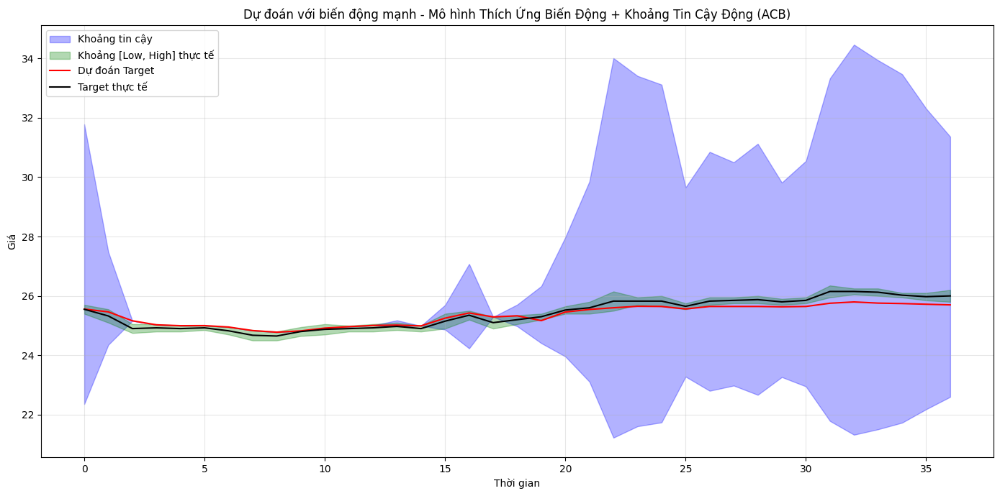


Top 20 đặc trưng quan trọng nhất:
                                 feature  mi_score  xgb_importance  \
target_ema_2                target_ema_2  0.016253        0.190153   
target_sma_2                target_sma_2  0.013859        0.188170   
low_sma_2                      low_sma_2  0.014242        0.101784   
target_aema_2              target_aema_2  0.010996        0.098215   
hmm_prob_state_1        hmm_prob_state_1  0.006544        0.080504   
high_sma_2                    high_sma_2  0.014011        0.058891   
hmm_prob_state_0        hmm_prob_state_0  0.005671        0.062693   
high_ema_2                    high_ema_2  0.015863        0.054522   
high_ema_3                    high_ema_3  0.012438        0.038107   
low_ema_2                      low_ema_2  0.015312        0.032511   
low_freq                        low_freq  0.009679        0.012268   
hmm_prob_state_2        hmm_prob_state_2  0.005611        0.010696   
low_ema_3                      low_ema_3  0.012022     

<Figure size 1200x800 with 0 Axes>

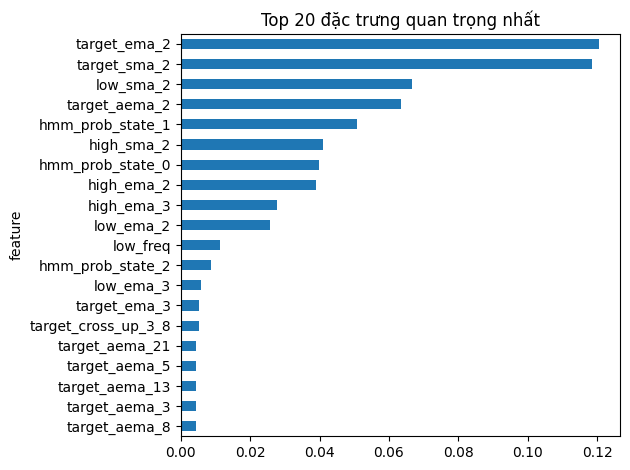

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 316 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 90 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 44 đặc trưng
  - Nhóm frequency: 4 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 5 đặc trưng
  - Nhóm trend: 22 đặc trưng
  - Nhóm other: 62 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (115 điểm)...


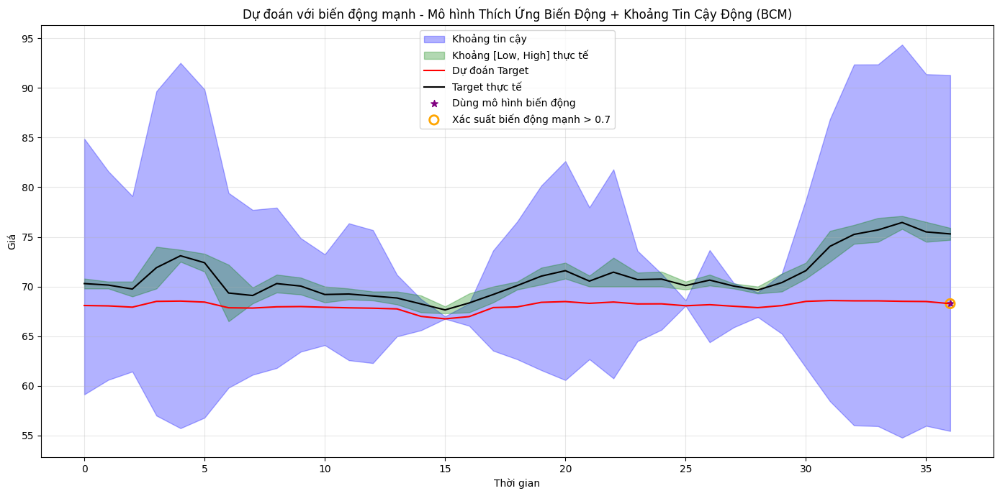


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
target_sma_2          target_sma_2  0.013004        0.223662        0.139399
target_aema_2        target_aema_2  0.010462        0.199852        0.124096
target_ema_2          target_ema_2  0.015646        0.156498        0.100157
hmm_prob_state_2  hmm_prob_state_2  0.003661        0.109501        0.067165
low_ema_2                low_ema_2  0.013325        0.089768        0.059191
doy_sin                    doy_sin  0.005424        0.070204        0.044292
high_ema_2              high_ema_2  0.013969        0.031010        0.024193
high_sma_2              high_sma_2  0.013166        0.024827        0.020162
low_freq                  low_freq  0.009829        0.017206        0.014255
target_ema_3          target_ema_3  0.012301        0.009702        0.010742
low_sma_2                low_sma_2  0.011732        0.007060        0.008929
high_aema_2            high_aema_2  0.010

<Figure size 1200x800 with 0 Axes>

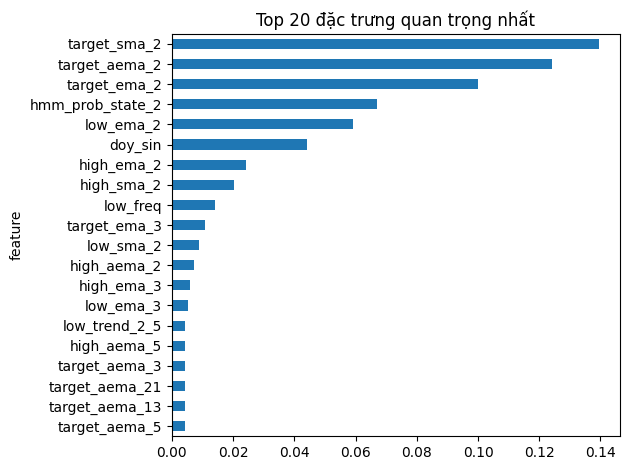

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 313 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 86 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 44 đặc trưng
  - Nhóm frequency: 4 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 4 đặc trưng
  - Nhóm trend: 22 đặc trưng
  - Nhóm other: 64 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (51 điểm)...
H

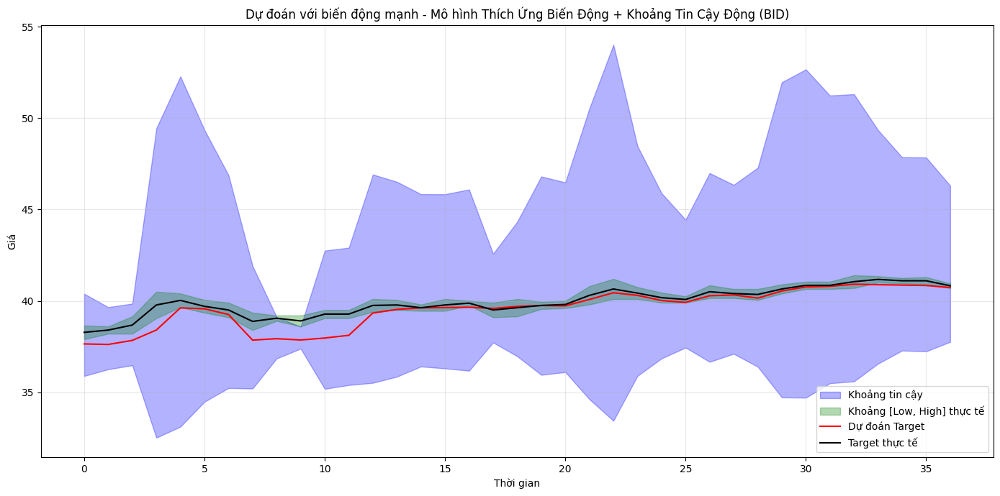


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
target_ema_2          target_ema_2  0.016879        0.233982        0.147141
target_sma_2          target_sma_2  0.014279        0.214010        0.134117
target_ema_3          target_ema_3  0.012893        0.086057        0.056791
low_sma_2                low_sma_2  0.012564        0.071632        0.048005
low_freq                  low_freq  0.008535        0.066314        0.043202
high_ema_3              high_ema_3  0.011869        0.051184        0.035458
high_ema_2              high_ema_2  0.015191        0.035720        0.027508
hmm_prob_state_0  hmm_prob_state_0  0.003315        0.043376        0.027352
low_ema_2                low_ema_2  0.013949        0.025697        0.020998
hmm_prob_state_2  hmm_prob_state_2  0.004664        0.030935        0.020426
hmm_prob_state_1  hmm_prob_state_1  0.003528        0.027800        0.018091
high_aema_5            high_aema_5  0.010

<Figure size 1200x800 with 0 Axes>

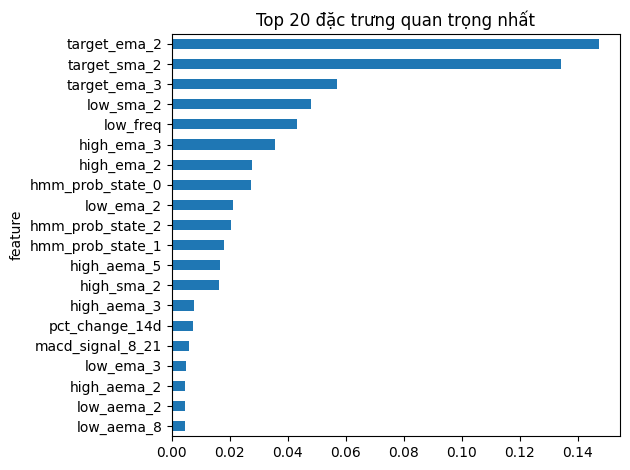

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 308 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 94 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 44 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 3 đặc trưng
  - Nhóm burst: 4 đặc trưng
  - Nhóm trend: 10 đặc trưng
  - Nhóm other: 60 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (48 điểm)...
H

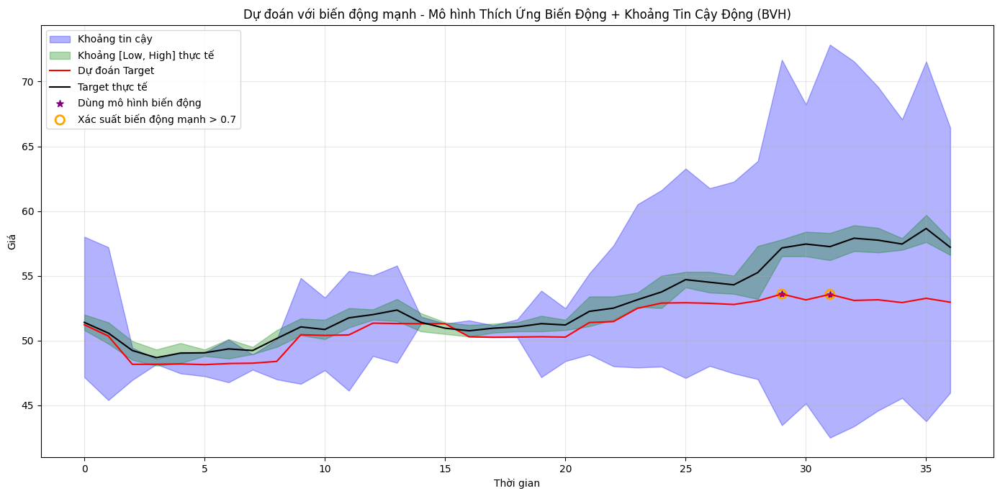


Top 20 đặc trưng quan trọng nhất:
                   feature  mi_score  xgb_importance  combined_score
month_cos        month_cos  0.005429        0.648912        0.391519
target_ma_5    target_ma_5  0.007414        0.138893        0.086301
doy_cos            doy_cos  0.007510        0.062662        0.040601
low_ema_2        low_ema_2  0.013280        0.037535        0.027833
target_lag_1  target_lag_1  0.008310        0.031908        0.022469
target_ema_2  target_ema_2  0.014763        0.016688        0.015918
high_ema_2      high_ema_2  0.013813        0.015635        0.014906
target_sma_2  target_sma_2  0.013062        0.009504        0.010927
low_sma_2        low_sma_2  0.011341        0.005395        0.007773
low_freq          low_freq  0.009678        0.003974        0.006256
target_ema_3  target_ema_3  0.011582        0.001572        0.005576
high_sma_2      high_sma_2  0.012490        0.000872        0.005519
high_ema_3      high_ema_3  0.011684        0.000417        0.004924

<Figure size 1200x800 with 0 Axes>

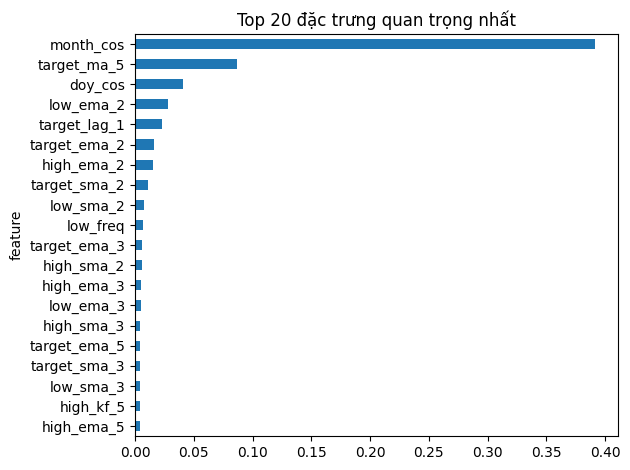

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 309 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 92 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 43 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 15 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 5 đặc trưng
  - Nhóm trend: 18 đặc trưng
  - Nhóm other: 57 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (61 điểm)...
H

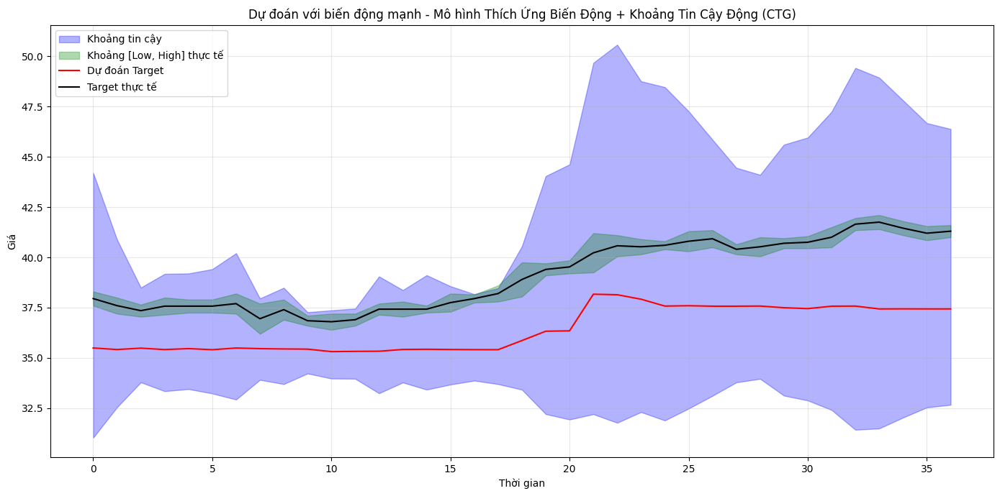


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
target_aema_3        target_aema_3  0.010364        0.589701        0.357967
high_sma_2              high_sma_2  0.013219        0.226653        0.141279
target_ema_2          target_ema_2  0.015023        0.041911        0.031156
low_freq                  low_freq  0.009434        0.029258        0.021328
hmm_prob_state_2  hmm_prob_state_2  0.005407        0.025903        0.017705
target_sma_2          target_sma_2  0.013455        0.020054        0.017414
low_sma_2                low_sma_2  0.013317        0.015890        0.014861
target_lag_1          target_lag_1  0.009775        0.007367        0.008330
low_ema_2                low_ema_2  0.014172        0.003972        0.008052
high_ema_2              high_ema_2  0.013805        0.004065        0.007961
hmm_prob_state_1  hmm_prob_state_1  0.002320        0.010881        0.007456
target_aema_2        target_aema_2  0.010

<Figure size 1200x800 with 0 Axes>

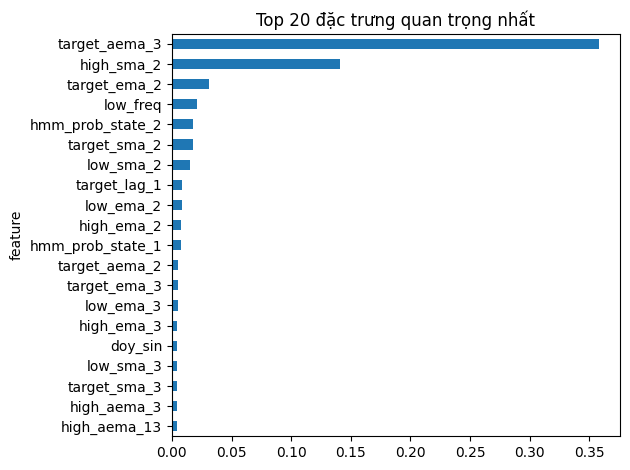

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 318 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 93 đặc trưng
  - Nhóm technical: 70 đặc trưng
  - Nhóm volatility: 47 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 4 đặc trưng
  - Nhóm trend: 22 đặc trưng
  - Nhóm other: 58 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (49 điểm)...
H

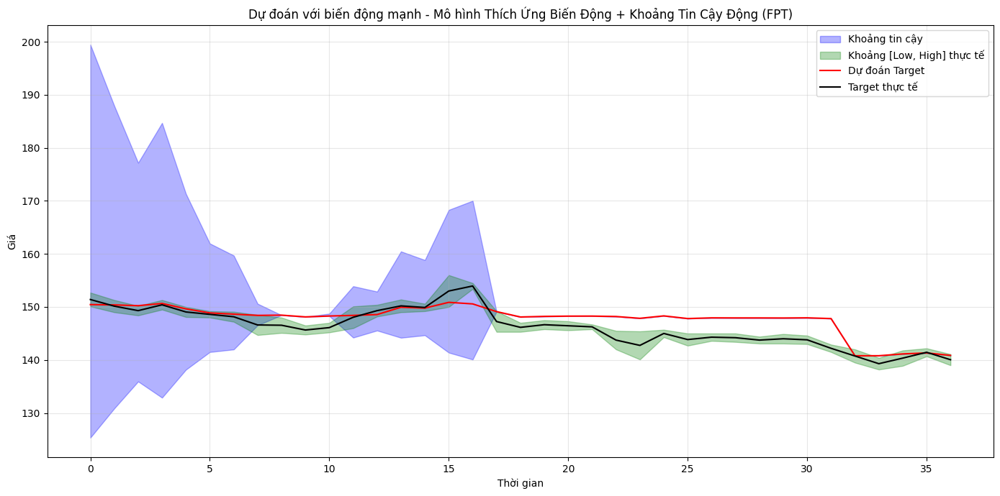


Top 20 đặc trưng quan trọng nhất:
                   feature  mi_score  xgb_importance  combined_score
month_cos        month_cos  0.005135        0.484732        0.292893
target_lag_1  target_lag_1  0.008774        0.113310        0.071495
target_sma_2  target_sma_2  0.013149        0.098967        0.064640
high_ema_2      high_ema_2  0.014473        0.075533        0.051109
low_ema_2        low_ema_2  0.014678        0.058050        0.040701
high_ema_3      high_ema_3  0.011345        0.053503        0.036640
target_ema_2  target_ema_2  0.014943        0.039260        0.029533
high_std_8      high_std_8  0.003627        0.019543        0.013177
low_freq          low_freq  0.007930        0.011389        0.010006
target_ema_3  target_ema_3  0.011813        0.002187        0.006037
target_ema_5  target_ema_5  0.009985        0.003156        0.005888
low_sma_2        low_sma_2  0.013034        0.000302        0.005395
low_ema_3        low_ema_3  0.012021        0.000904        0.005351

<Figure size 1200x800 with 0 Axes>

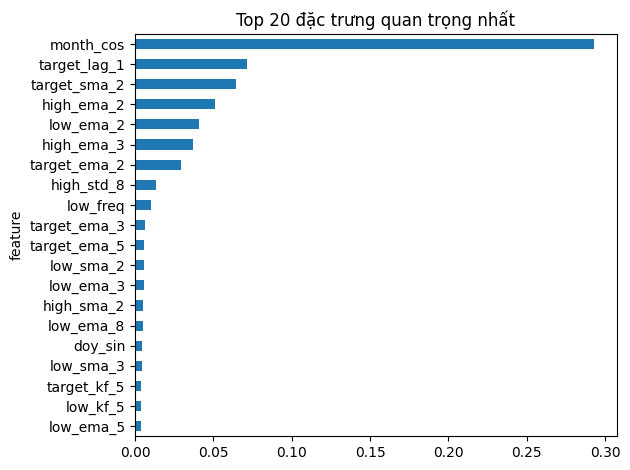

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 307 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 95 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 45 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 5 đặc trưng
  - Nhóm trend: 10 đặc trưng
  - Nhóm other: 57 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (54 điểm)...
H

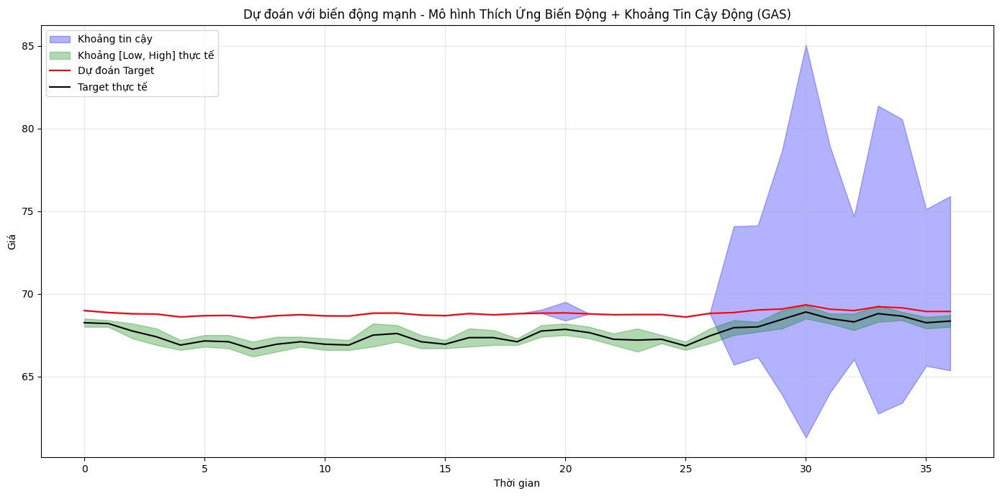


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
target_sma_2          target_sma_2  0.012817        0.226628        0.141103
high_sma_2              high_sma_2  0.012642        0.212169        0.132358
target_ema_5          target_ema_5  0.009159        0.201928        0.124820
target_ema_2          target_ema_2  0.014254        0.071251        0.048452
target_ema_3          target_ema_3  0.011332        0.062090        0.041787
high_aema_2            high_aema_2  0.010024        0.044685        0.030821
high_ema_2              high_ema_2  0.013824        0.027867        0.022249
target_aema_2        target_aema_2  0.010029        0.027584        0.020562
low_freq                  low_freq  0.008797        0.019482        0.015208
hmm_prob_state_2  hmm_prob_state_2  0.004337        0.021900        0.014875
low_ema_2                low_ema_2  0.012512        0.010582        0.011354
low_ema_3                low_ema_3  0.010

<Figure size 1200x800 with 0 Axes>

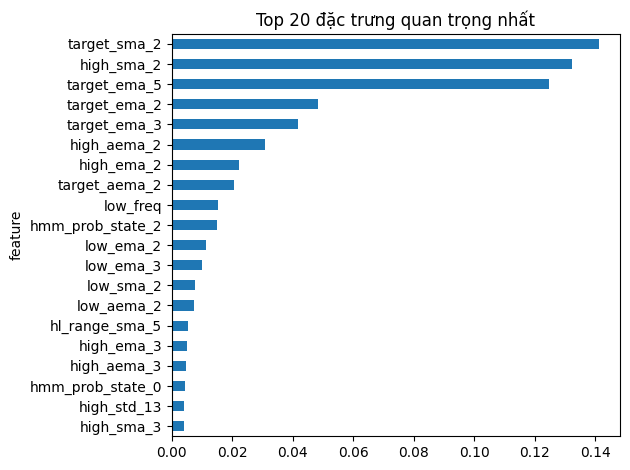

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 321 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 95 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 45 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 4 đặc trưng
  - Nhóm trend: 20 đặc trưng
  - Nhóm other: 62 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (96 điểm)...
H

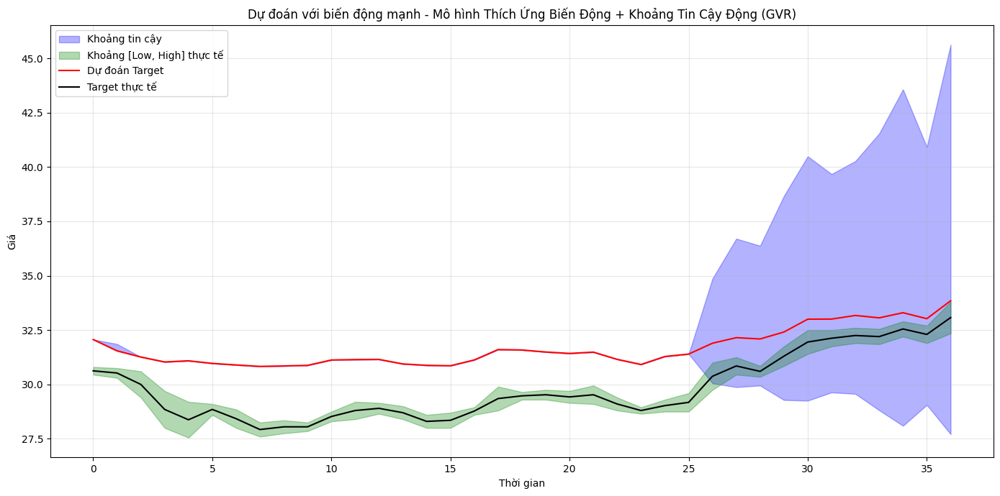


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
target_aema_3        target_aema_3  0.010100        0.349116        0.213509
target_aema_2        target_aema_2  0.010100        0.190046        0.118067
target_ema_2          target_ema_2  0.015638        0.140524        0.090570
low_sma_2                low_sma_2  0.013145        0.099792        0.065134
low_ema_2                low_ema_2  0.014959        0.053204        0.037906
high_ema_2              high_ema_2  0.013224        0.030481        0.023578
hmm_prob_state_2  hmm_prob_state_2  0.005408        0.029905        0.020106
hmm_prob_state_1  hmm_prob_state_1  0.005540        0.019087        0.013668
high_diff_5            high_diff_5  0.002698        0.017584        0.011629
target_sma_2          target_sma_2  0.013184        0.006008        0.008878
rsi_14                      rsi_14  0.003934        0.010057        0.007608
target_lag_1          target_lag_1  0.008

<Figure size 1200x800 with 0 Axes>

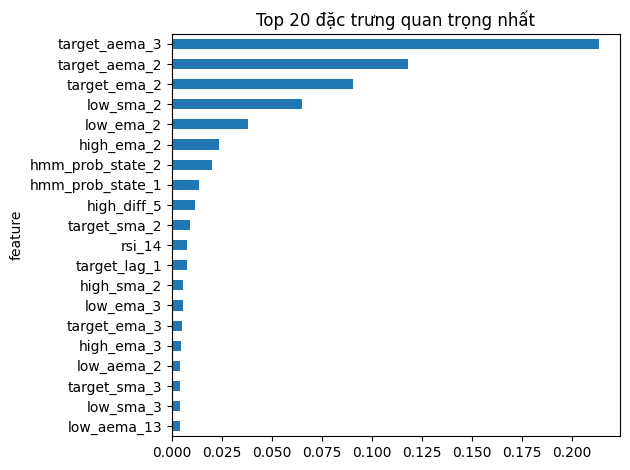

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 302 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 84 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 46 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 5 đặc trưng
  - Nhóm trend: 12 đặc trưng
  - Nhóm other: 60 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (68 điểm)...
H

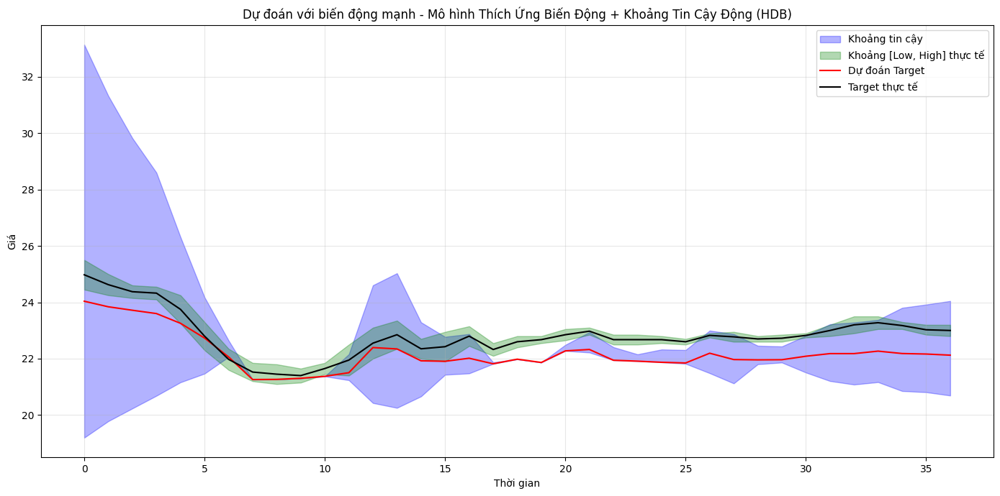


Top 20 đặc trưng quan trọng nhất:
                                             feature  mi_score  \
hmm_prob_state_2                    hmm_prob_state_2  0.004372   
target_sma_2                            target_sma_2  0.012421   
target_ema_2                            target_ema_2  0.013587   
high_sma_2                                high_sma_2  0.011708   
target_lag_1                            target_lag_1  0.009666   
low_ema_2                                  low_ema_2  0.012769   
doy_sin                                      doy_sin  0.008239   
high_ema_2                                high_ema_2  0.012859   
hmm_prob_state_0                    hmm_prob_state_0  0.005020   
low_sma_2                                  low_sma_2  0.011751   
kmeans_dist_to_centroid_0  kmeans_dist_to_centroid_0  0.004691   
high_sma_3                                high_sma_3  0.009769   
low_freq                                    low_freq  0.009331   
kmeans_cluster                        kme

<Figure size 1200x800 with 0 Axes>

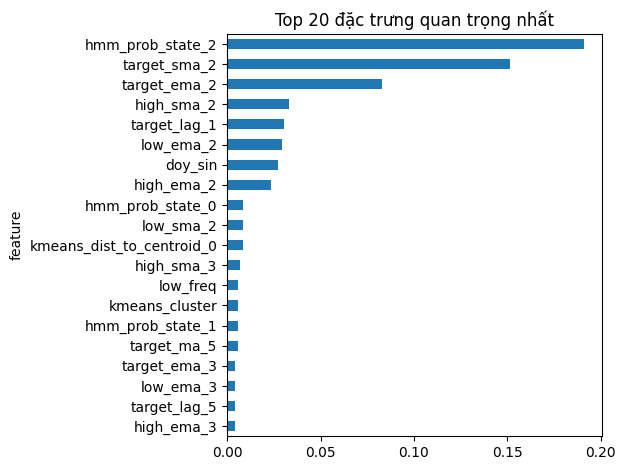

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 300 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 85 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 45 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 3 đặc trưng
  - Nhóm burst: 4 đặc trưng
  - Nhóm trend: 14 đặc trưng
  - Nhóm other: 56 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (52 điểm)...
H

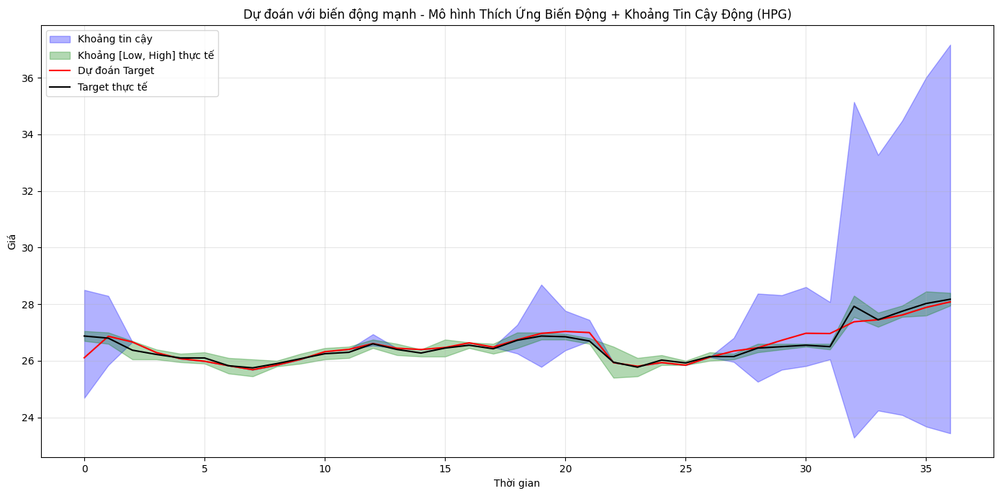


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
high_sma_2              high_sma_2  0.012154        0.402861        0.246578
low_sma_2                low_sma_2  0.012764        0.246038        0.152728
target_sma_2          target_sma_2  0.013001        0.090051        0.059231
target_ema_2          target_ema_2  0.015154        0.080131        0.054140
low_ema_2                low_ema_2  0.013980        0.073628        0.049769
hmm_prob_state_0  hmm_prob_state_0  0.001264        0.071959        0.043681
high_ema_2              high_ema_2  0.014101        0.005130        0.008718
doy_sin                    doy_sin  0.006875        0.004474        0.005434
target_aema_2        target_aema_2  0.011630        0.000742        0.005097
high_ema_3              high_ema_3  0.011914        0.000460        0.005042
target_ema_3          target_ema_3  0.012264        0.000024        0.004920
low_ema_3                low_ema_3  0.011

<Figure size 1200x800 with 0 Axes>

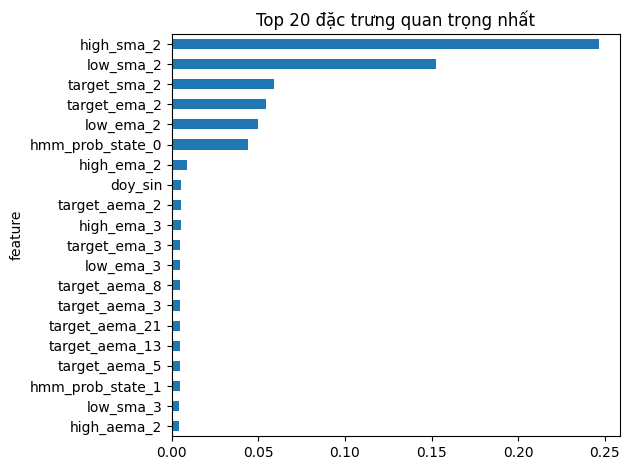

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 303 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 92 đặc trưng
  - Nhóm technical: 70 đặc trưng
  - Nhóm volatility: 44 đặc trưng
  - Nhóm frequency: 3 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 4 đặc trưng
  - Nhóm trend: 13 đặc trưng
  - Nhóm other: 59 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (95 điểm)...
H

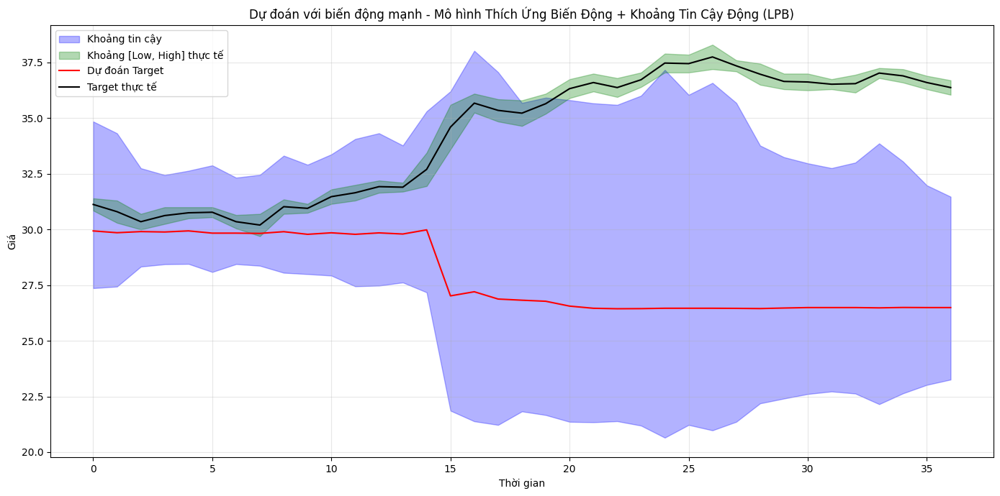


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
hmm_state                hmm_state  0.003261        0.486085        0.292955
hmm_prob_state_1  hmm_prob_state_1  0.004737        0.117367        0.072315
low_freq                  low_freq  0.008944        0.078024        0.050392
target_sma_2          target_sma_2  0.011696        0.074173        0.049182
target_ema_2          target_ema_2  0.013212        0.071727        0.048321
target_lag_5          target_lag_5  0.005602        0.038076        0.025087
high_sma_2              high_sma_2  0.011343        0.021939        0.017701
hmm_prob_state_0  hmm_prob_state_0  0.004756        0.023579        0.016050
high_ema_2              high_ema_2  0.012486        0.016911        0.015141
doy_sin                    doy_sin  0.006046        0.016293        0.012194
low_sma_2                low_sma_2  0.011556        0.010310        0.010808
target_ema_5          target_ema_5  0.009

<Figure size 1200x800 with 0 Axes>

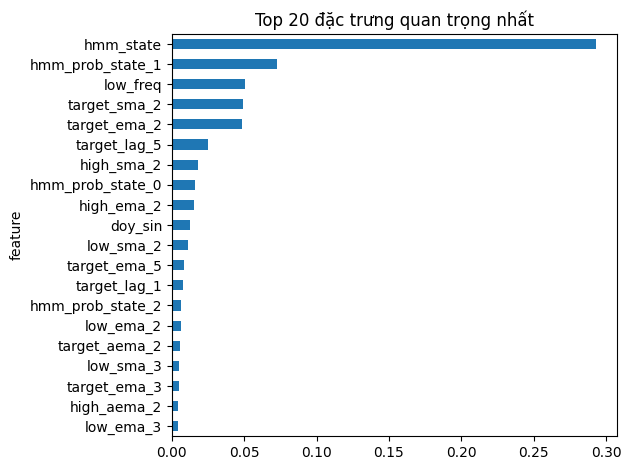

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 310 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 88 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 45 đặc trưng
  - Nhóm frequency: 5 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 3 đặc trưng
  - Nhóm burst: 4 đặc trưng
  - Nhóm trend: 16 đặc trưng
  - Nhóm other: 62 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (111 điểm)...


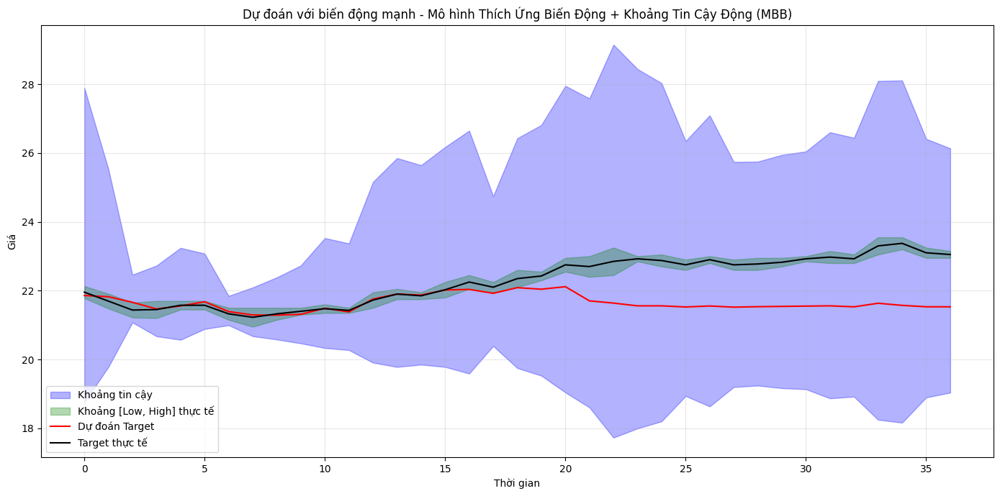


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
target_sma_2          target_sma_2  0.014072        0.468652        0.286820
low_ema_2                low_ema_2  0.014602        0.115028        0.074857
hmm_prob_state_2  hmm_prob_state_2  0.005039        0.108331        0.067014
target_ema_2          target_ema_2  0.016200        0.071613        0.049448
high_sma_2              high_sma_2  0.014173        0.070865        0.048189
low_sma_2                low_sma_2  0.013231        0.044291        0.031867
high_ema_2              high_ema_2  0.016209        0.029314        0.024072
low_freq                  low_freq  0.010608        0.020495        0.016540
low_ema_3                low_ema_3  0.012137        0.003687        0.007067
hmm_prob_state_0  hmm_prob_state_0  0.005539        0.005689        0.005629
target_aema_2        target_aema_2  0.010890        0.002018        0.005567
high_ema_3              high_ema_3  0.013

<Figure size 1200x800 with 0 Axes>

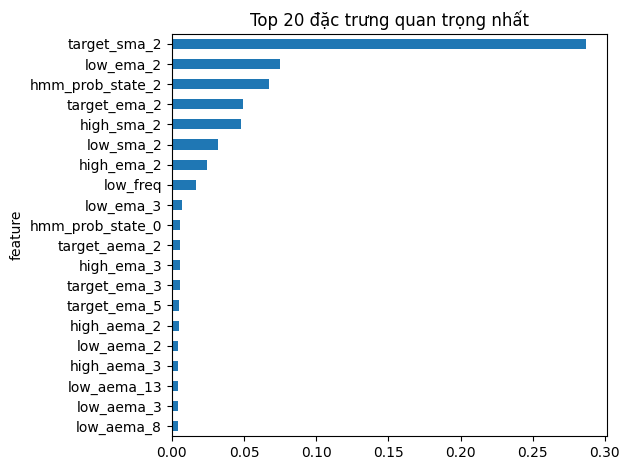

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 317 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 95 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 46 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 5 đặc trưng
  - Nhóm trend: 19 đặc trưng
  - Nhóm other: 57 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (79 điểm)...
H

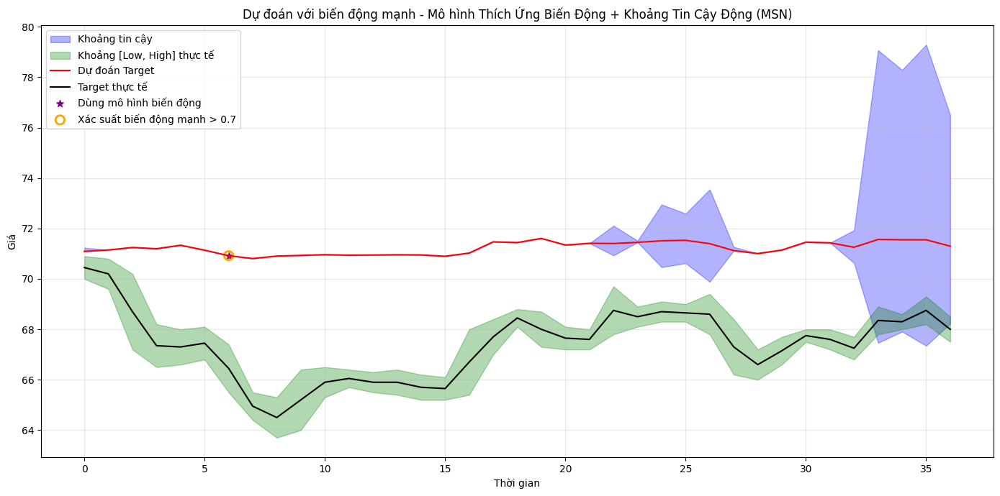


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
high_sma_2              high_sma_2  0.013945        0.236815        0.147667
target_ema_2          target_ema_2  0.017065        0.197431        0.125285
high_ema_2              high_ema_2  0.015420        0.180154        0.114260
target_sma_2          target_sma_2  0.014896        0.104819        0.068849
hmm_prob_state_1  hmm_prob_state_1  0.005525        0.055101        0.035270
hmm_prob_state_0  hmm_prob_state_0  0.005154        0.046751        0.030112
low_ema_2                low_ema_2  0.015868        0.022856        0.020061
kmeans_cluster      kmeans_cluster  0.004296        0.020662        0.014116
hmm_prob_state_2  hmm_prob_state_2  0.005255        0.017436        0.012564
high_ema_3              high_ema_3  0.012595        0.012417        0.012488
low_sma_2                low_sma_2  0.014265        0.006834        0.009806
low_freq                  low_freq  0.010

<Figure size 1200x800 with 0 Axes>

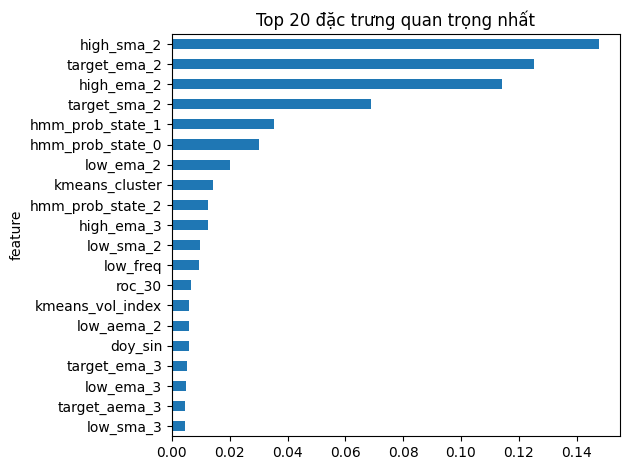

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 309 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 93 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 41 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 5 đặc trưng
  - Nhóm trend: 16 đặc trưng
  - Nhóm other: 59 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (100 điểm)...


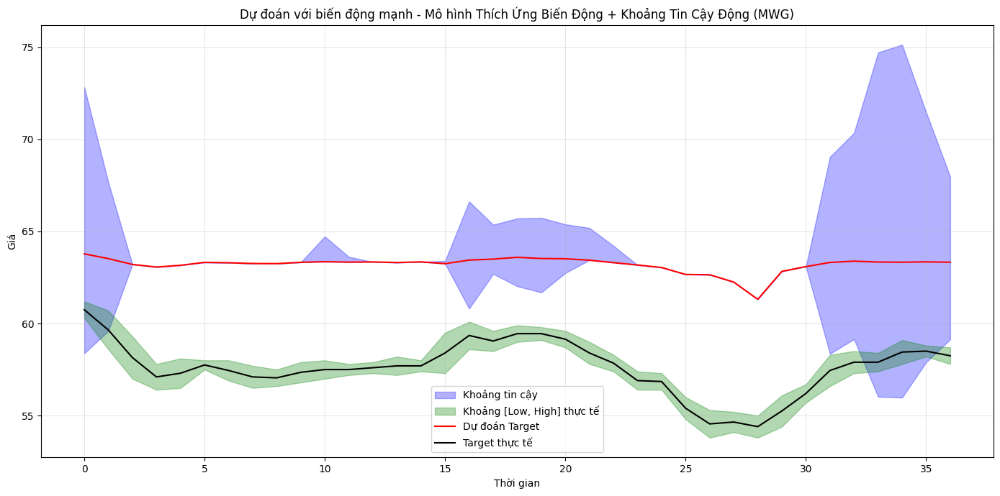


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
target_ema_3          target_ema_3  0.012361        0.699017        0.424354
hmm_prob_state_2  hmm_prob_state_2  0.003533        0.081742        0.050459
target_ema_2          target_ema_2  0.014994        0.047485        0.034488
low_aema_2              low_aema_2  0.010467        0.039989        0.028180
low_ema_2                low_ema_2  0.014334        0.029807        0.023618
target_sma_2          target_sma_2  0.012983        0.029479        0.022881
high_sma_2              high_sma_2  0.012451        0.023714        0.019209
high_ema_2              high_ema_2  0.013593        0.010861        0.011954
high_ema_3              high_ema_3  0.011140        0.002676        0.006061
low_sma_2                low_sma_2  0.012932        0.000830        0.005671
low_ema_3                low_ema_3  0.011630        0.001174        0.005357
target_ema_5          target_ema_5  0.009

<Figure size 1200x800 with 0 Axes>

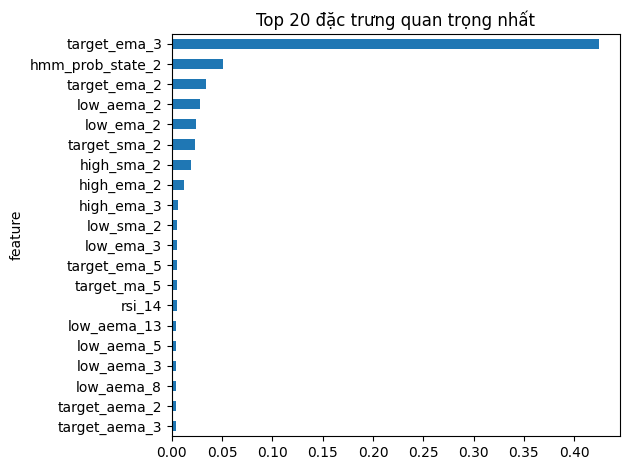

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 317 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 92 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 46 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 5 đặc trưng
  - Nhóm trend: 18 đặc trưng
  - Nhóm other: 61 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (87 điểm)...
H

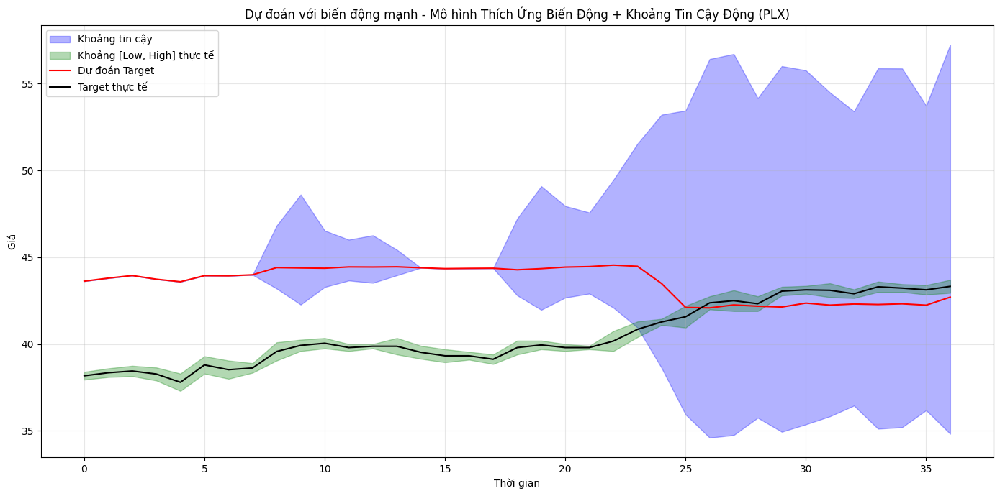


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
low_freq                  low_freq  0.009453        0.553225        0.335716
target_lag_1          target_lag_1  0.008736        0.139092        0.086949
target_sma_2          target_sma_2  0.012207        0.108040        0.069707
high_sma_2              high_sma_2  0.012384        0.067838        0.045656
low_sma_2                low_sma_2  0.011382        0.020800        0.017033
hmm_prob_state_0  hmm_prob_state_0  0.004304        0.020586        0.014074
high_ema_2              high_ema_2  0.013811        0.011058        0.012159
hmm_prob_state_1  hmm_prob_state_1  0.004337        0.015967        0.011315
target_ema_2          target_ema_2  0.013881        0.007922        0.010306
target_ema_5          target_ema_5  0.009592        0.007289        0.008210
target_aema_2        target_aema_2  0.009277        0.006924        0.007865
low_ema_2                low_ema_2  0.012

<Figure size 1200x800 with 0 Axes>

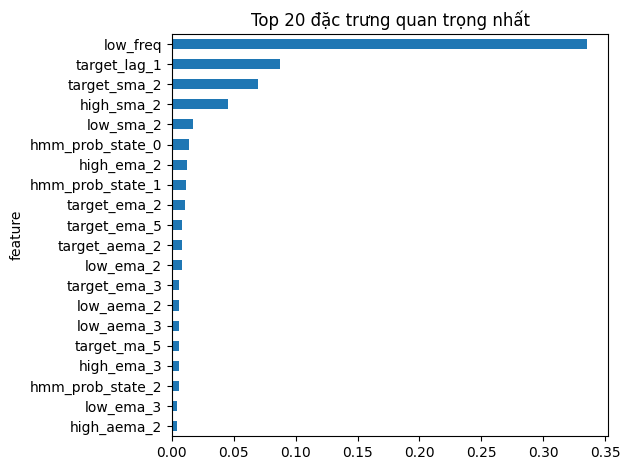

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 315 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 86 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 43 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 4 đặc trưng
  - Nhóm trend: 22 đặc trưng
  - Nhóm other: 65 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (115 điểm)...


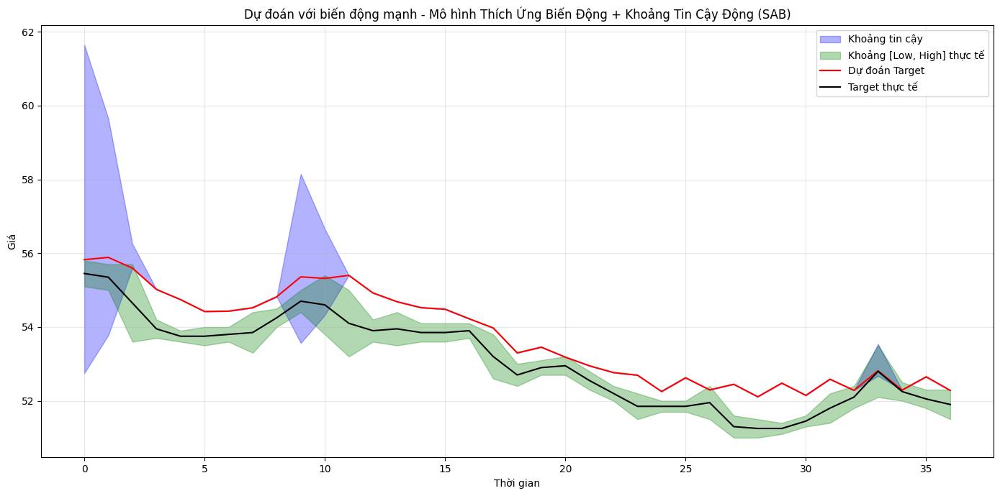


Top 20 đặc trưng quan trọng nhất:
                                             feature  mi_score  \
target_sma_2                            target_sma_2  0.012831   
high_sma_2                                high_sma_2  0.012305   
hmm_prob_state_1                    hmm_prob_state_1  0.002733   
target_ema_2                            target_ema_2  0.015476   
low_ema_2                                  low_ema_2  0.013487   
volatility_predictor            volatility_predictor  0.003049   
high_ema_2                                high_ema_2  0.013889   
volatility_14d                        volatility_14d  0.005391   
hmm_prob_state_2                    hmm_prob_state_2  0.003887   
target_astd_8                          target_astd_8  0.003252   
target_ema_3                            target_ema_3  0.011369   
doy_sin                                      doy_sin  0.005776   
kmeans_dist_to_centroid_0  kmeans_dist_to_centroid_0  0.007881   
price_change_7d                      pric

<Figure size 1200x800 with 0 Axes>

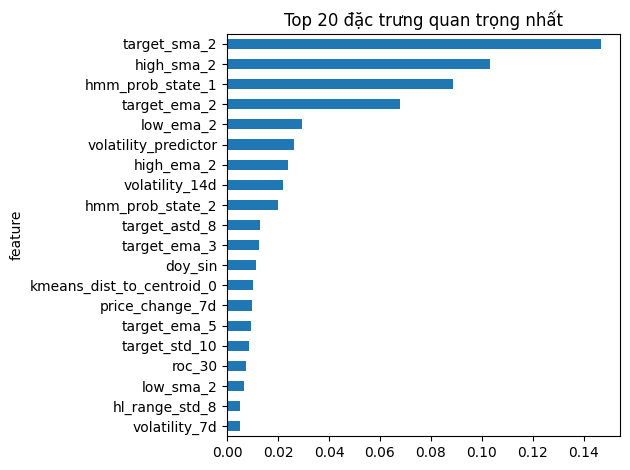

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 304 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 92 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 47 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 4 đặc trưng
  - Nhóm trend: 11 đặc trưng
  - Nhóm other: 55 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (66 điểm)...
H

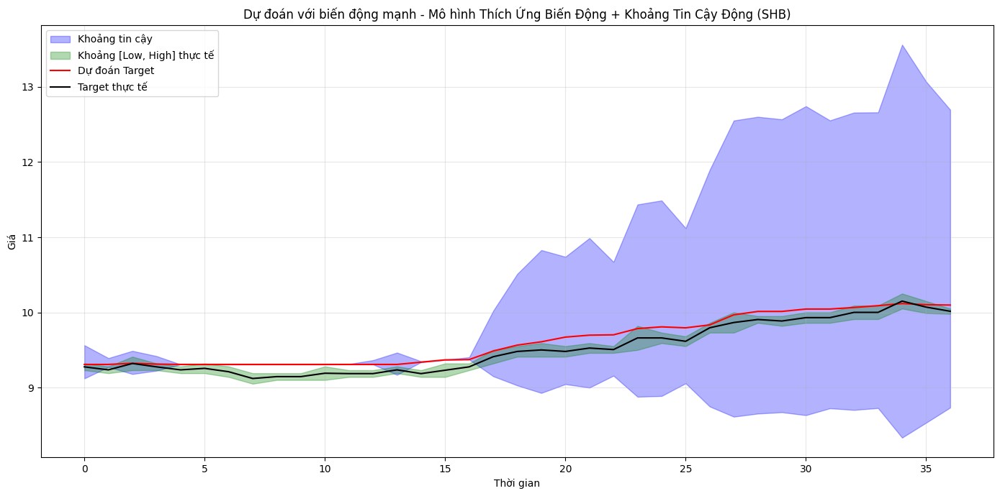


Top 20 đặc trưng quan trọng nhất:
                                 feature  mi_score  xgb_importance  \
target_aema_2              target_aema_2  0.009574        0.292912   
target_ema_3                target_ema_3  0.012224        0.187271   
target_ema_5                target_ema_5  0.009086        0.179326   
target_sma_2                target_sma_2  0.013176        0.120639   
target_ema_2                target_ema_2  0.015079        0.065877   
hmm_prob_state_2        hmm_prob_state_2  0.009374        0.045109   
hmm_state                      hmm_state  0.004106        0.026732   
low_sma_2                      low_sma_2  0.013017        0.020540   
hmm_prob_state_1        hmm_prob_state_1  0.009431        0.013261   
high_ema_2                    high_ema_2  0.014111        0.008519   
low_ema_2                      low_ema_2  0.014197        0.005021   
distance_to_prev_cp  distance_to_prev_cp  0.005925        0.009245   
high_sma_2                    high_sma_2  0.012882     

<Figure size 1200x800 with 0 Axes>

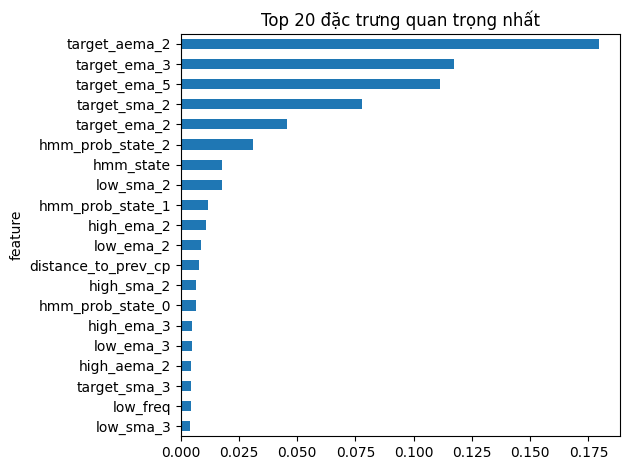

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 327 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 99 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 46 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 15 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 5 đặc trưng
  - Nhóm trend: 22 đặc trưng
  - Nhóm other: 61 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (84 điểm)...
H

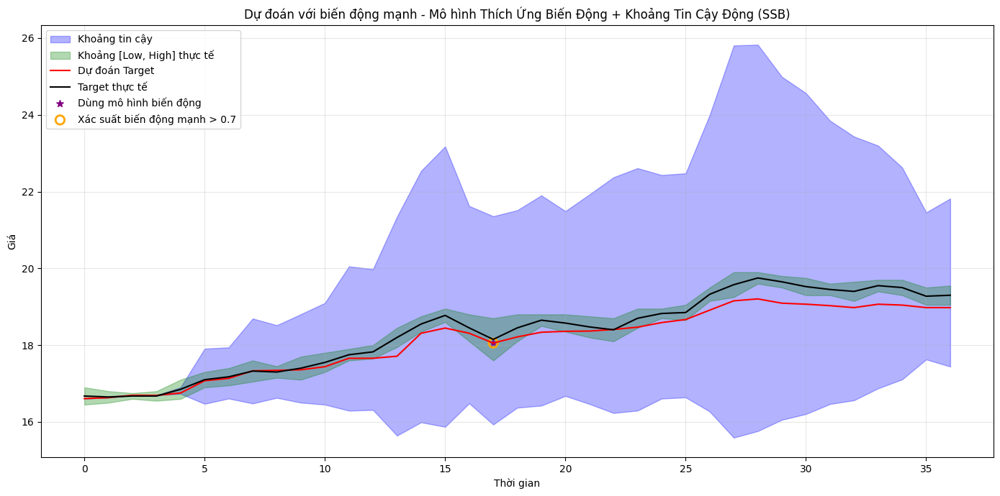


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
doy_cos                    doy_cos  0.007274        0.630426        0.381165
target_lag_1          target_lag_1  0.008336        0.047839        0.032038
pct_change_21d      pct_change_21d  0.005475        0.045902        0.029731
low_sma_2                low_sma_2  0.011057        0.032282        0.023792
low_ema_2                low_ema_2  0.012078        0.024000        0.019232
high_ema_2              high_ema_2  0.011828        0.017806        0.015415
target_ema_2          target_ema_2  0.013105        0.013978        0.013629
roc_20                      roc_20  0.005242        0.018459        0.013172
target_sma_2          target_sma_2  0.011580        0.011102        0.011293
target_ema_5          target_ema_5  0.008221        0.011999        0.010488
price_change_21d  price_change_21d  0.005131        0.013636        0.010234
roc_10                      roc_10  0.004

<Figure size 1200x800 with 0 Axes>

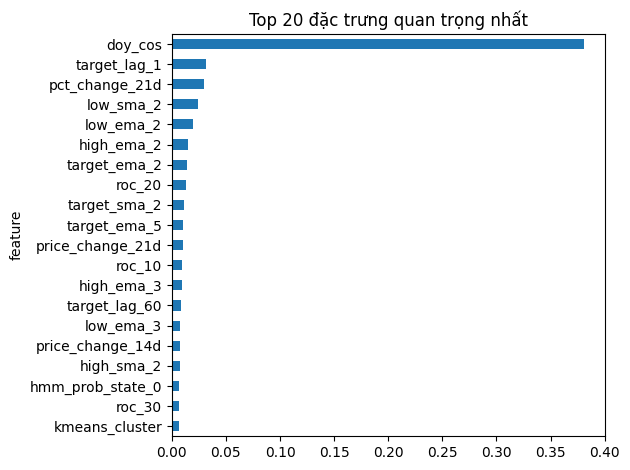

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 303 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 88 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 44 đặc trưng
  - Nhóm frequency: 4 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 4 đặc trưng
  - Nhóm trend: 15 đặc trưng
  - Nhóm other: 59 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (87 điểm)...
H

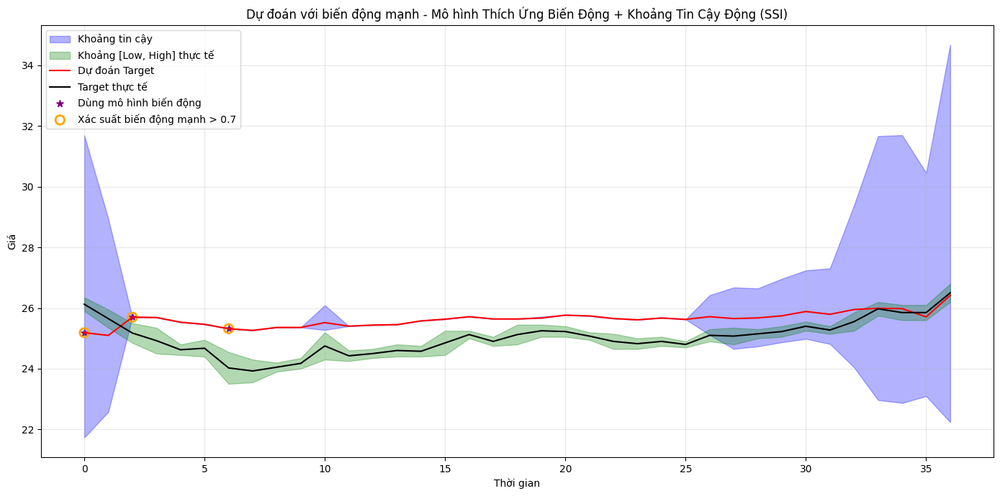


Top 20 đặc trưng quan trọng nhất:
                                             feature  mi_score  \
high_sma_2                                high_sma_2  0.012951   
target_ema_2                            target_ema_2  0.015142   
low_ema_2                                  low_ema_2  0.015183   
low_sma_2                                  low_sma_2  0.013918   
low_freq                                    low_freq  0.010179   
target_aema_3                          target_aema_3  0.010352   
hmm_prob_state_2                    hmm_prob_state_2  0.004948   
high_ema_2                                high_ema_2  0.014035   
kmeans_cluster                        kmeans_cluster  0.003895   
target_sma_2                            target_sma_2  0.013563   
hmm_prob_state_0                    hmm_prob_state_0  0.004863   
macd_8_21                                  macd_8_21  0.005892   
high_ema_3                                high_ema_3  0.011767   
hmm_prob_state_1                    hmm_p

<Figure size 1200x800 with 0 Axes>

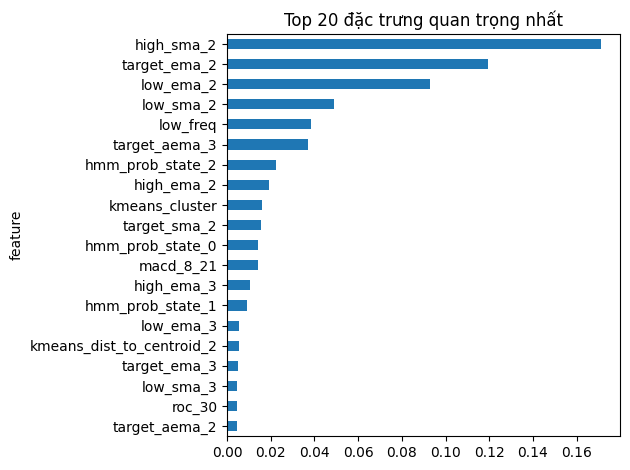

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 311 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 88 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 47 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 15 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 5 đặc trưng
  - Nhóm trend: 17 đặc trưng
  - Nhóm other: 60 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (94 điểm)...
H

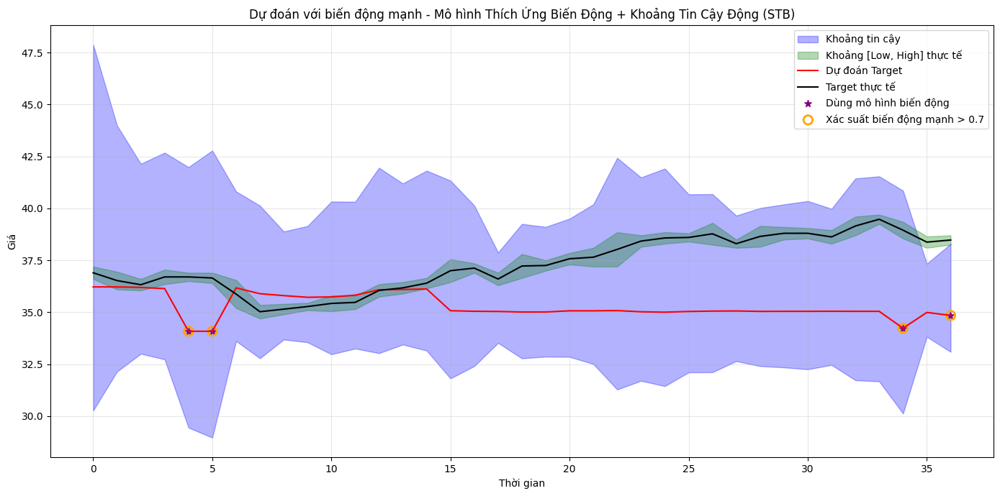


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
month_cos                month_cos  0.005729        0.719696        0.434109
target_ma_5            target_ma_5  0.008052        0.041973        0.028405
target_ema_2          target_ema_2  0.014076        0.036669        0.027632
target_sma_2          target_sma_2  0.012717        0.026357        0.020901
low_aema_8              low_aema_8  0.009929        0.027046        0.020199
target_ema_5          target_ema_5  0.009249        0.018381        0.014728
hmm_prob_state_2  hmm_prob_state_2  0.004068        0.021595        0.014584
high_ema_2              high_ema_2  0.013274        0.012464        0.012788
pct_change_21d      pct_change_21d  0.003452        0.015407        0.010625
target_lag_2          target_lag_2  0.006926        0.013089        0.010624
low_aema_2              low_aema_2  0.009929        0.007267        0.008332
low_ema_2                low_ema_2  0.013

<Figure size 1200x800 with 0 Axes>

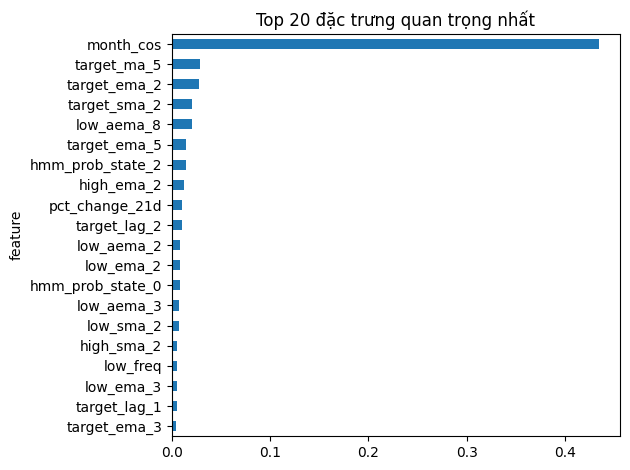

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 303 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 83 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 46 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 4 đặc trưng
  - Nhóm trend: 14 đặc trưng
  - Nhóm other: 61 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (72 điểm)...
H

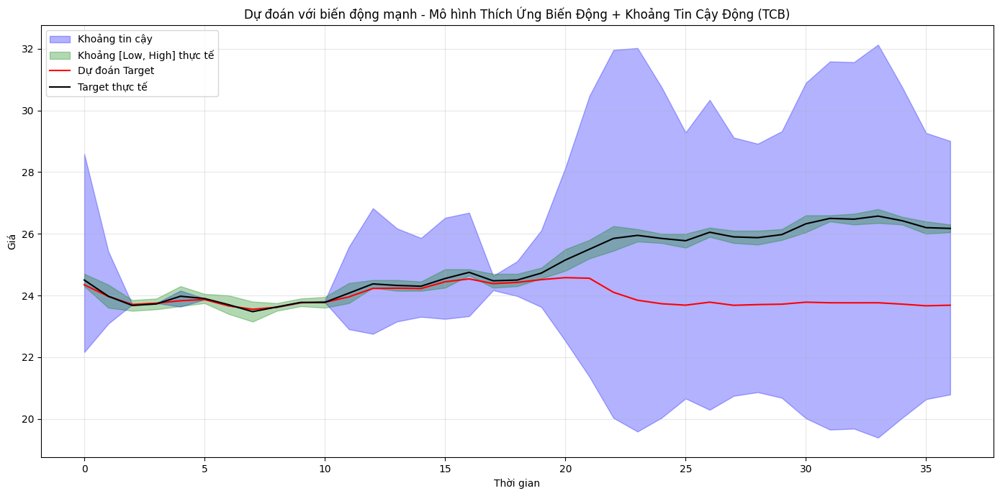


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
target_sma_2          target_sma_2  0.014802        0.259881        0.161850
target_ema_2          target_ema_2  0.016451        0.214830        0.135478
low_ema_2                low_ema_2  0.015528        0.105485        0.069502
high_sma_2              high_sma_2  0.013435        0.071163        0.048072
hmm_prob_state_2  hmm_prob_state_2  0.007200        0.067123        0.043154
low_sma_2                low_sma_2  0.014043        0.029230        0.023155
target_aema_2        target_aema_2  0.011995        0.023882        0.019127
hmm_state                hmm_state  0.004925        0.028592        0.019125
hmm_prob_state_0  hmm_prob_state_0  0.005676        0.026243        0.018016
high_ema_2              high_ema_2  0.015577        0.013033        0.014051
target_lag_1          target_lag_1  0.010055        0.015542        0.013347
kmeans_cluster      kmeans_cluster  0.004

<Figure size 1200x800 with 0 Axes>

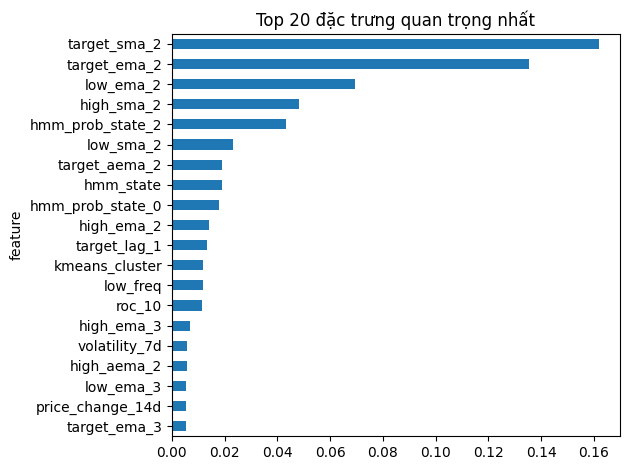

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 314 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 87 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 45 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 4 đặc trưng
  - Nhóm trend: 19 đặc trưng
  - Nhóm other: 64 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (120 điểm)...


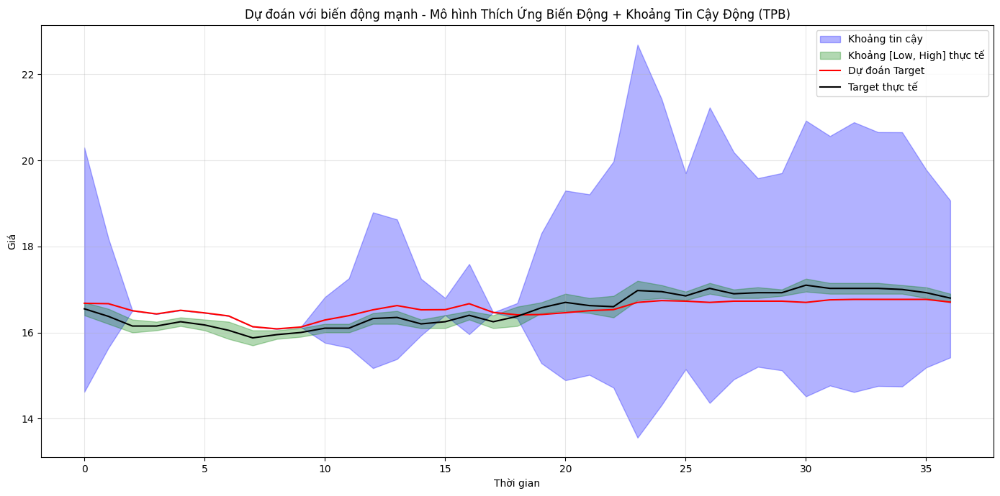


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
doy_cos                    doy_cos  0.007308        0.425550        0.258253
target_ema_2          target_ema_2  0.014531        0.120481        0.078101
high_ema_2              high_ema_2  0.013877        0.106559        0.069486
high_sma_2              high_sma_2  0.012328        0.087025        0.057146
target_sma_2          target_sma_2  0.012689        0.075070        0.050118
high_ema_3              high_ema_3  0.011489        0.046660        0.032592
roc_30                      roc_30  0.006620        0.025821        0.018141
target_ma_5            target_ma_5  0.008136        0.022677        0.016860
low_sma_2                low_sma_2  0.012239        0.013935        0.013256
low_freq                  low_freq  0.008968        0.015730        0.013025
low_ema_2                low_ema_2  0.013022        0.004389        0.007842
low_ema_3                low_ema_3  0.010

<Figure size 1200x800 with 0 Axes>

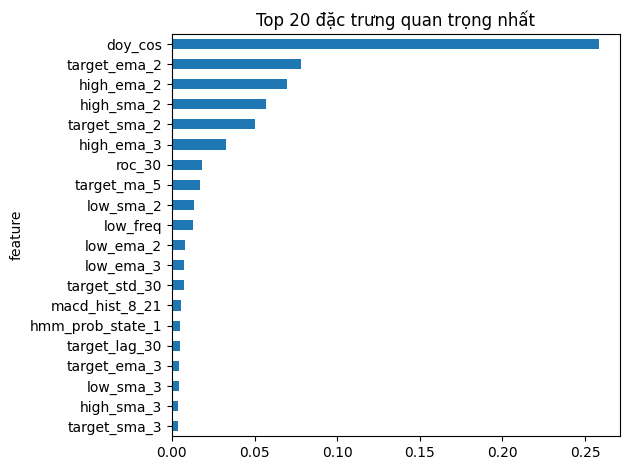

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 314 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 91 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 44 đặc trưng
  - Nhóm frequency: 5 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 3 đặc trưng
  - Nhóm burst: 5 đặc trưng
  - Nhóm trend: 19 đặc trưng
  - Nhóm other: 60 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (86 điểm)...
H

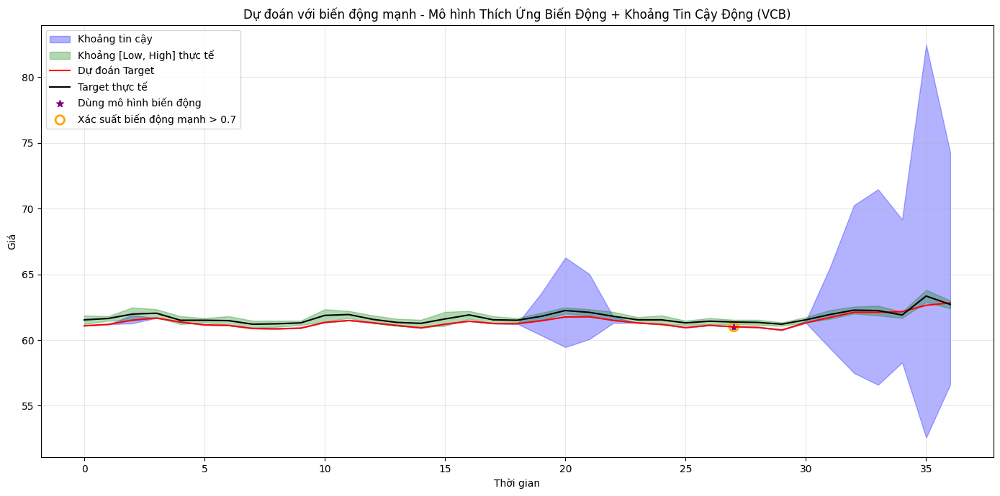


Top 20 đặc trưng quan trọng nhất:
                               feature  mi_score  xgb_importance  \
target_sma_2              target_sma_2  0.013862        0.463655   
target_ema_2              target_ema_2  0.016702        0.151054   
high_sma_2                  high_sma_2  0.014528        0.081270   
segment_volatility  segment_volatility  0.008977        0.061571   
high_ema_2                  high_ema_2  0.016101        0.049892   
hmm_prob_state_1      hmm_prob_state_1  0.004791        0.050140   
hmm_prob_state_2      hmm_prob_state_2  0.006398        0.030428   
target_std_30            target_std_30  0.003255        0.023103   
hmm_prob_state_0      hmm_prob_state_0  0.004387        0.022279   
high_ema_3                  high_ema_3  0.013209        0.007812   
low_ema_2                    low_ema_2  0.014327        0.005362   
low_aema_2                  low_aema_2  0.011481        0.002861   
low_sma_2                    low_sma_2  0.012559        0.001233   
target_ema_3 

<Figure size 1200x800 with 0 Axes>

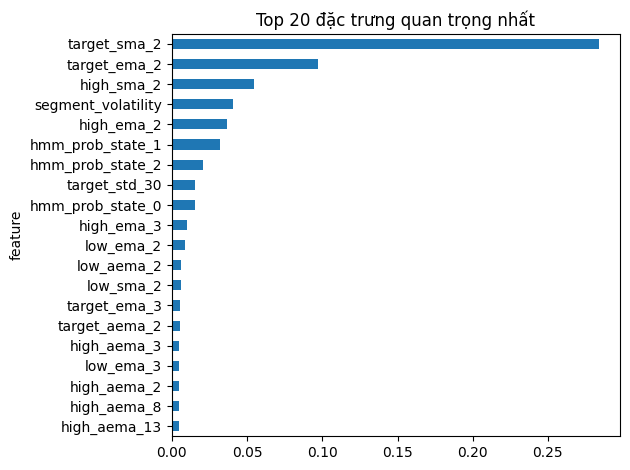

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 317 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 93 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 47 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 15 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 4 đặc trưng
  - Nhóm trend: 16 đặc trưng
  - Nhóm other: 63 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (78 điểm)...
H

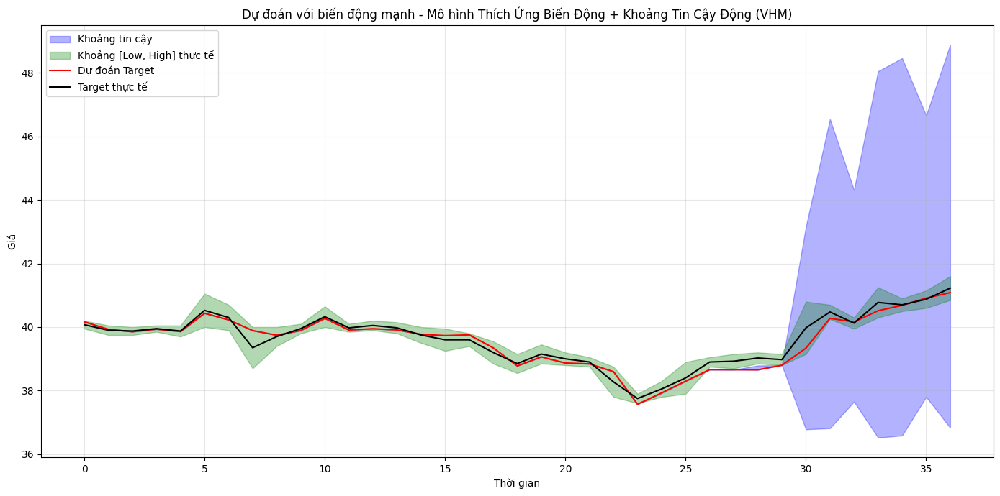


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
high_sma_2              high_sma_2  0.012000        0.281036        0.173421
target_sma_2          target_sma_2  0.012118        0.205613        0.128215
target_ema_2          target_ema_2  0.013726        0.124700        0.080310
low_ema_2                low_ema_2  0.012985        0.066844        0.045301
high_ema_2              high_ema_2  0.013381        0.051560        0.036288
hmm_prob_state_0  hmm_prob_state_0  0.002445        0.032952        0.020749
low_freq                  low_freq  0.009261        0.028245        0.020651
target_lag_1          target_lag_1  0.009245        0.026306        0.019482
target_aema_2        target_aema_2  0.009584        0.024180        0.018342
hmm_prob_state_1  hmm_prob_state_1  0.002221        0.024720        0.015720
high_aema_2            high_aema_2  0.009450        0.019230        0.015318
target_lag_2          target_lag_2  0.006

<Figure size 1200x800 with 0 Axes>

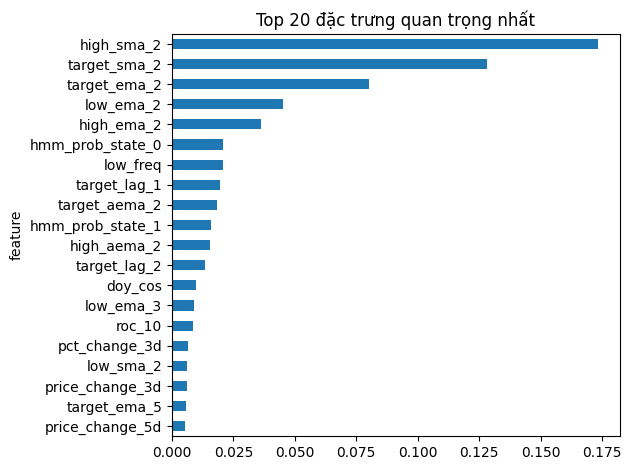

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 314 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 91 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 46 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 5 đặc trưng
  - Nhóm trend: 18 đặc trưng
  - Nhóm other: 59 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (81 điểm)...
H

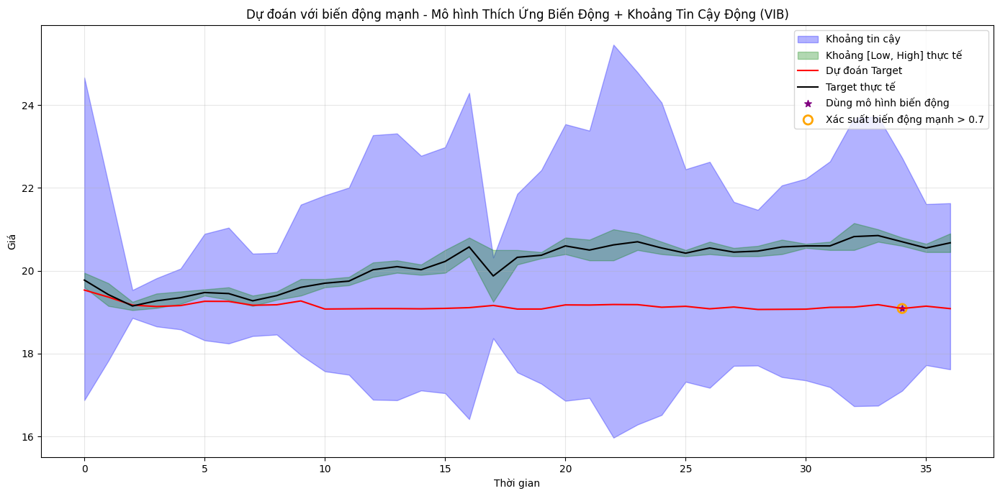


Top 20 đặc trưng quan trọng nhất:
                                             feature  mi_score  \
target_sma_2                            target_sma_2  0.013813   
high_ema_2                                high_ema_2  0.015259   
target_ema_2                            target_ema_2  0.016487   
hmm_prob_state_1                    hmm_prob_state_1  0.006487   
hmm_prob_state_0                    hmm_prob_state_0  0.005477   
hmm_prob_state_2                    hmm_prob_state_2  0.007549   
low_ema_2                                  low_ema_2  0.014731   
low_sma_2                                  low_sma_2  0.013395   
roc_30                                        roc_30  0.005136   
high_sma_2                                high_sma_2  0.013530   
price_change_5d                      price_change_5d  0.002345   
rsi_30                                        rsi_30  0.005575   
high_ema_3                                high_ema_3  0.012303   
volatility_predictor            volatilit

<Figure size 1200x800 with 0 Axes>

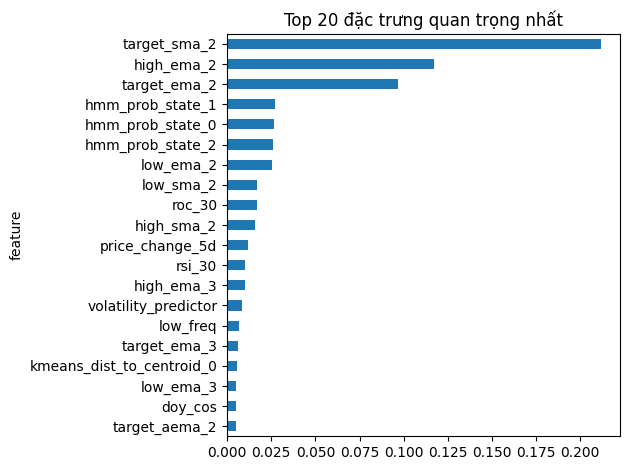

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 314 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 89 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 46 đặc trưng
  - Nhóm frequency: 7 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 4 đặc trưng
  - Nhóm trend: 16 đặc trưng
  - Nhóm other: 63 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (33 điểm)...
H

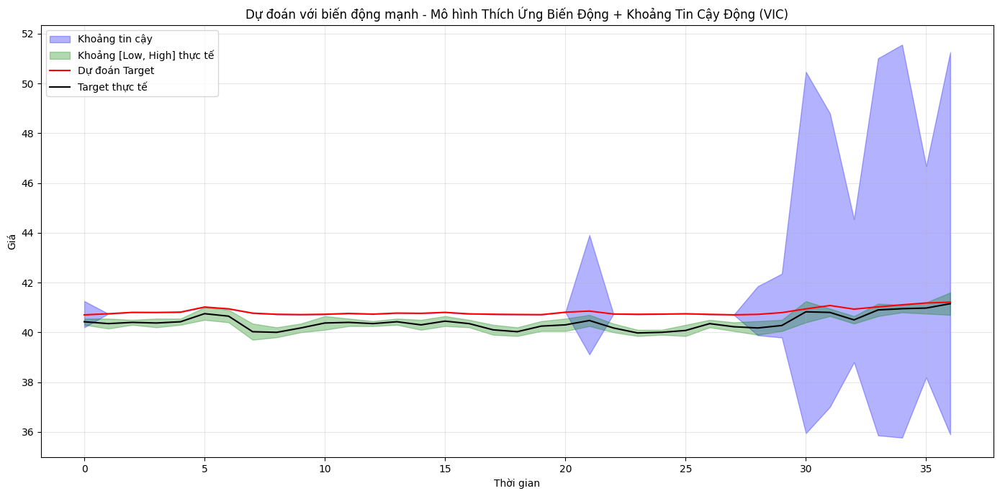


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
high_ema_3              high_ema_3  0.011963        0.568756        0.346039
high_sma_2              high_sma_2  0.012898        0.146382        0.092988
high_ema_2              high_ema_2  0.014702        0.061885        0.043012
target_ema_2          target_ema_2  0.015887        0.050553        0.036687
low_ema_2                low_ema_2  0.013981        0.049970        0.035574
hmm_prob_state_2  hmm_prob_state_2  0.004787        0.039508        0.025620
hmm_prob_state_1  hmm_prob_state_1  0.005108        0.016390        0.011877
low_freq                  low_freq  0.008510        0.014093        0.011860
target_sma_2          target_sma_2  0.013121        0.007752        0.009899
target_aema_2        target_aema_2  0.010035        0.003781        0.006283
doy_sin                    doy_sin  0.005219        0.006580        0.006036
low_sma_2                low_sma_2  0.012

<Figure size 1200x800 with 0 Axes>

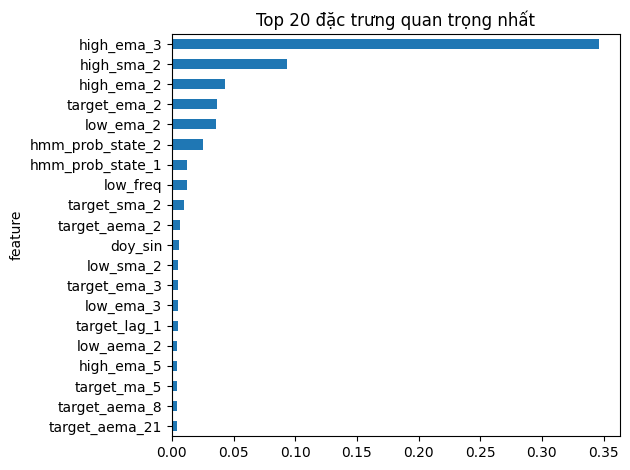

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 316 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 95 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 47 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 15 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 4 đặc trưng
  - Nhóm trend: 14 đặc trưng
  - Nhóm other: 62 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (131 điểm)...


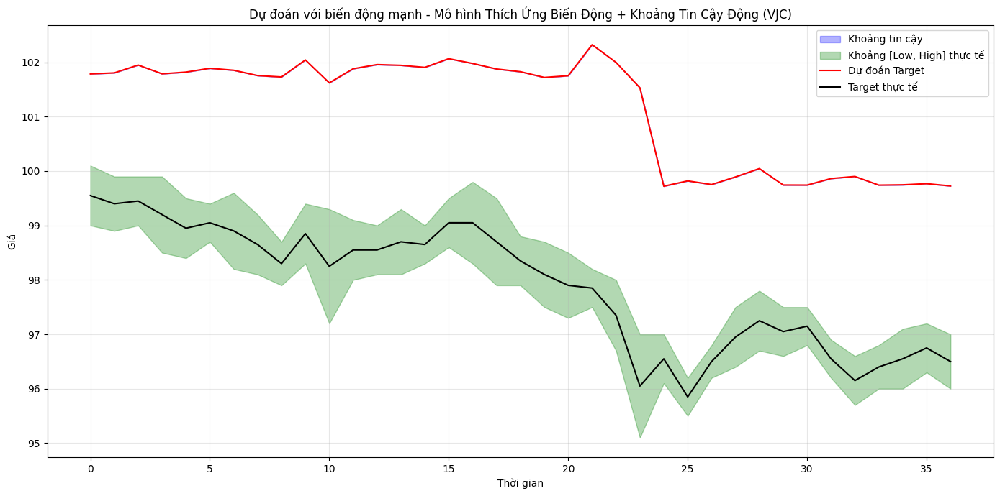


Top 20 đặc trưng quan trọng nhất:
                                             feature  mi_score  \
low_sma_2                                  low_sma_2  0.012835   
low_ema_2                                  low_ema_2  0.014634   
target_ema_2                            target_ema_2  0.015402   
target_sma_2                            target_sma_2  0.013423   
target_aema_2                          target_aema_2  0.010687   
hmm_prob_state_2                    hmm_prob_state_2  0.004818   
high_ema_2                                high_ema_2  0.013430   
target_lag_5                            target_lag_5  0.004041   
target_lag_1                            target_lag_1  0.008954   
low_freq                                    low_freq  0.009516   
doy_sin                                      doy_sin  0.006783   
high_aema_2                              high_aema_2  0.010419   
roc_10                                        roc_10  0.003302   
low_ema_3                                

<Figure size 1200x800 with 0 Axes>

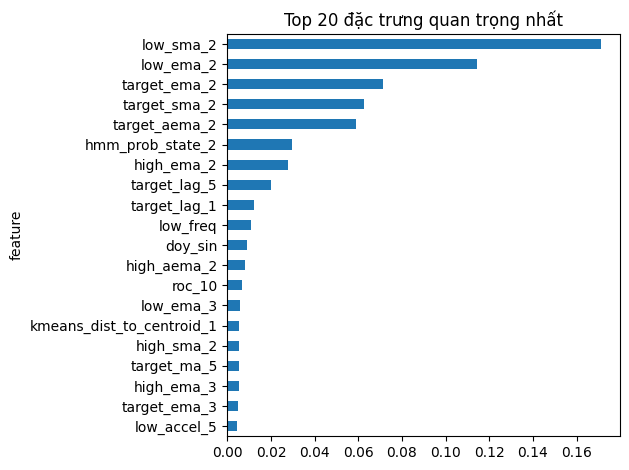

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 321 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 93 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 47 đặc trưng
  - Nhóm frequency: 4 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 5 đặc trưng
  - Nhóm trend: 22 đặc trưng
  - Nhóm other: 61 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (58 điểm)...
H

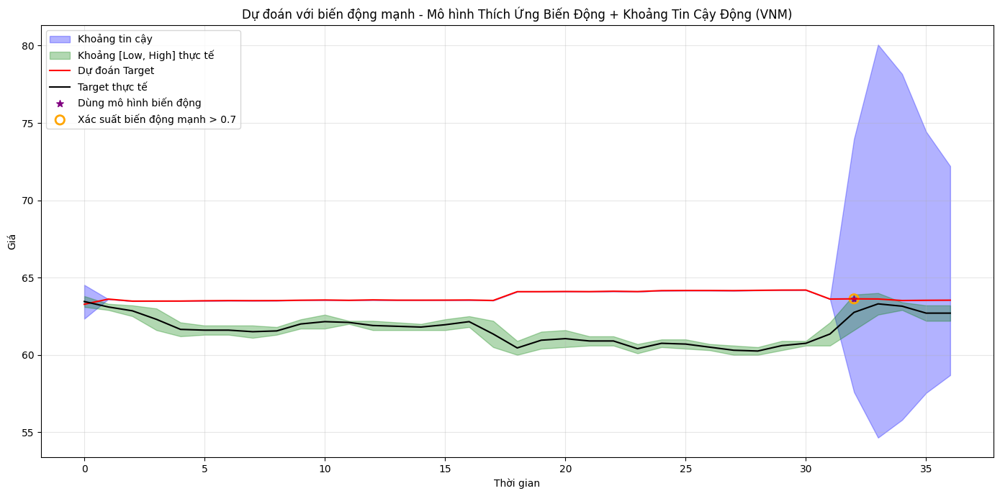


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
target_sma_2          target_sma_2  0.012115        0.223946        0.139214
target_aema_2        target_aema_2  0.008951        0.224494        0.138277
high_ema_2              high_ema_2  0.013557        0.203798        0.127701
high_sma_2              high_sma_2  0.011992        0.145667        0.092197
target_ema_2          target_ema_2  0.014250        0.093333        0.061700
target_lag_1          target_lag_1  0.008470        0.037313        0.025776
hmm_prob_state_2  hmm_prob_state_2  0.004698        0.017344        0.012285
low_sma_2                low_sma_2  0.010862        0.007006        0.008548
hmm_prob_state_1  hmm_prob_state_1  0.002858        0.010611        0.007509
low_freq                  low_freq  0.008735        0.005372        0.006717
low_ema_2                low_ema_2  0.012829        0.002505        0.006635
high_ema_3              high_ema_3  0.011

<Figure size 1200x800 with 0 Axes>

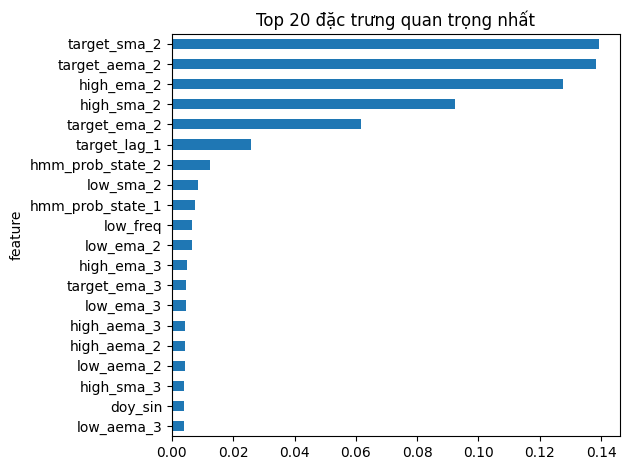

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 306 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 87 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 46 đặc trưng
  - Nhóm frequency: 7 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 4 đặc trưng
  - Nhóm trend: 14 đặc trưng
  - Nhóm other: 59 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (41 điểm)...
H

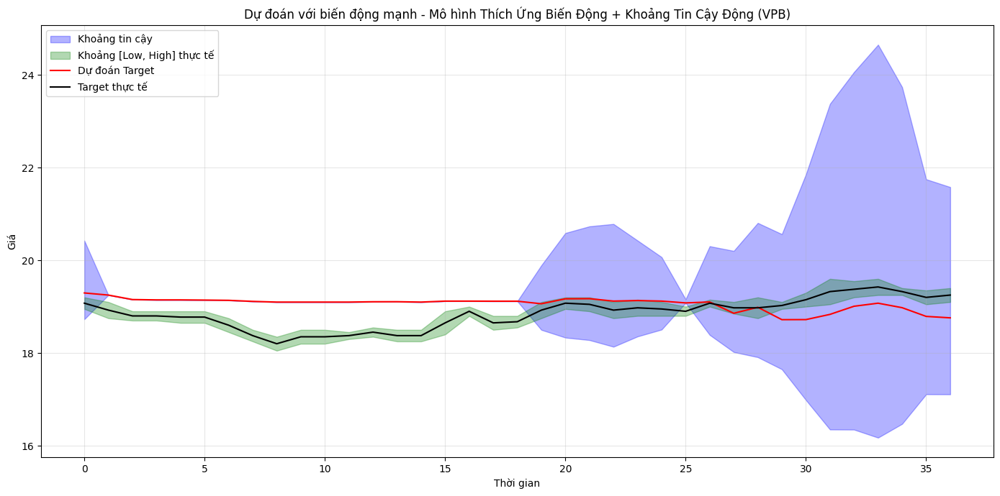


Top 20 đặc trưng quan trọng nhất:
                           feature  mi_score  xgb_importance  combined_score
low_ema_2                low_ema_2  0.014893        0.192343        0.121363
high_ema_2              high_ema_2  0.014928        0.181043        0.114597
target_ema_2          target_ema_2  0.016874        0.111722        0.073783
low_ema_3                low_ema_3  0.012343        0.091538        0.059860
hmm_prob_state_0  hmm_prob_state_0  0.002866        0.095095        0.058203
hmm_prob_state_1  hmm_prob_state_1  0.009905        0.073102        0.047824
hmm_prob_state_2  hmm_prob_state_2  0.011154        0.068357        0.045476
target_lag_1          target_lag_1  0.010020        0.063252        0.041959
doy_sin                    doy_sin  0.004884        0.026041        0.017578
high_sma_2              high_sma_2  0.013530        0.014700        0.014232
target_sma_2          target_sma_2  0.014354        0.013809        0.014027
target_aema_2        target_aema_2  0.009

<Figure size 1200x800 with 0 Axes>

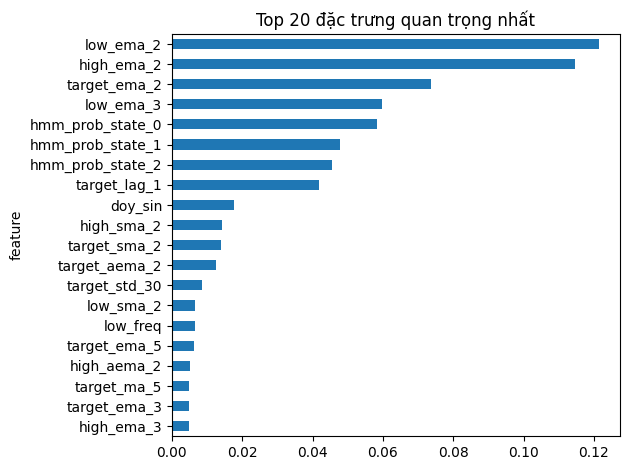

Chuẩn bị đặc trưng nâng cao với kỹ thuật thích ứng...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Tạo đặc trưng đa khung thời gian với smooth thích ứng...
Phát hiện điểm thay đổi cho target...
Trích xuất thành phần tần số cao...
Áp dụng mô hình HMM để phát hiện chế độ thị trường...
Phân cụm chế độ thị trường bằng K-means...
Chọn và xếp hạng đặc trưng...
Đã chọn 304 đặc trưng từ 353 đặc trưng ban đầu
  - Nhóm price_action: 81 đặc trưng
  - Nhóm technical: 71 đặc trưng
  - Nhóm volatility: 47 đặc trưng
  - Nhóm frequency: 6 đặc trưng
  - Nhóm regime: 16 đặc trưng
  - Nhóm change_point: 2 đặc trưng
  - Nhóm burst: 4 đặc trưng
  - Nhóm trend: 16 đặc trưng
  - Nhóm other: 61 đặc trưng
Huấn luyện các mô hình thích ứng...
Huấn luyện mô hình tổng quát...
Huấn luyện mô hình cho chế độ biến động mạnh (49 điểm)...
H

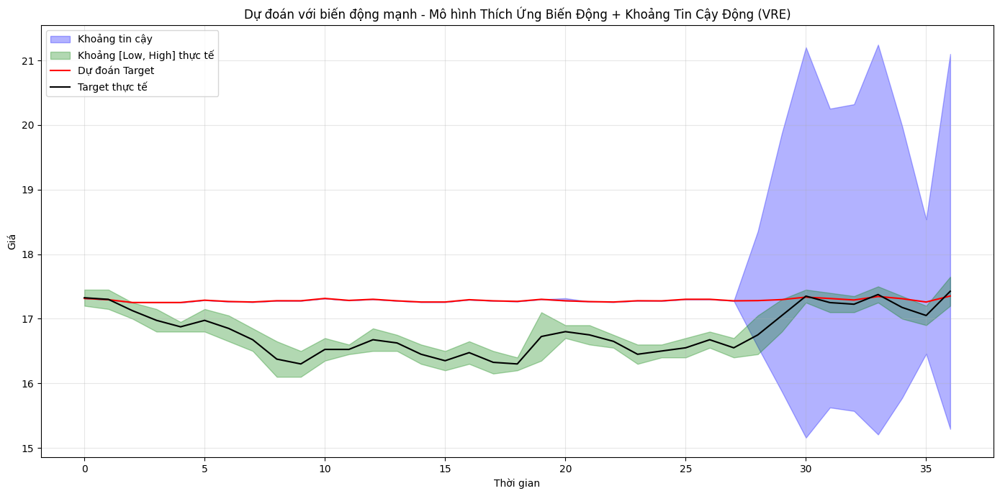


Top 20 đặc trưng quan trọng nhất:
                     feature  mi_score  xgb_importance  combined_score
target_ma_5      target_ma_5  0.008690        0.351363        0.214294
target_ema_3    target_ema_3  0.011555        0.137275        0.086987
target_sma_2    target_sma_2  0.012418        0.124442        0.079633
low_ema_2          low_ema_2  0.013377        0.100931        0.065909
target_aema_2  target_aema_2  0.009774        0.074253        0.048461
high_aema_2      high_aema_2  0.010073        0.043813        0.030317
target_ema_2    target_ema_2  0.013975        0.033108        0.025455
target_ema_5    target_ema_5  0.009841        0.030244        0.022082
high_sma_2        high_sma_2  0.011850        0.028106        0.021604
low_freq            low_freq  0.009716        0.018878        0.015213
target_lag_1    target_lag_1  0.009448        0.011741        0.010824
high_ema_2        high_ema_2  0.013398        0.006875        0.009484
doy_sin              doy_sin  0.006475    

<Figure size 1200x800 with 0 Axes>

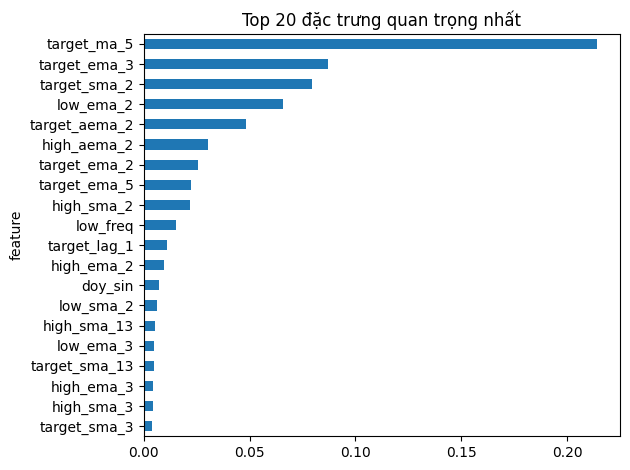

Success rate:  0.16666666666666666


In [27]:
per_r2 = 0

vn30 = ['ACB', 'BCM', 'BID', 'BVH', 'CTG', 'FPT', 'GAS', 'GVR', 'HDB', 'HPG', 'LPB', 'MBB', 'MSN', 'MWG', 'PLX', 'SAB', 'SHB', 'SSB', 'SSI', 'STB', 'TCB', 'TPB', 'VCB', 'VHM', 'VIB', 'VIC', 'VJC', 'VNM', 'VPB', 'VRE']

for symbol in vn30:
	df_train = pd.read_csv(f'../data/2024/vn30/{symbol}.csv')
	df_test = pd.read_csv(f'../data/2025/vn30/{symbol}.csv')

	df_train_processed, df_test_processed = preprocess(df_train, df_test)

	# Chạy XGBoost với đầy đủ cải tiến
	# Thử nghiệm trên dữ liệu của bạn
	results = run_enhanced_prediction(
		df_train=df_train_processed, 
		df_test=df_test_processed, 
		window_size=20,
		symbol=symbol
    )

	if results['metrics']['r2'] > 0.8:
		per_r2 += 1

print("Success rate: ", per_r2/len(vn30))